In [2]:
#coding:utf-8
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import Dataset
from torchvision.utils import save_image

import numpy as np
import os

import pandas as pd
from PIL import Image
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

In [3]:
# 超参数
gpu_id = None
if gpu_id is not None:
    os.environ['CUDA_VISIBLE_DEVICES'] = gpu_id
    device = torch.device('cuda')
else:
    device = torch.device('cpu')


if os.path.exists('cgan_images') is False:
    os.makedirs('cgan_images')

z_dim = 100 #paras.z_dim
batch_size = 100 #paras.batch_size
learning_rate = 0.0003 #paras.learning_rate
total_epochs = 100 #paras.total_epochs

In [4]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(794, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, x, c):
        x = x.view(x.size(0), 784)
        x = torch.cat([x, c], 1)
        out = self.model(x)
        return out.squeeze()


class Generator(nn.Module):
    def __init__(self, z_dim):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(10 + z_dim, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 784),
            nn.Tanh()
        )

    def forward(self, z, c):
        z = z.view(z.size(0), z_dim)
        x = torch.cat([z, c], 1)
        out = self.model(x)
        return out.view(x.size(0), 28, 28)


def one_hot(labels, class_num):
    batch_size = labels.size(0)
    one_hot_label = torch.zeros(batch_size, class_num).scatter_(1, labels.reshape(-1, 1), 1)
    return one_hot_label


# 初始化构建判别器和生成器
discriminator = Discriminator().to(device)
generator = Generator(z_dim=z_dim).to(device)

# 初始化二值交叉熵损失
bce = torch.nn.BCELoss().to(device)
ones = torch.ones(batch_size).to(device)
zeros = torch.zeros(batch_size).to(device)

# 初始化优化器，使用Adam优化器
g_optimizer = optim.Adam(generator.parameters(), lr=learning_rate, betas=[0.5, 0.999])
d_optimizer = optim.Adam(discriminator.parameters(), lr=learning_rate, betas=[0.5, 0.999])

C:\Users\19843\Anaconda3\lib\site-packages\torch\tensor.py:287: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


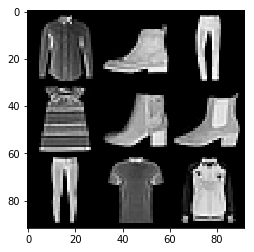

In [5]:
# 加载fashion数据集
class FashionMNIST(Dataset):
    def __init__(self, transform=None):
        self.transform = transform
        fashion_df = pd.read_csv('fashionmnist/fashion-mnist_train.csv')
        self.labels = fashion_df.label.values
        self.images = fashion_df.iloc[:, 1:].values.astype('uint8').reshape(-1, 28, 28)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        label = self.labels[idx]
        img = self.images[idx]
        img = Image.fromarray(self.images[idx])

        if self.transform:
            img = self.transform(img)

        return img[0].resize(1, 28, 28), label

transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.repeat(3,1,1)),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])
dataset = FashionMNIST(transform=transform)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)


def show_sample(n):
    # n为sample数量
    sample = []
    for i in range(n):
        idx = np.random.randint(0,10000)
        sample.append(dataset[idx][0])
    grid = make_grid(sample, nrow=3, normalize=True).permute(1, 2, 0).numpy()
    plt.imshow(grid)
    plt.show()

show_sample(9)


C:\Users\19843\Anaconda3\lib\site-packages\torch\tensor.py:287: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


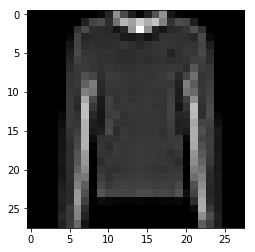

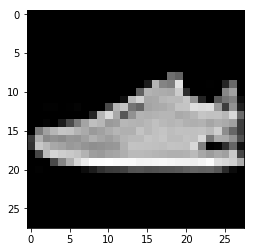

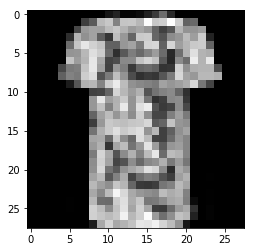

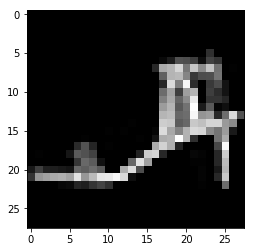

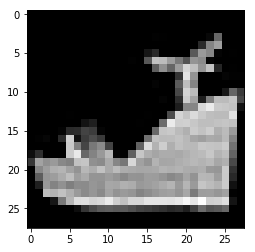

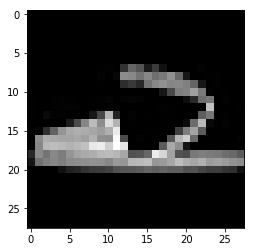

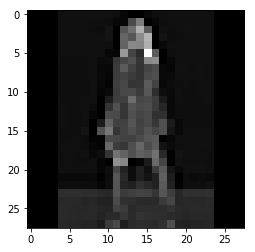

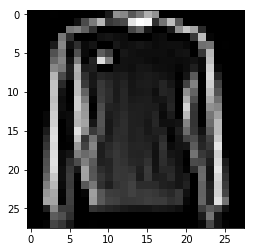

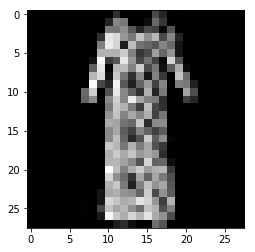

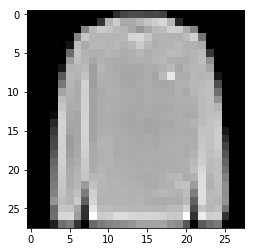

[Epoch 0/100] [Batch 0/600] [D loss: 1.340900] [G loss: 0.676923]
[Epoch 0/100] [Batch 1/600] [D loss: 1.180287] [G loss: 0.663749]
[Epoch 0/100] [Batch 2/600] [D loss: 1.051523] [G loss: 0.641657]
[Epoch 0/100] [Batch 3/600] [D loss: 0.954709] [G loss: 0.597602]
[Epoch 0/100] [Batch 4/600] [D loss: 0.963302] [G loss: 0.551757]
[Epoch 0/100] [Batch 5/600] [D loss: 1.066231] [G loss: 0.521374]
[Epoch 0/100] [Batch 6/600] [D loss: 1.128335] [G loss: 0.545314]
[Epoch 0/100] [Batch 7/600] [D loss: 1.145166] [G loss: 0.599645]
[Epoch 0/100] [Batch 8/600] [D loss: 1.126720] [G loss: 0.684790]
[Epoch 0/100] [Batch 9/600] [D loss: 1.114957] [G loss: 0.751736]
[Epoch 0/100] [Batch 10/600] [D loss: 1.139188] [G loss: 0.795913]
[Epoch 0/100] [Batch 11/600] [D loss: 1.215589] [G loss: 0.831888]
[Epoch 0/100] [Batch 12/600] [D loss: 1.285916] [G loss: 0.804948]
[Epoch 0/100] [Batch 13/600] [D loss: 1.301380] [G loss: 0.783020]
[Epoch 0/100] [Batch 14/600] [D loss: 1.245305] [G loss: 0.799598]
[Epoc

[Epoch 0/100] [Batch 242/600] [D loss: 0.847950] [G loss: 3.359542]
[Epoch 0/100] [Batch 243/600] [D loss: 0.788857] [G loss: 2.477659]
[Epoch 0/100] [Batch 244/600] [D loss: 0.555740] [G loss: 1.880577]
[Epoch 0/100] [Batch 245/600] [D loss: 0.570064] [G loss: 2.853299]
[Epoch 0/100] [Batch 246/600] [D loss: 0.544479] [G loss: 2.880790]
[Epoch 0/100] [Batch 247/600] [D loss: 0.491956] [G loss: 2.973230]
[Epoch 0/100] [Batch 248/600] [D loss: 0.640519] [G loss: 3.330979]
[Epoch 0/100] [Batch 249/600] [D loss: 0.558534] [G loss: 3.452750]
[Epoch 0/100] [Batch 250/600] [D loss: 0.628781] [G loss: 2.399611]
[Epoch 0/100] [Batch 251/600] [D loss: 0.819861] [G loss: 4.033879]
[Epoch 0/100] [Batch 252/600] [D loss: 0.576696] [G loss: 2.825737]
[Epoch 0/100] [Batch 253/600] [D loss: 0.559359] [G loss: 2.754787]
[Epoch 0/100] [Batch 254/600] [D loss: 0.543904] [G loss: 4.557424]
[Epoch 0/100] [Batch 255/600] [D loss: 0.595594] [G loss: 2.432817]
[Epoch 0/100] [Batch 256/600] [D loss: 0.690199]

[Epoch 0/100] [Batch 482/600] [D loss: 0.896290] [G loss: 1.710444]
[Epoch 0/100] [Batch 483/600] [D loss: 0.956585] [G loss: 3.810724]
[Epoch 0/100] [Batch 484/600] [D loss: 1.217045] [G loss: 1.609527]
[Epoch 0/100] [Batch 485/600] [D loss: 1.229987] [G loss: 2.017485]
[Epoch 0/100] [Batch 486/600] [D loss: 0.965672] [G loss: 2.382999]
[Epoch 0/100] [Batch 487/600] [D loss: 1.029917] [G loss: 1.998943]
[Epoch 0/100] [Batch 488/600] [D loss: 0.827468] [G loss: 2.419434]
[Epoch 0/100] [Batch 489/600] [D loss: 0.905130] [G loss: 2.182181]
[Epoch 0/100] [Batch 490/600] [D loss: 0.716144] [G loss: 1.921555]
[Epoch 0/100] [Batch 491/600] [D loss: 0.875635] [G loss: 2.253936]
[Epoch 0/100] [Batch 492/600] [D loss: 0.742903] [G loss: 2.616302]
[Epoch 0/100] [Batch 493/600] [D loss: 0.916568] [G loss: 1.889870]
[Epoch 0/100] [Batch 494/600] [D loss: 0.789007] [G loss: 2.662731]
[Epoch 0/100] [Batch 495/600] [D loss: 0.825872] [G loss: 2.086542]
[Epoch 0/100] [Batch 496/600] [D loss: 0.866442]

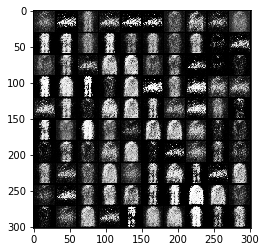

[Epoch 1/100] [Batch 0/600] [D loss: 1.299218] [G loss: 2.636189]
[Epoch 1/100] [Batch 1/600] [D loss: 0.949647] [G loss: 2.376280]
[Epoch 1/100] [Batch 2/600] [D loss: 0.890685] [G loss: 1.650376]
[Epoch 1/100] [Batch 3/600] [D loss: 0.688917] [G loss: 1.641058]
[Epoch 1/100] [Batch 4/600] [D loss: 0.783543] [G loss: 2.017544]
[Epoch 1/100] [Batch 5/600] [D loss: 0.630380] [G loss: 1.847032]
[Epoch 1/100] [Batch 6/600] [D loss: 0.757058] [G loss: 2.069858]
[Epoch 1/100] [Batch 7/600] [D loss: 0.799905] [G loss: 1.600671]
[Epoch 1/100] [Batch 8/600] [D loss: 0.761569] [G loss: 2.278543]
[Epoch 1/100] [Batch 9/600] [D loss: 0.870685] [G loss: 2.422256]
[Epoch 1/100] [Batch 10/600] [D loss: 0.813284] [G loss: 2.164076]
[Epoch 1/100] [Batch 11/600] [D loss: 0.660629] [G loss: 2.292164]
[Epoch 1/100] [Batch 12/600] [D loss: 0.764198] [G loss: 1.755340]
[Epoch 1/100] [Batch 13/600] [D loss: 0.832311] [G loss: 2.622042]
[Epoch 1/100] [Batch 14/600] [D loss: 0.561136] [G loss: 2.194267]
[Epoc

[Epoch 1/100] [Batch 242/600] [D loss: 1.021705] [G loss: 1.750278]
[Epoch 1/100] [Batch 243/600] [D loss: 0.960895] [G loss: 2.124132]
[Epoch 1/100] [Batch 244/600] [D loss: 0.944805] [G loss: 1.825761]
[Epoch 1/100] [Batch 245/600] [D loss: 1.006981] [G loss: 1.722510]
[Epoch 1/100] [Batch 246/600] [D loss: 0.803715] [G loss: 1.610979]
[Epoch 1/100] [Batch 247/600] [D loss: 0.908466] [G loss: 1.852124]
[Epoch 1/100] [Batch 248/600] [D loss: 0.959349] [G loss: 1.610430]
[Epoch 1/100] [Batch 249/600] [D loss: 0.911037] [G loss: 1.730444]
[Epoch 1/100] [Batch 250/600] [D loss: 0.981642] [G loss: 1.477428]
[Epoch 1/100] [Batch 251/600] [D loss: 0.777576] [G loss: 2.701391]
[Epoch 1/100] [Batch 252/600] [D loss: 1.023681] [G loss: 1.344334]
[Epoch 1/100] [Batch 253/600] [D loss: 0.864906] [G loss: 2.295441]
[Epoch 1/100] [Batch 254/600] [D loss: 0.756313] [G loss: 1.702315]
[Epoch 1/100] [Batch 255/600] [D loss: 0.836362] [G loss: 1.565676]
[Epoch 1/100] [Batch 256/600] [D loss: 0.737891]

[Epoch 1/100] [Batch 482/600] [D loss: 0.840324] [G loss: 1.869824]
[Epoch 1/100] [Batch 483/600] [D loss: 0.759368] [G loss: 2.063244]
[Epoch 1/100] [Batch 484/600] [D loss: 0.881613] [G loss: 1.594049]
[Epoch 1/100] [Batch 485/600] [D loss: 0.702219] [G loss: 3.269069]
[Epoch 1/100] [Batch 486/600] [D loss: 0.875290] [G loss: 1.509743]
[Epoch 1/100] [Batch 487/600] [D loss: 1.072547] [G loss: 3.011071]
[Epoch 1/100] [Batch 488/600] [D loss: 0.938947] [G loss: 2.534167]
[Epoch 1/100] [Batch 489/600] [D loss: 0.854901] [G loss: 1.935308]
[Epoch 1/100] [Batch 490/600] [D loss: 0.803141] [G loss: 1.903412]
[Epoch 1/100] [Batch 491/600] [D loss: 0.780814] [G loss: 2.134182]
[Epoch 1/100] [Batch 492/600] [D loss: 0.857046] [G loss: 1.854358]
[Epoch 1/100] [Batch 493/600] [D loss: 0.804327] [G loss: 2.169078]
[Epoch 1/100] [Batch 494/600] [D loss: 0.794093] [G loss: 2.056838]
[Epoch 1/100] [Batch 495/600] [D loss: 0.723368] [G loss: 2.203493]
[Epoch 1/100] [Batch 496/600] [D loss: 0.784687]

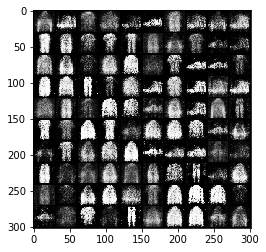

[Epoch 2/100] [Batch 0/600] [D loss: 0.874977] [G loss: 1.921519]
[Epoch 2/100] [Batch 1/600] [D loss: 0.853947] [G loss: 2.127729]
[Epoch 2/100] [Batch 2/600] [D loss: 0.741161] [G loss: 1.691642]
[Epoch 2/100] [Batch 3/600] [D loss: 0.940932] [G loss: 2.797812]
[Epoch 2/100] [Batch 4/600] [D loss: 1.093402] [G loss: 0.924416]
[Epoch 2/100] [Batch 5/600] [D loss: 1.041852] [G loss: 2.773503]
[Epoch 2/100] [Batch 6/600] [D loss: 0.885840] [G loss: 1.830876]
[Epoch 2/100] [Batch 7/600] [D loss: 0.674299] [G loss: 1.672499]
[Epoch 2/100] [Batch 8/600] [D loss: 0.905027] [G loss: 2.285104]
[Epoch 2/100] [Batch 9/600] [D loss: 0.838233] [G loss: 1.447292]
[Epoch 2/100] [Batch 10/600] [D loss: 0.975512] [G loss: 2.039885]
[Epoch 2/100] [Batch 11/600] [D loss: 0.743877] [G loss: 1.848786]
[Epoch 2/100] [Batch 12/600] [D loss: 0.756372] [G loss: 1.496761]
[Epoch 2/100] [Batch 13/600] [D loss: 0.812493] [G loss: 2.087878]
[Epoch 2/100] [Batch 14/600] [D loss: 0.889059] [G loss: 1.612240]
[Epoc

[Epoch 2/100] [Batch 242/600] [D loss: 0.808167] [G loss: 1.866219]
[Epoch 2/100] [Batch 243/600] [D loss: 0.930699] [G loss: 1.159782]
[Epoch 2/100] [Batch 244/600] [D loss: 0.905683] [G loss: 2.129122]
[Epoch 2/100] [Batch 245/600] [D loss: 0.834873] [G loss: 1.538552]
[Epoch 2/100] [Batch 246/600] [D loss: 0.822005] [G loss: 1.529284]
[Epoch 2/100] [Batch 247/600] [D loss: 0.871265] [G loss: 1.720655]
[Epoch 2/100] [Batch 248/600] [D loss: 1.004272] [G loss: 1.461616]
[Epoch 2/100] [Batch 249/600] [D loss: 1.015409] [G loss: 2.294716]
[Epoch 2/100] [Batch 250/600] [D loss: 0.993361] [G loss: 1.345739]
[Epoch 2/100] [Batch 251/600] [D loss: 1.046001] [G loss: 2.031708]
[Epoch 2/100] [Batch 252/600] [D loss: 0.786639] [G loss: 1.813426]
[Epoch 2/100] [Batch 253/600] [D loss: 0.886131] [G loss: 1.404183]
[Epoch 2/100] [Batch 254/600] [D loss: 0.907990] [G loss: 1.913583]
[Epoch 2/100] [Batch 255/600] [D loss: 0.891128] [G loss: 1.350842]
[Epoch 2/100] [Batch 256/600] [D loss: 0.891593]

[Epoch 2/100] [Batch 482/600] [D loss: 1.070509] [G loss: 1.043827]
[Epoch 2/100] [Batch 483/600] [D loss: 0.960647] [G loss: 1.853136]
[Epoch 2/100] [Batch 484/600] [D loss: 1.037393] [G loss: 1.295946]
[Epoch 2/100] [Batch 485/600] [D loss: 0.956449] [G loss: 1.299955]
[Epoch 2/100] [Batch 486/600] [D loss: 1.024071] [G loss: 1.475559]
[Epoch 2/100] [Batch 487/600] [D loss: 0.883898] [G loss: 1.577274]
[Epoch 2/100] [Batch 488/600] [D loss: 0.927051] [G loss: 1.483034]
[Epoch 2/100] [Batch 489/600] [D loss: 1.053799] [G loss: 1.518635]
[Epoch 2/100] [Batch 490/600] [D loss: 0.836002] [G loss: 1.843569]
[Epoch 2/100] [Batch 491/600] [D loss: 1.096853] [G loss: 0.883785]
[Epoch 2/100] [Batch 492/600] [D loss: 1.318938] [G loss: 2.247848]
[Epoch 2/100] [Batch 493/600] [D loss: 1.248568] [G loss: 1.023424]
[Epoch 2/100] [Batch 494/600] [D loss: 1.257522] [G loss: 1.140538]
[Epoch 2/100] [Batch 495/600] [D loss: 0.991985] [G loss: 1.659791]
[Epoch 2/100] [Batch 496/600] [D loss: 0.989675]

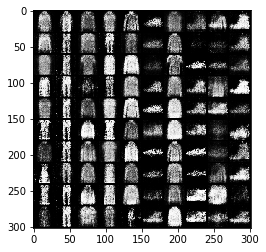

[Epoch 3/100] [Batch 0/600] [D loss: 1.056176] [G loss: 1.290010]
[Epoch 3/100] [Batch 1/600] [D loss: 1.066341] [G loss: 1.782909]
[Epoch 3/100] [Batch 2/600] [D loss: 1.064735] [G loss: 1.043180]
[Epoch 3/100] [Batch 3/600] [D loss: 1.036713] [G loss: 1.667426]
[Epoch 3/100] [Batch 4/600] [D loss: 1.368282] [G loss: 1.018501]
[Epoch 3/100] [Batch 5/600] [D loss: 1.053894] [G loss: 1.733613]
[Epoch 3/100] [Batch 6/600] [D loss: 1.004399] [G loss: 1.363032]
[Epoch 3/100] [Batch 7/600] [D loss: 0.938223] [G loss: 1.328173]
[Epoch 3/100] [Batch 8/600] [D loss: 0.951566] [G loss: 1.608591]
[Epoch 3/100] [Batch 9/600] [D loss: 0.990548] [G loss: 1.569347]
[Epoch 3/100] [Batch 10/600] [D loss: 1.075952] [G loss: 1.281239]
[Epoch 3/100] [Batch 11/600] [D loss: 0.954413] [G loss: 1.734152]
[Epoch 3/100] [Batch 12/600] [D loss: 1.215610] [G loss: 0.999112]
[Epoch 3/100] [Batch 13/600] [D loss: 1.111307] [G loss: 1.829883]
[Epoch 3/100] [Batch 14/600] [D loss: 1.246443] [G loss: 0.967946]
[Epoc

[Epoch 3/100] [Batch 242/600] [D loss: 0.913889] [G loss: 1.624773]
[Epoch 3/100] [Batch 243/600] [D loss: 1.002254] [G loss: 1.208978]
[Epoch 3/100] [Batch 244/600] [D loss: 1.032771] [G loss: 2.103517]
[Epoch 3/100] [Batch 245/600] [D loss: 1.353099] [G loss: 0.705370]
[Epoch 3/100] [Batch 246/600] [D loss: 1.310219] [G loss: 2.195491]
[Epoch 3/100] [Batch 247/600] [D loss: 1.397389] [G loss: 1.369065]
[Epoch 3/100] [Batch 248/600] [D loss: 1.202804] [G loss: 0.945944]
[Epoch 3/100] [Batch 249/600] [D loss: 1.112469] [G loss: 1.378387]
[Epoch 3/100] [Batch 250/600] [D loss: 0.961006] [G loss: 1.272079]
[Epoch 3/100] [Batch 251/600] [D loss: 1.024458] [G loss: 1.002940]
[Epoch 3/100] [Batch 252/600] [D loss: 1.100183] [G loss: 1.399236]
[Epoch 3/100] [Batch 253/600] [D loss: 0.973495] [G loss: 1.392596]
[Epoch 3/100] [Batch 254/600] [D loss: 0.976533] [G loss: 1.008604]
[Epoch 3/100] [Batch 255/600] [D loss: 0.987476] [G loss: 1.490475]
[Epoch 3/100] [Batch 256/600] [D loss: 0.978240]

[Epoch 3/100] [Batch 482/600] [D loss: 1.147966] [G loss: 1.085186]
[Epoch 3/100] [Batch 483/600] [D loss: 1.007846] [G loss: 1.615058]
[Epoch 3/100] [Batch 484/600] [D loss: 1.070093] [G loss: 1.381821]
[Epoch 3/100] [Batch 485/600] [D loss: 1.061285] [G loss: 1.345124]
[Epoch 3/100] [Batch 486/600] [D loss: 1.197914] [G loss: 1.593701]
[Epoch 3/100] [Batch 487/600] [D loss: 1.175299] [G loss: 0.999808]
[Epoch 3/100] [Batch 488/600] [D loss: 1.114387] [G loss: 1.679918]
[Epoch 3/100] [Batch 489/600] [D loss: 1.189115] [G loss: 1.186650]
[Epoch 3/100] [Batch 490/600] [D loss: 1.123427] [G loss: 1.334850]
[Epoch 3/100] [Batch 491/600] [D loss: 1.200321] [G loss: 1.312895]
[Epoch 3/100] [Batch 492/600] [D loss: 1.032019] [G loss: 1.250234]
[Epoch 3/100] [Batch 493/600] [D loss: 1.072170] [G loss: 1.517799]
[Epoch 3/100] [Batch 494/600] [D loss: 1.142537] [G loss: 1.152916]
[Epoch 3/100] [Batch 495/600] [D loss: 1.217710] [G loss: 1.503590]
[Epoch 3/100] [Batch 496/600] [D loss: 1.186597]

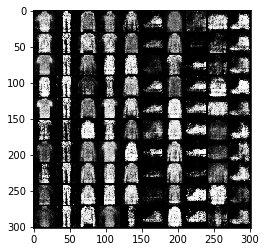

[Epoch 4/100] [Batch 0/600] [D loss: 0.953790] [G loss: 1.479669]
[Epoch 4/100] [Batch 1/600] [D loss: 0.941104] [G loss: 1.102135]
[Epoch 4/100] [Batch 2/600] [D loss: 1.118767] [G loss: 1.498411]
[Epoch 4/100] [Batch 3/600] [D loss: 1.011425] [G loss: 1.280723]
[Epoch 4/100] [Batch 4/600] [D loss: 0.984999] [G loss: 1.546919]
[Epoch 4/100] [Batch 5/600] [D loss: 1.153369] [G loss: 0.963653]
[Epoch 4/100] [Batch 6/600] [D loss: 1.046240] [G loss: 1.591793]
[Epoch 4/100] [Batch 7/600] [D loss: 1.059340] [G loss: 0.910011]
[Epoch 4/100] [Batch 8/600] [D loss: 1.156424] [G loss: 1.831682]
[Epoch 4/100] [Batch 9/600] [D loss: 1.127976] [G loss: 1.025657]
[Epoch 4/100] [Batch 10/600] [D loss: 1.054278] [G loss: 1.249632]
[Epoch 4/100] [Batch 11/600] [D loss: 1.034878] [G loss: 1.377593]
[Epoch 4/100] [Batch 12/600] [D loss: 1.030275] [G loss: 1.232312]
[Epoch 4/100] [Batch 13/600] [D loss: 1.106370] [G loss: 1.729044]
[Epoch 4/100] [Batch 14/600] [D loss: 1.120141] [G loss: 0.968505]
[Epoc

[Epoch 4/100] [Batch 242/600] [D loss: 1.008126] [G loss: 1.309246]
[Epoch 4/100] [Batch 243/600] [D loss: 0.961580] [G loss: 1.330333]
[Epoch 4/100] [Batch 244/600] [D loss: 1.105766] [G loss: 1.305354]
[Epoch 4/100] [Batch 245/600] [D loss: 1.072456] [G loss: 1.401014]
[Epoch 4/100] [Batch 246/600] [D loss: 1.126090] [G loss: 1.573822]
[Epoch 4/100] [Batch 247/600] [D loss: 1.138738] [G loss: 0.841884]
[Epoch 4/100] [Batch 248/600] [D loss: 1.254018] [G loss: 1.839506]
[Epoch 4/100] [Batch 249/600] [D loss: 1.174357] [G loss: 1.105595]
[Epoch 4/100] [Batch 250/600] [D loss: 1.053357] [G loss: 1.053823]
[Epoch 4/100] [Batch 251/600] [D loss: 1.156901] [G loss: 1.525348]
[Epoch 4/100] [Batch 252/600] [D loss: 1.081240] [G loss: 1.148498]
[Epoch 4/100] [Batch 253/600] [D loss: 1.050177] [G loss: 1.223422]
[Epoch 4/100] [Batch 254/600] [D loss: 0.980421] [G loss: 1.490815]
[Epoch 4/100] [Batch 255/600] [D loss: 0.907441] [G loss: 1.044904]
[Epoch 4/100] [Batch 256/600] [D loss: 1.052513]

[Epoch 4/100] [Batch 482/600] [D loss: 1.182424] [G loss: 1.084695]
[Epoch 4/100] [Batch 483/600] [D loss: 1.055548] [G loss: 1.337306]
[Epoch 4/100] [Batch 484/600] [D loss: 1.028081] [G loss: 1.156774]
[Epoch 4/100] [Batch 485/600] [D loss: 1.104333] [G loss: 1.123552]
[Epoch 4/100] [Batch 486/600] [D loss: 1.044804] [G loss: 1.141847]
[Epoch 4/100] [Batch 487/600] [D loss: 1.152460] [G loss: 1.077678]
[Epoch 4/100] [Batch 488/600] [D loss: 1.163420] [G loss: 1.378980]
[Epoch 4/100] [Batch 489/600] [D loss: 1.053239] [G loss: 1.226147]
[Epoch 4/100] [Batch 490/600] [D loss: 1.161088] [G loss: 1.267272]
[Epoch 4/100] [Batch 491/600] [D loss: 1.050380] [G loss: 1.250349]
[Epoch 4/100] [Batch 492/600] [D loss: 1.099593] [G loss: 1.298298]
[Epoch 4/100] [Batch 493/600] [D loss: 1.060237] [G loss: 1.141713]
[Epoch 4/100] [Batch 494/600] [D loss: 1.255782] [G loss: 1.343383]
[Epoch 4/100] [Batch 495/600] [D loss: 1.199958] [G loss: 0.872383]
[Epoch 4/100] [Batch 496/600] [D loss: 1.251889]

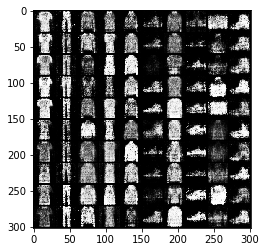

[Epoch 5/100] [Batch 0/600] [D loss: 1.139920] [G loss: 1.444852]
[Epoch 5/100] [Batch 1/600] [D loss: 1.080378] [G loss: 0.993693]
[Epoch 5/100] [Batch 2/600] [D loss: 1.066478] [G loss: 1.161237]
[Epoch 5/100] [Batch 3/600] [D loss: 1.089612] [G loss: 1.173453]
[Epoch 5/100] [Batch 4/600] [D loss: 1.090469] [G loss: 1.261045]
[Epoch 5/100] [Batch 5/600] [D loss: 1.100941] [G loss: 1.112819]
[Epoch 5/100] [Batch 6/600] [D loss: 1.111014] [G loss: 1.251669]
[Epoch 5/100] [Batch 7/600] [D loss: 1.081719] [G loss: 1.413261]
[Epoch 5/100] [Batch 8/600] [D loss: 1.111874] [G loss: 1.247302]
[Epoch 5/100] [Batch 9/600] [D loss: 1.094840] [G loss: 1.197793]
[Epoch 5/100] [Batch 10/600] [D loss: 1.101873] [G loss: 1.030071]
[Epoch 5/100] [Batch 11/600] [D loss: 1.252084] [G loss: 1.406638]
[Epoch 5/100] [Batch 12/600] [D loss: 1.176919] [G loss: 1.106605]
[Epoch 5/100] [Batch 13/600] [D loss: 1.190666] [G loss: 0.829115]
[Epoch 5/100] [Batch 14/600] [D loss: 1.228378] [G loss: 1.486126]
[Epoc

[Epoch 5/100] [Batch 242/600] [D loss: 1.168244] [G loss: 1.251233]
[Epoch 5/100] [Batch 243/600] [D loss: 1.069563] [G loss: 1.214597]
[Epoch 5/100] [Batch 244/600] [D loss: 1.092199] [G loss: 1.285484]
[Epoch 5/100] [Batch 245/600] [D loss: 1.143077] [G loss: 1.163379]
[Epoch 5/100] [Batch 246/600] [D loss: 1.210786] [G loss: 1.170540]
[Epoch 5/100] [Batch 247/600] [D loss: 1.094481] [G loss: 1.106695]
[Epoch 5/100] [Batch 248/600] [D loss: 1.219223] [G loss: 1.371481]
[Epoch 5/100] [Batch 249/600] [D loss: 1.177902] [G loss: 1.152558]
[Epoch 5/100] [Batch 250/600] [D loss: 1.108938] [G loss: 1.236829]
[Epoch 5/100] [Batch 251/600] [D loss: 1.105247] [G loss: 1.097545]
[Epoch 5/100] [Batch 252/600] [D loss: 1.102784] [G loss: 1.402787]
[Epoch 5/100] [Batch 253/600] [D loss: 1.129607] [G loss: 1.141475]
[Epoch 5/100] [Batch 254/600] [D loss: 1.173013] [G loss: 0.986034]
[Epoch 5/100] [Batch 255/600] [D loss: 1.108409] [G loss: 1.438805]
[Epoch 5/100] [Batch 256/600] [D loss: 1.099829]

[Epoch 5/100] [Batch 482/600] [D loss: 1.154489] [G loss: 0.732911]
[Epoch 5/100] [Batch 483/600] [D loss: 1.207901] [G loss: 1.852413]
[Epoch 5/100] [Batch 484/600] [D loss: 1.532697] [G loss: 0.936792]
[Epoch 5/100] [Batch 485/600] [D loss: 1.224560] [G loss: 1.020453]
[Epoch 5/100] [Batch 486/600] [D loss: 1.103825] [G loss: 1.259217]
[Epoch 5/100] [Batch 487/600] [D loss: 1.121311] [G loss: 1.101406]
[Epoch 5/100] [Batch 488/600] [D loss: 1.158226] [G loss: 1.036994]
[Epoch 5/100] [Batch 489/600] [D loss: 1.170227] [G loss: 1.124451]
[Epoch 5/100] [Batch 490/600] [D loss: 1.179123] [G loss: 1.141855]
[Epoch 5/100] [Batch 491/600] [D loss: 1.122810] [G loss: 1.185395]
[Epoch 5/100] [Batch 492/600] [D loss: 1.116152] [G loss: 1.142326]
[Epoch 5/100] [Batch 493/600] [D loss: 1.183624] [G loss: 1.017130]
[Epoch 5/100] [Batch 494/600] [D loss: 1.194487] [G loss: 1.089586]
[Epoch 5/100] [Batch 495/600] [D loss: 1.167905] [G loss: 1.123661]
[Epoch 5/100] [Batch 496/600] [D loss: 1.235266]

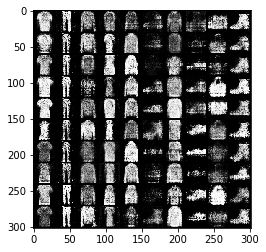

[Epoch 6/100] [Batch 0/600] [D loss: 1.324660] [G loss: 1.230608]
[Epoch 6/100] [Batch 1/600] [D loss: 1.185252] [G loss: 0.852912]
[Epoch 6/100] [Batch 2/600] [D loss: 1.235402] [G loss: 1.302753]
[Epoch 6/100] [Batch 3/600] [D loss: 1.278239] [G loss: 0.872506]
[Epoch 6/100] [Batch 4/600] [D loss: 1.240596] [G loss: 1.107196]
[Epoch 6/100] [Batch 5/600] [D loss: 1.175354] [G loss: 1.050779]
[Epoch 6/100] [Batch 6/600] [D loss: 1.185569] [G loss: 1.019490]
[Epoch 6/100] [Batch 7/600] [D loss: 1.163392] [G loss: 1.316187]
[Epoch 6/100] [Batch 8/600] [D loss: 1.159583] [G loss: 0.976810]
[Epoch 6/100] [Batch 9/600] [D loss: 1.229623] [G loss: 1.002130]
[Epoch 6/100] [Batch 10/600] [D loss: 1.098904] [G loss: 1.244987]
[Epoch 6/100] [Batch 11/600] [D loss: 1.079984] [G loss: 1.178949]
[Epoch 6/100] [Batch 12/600] [D loss: 1.030883] [G loss: 0.858608]
[Epoch 6/100] [Batch 13/600] [D loss: 1.128808] [G loss: 1.260100]
[Epoch 6/100] [Batch 14/600] [D loss: 1.047289] [G loss: 1.118783]
[Epoc

[Epoch 6/100] [Batch 242/600] [D loss: 1.205789] [G loss: 1.190838]
[Epoch 6/100] [Batch 243/600] [D loss: 1.365873] [G loss: 0.972499]
[Epoch 6/100] [Batch 244/600] [D loss: 1.220053] [G loss: 0.962048]
[Epoch 6/100] [Batch 245/600] [D loss: 1.141972] [G loss: 0.995955]
[Epoch 6/100] [Batch 246/600] [D loss: 1.126322] [G loss: 1.082132]
[Epoch 6/100] [Batch 247/600] [D loss: 1.187494] [G loss: 1.073884]
[Epoch 6/100] [Batch 248/600] [D loss: 1.299081] [G loss: 1.016105]
[Epoch 6/100] [Batch 249/600] [D loss: 1.199507] [G loss: 1.137540]
[Epoch 6/100] [Batch 250/600] [D loss: 1.145319] [G loss: 1.135353]
[Epoch 6/100] [Batch 251/600] [D loss: 1.156132] [G loss: 0.970049]
[Epoch 6/100] [Batch 252/600] [D loss: 1.171104] [G loss: 1.249481]
[Epoch 6/100] [Batch 253/600] [D loss: 1.171416] [G loss: 1.102078]
[Epoch 6/100] [Batch 254/600] [D loss: 1.073195] [G loss: 0.932705]
[Epoch 6/100] [Batch 255/600] [D loss: 1.134581] [G loss: 1.225715]
[Epoch 6/100] [Batch 256/600] [D loss: 1.201988]

[Epoch 6/100] [Batch 482/600] [D loss: 1.298484] [G loss: 0.975785]
[Epoch 6/100] [Batch 483/600] [D loss: 1.263024] [G loss: 1.140681]
[Epoch 6/100] [Batch 484/600] [D loss: 1.086890] [G loss: 0.921928]
[Epoch 6/100] [Batch 485/600] [D loss: 1.135137] [G loss: 1.077172]
[Epoch 6/100] [Batch 486/600] [D loss: 1.212187] [G loss: 0.951400]
[Epoch 6/100] [Batch 487/600] [D loss: 1.224223] [G loss: 1.208094]
[Epoch 6/100] [Batch 488/600] [D loss: 1.253953] [G loss: 1.059220]
[Epoch 6/100] [Batch 489/600] [D loss: 1.177354] [G loss: 0.900211]
[Epoch 6/100] [Batch 490/600] [D loss: 1.231401] [G loss: 0.971806]
[Epoch 6/100] [Batch 491/600] [D loss: 1.230492] [G loss: 1.083555]
[Epoch 6/100] [Batch 492/600] [D loss: 1.280758] [G loss: 0.970352]
[Epoch 6/100] [Batch 493/600] [D loss: 1.297550] [G loss: 1.203525]
[Epoch 6/100] [Batch 494/600] [D loss: 1.226637] [G loss: 1.096325]
[Epoch 6/100] [Batch 495/600] [D loss: 1.115247] [G loss: 0.903262]
[Epoch 6/100] [Batch 496/600] [D loss: 1.273037]

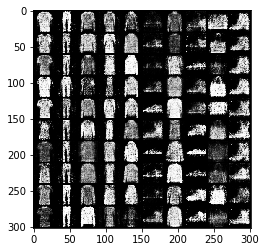

[Epoch 7/100] [Batch 0/600] [D loss: 1.113497] [G loss: 1.032167]
[Epoch 7/100] [Batch 1/600] [D loss: 1.134339] [G loss: 1.166848]
[Epoch 7/100] [Batch 2/600] [D loss: 1.263736] [G loss: 1.070222]
[Epoch 7/100] [Batch 3/600] [D loss: 1.156079] [G loss: 1.042380]
[Epoch 7/100] [Batch 4/600] [D loss: 1.231286] [G loss: 1.080915]
[Epoch 7/100] [Batch 5/600] [D loss: 1.294555] [G loss: 1.118627]
[Epoch 7/100] [Batch 6/600] [D loss: 1.304940] [G loss: 1.076199]
[Epoch 7/100] [Batch 7/600] [D loss: 1.353199] [G loss: 1.009542]
[Epoch 7/100] [Batch 8/600] [D loss: 1.205664] [G loss: 0.982666]
[Epoch 7/100] [Batch 9/600] [D loss: 1.171425] [G loss: 1.070396]
[Epoch 7/100] [Batch 10/600] [D loss: 1.250097] [G loss: 1.018680]
[Epoch 7/100] [Batch 11/600] [D loss: 1.195624] [G loss: 1.270595]
[Epoch 7/100] [Batch 12/600] [D loss: 1.239132] [G loss: 0.892449]
[Epoch 7/100] [Batch 13/600] [D loss: 1.228824] [G loss: 1.039707]
[Epoch 7/100] [Batch 14/600] [D loss: 1.212212] [G loss: 1.185052]
[Epoc

[Epoch 7/100] [Batch 242/600] [D loss: 1.291681] [G loss: 1.206799]
[Epoch 7/100] [Batch 243/600] [D loss: 1.213364] [G loss: 1.121920]
[Epoch 7/100] [Batch 244/600] [D loss: 1.228237] [G loss: 0.981135]
[Epoch 7/100] [Batch 245/600] [D loss: 1.280792] [G loss: 1.044259]
[Epoch 7/100] [Batch 246/600] [D loss: 1.332082] [G loss: 1.096544]
[Epoch 7/100] [Batch 247/600] [D loss: 1.245675] [G loss: 0.911588]
[Epoch 7/100] [Batch 248/600] [D loss: 1.255878] [G loss: 1.079165]
[Epoch 7/100] [Batch 249/600] [D loss: 1.201589] [G loss: 1.033272]
[Epoch 7/100] [Batch 250/600] [D loss: 1.134712] [G loss: 0.958735]
[Epoch 7/100] [Batch 251/600] [D loss: 1.259310] [G loss: 1.058486]
[Epoch 7/100] [Batch 252/600] [D loss: 1.208038] [G loss: 0.999652]
[Epoch 7/100] [Batch 253/600] [D loss: 1.176048] [G loss: 1.062469]
[Epoch 7/100] [Batch 254/600] [D loss: 1.210037] [G loss: 0.891335]
[Epoch 7/100] [Batch 255/600] [D loss: 1.157613] [G loss: 1.270188]
[Epoch 7/100] [Batch 256/600] [D loss: 1.204915]

[Epoch 7/100] [Batch 482/600] [D loss: 1.261742] [G loss: 0.967453]
[Epoch 7/100] [Batch 483/600] [D loss: 1.197163] [G loss: 0.927801]
[Epoch 7/100] [Batch 484/600] [D loss: 1.231461] [G loss: 0.987195]
[Epoch 7/100] [Batch 485/600] [D loss: 1.191176] [G loss: 0.994399]
[Epoch 7/100] [Batch 486/600] [D loss: 1.230415] [G loss: 1.015072]
[Epoch 7/100] [Batch 487/600] [D loss: 1.208702] [G loss: 0.998157]
[Epoch 7/100] [Batch 488/600] [D loss: 1.121312] [G loss: 0.927650]
[Epoch 7/100] [Batch 489/600] [D loss: 1.242490] [G loss: 0.955667]
[Epoch 7/100] [Batch 490/600] [D loss: 1.082871] [G loss: 1.059936]
[Epoch 7/100] [Batch 491/600] [D loss: 1.200533] [G loss: 1.070580]
[Epoch 7/100] [Batch 492/600] [D loss: 1.256115] [G loss: 0.887273]
[Epoch 7/100] [Batch 493/600] [D loss: 1.245635] [G loss: 1.177099]
[Epoch 7/100] [Batch 494/600] [D loss: 1.224289] [G loss: 1.034756]
[Epoch 7/100] [Batch 495/600] [D loss: 1.230695] [G loss: 0.830374]
[Epoch 7/100] [Batch 496/600] [D loss: 1.239622]

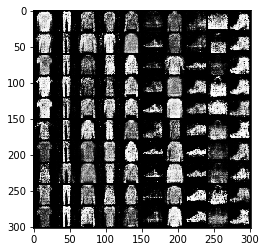

[Epoch 8/100] [Batch 0/600] [D loss: 1.333447] [G loss: 1.005537]
[Epoch 8/100] [Batch 1/600] [D loss: 1.202809] [G loss: 0.943613]
[Epoch 8/100] [Batch 2/600] [D loss: 1.282400] [G loss: 0.903772]
[Epoch 8/100] [Batch 3/600] [D loss: 1.180715] [G loss: 1.008199]
[Epoch 8/100] [Batch 4/600] [D loss: 1.238270] [G loss: 1.137732]
[Epoch 8/100] [Batch 5/600] [D loss: 1.259953] [G loss: 0.987956]
[Epoch 8/100] [Batch 6/600] [D loss: 1.289274] [G loss: 0.953275]
[Epoch 8/100] [Batch 7/600] [D loss: 1.214278] [G loss: 1.111710]
[Epoch 8/100] [Batch 8/600] [D loss: 1.289165] [G loss: 1.003698]
[Epoch 8/100] [Batch 9/600] [D loss: 1.173918] [G loss: 1.016951]
[Epoch 8/100] [Batch 10/600] [D loss: 1.172922] [G loss: 0.841982]
[Epoch 8/100] [Batch 11/600] [D loss: 1.182340] [G loss: 1.057303]
[Epoch 8/100] [Batch 12/600] [D loss: 1.127670] [G loss: 1.118423]
[Epoch 8/100] [Batch 13/600] [D loss: 1.164646] [G loss: 0.810279]
[Epoch 8/100] [Batch 14/600] [D loss: 1.354153] [G loss: 1.053600]
[Epoc

[Epoch 8/100] [Batch 242/600] [D loss: 1.271860] [G loss: 1.080470]
[Epoch 8/100] [Batch 243/600] [D loss: 1.172073] [G loss: 0.911862]
[Epoch 8/100] [Batch 244/600] [D loss: 1.198750] [G loss: 0.972819]
[Epoch 8/100] [Batch 245/600] [D loss: 1.232726] [G loss: 1.100169]
[Epoch 8/100] [Batch 246/600] [D loss: 1.163759] [G loss: 1.052998]
[Epoch 8/100] [Batch 247/600] [D loss: 1.142789] [G loss: 1.004010]
[Epoch 8/100] [Batch 248/600] [D loss: 1.141596] [G loss: 0.918157]
[Epoch 8/100] [Batch 249/600] [D loss: 1.202477] [G loss: 1.066991]
[Epoch 8/100] [Batch 250/600] [D loss: 1.165420] [G loss: 1.126969]
[Epoch 8/100] [Batch 251/600] [D loss: 1.246453] [G loss: 0.797000]
[Epoch 8/100] [Batch 252/600] [D loss: 1.219688] [G loss: 1.225425]
[Epoch 8/100] [Batch 253/600] [D loss: 1.214417] [G loss: 0.975204]
[Epoch 8/100] [Batch 254/600] [D loss: 1.231398] [G loss: 1.090755]
[Epoch 8/100] [Batch 255/600] [D loss: 1.236366] [G loss: 0.881491]
[Epoch 8/100] [Batch 256/600] [D loss: 1.374069]

[Epoch 8/100] [Batch 482/600] [D loss: 1.285084] [G loss: 0.850405]
[Epoch 8/100] [Batch 483/600] [D loss: 1.291320] [G loss: 0.997919]
[Epoch 8/100] [Batch 484/600] [D loss: 1.193252] [G loss: 1.060429]
[Epoch 8/100] [Batch 485/600] [D loss: 1.160882] [G loss: 0.823299]
[Epoch 8/100] [Batch 486/600] [D loss: 1.294882] [G loss: 1.079982]
[Epoch 8/100] [Batch 487/600] [D loss: 1.180574] [G loss: 0.956577]
[Epoch 8/100] [Batch 488/600] [D loss: 1.246055] [G loss: 1.111792]
[Epoch 8/100] [Batch 489/600] [D loss: 1.312597] [G loss: 0.980706]
[Epoch 8/100] [Batch 490/600] [D loss: 1.237608] [G loss: 0.911361]
[Epoch 8/100] [Batch 491/600] [D loss: 1.206739] [G loss: 0.849643]
[Epoch 8/100] [Batch 492/600] [D loss: 1.217693] [G loss: 1.058306]
[Epoch 8/100] [Batch 493/600] [D loss: 1.176461] [G loss: 0.943280]
[Epoch 8/100] [Batch 494/600] [D loss: 1.151154] [G loss: 1.050047]
[Epoch 8/100] [Batch 495/600] [D loss: 1.199404] [G loss: 0.966987]
[Epoch 8/100] [Batch 496/600] [D loss: 1.228813]

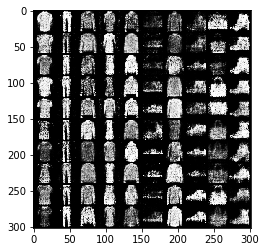

[Epoch 9/100] [Batch 0/600] [D loss: 1.255283] [G loss: 0.801250]
[Epoch 9/100] [Batch 1/600] [D loss: 1.238947] [G loss: 1.190695]
[Epoch 9/100] [Batch 2/600] [D loss: 1.256369] [G loss: 0.940076]
[Epoch 9/100] [Batch 3/600] [D loss: 1.319527] [G loss: 0.715047]
[Epoch 9/100] [Batch 4/600] [D loss: 1.222739] [G loss: 0.935741]
[Epoch 9/100] [Batch 5/600] [D loss: 1.248700] [G loss: 0.991803]
[Epoch 9/100] [Batch 6/600] [D loss: 1.161264] [G loss: 0.956908]
[Epoch 9/100] [Batch 7/600] [D loss: 1.267343] [G loss: 0.822860]
[Epoch 9/100] [Batch 8/600] [D loss: 1.165134] [G loss: 0.986811]
[Epoch 9/100] [Batch 9/600] [D loss: 1.205534] [G loss: 1.012894]
[Epoch 9/100] [Batch 10/600] [D loss: 1.265447] [G loss: 1.042697]
[Epoch 9/100] [Batch 11/600] [D loss: 1.232646] [G loss: 0.980533]
[Epoch 9/100] [Batch 12/600] [D loss: 1.215031] [G loss: 0.931800]
[Epoch 9/100] [Batch 13/600] [D loss: 1.171776] [G loss: 1.084002]
[Epoch 9/100] [Batch 14/600] [D loss: 1.259275] [G loss: 1.019729]
[Epoc

[Epoch 9/100] [Batch 242/600] [D loss: 1.282234] [G loss: 1.009712]
[Epoch 9/100] [Batch 243/600] [D loss: 1.263627] [G loss: 1.165852]
[Epoch 9/100] [Batch 244/600] [D loss: 1.287149] [G loss: 0.890212]
[Epoch 9/100] [Batch 245/600] [D loss: 1.245496] [G loss: 0.921331]
[Epoch 9/100] [Batch 246/600] [D loss: 1.268566] [G loss: 0.833147]
[Epoch 9/100] [Batch 247/600] [D loss: 1.329954] [G loss: 0.783900]
[Epoch 9/100] [Batch 248/600] [D loss: 1.226719] [G loss: 1.100594]
[Epoch 9/100] [Batch 249/600] [D loss: 1.232700] [G loss: 1.137889]
[Epoch 9/100] [Batch 250/600] [D loss: 1.242034] [G loss: 0.917714]
[Epoch 9/100] [Batch 251/600] [D loss: 1.196648] [G loss: 0.864438]
[Epoch 9/100] [Batch 252/600] [D loss: 1.265507] [G loss: 0.976253]
[Epoch 9/100] [Batch 253/600] [D loss: 1.260427] [G loss: 0.940824]
[Epoch 9/100] [Batch 254/600] [D loss: 1.235723] [G loss: 0.963942]
[Epoch 9/100] [Batch 255/600] [D loss: 1.204030] [G loss: 0.934385]
[Epoch 9/100] [Batch 256/600] [D loss: 1.276857]

[Epoch 9/100] [Batch 482/600] [D loss: 1.308101] [G loss: 1.305632]
[Epoch 9/100] [Batch 483/600] [D loss: 1.359260] [G loss: 1.005724]
[Epoch 9/100] [Batch 484/600] [D loss: 1.317701] [G loss: 0.875574]
[Epoch 9/100] [Batch 485/600] [D loss: 1.252448] [G loss: 0.941186]
[Epoch 9/100] [Batch 486/600] [D loss: 1.242257] [G loss: 1.010129]
[Epoch 9/100] [Batch 487/600] [D loss: 1.255955] [G loss: 0.973764]
[Epoch 9/100] [Batch 488/600] [D loss: 1.253935] [G loss: 0.770372]
[Epoch 9/100] [Batch 489/600] [D loss: 1.344235] [G loss: 1.029754]
[Epoch 9/100] [Batch 490/600] [D loss: 1.316405] [G loss: 1.188734]
[Epoch 9/100] [Batch 491/600] [D loss: 1.322259] [G loss: 0.887990]
[Epoch 9/100] [Batch 492/600] [D loss: 1.319874] [G loss: 0.838742]
[Epoch 9/100] [Batch 493/600] [D loss: 1.288004] [G loss: 1.018199]
[Epoch 9/100] [Batch 494/600] [D loss: 1.266846] [G loss: 0.931481]
[Epoch 9/100] [Batch 495/600] [D loss: 1.186921] [G loss: 0.901759]
[Epoch 9/100] [Batch 496/600] [D loss: 1.183009]

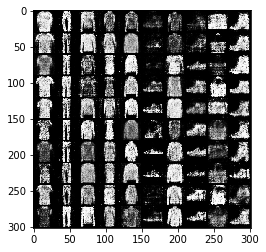

[Epoch 10/100] [Batch 0/600] [D loss: 1.210212] [G loss: 0.945868]
[Epoch 10/100] [Batch 1/600] [D loss: 1.279442] [G loss: 0.830125]
[Epoch 10/100] [Batch 2/600] [D loss: 1.283607] [G loss: 1.133165]
[Epoch 10/100] [Batch 3/600] [D loss: 1.338239] [G loss: 1.035007]
[Epoch 10/100] [Batch 4/600] [D loss: 1.225291] [G loss: 0.958929]
[Epoch 10/100] [Batch 5/600] [D loss: 1.250099] [G loss: 0.857229]
[Epoch 10/100] [Batch 6/600] [D loss: 1.213530] [G loss: 0.963682]
[Epoch 10/100] [Batch 7/600] [D loss: 1.161507] [G loss: 1.046463]
[Epoch 10/100] [Batch 8/600] [D loss: 1.223286] [G loss: 0.946167]
[Epoch 10/100] [Batch 9/600] [D loss: 1.241226] [G loss: 0.883387]
[Epoch 10/100] [Batch 10/600] [D loss: 1.315114] [G loss: 0.917993]
[Epoch 10/100] [Batch 11/600] [D loss: 1.298118] [G loss: 1.025381]
[Epoch 10/100] [Batch 12/600] [D loss: 1.336345] [G loss: 0.985927]
[Epoch 10/100] [Batch 13/600] [D loss: 1.261170] [G loss: 0.760552]
[Epoch 10/100] [Batch 14/600] [D loss: 1.251106] [G loss: 

[Epoch 10/100] [Batch 238/600] [D loss: 1.290270] [G loss: 0.955904]
[Epoch 10/100] [Batch 239/600] [D loss: 1.251895] [G loss: 0.826950]
[Epoch 10/100] [Batch 240/600] [D loss: 1.277307] [G loss: 0.991186]
[Epoch 10/100] [Batch 241/600] [D loss: 1.243934] [G loss: 0.995143]
[Epoch 10/100] [Batch 242/600] [D loss: 1.192766] [G loss: 0.870667]
[Epoch 10/100] [Batch 243/600] [D loss: 1.271286] [G loss: 1.019693]
[Epoch 10/100] [Batch 244/600] [D loss: 1.363040] [G loss: 0.990020]
[Epoch 10/100] [Batch 245/600] [D loss: 1.370070] [G loss: 0.920531]
[Epoch 10/100] [Batch 246/600] [D loss: 1.336852] [G loss: 0.935568]
[Epoch 10/100] [Batch 247/600] [D loss: 1.262952] [G loss: 0.939535]
[Epoch 10/100] [Batch 248/600] [D loss: 1.202106] [G loss: 0.897167]
[Epoch 10/100] [Batch 249/600] [D loss: 1.265270] [G loss: 0.965657]
[Epoch 10/100] [Batch 250/600] [D loss: 1.268144] [G loss: 0.870840]
[Epoch 10/100] [Batch 251/600] [D loss: 1.195198] [G loss: 0.985594]
[Epoch 10/100] [Batch 252/600] [D 

[Epoch 10/100] [Batch 474/600] [D loss: 1.269051] [G loss: 1.085141]
[Epoch 10/100] [Batch 475/600] [D loss: 1.260640] [G loss: 0.948920]
[Epoch 10/100] [Batch 476/600] [D loss: 1.236430] [G loss: 0.814575]
[Epoch 10/100] [Batch 477/600] [D loss: 1.277861] [G loss: 0.891857]
[Epoch 10/100] [Batch 478/600] [D loss: 1.231817] [G loss: 0.964384]
[Epoch 10/100] [Batch 479/600] [D loss: 1.237824] [G loss: 0.983735]
[Epoch 10/100] [Batch 480/600] [D loss: 1.141025] [G loss: 1.012402]
[Epoch 10/100] [Batch 481/600] [D loss: 1.146852] [G loss: 0.905657]
[Epoch 10/100] [Batch 482/600] [D loss: 1.264345] [G loss: 1.001266]
[Epoch 10/100] [Batch 483/600] [D loss: 1.307181] [G loss: 0.949171]
[Epoch 10/100] [Batch 484/600] [D loss: 1.351106] [G loss: 0.833590]
[Epoch 10/100] [Batch 485/600] [D loss: 1.335652] [G loss: 1.072914]
[Epoch 10/100] [Batch 486/600] [D loss: 1.308243] [G loss: 0.901135]
[Epoch 10/100] [Batch 487/600] [D loss: 1.306571] [G loss: 0.808093]
[Epoch 10/100] [Batch 488/600] [D 

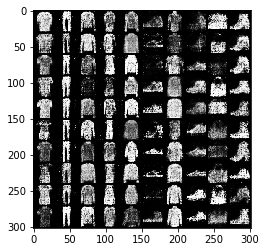

[Epoch 11/100] [Batch 0/600] [D loss: 1.291564] [G loss: 0.892397]
[Epoch 11/100] [Batch 1/600] [D loss: 1.363004] [G loss: 0.887906]
[Epoch 11/100] [Batch 2/600] [D loss: 1.322156] [G loss: 0.873439]
[Epoch 11/100] [Batch 3/600] [D loss: 1.324892] [G loss: 0.896400]
[Epoch 11/100] [Batch 4/600] [D loss: 1.225844] [G loss: 0.875195]
[Epoch 11/100] [Batch 5/600] [D loss: 1.361428] [G loss: 0.932957]
[Epoch 11/100] [Batch 6/600] [D loss: 1.267622] [G loss: 0.836280]
[Epoch 11/100] [Batch 7/600] [D loss: 1.304929] [G loss: 0.906534]
[Epoch 11/100] [Batch 8/600] [D loss: 1.291354] [G loss: 0.940264]
[Epoch 11/100] [Batch 9/600] [D loss: 1.288421] [G loss: 0.825584]
[Epoch 11/100] [Batch 10/600] [D loss: 1.212597] [G loss: 0.799711]
[Epoch 11/100] [Batch 11/600] [D loss: 1.237355] [G loss: 0.963952]
[Epoch 11/100] [Batch 12/600] [D loss: 1.259192] [G loss: 0.904940]
[Epoch 11/100] [Batch 13/600] [D loss: 1.253020] [G loss: 0.845770]
[Epoch 11/100] [Batch 14/600] [D loss: 1.160670] [G loss: 

[Epoch 11/100] [Batch 238/600] [D loss: 1.356695] [G loss: 0.857965]
[Epoch 11/100] [Batch 239/600] [D loss: 1.298509] [G loss: 0.804757]
[Epoch 11/100] [Batch 240/600] [D loss: 1.312994] [G loss: 0.930351]
[Epoch 11/100] [Batch 241/600] [D loss: 1.251099] [G loss: 0.912965]
[Epoch 11/100] [Batch 242/600] [D loss: 1.253318] [G loss: 1.009170]
[Epoch 11/100] [Batch 243/600] [D loss: 1.297027] [G loss: 0.906569]
[Epoch 11/100] [Batch 244/600] [D loss: 1.269691] [G loss: 0.956424]
[Epoch 11/100] [Batch 245/600] [D loss: 1.221618] [G loss: 0.918857]
[Epoch 11/100] [Batch 246/600] [D loss: 1.269643] [G loss: 0.859405]
[Epoch 11/100] [Batch 247/600] [D loss: 1.312508] [G loss: 0.955852]
[Epoch 11/100] [Batch 248/600] [D loss: 1.365970] [G loss: 1.034962]
[Epoch 11/100] [Batch 249/600] [D loss: 1.273118] [G loss: 0.754757]
[Epoch 11/100] [Batch 250/600] [D loss: 1.313606] [G loss: 0.902096]
[Epoch 11/100] [Batch 251/600] [D loss: 1.263685] [G loss: 0.988949]
[Epoch 11/100] [Batch 252/600] [D 

[Epoch 11/100] [Batch 474/600] [D loss: 1.296263] [G loss: 0.848487]
[Epoch 11/100] [Batch 475/600] [D loss: 1.286160] [G loss: 0.937804]
[Epoch 11/100] [Batch 476/600] [D loss: 1.297686] [G loss: 0.918704]
[Epoch 11/100] [Batch 477/600] [D loss: 1.328883] [G loss: 0.808012]
[Epoch 11/100] [Batch 478/600] [D loss: 1.352895] [G loss: 0.804309]
[Epoch 11/100] [Batch 479/600] [D loss: 1.318607] [G loss: 0.847151]
[Epoch 11/100] [Batch 480/600] [D loss: 1.281694] [G loss: 0.861368]
[Epoch 11/100] [Batch 481/600] [D loss: 1.243218] [G loss: 0.784983]
[Epoch 11/100] [Batch 482/600] [D loss: 1.288790] [G loss: 0.835799]
[Epoch 11/100] [Batch 483/600] [D loss: 1.166856] [G loss: 0.911760]
[Epoch 11/100] [Batch 484/600] [D loss: 1.194392] [G loss: 0.950722]
[Epoch 11/100] [Batch 485/600] [D loss: 1.321519] [G loss: 1.023544]
[Epoch 11/100] [Batch 486/600] [D loss: 1.163325] [G loss: 0.847506]
[Epoch 11/100] [Batch 487/600] [D loss: 1.464195] [G loss: 0.974555]
[Epoch 11/100] [Batch 488/600] [D 

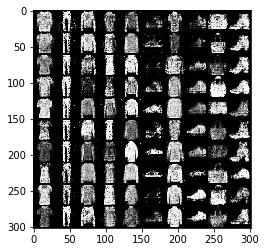

[Epoch 12/100] [Batch 0/600] [D loss: 1.367640] [G loss: 0.880271]
[Epoch 12/100] [Batch 1/600] [D loss: 1.283393] [G loss: 0.729123]
[Epoch 12/100] [Batch 2/600] [D loss: 1.255170] [G loss: 0.813962]
[Epoch 12/100] [Batch 3/600] [D loss: 1.347363] [G loss: 0.943594]
[Epoch 12/100] [Batch 4/600] [D loss: 1.286296] [G loss: 0.909009]
[Epoch 12/100] [Batch 5/600] [D loss: 1.314889] [G loss: 0.814428]
[Epoch 12/100] [Batch 6/600] [D loss: 1.295084] [G loss: 0.798387]
[Epoch 12/100] [Batch 7/600] [D loss: 1.265846] [G loss: 0.832650]
[Epoch 12/100] [Batch 8/600] [D loss: 1.307691] [G loss: 0.898987]
[Epoch 12/100] [Batch 9/600] [D loss: 1.310405] [G loss: 0.955411]
[Epoch 12/100] [Batch 10/600] [D loss: 1.258136] [G loss: 0.874355]
[Epoch 12/100] [Batch 11/600] [D loss: 1.275419] [G loss: 0.824282]
[Epoch 12/100] [Batch 12/600] [D loss: 1.215213] [G loss: 0.768494]
[Epoch 12/100] [Batch 13/600] [D loss: 1.389900] [G loss: 1.022607]
[Epoch 12/100] [Batch 14/600] [D loss: 1.210129] [G loss: 

[Epoch 12/100] [Batch 238/600] [D loss: 1.294383] [G loss: 0.800496]
[Epoch 12/100] [Batch 239/600] [D loss: 1.330434] [G loss: 0.805755]
[Epoch 12/100] [Batch 240/600] [D loss: 1.325893] [G loss: 0.818860]
[Epoch 12/100] [Batch 241/600] [D loss: 1.323170] [G loss: 0.760783]
[Epoch 12/100] [Batch 242/600] [D loss: 1.278982] [G loss: 0.887204]
[Epoch 12/100] [Batch 243/600] [D loss: 1.289988] [G loss: 0.851805]
[Epoch 12/100] [Batch 244/600] [D loss: 1.318653] [G loss: 0.827329]
[Epoch 12/100] [Batch 245/600] [D loss: 1.311313] [G loss: 0.820395]
[Epoch 12/100] [Batch 246/600] [D loss: 1.299781] [G loss: 0.881279]
[Epoch 12/100] [Batch 247/600] [D loss: 1.343363] [G loss: 0.788972]
[Epoch 12/100] [Batch 248/600] [D loss: 1.323894] [G loss: 0.783499]
[Epoch 12/100] [Batch 249/600] [D loss: 1.306595] [G loss: 0.873411]
[Epoch 12/100] [Batch 250/600] [D loss: 1.295053] [G loss: 0.843509]
[Epoch 12/100] [Batch 251/600] [D loss: 1.322730] [G loss: 0.864817]
[Epoch 12/100] [Batch 252/600] [D 

[Epoch 12/100] [Batch 474/600] [D loss: 1.272884] [G loss: 0.870193]
[Epoch 12/100] [Batch 475/600] [D loss: 1.304279] [G loss: 0.840430]
[Epoch 12/100] [Batch 476/600] [D loss: 1.213567] [G loss: 0.830839]
[Epoch 12/100] [Batch 477/600] [D loss: 1.217582] [G loss: 0.876930]
[Epoch 12/100] [Batch 478/600] [D loss: 1.262182] [G loss: 0.821788]
[Epoch 12/100] [Batch 479/600] [D loss: 1.215796] [G loss: 0.916918]
[Epoch 12/100] [Batch 480/600] [D loss: 1.291750] [G loss: 0.950024]
[Epoch 12/100] [Batch 481/600] [D loss: 1.285950] [G loss: 0.931536]
[Epoch 12/100] [Batch 482/600] [D loss: 1.245116] [G loss: 0.860844]
[Epoch 12/100] [Batch 483/600] [D loss: 1.320483] [G loss: 1.018454]
[Epoch 12/100] [Batch 484/600] [D loss: 1.412044] [G loss: 0.973523]
[Epoch 12/100] [Batch 485/600] [D loss: 1.386536] [G loss: 0.840734]
[Epoch 12/100] [Batch 486/600] [D loss: 1.397056] [G loss: 0.921310]
[Epoch 12/100] [Batch 487/600] [D loss: 1.330382] [G loss: 0.821163]
[Epoch 12/100] [Batch 488/600] [D 

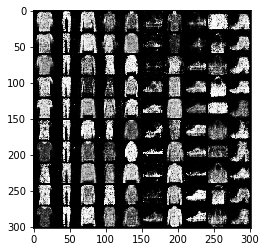

[Epoch 13/100] [Batch 0/600] [D loss: 1.281830] [G loss: 0.879508]
[Epoch 13/100] [Batch 1/600] [D loss: 1.311561] [G loss: 0.819613]
[Epoch 13/100] [Batch 2/600] [D loss: 1.274404] [G loss: 0.962820]
[Epoch 13/100] [Batch 3/600] [D loss: 1.378253] [G loss: 0.909658]
[Epoch 13/100] [Batch 4/600] [D loss: 1.322300] [G loss: 0.800801]
[Epoch 13/100] [Batch 5/600] [D loss: 1.292682] [G loss: 0.813005]
[Epoch 13/100] [Batch 6/600] [D loss: 1.358779] [G loss: 0.877344]
[Epoch 13/100] [Batch 7/600] [D loss: 1.334178] [G loss: 0.921997]
[Epoch 13/100] [Batch 8/600] [D loss: 1.312245] [G loss: 0.861137]
[Epoch 13/100] [Batch 9/600] [D loss: 1.371526] [G loss: 0.864598]
[Epoch 13/100] [Batch 10/600] [D loss: 1.312080] [G loss: 0.862150]
[Epoch 13/100] [Batch 11/600] [D loss: 1.299453] [G loss: 0.820185]
[Epoch 13/100] [Batch 12/600] [D loss: 1.288125] [G loss: 0.768675]
[Epoch 13/100] [Batch 13/600] [D loss: 1.355914] [G loss: 0.838889]
[Epoch 13/100] [Batch 14/600] [D loss: 1.309881] [G loss: 

[Epoch 13/100] [Batch 238/600] [D loss: 1.359924] [G loss: 0.812084]
[Epoch 13/100] [Batch 239/600] [D loss: 1.346442] [G loss: 0.925468]
[Epoch 13/100] [Batch 240/600] [D loss: 1.319866] [G loss: 0.884677]
[Epoch 13/100] [Batch 241/600] [D loss: 1.224039] [G loss: 0.807539]
[Epoch 13/100] [Batch 242/600] [D loss: 1.261477] [G loss: 0.914089]
[Epoch 13/100] [Batch 243/600] [D loss: 1.261810] [G loss: 0.810919]
[Epoch 13/100] [Batch 244/600] [D loss: 1.334681] [G loss: 0.804035]
[Epoch 13/100] [Batch 245/600] [D loss: 1.314232] [G loss: 0.859309]
[Epoch 13/100] [Batch 246/600] [D loss: 1.282312] [G loss: 0.912947]
[Epoch 13/100] [Batch 247/600] [D loss: 1.362771] [G loss: 0.892731]
[Epoch 13/100] [Batch 248/600] [D loss: 1.397732] [G loss: 0.777560]
[Epoch 13/100] [Batch 249/600] [D loss: 1.373119] [G loss: 0.790919]
[Epoch 13/100] [Batch 250/600] [D loss: 1.350887] [G loss: 0.801616]
[Epoch 13/100] [Batch 251/600] [D loss: 1.332621] [G loss: 0.845259]
[Epoch 13/100] [Batch 252/600] [D 

[Epoch 13/100] [Batch 474/600] [D loss: 1.341388] [G loss: 0.830551]
[Epoch 13/100] [Batch 475/600] [D loss: 1.360367] [G loss: 0.815776]
[Epoch 13/100] [Batch 476/600] [D loss: 1.272955] [G loss: 0.808641]
[Epoch 13/100] [Batch 477/600] [D loss: 1.275707] [G loss: 0.812397]
[Epoch 13/100] [Batch 478/600] [D loss: 1.304935] [G loss: 0.869565]
[Epoch 13/100] [Batch 479/600] [D loss: 1.345482] [G loss: 0.798291]
[Epoch 13/100] [Batch 480/600] [D loss: 1.308021] [G loss: 0.857958]
[Epoch 13/100] [Batch 481/600] [D loss: 1.346482] [G loss: 0.916200]
[Epoch 13/100] [Batch 482/600] [D loss: 1.287801] [G loss: 0.838161]
[Epoch 13/100] [Batch 483/600] [D loss: 1.316006] [G loss: 0.765272]
[Epoch 13/100] [Batch 484/600] [D loss: 1.310873] [G loss: 0.756345]
[Epoch 13/100] [Batch 485/600] [D loss: 1.308261] [G loss: 0.854815]
[Epoch 13/100] [Batch 486/600] [D loss: 1.262560] [G loss: 0.836010]
[Epoch 13/100] [Batch 487/600] [D loss: 1.270791] [G loss: 0.836146]
[Epoch 13/100] [Batch 488/600] [D 

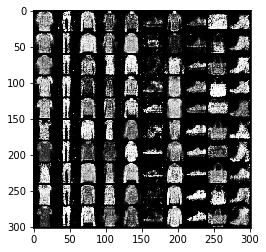

[Epoch 14/100] [Batch 0/600] [D loss: 1.369837] [G loss: 0.773736]
[Epoch 14/100] [Batch 1/600] [D loss: 1.343177] [G loss: 0.848581]
[Epoch 14/100] [Batch 2/600] [D loss: 1.317542] [G loss: 0.883326]
[Epoch 14/100] [Batch 3/600] [D loss: 1.314346] [G loss: 0.728981]
[Epoch 14/100] [Batch 4/600] [D loss: 1.326888] [G loss: 0.834264]
[Epoch 14/100] [Batch 5/600] [D loss: 1.277754] [G loss: 1.040841]
[Epoch 14/100] [Batch 6/600] [D loss: 1.317385] [G loss: 0.845320]
[Epoch 14/100] [Batch 7/600] [D loss: 1.475142] [G loss: 0.952563]
[Epoch 14/100] [Batch 8/600] [D loss: 1.438256] [G loss: 0.830936]
[Epoch 14/100] [Batch 9/600] [D loss: 1.388346] [G loss: 0.781093]
[Epoch 14/100] [Batch 10/600] [D loss: 1.315876] [G loss: 0.727613]
[Epoch 14/100] [Batch 11/600] [D loss: 1.304446] [G loss: 0.828470]
[Epoch 14/100] [Batch 12/600] [D loss: 1.259655] [G loss: 0.815031]
[Epoch 14/100] [Batch 13/600] [D loss: 1.317933] [G loss: 0.820085]
[Epoch 14/100] [Batch 14/600] [D loss: 1.255303] [G loss: 

[Epoch 14/100] [Batch 238/600] [D loss: 1.329494] [G loss: 0.796863]
[Epoch 14/100] [Batch 239/600] [D loss: 1.348623] [G loss: 0.819158]
[Epoch 14/100] [Batch 240/600] [D loss: 1.331578] [G loss: 0.884281]
[Epoch 14/100] [Batch 241/600] [D loss: 1.327243] [G loss: 0.794915]
[Epoch 14/100] [Batch 242/600] [D loss: 1.329230] [G loss: 0.805947]
[Epoch 14/100] [Batch 243/600] [D loss: 1.397489] [G loss: 0.886547]
[Epoch 14/100] [Batch 244/600] [D loss: 1.376656] [G loss: 0.826701]
[Epoch 14/100] [Batch 245/600] [D loss: 1.289069] [G loss: 0.796058]
[Epoch 14/100] [Batch 246/600] [D loss: 1.343928] [G loss: 0.760245]
[Epoch 14/100] [Batch 247/600] [D loss: 1.349620] [G loss: 0.831433]
[Epoch 14/100] [Batch 248/600] [D loss: 1.361469] [G loss: 0.871417]
[Epoch 14/100] [Batch 249/600] [D loss: 1.336557] [G loss: 0.857948]
[Epoch 14/100] [Batch 250/600] [D loss: 1.293959] [G loss: 0.875481]
[Epoch 14/100] [Batch 251/600] [D loss: 1.323235] [G loss: 0.796311]
[Epoch 14/100] [Batch 252/600] [D 

[Epoch 14/100] [Batch 474/600] [D loss: 1.255387] [G loss: 0.826147]
[Epoch 14/100] [Batch 475/600] [D loss: 1.320819] [G loss: 0.834036]
[Epoch 14/100] [Batch 476/600] [D loss: 1.330007] [G loss: 0.867324]
[Epoch 14/100] [Batch 477/600] [D loss: 1.398474] [G loss: 0.935845]
[Epoch 14/100] [Batch 478/600] [D loss: 1.380919] [G loss: 0.840268]
[Epoch 14/100] [Batch 479/600] [D loss: 1.345975] [G loss: 0.819091]
[Epoch 14/100] [Batch 480/600] [D loss: 1.340179] [G loss: 0.758197]
[Epoch 14/100] [Batch 481/600] [D loss: 1.296161] [G loss: 0.785141]
[Epoch 14/100] [Batch 482/600] [D loss: 1.360841] [G loss: 0.816960]
[Epoch 14/100] [Batch 483/600] [D loss: 1.314714] [G loss: 0.902308]
[Epoch 14/100] [Batch 484/600] [D loss: 1.303376] [G loss: 0.887392]
[Epoch 14/100] [Batch 485/600] [D loss: 1.278578] [G loss: 0.866519]
[Epoch 14/100] [Batch 486/600] [D loss: 1.387087] [G loss: 0.826247]
[Epoch 14/100] [Batch 487/600] [D loss: 1.288858] [G loss: 0.777650]
[Epoch 14/100] [Batch 488/600] [D 

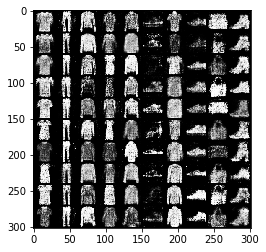

[Epoch 15/100] [Batch 0/600] [D loss: 1.349427] [G loss: 0.770349]
[Epoch 15/100] [Batch 1/600] [D loss: 1.364203] [G loss: 0.786227]
[Epoch 15/100] [Batch 2/600] [D loss: 1.312419] [G loss: 0.851038]
[Epoch 15/100] [Batch 3/600] [D loss: 1.353306] [G loss: 0.812379]
[Epoch 15/100] [Batch 4/600] [D loss: 1.309834] [G loss: 0.832814]
[Epoch 15/100] [Batch 5/600] [D loss: 1.348955] [G loss: 0.805034]
[Epoch 15/100] [Batch 6/600] [D loss: 1.280027] [G loss: 0.833011]
[Epoch 15/100] [Batch 7/600] [D loss: 1.318189] [G loss: 0.847466]
[Epoch 15/100] [Batch 8/600] [D loss: 1.252201] [G loss: 0.824933]
[Epoch 15/100] [Batch 9/600] [D loss: 1.321612] [G loss: 0.862492]
[Epoch 15/100] [Batch 10/600] [D loss: 1.284068] [G loss: 0.846878]
[Epoch 15/100] [Batch 11/600] [D loss: 1.287425] [G loss: 0.819261]
[Epoch 15/100] [Batch 12/600] [D loss: 1.335428] [G loss: 0.779760]
[Epoch 15/100] [Batch 13/600] [D loss: 1.337315] [G loss: 0.796078]
[Epoch 15/100] [Batch 14/600] [D loss: 1.326121] [G loss: 

[Epoch 15/100] [Batch 238/600] [D loss: 1.352001] [G loss: 0.838056]
[Epoch 15/100] [Batch 239/600] [D loss: 1.274895] [G loss: 0.865190]
[Epoch 15/100] [Batch 240/600] [D loss: 1.250631] [G loss: 0.845451]
[Epoch 15/100] [Batch 241/600] [D loss: 1.412213] [G loss: 0.774495]
[Epoch 15/100] [Batch 242/600] [D loss: 1.346546] [G loss: 0.793822]
[Epoch 15/100] [Batch 243/600] [D loss: 1.276186] [G loss: 0.877434]
[Epoch 15/100] [Batch 244/600] [D loss: 1.320572] [G loss: 0.868105]
[Epoch 15/100] [Batch 245/600] [D loss: 1.350214] [G loss: 0.848080]
[Epoch 15/100] [Batch 246/600] [D loss: 1.368982] [G loss: 0.785403]
[Epoch 15/100] [Batch 247/600] [D loss: 1.315170] [G loss: 0.811783]
[Epoch 15/100] [Batch 248/600] [D loss: 1.335580] [G loss: 0.764706]
[Epoch 15/100] [Batch 249/600] [D loss: 1.444923] [G loss: 0.851897]
[Epoch 15/100] [Batch 250/600] [D loss: 1.398915] [G loss: 0.809014]
[Epoch 15/100] [Batch 251/600] [D loss: 1.371551] [G loss: 0.837983]
[Epoch 15/100] [Batch 252/600] [D 

[Epoch 15/100] [Batch 474/600] [D loss: 1.326819] [G loss: 0.789267]
[Epoch 15/100] [Batch 475/600] [D loss: 1.299851] [G loss: 0.830439]
[Epoch 15/100] [Batch 476/600] [D loss: 1.296802] [G loss: 0.823164]
[Epoch 15/100] [Batch 477/600] [D loss: 1.315244] [G loss: 0.794801]
[Epoch 15/100] [Batch 478/600] [D loss: 1.371596] [G loss: 0.795533]
[Epoch 15/100] [Batch 479/600] [D loss: 1.359493] [G loss: 0.862682]
[Epoch 15/100] [Batch 480/600] [D loss: 1.351982] [G loss: 0.884823]
[Epoch 15/100] [Batch 481/600] [D loss: 1.284256] [G loss: 0.859118]
[Epoch 15/100] [Batch 482/600] [D loss: 1.304367] [G loss: 0.748271]
[Epoch 15/100] [Batch 483/600] [D loss: 1.383992] [G loss: 0.773635]
[Epoch 15/100] [Batch 484/600] [D loss: 1.405973] [G loss: 0.838546]
[Epoch 15/100] [Batch 485/600] [D loss: 1.331180] [G loss: 0.846202]
[Epoch 15/100] [Batch 486/600] [D loss: 1.392760] [G loss: 0.878349]
[Epoch 15/100] [Batch 487/600] [D loss: 1.312871] [G loss: 0.821371]
[Epoch 15/100] [Batch 488/600] [D 

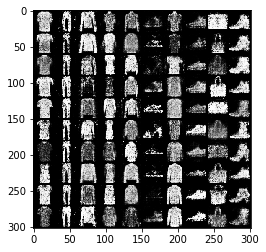

[Epoch 16/100] [Batch 0/600] [D loss: 1.289419] [G loss: 0.776069]
[Epoch 16/100] [Batch 1/600] [D loss: 1.316323] [G loss: 0.725422]
[Epoch 16/100] [Batch 2/600] [D loss: 1.326122] [G loss: 0.813970]
[Epoch 16/100] [Batch 3/600] [D loss: 1.353623] [G loss: 0.797273]
[Epoch 16/100] [Batch 4/600] [D loss: 1.298153] [G loss: 0.799904]
[Epoch 16/100] [Batch 5/600] [D loss: 1.287001] [G loss: 0.769844]
[Epoch 16/100] [Batch 6/600] [D loss: 1.303190] [G loss: 0.849284]
[Epoch 16/100] [Batch 7/600] [D loss: 1.306791] [G loss: 0.836703]
[Epoch 16/100] [Batch 8/600] [D loss: 1.334478] [G loss: 0.779734]
[Epoch 16/100] [Batch 9/600] [D loss: 1.326632] [G loss: 0.749155]
[Epoch 16/100] [Batch 10/600] [D loss: 1.312647] [G loss: 0.798344]
[Epoch 16/100] [Batch 11/600] [D loss: 1.348155] [G loss: 0.789653]
[Epoch 16/100] [Batch 12/600] [D loss: 1.387158] [G loss: 0.810146]
[Epoch 16/100] [Batch 13/600] [D loss: 1.334557] [G loss: 0.774455]
[Epoch 16/100] [Batch 14/600] [D loss: 1.266251] [G loss: 

[Epoch 16/100] [Batch 238/600] [D loss: 1.303620] [G loss: 0.795274]
[Epoch 16/100] [Batch 239/600] [D loss: 1.346361] [G loss: 0.806139]
[Epoch 16/100] [Batch 240/600] [D loss: 1.281014] [G loss: 0.773098]
[Epoch 16/100] [Batch 241/600] [D loss: 1.297451] [G loss: 0.738523]
[Epoch 16/100] [Batch 242/600] [D loss: 1.285841] [G loss: 0.809110]
[Epoch 16/100] [Batch 243/600] [D loss: 1.254402] [G loss: 0.890396]
[Epoch 16/100] [Batch 244/600] [D loss: 1.279543] [G loss: 0.870562]
[Epoch 16/100] [Batch 245/600] [D loss: 1.393696] [G loss: 0.821527]
[Epoch 16/100] [Batch 246/600] [D loss: 1.329897] [G loss: 0.826801]
[Epoch 16/100] [Batch 247/600] [D loss: 1.319560] [G loss: 0.809607]
[Epoch 16/100] [Batch 248/600] [D loss: 1.414216] [G loss: 0.851647]
[Epoch 16/100] [Batch 249/600] [D loss: 1.401914] [G loss: 0.891913]
[Epoch 16/100] [Batch 250/600] [D loss: 1.378052] [G loss: 0.838113]
[Epoch 16/100] [Batch 251/600] [D loss: 1.416104] [G loss: 0.860740]
[Epoch 16/100] [Batch 252/600] [D 

[Epoch 16/100] [Batch 474/600] [D loss: 1.316160] [G loss: 0.751188]
[Epoch 16/100] [Batch 475/600] [D loss: 1.352640] [G loss: 0.722748]
[Epoch 16/100] [Batch 476/600] [D loss: 1.395582] [G loss: 0.867787]
[Epoch 16/100] [Batch 477/600] [D loss: 1.306651] [G loss: 0.781195]
[Epoch 16/100] [Batch 478/600] [D loss: 1.323542] [G loss: 0.757454]
[Epoch 16/100] [Batch 479/600] [D loss: 1.295218] [G loss: 0.766091]
[Epoch 16/100] [Batch 480/600] [D loss: 1.302490] [G loss: 0.803192]
[Epoch 16/100] [Batch 481/600] [D loss: 1.418721] [G loss: 0.861493]
[Epoch 16/100] [Batch 482/600] [D loss: 1.310691] [G loss: 0.805950]
[Epoch 16/100] [Batch 483/600] [D loss: 1.346022] [G loss: 0.736965]
[Epoch 16/100] [Batch 484/600] [D loss: 1.312463] [G loss: 0.738340]
[Epoch 16/100] [Batch 485/600] [D loss: 1.414212] [G loss: 0.872226]
[Epoch 16/100] [Batch 486/600] [D loss: 1.364415] [G loss: 0.875506]
[Epoch 16/100] [Batch 487/600] [D loss: 1.318540] [G loss: 0.819139]
[Epoch 16/100] [Batch 488/600] [D 

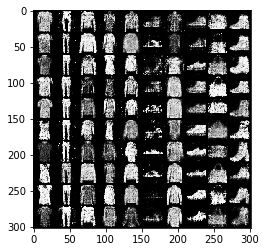

[Epoch 17/100] [Batch 0/600] [D loss: 1.339463] [G loss: 0.779972]
[Epoch 17/100] [Batch 1/600] [D loss: 1.392444] [G loss: 0.761813]
[Epoch 17/100] [Batch 2/600] [D loss: 1.301050] [G loss: 0.766774]
[Epoch 17/100] [Batch 3/600] [D loss: 1.349258] [G loss: 0.797747]
[Epoch 17/100] [Batch 4/600] [D loss: 1.380938] [G loss: 0.802698]
[Epoch 17/100] [Batch 5/600] [D loss: 1.295772] [G loss: 0.810994]
[Epoch 17/100] [Batch 6/600] [D loss: 1.435516] [G loss: 0.859645]
[Epoch 17/100] [Batch 7/600] [D loss: 1.347036] [G loss: 0.829722]
[Epoch 17/100] [Batch 8/600] [D loss: 1.319946] [G loss: 0.786286]
[Epoch 17/100] [Batch 9/600] [D loss: 1.339010] [G loss: 0.825141]
[Epoch 17/100] [Batch 10/600] [D loss: 1.349698] [G loss: 0.824945]
[Epoch 17/100] [Batch 11/600] [D loss: 1.304982] [G loss: 0.811234]
[Epoch 17/100] [Batch 12/600] [D loss: 1.306157] [G loss: 0.794193]
[Epoch 17/100] [Batch 13/600] [D loss: 1.349400] [G loss: 0.757377]
[Epoch 17/100] [Batch 14/600] [D loss: 1.371867] [G loss: 

[Epoch 17/100] [Batch 238/600] [D loss: 1.327385] [G loss: 0.733776]
[Epoch 17/100] [Batch 239/600] [D loss: 1.300823] [G loss: 0.837806]
[Epoch 17/100] [Batch 240/600] [D loss: 1.335327] [G loss: 0.876052]
[Epoch 17/100] [Batch 241/600] [D loss: 1.321616] [G loss: 0.773497]
[Epoch 17/100] [Batch 242/600] [D loss: 1.266740] [G loss: 0.745638]
[Epoch 17/100] [Batch 243/600] [D loss: 1.346029] [G loss: 0.780779]
[Epoch 17/100] [Batch 244/600] [D loss: 1.396862] [G loss: 0.795516]
[Epoch 17/100] [Batch 245/600] [D loss: 1.356308] [G loss: 0.787497]
[Epoch 17/100] [Batch 246/600] [D loss: 1.356046] [G loss: 0.815255]
[Epoch 17/100] [Batch 247/600] [D loss: 1.337862] [G loss: 0.852898]
[Epoch 17/100] [Batch 248/600] [D loss: 1.339697] [G loss: 0.873787]
[Epoch 17/100] [Batch 249/600] [D loss: 1.367314] [G loss: 0.763953]
[Epoch 17/100] [Batch 250/600] [D loss: 1.395823] [G loss: 0.767554]
[Epoch 17/100] [Batch 251/600] [D loss: 1.354745] [G loss: 0.808094]
[Epoch 17/100] [Batch 252/600] [D 

[Epoch 17/100] [Batch 474/600] [D loss: 1.332578] [G loss: 0.782355]
[Epoch 17/100] [Batch 475/600] [D loss: 1.358255] [G loss: 0.771244]
[Epoch 17/100] [Batch 476/600] [D loss: 1.385993] [G loss: 0.820810]
[Epoch 17/100] [Batch 477/600] [D loss: 1.354331] [G loss: 0.768650]
[Epoch 17/100] [Batch 478/600] [D loss: 1.392081] [G loss: 0.779619]
[Epoch 17/100] [Batch 479/600] [D loss: 1.353480] [G loss: 0.809887]
[Epoch 17/100] [Batch 480/600] [D loss: 1.316813] [G loss: 0.836986]
[Epoch 17/100] [Batch 481/600] [D loss: 1.329000] [G loss: 0.835975]
[Epoch 17/100] [Batch 482/600] [D loss: 1.343297] [G loss: 0.787748]
[Epoch 17/100] [Batch 483/600] [D loss: 1.318854] [G loss: 0.791736]
[Epoch 17/100] [Batch 484/600] [D loss: 1.361308] [G loss: 0.791102]
[Epoch 17/100] [Batch 485/600] [D loss: 1.316476] [G loss: 0.823217]
[Epoch 17/100] [Batch 486/600] [D loss: 1.334619] [G loss: 0.795792]
[Epoch 17/100] [Batch 487/600] [D loss: 1.380382] [G loss: 0.842265]
[Epoch 17/100] [Batch 488/600] [D 

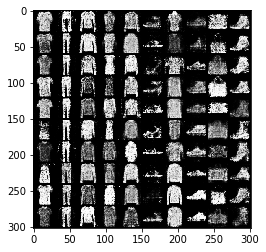

[Epoch 18/100] [Batch 0/600] [D loss: 1.299948] [G loss: 0.791052]
[Epoch 18/100] [Batch 1/600] [D loss: 1.330464] [G loss: 0.807233]
[Epoch 18/100] [Batch 2/600] [D loss: 1.377352] [G loss: 0.857669]
[Epoch 18/100] [Batch 3/600] [D loss: 1.308480] [G loss: 0.835372]
[Epoch 18/100] [Batch 4/600] [D loss: 1.295469] [G loss: 0.784612]
[Epoch 18/100] [Batch 5/600] [D loss: 1.390101] [G loss: 0.785159]
[Epoch 18/100] [Batch 6/600] [D loss: 1.367013] [G loss: 0.821542]
[Epoch 18/100] [Batch 7/600] [D loss: 1.364269] [G loss: 0.796837]
[Epoch 18/100] [Batch 8/600] [D loss: 1.360683] [G loss: 0.779618]
[Epoch 18/100] [Batch 9/600] [D loss: 1.362702] [G loss: 0.760310]
[Epoch 18/100] [Batch 10/600] [D loss: 1.277393] [G loss: 0.808583]
[Epoch 18/100] [Batch 11/600] [D loss: 1.320098] [G loss: 0.813451]
[Epoch 18/100] [Batch 12/600] [D loss: 1.286155] [G loss: 0.830402]
[Epoch 18/100] [Batch 13/600] [D loss: 1.305668] [G loss: 0.810959]
[Epoch 18/100] [Batch 14/600] [D loss: 1.328495] [G loss: 

[Epoch 18/100] [Batch 238/600] [D loss: 1.302564] [G loss: 0.768723]
[Epoch 18/100] [Batch 239/600] [D loss: 1.354863] [G loss: 0.817397]
[Epoch 18/100] [Batch 240/600] [D loss: 1.383112] [G loss: 0.857922]
[Epoch 18/100] [Batch 241/600] [D loss: 1.328069] [G loss: 0.890658]
[Epoch 18/100] [Batch 242/600] [D loss: 1.353508] [G loss: 0.839153]
[Epoch 18/100] [Batch 243/600] [D loss: 1.343213] [G loss: 0.717070]
[Epoch 18/100] [Batch 244/600] [D loss: 1.303388] [G loss: 0.766018]
[Epoch 18/100] [Batch 245/600] [D loss: 1.356644] [G loss: 0.827861]
[Epoch 18/100] [Batch 246/600] [D loss: 1.340071] [G loss: 0.831380]
[Epoch 18/100] [Batch 247/600] [D loss: 1.349243] [G loss: 0.808308]
[Epoch 18/100] [Batch 248/600] [D loss: 1.349072] [G loss: 0.762239]
[Epoch 18/100] [Batch 249/600] [D loss: 1.356768] [G loss: 0.732813]
[Epoch 18/100] [Batch 250/600] [D loss: 1.382892] [G loss: 0.790293]
[Epoch 18/100] [Batch 251/600] [D loss: 1.365108] [G loss: 0.810457]
[Epoch 18/100] [Batch 252/600] [D 

[Epoch 18/100] [Batch 474/600] [D loss: 1.401359] [G loss: 0.878845]
[Epoch 18/100] [Batch 475/600] [D loss: 1.313408] [G loss: 0.834872]
[Epoch 18/100] [Batch 476/600] [D loss: 1.365627] [G loss: 0.774045]
[Epoch 18/100] [Batch 477/600] [D loss: 1.388587] [G loss: 0.782054]
[Epoch 18/100] [Batch 478/600] [D loss: 1.372964] [G loss: 0.827536]
[Epoch 18/100] [Batch 479/600] [D loss: 1.340552] [G loss: 0.804652]
[Epoch 18/100] [Batch 480/600] [D loss: 1.331671] [G loss: 0.722502]
[Epoch 18/100] [Batch 481/600] [D loss: 1.366357] [G loss: 0.719531]
[Epoch 18/100] [Batch 482/600] [D loss: 1.316926] [G loss: 0.755118]
[Epoch 18/100] [Batch 483/600] [D loss: 1.324541] [G loss: 0.759275]
[Epoch 18/100] [Batch 484/600] [D loss: 1.375995] [G loss: 0.816530]
[Epoch 18/100] [Batch 485/600] [D loss: 1.355477] [G loss: 0.838039]
[Epoch 18/100] [Batch 486/600] [D loss: 1.311489] [G loss: 0.790115]
[Epoch 18/100] [Batch 487/600] [D loss: 1.302985] [G loss: 0.756613]
[Epoch 18/100] [Batch 488/600] [D 

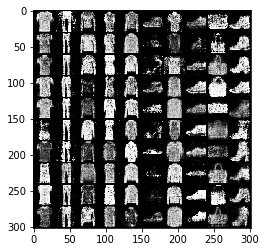

[Epoch 19/100] [Batch 0/600] [D loss: 1.285093] [G loss: 0.813787]
[Epoch 19/100] [Batch 1/600] [D loss: 1.401088] [G loss: 0.777095]
[Epoch 19/100] [Batch 2/600] [D loss: 1.361420] [G loss: 0.849420]
[Epoch 19/100] [Batch 3/600] [D loss: 1.376313] [G loss: 0.866770]
[Epoch 19/100] [Batch 4/600] [D loss: 1.304991] [G loss: 0.843716]
[Epoch 19/100] [Batch 5/600] [D loss: 1.380525] [G loss: 0.730494]
[Epoch 19/100] [Batch 6/600] [D loss: 1.306203] [G loss: 0.706276]
[Epoch 19/100] [Batch 7/600] [D loss: 1.344736] [G loss: 0.743810]
[Epoch 19/100] [Batch 8/600] [D loss: 1.273812] [G loss: 0.789929]
[Epoch 19/100] [Batch 9/600] [D loss: 1.352817] [G loss: 0.775573]
[Epoch 19/100] [Batch 10/600] [D loss: 1.251746] [G loss: 0.809513]
[Epoch 19/100] [Batch 11/600] [D loss: 1.280311] [G loss: 0.788158]
[Epoch 19/100] [Batch 12/600] [D loss: 1.341313] [G loss: 0.741119]
[Epoch 19/100] [Batch 13/600] [D loss: 1.405180] [G loss: 0.836615]
[Epoch 19/100] [Batch 14/600] [D loss: 1.297292] [G loss: 

[Epoch 19/100] [Batch 238/600] [D loss: 1.348532] [G loss: 0.842438]
[Epoch 19/100] [Batch 239/600] [D loss: 1.373464] [G loss: 0.838370]
[Epoch 19/100] [Batch 240/600] [D loss: 1.399330] [G loss: 0.818552]
[Epoch 19/100] [Batch 241/600] [D loss: 1.340830] [G loss: 0.827796]
[Epoch 19/100] [Batch 242/600] [D loss: 1.370030] [G loss: 0.774038]
[Epoch 19/100] [Batch 243/600] [D loss: 1.331589] [G loss: 0.735984]
[Epoch 19/100] [Batch 244/600] [D loss: 1.391421] [G loss: 0.726710]
[Epoch 19/100] [Batch 245/600] [D loss: 1.318093] [G loss: 0.773030]
[Epoch 19/100] [Batch 246/600] [D loss: 1.342389] [G loss: 0.761551]
[Epoch 19/100] [Batch 247/600] [D loss: 1.310684] [G loss: 0.821404]
[Epoch 19/100] [Batch 248/600] [D loss: 1.327921] [G loss: 0.821392]
[Epoch 19/100] [Batch 249/600] [D loss: 1.313363] [G loss: 0.786721]
[Epoch 19/100] [Batch 250/600] [D loss: 1.319837] [G loss: 0.757595]
[Epoch 19/100] [Batch 251/600] [D loss: 1.258141] [G loss: 0.731591]
[Epoch 19/100] [Batch 252/600] [D 

[Epoch 19/100] [Batch 474/600] [D loss: 1.349026] [G loss: 0.794753]
[Epoch 19/100] [Batch 475/600] [D loss: 1.347687] [G loss: 0.775242]
[Epoch 19/100] [Batch 476/600] [D loss: 1.348475] [G loss: 0.770765]
[Epoch 19/100] [Batch 477/600] [D loss: 1.324979] [G loss: 0.798274]
[Epoch 19/100] [Batch 478/600] [D loss: 1.368931] [G loss: 0.879252]
[Epoch 19/100] [Batch 479/600] [D loss: 1.366065] [G loss: 0.808653]
[Epoch 19/100] [Batch 480/600] [D loss: 1.320386] [G loss: 0.778186]
[Epoch 19/100] [Batch 481/600] [D loss: 1.353353] [G loss: 0.781702]
[Epoch 19/100] [Batch 482/600] [D loss: 1.306543] [G loss: 0.845958]
[Epoch 19/100] [Batch 483/600] [D loss: 1.407131] [G loss: 0.846594]
[Epoch 19/100] [Batch 484/600] [D loss: 1.346535] [G loss: 0.766269]
[Epoch 19/100] [Batch 485/600] [D loss: 1.345528] [G loss: 0.742421]
[Epoch 19/100] [Batch 486/600] [D loss: 1.361290] [G loss: 0.740994]
[Epoch 19/100] [Batch 487/600] [D loss: 1.383130] [G loss: 0.764058]
[Epoch 19/100] [Batch 488/600] [D 

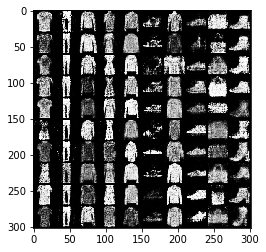

[Epoch 20/100] [Batch 0/600] [D loss: 1.340896] [G loss: 0.773730]
[Epoch 20/100] [Batch 1/600] [D loss: 1.341347] [G loss: 0.813076]
[Epoch 20/100] [Batch 2/600] [D loss: 1.362181] [G loss: 0.820592]
[Epoch 20/100] [Batch 3/600] [D loss: 1.411760] [G loss: 0.806247]
[Epoch 20/100] [Batch 4/600] [D loss: 1.403059] [G loss: 0.791904]
[Epoch 20/100] [Batch 5/600] [D loss: 1.343423] [G loss: 0.784191]
[Epoch 20/100] [Batch 6/600] [D loss: 1.366826] [G loss: 0.799486]
[Epoch 20/100] [Batch 7/600] [D loss: 1.328641] [G loss: 0.772234]
[Epoch 20/100] [Batch 8/600] [D loss: 1.308592] [G loss: 0.769830]
[Epoch 20/100] [Batch 9/600] [D loss: 1.370338] [G loss: 0.782969]
[Epoch 20/100] [Batch 10/600] [D loss: 1.430508] [G loss: 0.764309]
[Epoch 20/100] [Batch 11/600] [D loss: 1.355985] [G loss: 0.786520]
[Epoch 20/100] [Batch 12/600] [D loss: 1.379580] [G loss: 0.742393]
[Epoch 20/100] [Batch 13/600] [D loss: 1.366688] [G loss: 0.754842]
[Epoch 20/100] [Batch 14/600] [D loss: 1.400684] [G loss: 

[Epoch 20/100] [Batch 238/600] [D loss: 1.302845] [G loss: 0.776158]
[Epoch 20/100] [Batch 239/600] [D loss: 1.359312] [G loss: 0.793841]
[Epoch 20/100] [Batch 240/600] [D loss: 1.342119] [G loss: 0.757554]
[Epoch 20/100] [Batch 241/600] [D loss: 1.347427] [G loss: 0.727019]
[Epoch 20/100] [Batch 242/600] [D loss: 1.400351] [G loss: 0.830012]
[Epoch 20/100] [Batch 243/600] [D loss: 1.367337] [G loss: 0.816586]
[Epoch 20/100] [Batch 244/600] [D loss: 1.344969] [G loss: 0.754565]
[Epoch 20/100] [Batch 245/600] [D loss: 1.348662] [G loss: 0.710238]
[Epoch 20/100] [Batch 246/600] [D loss: 1.361706] [G loss: 0.724382]
[Epoch 20/100] [Batch 247/600] [D loss: 1.347722] [G loss: 0.744551]
[Epoch 20/100] [Batch 248/600] [D loss: 1.396142] [G loss: 0.748632]
[Epoch 20/100] [Batch 249/600] [D loss: 1.327669] [G loss: 0.821510]
[Epoch 20/100] [Batch 250/600] [D loss: 1.349642] [G loss: 0.827926]
[Epoch 20/100] [Batch 251/600] [D loss: 1.313488] [G loss: 0.847454]
[Epoch 20/100] [Batch 252/600] [D 

[Epoch 20/100] [Batch 474/600] [D loss: 1.371841] [G loss: 0.800690]
[Epoch 20/100] [Batch 475/600] [D loss: 1.333414] [G loss: 0.796168]
[Epoch 20/100] [Batch 476/600] [D loss: 1.340996] [G loss: 0.776934]
[Epoch 20/100] [Batch 477/600] [D loss: 1.398300] [G loss: 0.731556]
[Epoch 20/100] [Batch 478/600] [D loss: 1.326012] [G loss: 0.758490]
[Epoch 20/100] [Batch 479/600] [D loss: 1.365807] [G loss: 0.799281]
[Epoch 20/100] [Batch 480/600] [D loss: 1.349844] [G loss: 0.792395]
[Epoch 20/100] [Batch 481/600] [D loss: 1.374122] [G loss: 0.804065]
[Epoch 20/100] [Batch 482/600] [D loss: 1.329458] [G loss: 0.716912]
[Epoch 20/100] [Batch 483/600] [D loss: 1.332182] [G loss: 0.751505]
[Epoch 20/100] [Batch 484/600] [D loss: 1.349041] [G loss: 0.830205]
[Epoch 20/100] [Batch 485/600] [D loss: 1.384775] [G loss: 0.821864]
[Epoch 20/100] [Batch 486/600] [D loss: 1.349421] [G loss: 0.816913]
[Epoch 20/100] [Batch 487/600] [D loss: 1.373519] [G loss: 0.776033]
[Epoch 20/100] [Batch 488/600] [D 

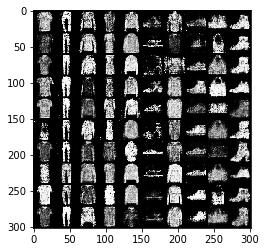

[Epoch 21/100] [Batch 0/600] [D loss: 1.357827] [G loss: 0.759018]
[Epoch 21/100] [Batch 1/600] [D loss: 1.350285] [G loss: 0.817973]
[Epoch 21/100] [Batch 2/600] [D loss: 1.357505] [G loss: 0.798888]
[Epoch 21/100] [Batch 3/600] [D loss: 1.351645] [G loss: 0.772241]
[Epoch 21/100] [Batch 4/600] [D loss: 1.314541] [G loss: 0.796294]
[Epoch 21/100] [Batch 5/600] [D loss: 1.336594] [G loss: 0.794800]
[Epoch 21/100] [Batch 6/600] [D loss: 1.324159] [G loss: 0.791912]
[Epoch 21/100] [Batch 7/600] [D loss: 1.334758] [G loss: 0.771097]
[Epoch 21/100] [Batch 8/600] [D loss: 1.316158] [G loss: 0.746399]
[Epoch 21/100] [Batch 9/600] [D loss: 1.382916] [G loss: 0.772368]
[Epoch 21/100] [Batch 10/600] [D loss: 1.363894] [G loss: 0.746349]
[Epoch 21/100] [Batch 11/600] [D loss: 1.397776] [G loss: 0.774333]
[Epoch 21/100] [Batch 12/600] [D loss: 1.352855] [G loss: 0.824860]
[Epoch 21/100] [Batch 13/600] [D loss: 1.407717] [G loss: 0.834102]
[Epoch 21/100] [Batch 14/600] [D loss: 1.356256] [G loss: 

[Epoch 21/100] [Batch 238/600] [D loss: 1.379576] [G loss: 0.771248]
[Epoch 21/100] [Batch 239/600] [D loss: 1.334140] [G loss: 0.736881]
[Epoch 21/100] [Batch 240/600] [D loss: 1.362473] [G loss: 0.699620]
[Epoch 21/100] [Batch 241/600] [D loss: 1.351114] [G loss: 0.740053]
[Epoch 21/100] [Batch 242/600] [D loss: 1.361689] [G loss: 0.733504]
[Epoch 21/100] [Batch 243/600] [D loss: 1.370697] [G loss: 0.744412]
[Epoch 21/100] [Batch 244/600] [D loss: 1.351818] [G loss: 0.745676]
[Epoch 21/100] [Batch 245/600] [D loss: 1.348651] [G loss: 0.699983]
[Epoch 21/100] [Batch 246/600] [D loss: 1.315386] [G loss: 0.781198]
[Epoch 21/100] [Batch 247/600] [D loss: 1.358819] [G loss: 0.794671]
[Epoch 21/100] [Batch 248/600] [D loss: 1.329377] [G loss: 0.801244]
[Epoch 21/100] [Batch 249/600] [D loss: 1.304030] [G loss: 0.720349]
[Epoch 21/100] [Batch 250/600] [D loss: 1.370418] [G loss: 0.827877]
[Epoch 21/100] [Batch 251/600] [D loss: 1.332364] [G loss: 0.804856]
[Epoch 21/100] [Batch 252/600] [D 

[Epoch 21/100] [Batch 474/600] [D loss: 1.344568] [G loss: 0.779609]
[Epoch 21/100] [Batch 475/600] [D loss: 1.291252] [G loss: 0.715496]
[Epoch 21/100] [Batch 476/600] [D loss: 1.341037] [G loss: 0.760353]
[Epoch 21/100] [Batch 477/600] [D loss: 1.322663] [G loss: 0.830822]
[Epoch 21/100] [Batch 478/600] [D loss: 1.304699] [G loss: 0.835463]
[Epoch 21/100] [Batch 479/600] [D loss: 1.349514] [G loss: 0.803851]
[Epoch 21/100] [Batch 480/600] [D loss: 1.374822] [G loss: 0.774807]
[Epoch 21/100] [Batch 481/600] [D loss: 1.356822] [G loss: 0.772982]
[Epoch 21/100] [Batch 482/600] [D loss: 1.318278] [G loss: 0.833215]
[Epoch 21/100] [Batch 483/600] [D loss: 1.340643] [G loss: 0.817552]
[Epoch 21/100] [Batch 484/600] [D loss: 1.334965] [G loss: 0.782715]
[Epoch 21/100] [Batch 485/600] [D loss: 1.327026] [G loss: 0.683625]
[Epoch 21/100] [Batch 486/600] [D loss: 1.393446] [G loss: 0.696517]
[Epoch 21/100] [Batch 487/600] [D loss: 1.365824] [G loss: 0.714860]
[Epoch 21/100] [Batch 488/600] [D 

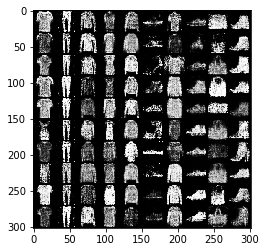

[Epoch 22/100] [Batch 0/600] [D loss: 1.332772] [G loss: 0.800722]
[Epoch 22/100] [Batch 1/600] [D loss: 1.330565] [G loss: 0.767375]
[Epoch 22/100] [Batch 2/600] [D loss: 1.319761] [G loss: 0.734159]
[Epoch 22/100] [Batch 3/600] [D loss: 1.328935] [G loss: 0.809117]
[Epoch 22/100] [Batch 4/600] [D loss: 1.344508] [G loss: 0.823997]
[Epoch 22/100] [Batch 5/600] [D loss: 1.356554] [G loss: 0.778589]
[Epoch 22/100] [Batch 6/600] [D loss: 1.400905] [G loss: 0.771884]
[Epoch 22/100] [Batch 7/600] [D loss: 1.322604] [G loss: 0.749730]
[Epoch 22/100] [Batch 8/600] [D loss: 1.347697] [G loss: 0.776763]
[Epoch 22/100] [Batch 9/600] [D loss: 1.308758] [G loss: 0.779606]
[Epoch 22/100] [Batch 10/600] [D loss: 1.360858] [G loss: 0.818310]
[Epoch 22/100] [Batch 11/600] [D loss: 1.368960] [G loss: 0.819367]
[Epoch 22/100] [Batch 12/600] [D loss: 1.367193] [G loss: 0.793933]
[Epoch 22/100] [Batch 13/600] [D loss: 1.416057] [G loss: 0.789356]
[Epoch 22/100] [Batch 14/600] [D loss: 1.334772] [G loss: 

[Epoch 22/100] [Batch 238/600] [D loss: 1.352994] [G loss: 0.775864]
[Epoch 22/100] [Batch 239/600] [D loss: 1.262424] [G loss: 0.745987]
[Epoch 22/100] [Batch 240/600] [D loss: 1.349208] [G loss: 0.745526]
[Epoch 22/100] [Batch 241/600] [D loss: 1.366260] [G loss: 0.823597]
[Epoch 22/100] [Batch 242/600] [D loss: 1.282611] [G loss: 0.842558]
[Epoch 22/100] [Batch 243/600] [D loss: 1.304592] [G loss: 0.740723]
[Epoch 22/100] [Batch 244/600] [D loss: 1.326096] [G loss: 0.758637]
[Epoch 22/100] [Batch 245/600] [D loss: 1.378621] [G loss: 0.847517]
[Epoch 22/100] [Batch 246/600] [D loss: 1.337268] [G loss: 0.823489]
[Epoch 22/100] [Batch 247/600] [D loss: 1.363227] [G loss: 0.820249]
[Epoch 22/100] [Batch 248/600] [D loss: 1.356797] [G loss: 0.844831]
[Epoch 22/100] [Batch 249/600] [D loss: 1.389176] [G loss: 0.815532]
[Epoch 22/100] [Batch 250/600] [D loss: 1.377558] [G loss: 0.843967]
[Epoch 22/100] [Batch 251/600] [D loss: 1.388912] [G loss: 0.769849]
[Epoch 22/100] [Batch 252/600] [D 

[Epoch 22/100] [Batch 474/600] [D loss: 1.319424] [G loss: 0.731000]
[Epoch 22/100] [Batch 475/600] [D loss: 1.354621] [G loss: 0.733680]
[Epoch 22/100] [Batch 476/600] [D loss: 1.340539] [G loss: 0.745340]
[Epoch 22/100] [Batch 477/600] [D loss: 1.371274] [G loss: 0.758617]
[Epoch 22/100] [Batch 478/600] [D loss: 1.330528] [G loss: 0.783610]
[Epoch 22/100] [Batch 479/600] [D loss: 1.355558] [G loss: 0.764583]
[Epoch 22/100] [Batch 480/600] [D loss: 1.335625] [G loss: 0.790931]
[Epoch 22/100] [Batch 481/600] [D loss: 1.355176] [G loss: 0.781801]
[Epoch 22/100] [Batch 482/600] [D loss: 1.359380] [G loss: 0.755386]
[Epoch 22/100] [Batch 483/600] [D loss: 1.342033] [G loss: 0.738914]
[Epoch 22/100] [Batch 484/600] [D loss: 1.381099] [G loss: 0.695950]
[Epoch 22/100] [Batch 485/600] [D loss: 1.381573] [G loss: 0.735493]
[Epoch 22/100] [Batch 486/600] [D loss: 1.353034] [G loss: 0.707514]
[Epoch 22/100] [Batch 487/600] [D loss: 1.351701] [G loss: 0.761213]
[Epoch 22/100] [Batch 488/600] [D 

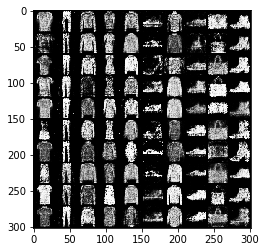

[Epoch 23/100] [Batch 0/600] [D loss: 1.353355] [G loss: 0.716081]
[Epoch 23/100] [Batch 1/600] [D loss: 1.379734] [G loss: 0.783649]
[Epoch 23/100] [Batch 2/600] [D loss: 1.363601] [G loss: 0.818797]
[Epoch 23/100] [Batch 3/600] [D loss: 1.354644] [G loss: 0.804872]
[Epoch 23/100] [Batch 4/600] [D loss: 1.414750] [G loss: 0.781281]
[Epoch 23/100] [Batch 5/600] [D loss: 1.390191] [G loss: 0.752747]
[Epoch 23/100] [Batch 6/600] [D loss: 1.391112] [G loss: 0.746089]
[Epoch 23/100] [Batch 7/600] [D loss: 1.341065] [G loss: 0.717521]
[Epoch 23/100] [Batch 8/600] [D loss: 1.326383] [G loss: 0.727619]
[Epoch 23/100] [Batch 9/600] [D loss: 1.388308] [G loss: 0.761327]
[Epoch 23/100] [Batch 10/600] [D loss: 1.388032] [G loss: 0.748729]
[Epoch 23/100] [Batch 11/600] [D loss: 1.293774] [G loss: 0.754323]
[Epoch 23/100] [Batch 12/600] [D loss: 1.286484] [G loss: 0.727573]
[Epoch 23/100] [Batch 13/600] [D loss: 1.333705] [G loss: 0.747244]
[Epoch 23/100] [Batch 14/600] [D loss: 1.374898] [G loss: 

[Epoch 23/100] [Batch 238/600] [D loss: 1.346283] [G loss: 0.738820]
[Epoch 23/100] [Batch 239/600] [D loss: 1.400022] [G loss: 0.776433]
[Epoch 23/100] [Batch 240/600] [D loss: 1.359070] [G loss: 0.761908]
[Epoch 23/100] [Batch 241/600] [D loss: 1.331018] [G loss: 0.719515]
[Epoch 23/100] [Batch 242/600] [D loss: 1.346223] [G loss: 0.775168]
[Epoch 23/100] [Batch 243/600] [D loss: 1.399229] [G loss: 0.795636]
[Epoch 23/100] [Batch 244/600] [D loss: 1.330772] [G loss: 0.760379]
[Epoch 23/100] [Batch 245/600] [D loss: 1.334571] [G loss: 0.774389]
[Epoch 23/100] [Batch 246/600] [D loss: 1.314050] [G loss: 0.730628]
[Epoch 23/100] [Batch 247/600] [D loss: 1.326687] [G loss: 0.740008]
[Epoch 23/100] [Batch 248/600] [D loss: 1.350806] [G loss: 0.767101]
[Epoch 23/100] [Batch 249/600] [D loss: 1.340917] [G loss: 0.826618]
[Epoch 23/100] [Batch 250/600] [D loss: 1.347215] [G loss: 0.850092]
[Epoch 23/100] [Batch 251/600] [D loss: 1.418247] [G loss: 0.849675]
[Epoch 23/100] [Batch 252/600] [D 

[Epoch 23/100] [Batch 474/600] [D loss: 1.390070] [G loss: 0.756740]
[Epoch 23/100] [Batch 475/600] [D loss: 1.345921] [G loss: 0.779165]
[Epoch 23/100] [Batch 476/600] [D loss: 1.335441] [G loss: 0.741602]
[Epoch 23/100] [Batch 477/600] [D loss: 1.325799] [G loss: 0.699191]
[Epoch 23/100] [Batch 478/600] [D loss: 1.307140] [G loss: 0.778892]
[Epoch 23/100] [Batch 479/600] [D loss: 1.352203] [G loss: 0.776299]
[Epoch 23/100] [Batch 480/600] [D loss: 1.300996] [G loss: 0.776048]
[Epoch 23/100] [Batch 481/600] [D loss: 1.343456] [G loss: 0.768736]
[Epoch 23/100] [Batch 482/600] [D loss: 1.309557] [G loss: 0.754293]
[Epoch 23/100] [Batch 483/600] [D loss: 1.326620] [G loss: 0.778285]
[Epoch 23/100] [Batch 484/600] [D loss: 1.286336] [G loss: 0.741616]
[Epoch 23/100] [Batch 485/600] [D loss: 1.373790] [G loss: 0.771015]
[Epoch 23/100] [Batch 486/600] [D loss: 1.368237] [G loss: 0.843060]
[Epoch 23/100] [Batch 487/600] [D loss: 1.367697] [G loss: 0.796997]
[Epoch 23/100] [Batch 488/600] [D 

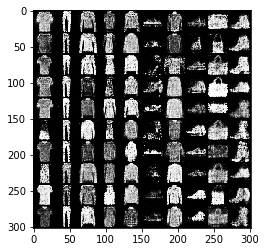

[Epoch 24/100] [Batch 0/600] [D loss: 1.334194] [G loss: 0.765928]
[Epoch 24/100] [Batch 1/600] [D loss: 1.344061] [G loss: 0.801281]
[Epoch 24/100] [Batch 2/600] [D loss: 1.307536] [G loss: 0.755445]
[Epoch 24/100] [Batch 3/600] [D loss: 1.329047] [G loss: 0.774695]
[Epoch 24/100] [Batch 4/600] [D loss: 1.364404] [G loss: 0.825286]
[Epoch 24/100] [Batch 5/600] [D loss: 1.342484] [G loss: 0.836212]
[Epoch 24/100] [Batch 6/600] [D loss: 1.353405] [G loss: 0.765850]
[Epoch 24/100] [Batch 7/600] [D loss: 1.407214] [G loss: 0.826137]
[Epoch 24/100] [Batch 8/600] [D loss: 1.385100] [G loss: 0.833212]
[Epoch 24/100] [Batch 9/600] [D loss: 1.367168] [G loss: 0.765220]
[Epoch 24/100] [Batch 10/600] [D loss: 1.414794] [G loss: 0.751916]
[Epoch 24/100] [Batch 11/600] [D loss: 1.358470] [G loss: 0.786723]
[Epoch 24/100] [Batch 12/600] [D loss: 1.348897] [G loss: 0.804765]
[Epoch 24/100] [Batch 13/600] [D loss: 1.388049] [G loss: 0.768140]
[Epoch 24/100] [Batch 14/600] [D loss: 1.400896] [G loss: 

[Epoch 24/100] [Batch 238/600] [D loss: 1.339731] [G loss: 0.745992]
[Epoch 24/100] [Batch 239/600] [D loss: 1.350072] [G loss: 0.756586]
[Epoch 24/100] [Batch 240/600] [D loss: 1.339642] [G loss: 0.807503]
[Epoch 24/100] [Batch 241/600] [D loss: 1.325233] [G loss: 0.752681]
[Epoch 24/100] [Batch 242/600] [D loss: 1.377799] [G loss: 0.783202]
[Epoch 24/100] [Batch 243/600] [D loss: 1.329385] [G loss: 0.777945]
[Epoch 24/100] [Batch 244/600] [D loss: 1.397484] [G loss: 0.745723]
[Epoch 24/100] [Batch 245/600] [D loss: 1.407754] [G loss: 0.802296]
[Epoch 24/100] [Batch 246/600] [D loss: 1.351265] [G loss: 0.765498]
[Epoch 24/100] [Batch 247/600] [D loss: 1.392609] [G loss: 0.746093]
[Epoch 24/100] [Batch 248/600] [D loss: 1.354795] [G loss: 0.763718]
[Epoch 24/100] [Batch 249/600] [D loss: 1.352899] [G loss: 0.759753]
[Epoch 24/100] [Batch 250/600] [D loss: 1.355383] [G loss: 0.730197]
[Epoch 24/100] [Batch 251/600] [D loss: 1.350204] [G loss: 0.756349]
[Epoch 24/100] [Batch 252/600] [D 

[Epoch 24/100] [Batch 474/600] [D loss: 1.367506] [G loss: 0.776576]
[Epoch 24/100] [Batch 475/600] [D loss: 1.388976] [G loss: 0.801790]
[Epoch 24/100] [Batch 476/600] [D loss: 1.360896] [G loss: 0.749885]
[Epoch 24/100] [Batch 477/600] [D loss: 1.356036] [G loss: 0.761509]
[Epoch 24/100] [Batch 478/600] [D loss: 1.348075] [G loss: 0.765019]
[Epoch 24/100] [Batch 479/600] [D loss: 1.333600] [G loss: 0.736030]
[Epoch 24/100] [Batch 480/600] [D loss: 1.367773] [G loss: 0.748169]
[Epoch 24/100] [Batch 481/600] [D loss: 1.384408] [G loss: 0.692390]
[Epoch 24/100] [Batch 482/600] [D loss: 1.383983] [G loss: 0.726763]
[Epoch 24/100] [Batch 483/600] [D loss: 1.337550] [G loss: 0.748168]
[Epoch 24/100] [Batch 484/600] [D loss: 1.327430] [G loss: 0.806334]
[Epoch 24/100] [Batch 485/600] [D loss: 1.347750] [G loss: 0.711610]
[Epoch 24/100] [Batch 486/600] [D loss: 1.346283] [G loss: 0.731883]
[Epoch 24/100] [Batch 487/600] [D loss: 1.327496] [G loss: 0.731639]
[Epoch 24/100] [Batch 488/600] [D 

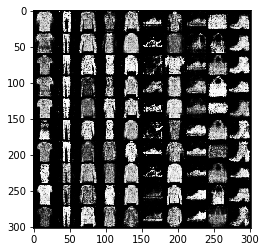

[Epoch 25/100] [Batch 0/600] [D loss: 1.377198] [G loss: 0.771096]
[Epoch 25/100] [Batch 1/600] [D loss: 1.380067] [G loss: 0.781922]
[Epoch 25/100] [Batch 2/600] [D loss: 1.359899] [G loss: 0.758198]
[Epoch 25/100] [Batch 3/600] [D loss: 1.367039] [G loss: 0.732426]
[Epoch 25/100] [Batch 4/600] [D loss: 1.366264] [G loss: 0.701024]
[Epoch 25/100] [Batch 5/600] [D loss: 1.376031] [G loss: 0.742924]
[Epoch 25/100] [Batch 6/600] [D loss: 1.362881] [G loss: 0.720346]
[Epoch 25/100] [Batch 7/600] [D loss: 1.344144] [G loss: 0.754467]
[Epoch 25/100] [Batch 8/600] [D loss: 1.396635] [G loss: 0.772057]
[Epoch 25/100] [Batch 9/600] [D loss: 1.363708] [G loss: 0.772680]
[Epoch 25/100] [Batch 10/600] [D loss: 1.391483] [G loss: 0.760502]
[Epoch 25/100] [Batch 11/600] [D loss: 1.360426] [G loss: 0.751090]
[Epoch 25/100] [Batch 12/600] [D loss: 1.343100] [G loss: 0.756247]
[Epoch 25/100] [Batch 13/600] [D loss: 1.392956] [G loss: 0.769813]
[Epoch 25/100] [Batch 14/600] [D loss: 1.346416] [G loss: 

[Epoch 25/100] [Batch 238/600] [D loss: 1.328766] [G loss: 0.776360]
[Epoch 25/100] [Batch 239/600] [D loss: 1.355430] [G loss: 0.760457]
[Epoch 25/100] [Batch 240/600] [D loss: 1.364262] [G loss: 0.770412]
[Epoch 25/100] [Batch 241/600] [D loss: 1.389765] [G loss: 0.759270]
[Epoch 25/100] [Batch 242/600] [D loss: 1.375146] [G loss: 0.742319]
[Epoch 25/100] [Batch 243/600] [D loss: 1.352920] [G loss: 0.713333]
[Epoch 25/100] [Batch 244/600] [D loss: 1.366506] [G loss: 0.759101]
[Epoch 25/100] [Batch 245/600] [D loss: 1.383483] [G loss: 0.757362]
[Epoch 25/100] [Batch 246/600] [D loss: 1.394676] [G loss: 0.800043]
[Epoch 25/100] [Batch 247/600] [D loss: 1.341614] [G loss: 0.793637]
[Epoch 25/100] [Batch 248/600] [D loss: 1.374147] [G loss: 0.769076]
[Epoch 25/100] [Batch 249/600] [D loss: 1.332945] [G loss: 0.724584]
[Epoch 25/100] [Batch 250/600] [D loss: 1.352636] [G loss: 0.725391]
[Epoch 25/100] [Batch 251/600] [D loss: 1.330433] [G loss: 0.735190]
[Epoch 25/100] [Batch 252/600] [D 

[Epoch 25/100] [Batch 474/600] [D loss: 1.313741] [G loss: 0.762011]
[Epoch 25/100] [Batch 475/600] [D loss: 1.367604] [G loss: 0.752687]
[Epoch 25/100] [Batch 476/600] [D loss: 1.387998] [G loss: 0.778203]
[Epoch 25/100] [Batch 477/600] [D loss: 1.351596] [G loss: 0.820357]
[Epoch 25/100] [Batch 478/600] [D loss: 1.330078] [G loss: 0.756913]
[Epoch 25/100] [Batch 479/600] [D loss: 1.350630] [G loss: 0.779168]
[Epoch 25/100] [Batch 480/600] [D loss: 1.381402] [G loss: 0.777808]
[Epoch 25/100] [Batch 481/600] [D loss: 1.363879] [G loss: 0.741589]
[Epoch 25/100] [Batch 482/600] [D loss: 1.321693] [G loss: 0.715174]
[Epoch 25/100] [Batch 483/600] [D loss: 1.337463] [G loss: 0.696078]
[Epoch 25/100] [Batch 484/600] [D loss: 1.343647] [G loss: 0.738475]
[Epoch 25/100] [Batch 485/600] [D loss: 1.369436] [G loss: 0.722391]
[Epoch 25/100] [Batch 486/600] [D loss: 1.367108] [G loss: 0.765102]
[Epoch 25/100] [Batch 487/600] [D loss: 1.381433] [G loss: 0.733403]
[Epoch 25/100] [Batch 488/600] [D 

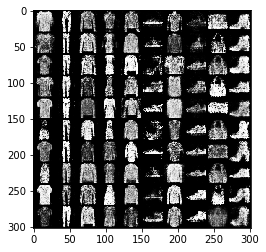

[Epoch 26/100] [Batch 0/600] [D loss: 1.341560] [G loss: 0.747655]
[Epoch 26/100] [Batch 1/600] [D loss: 1.361028] [G loss: 0.724950]
[Epoch 26/100] [Batch 2/600] [D loss: 1.308387] [G loss: 0.732629]
[Epoch 26/100] [Batch 3/600] [D loss: 1.345569] [G loss: 0.763686]
[Epoch 26/100] [Batch 4/600] [D loss: 1.321483] [G loss: 0.755199]
[Epoch 26/100] [Batch 5/600] [D loss: 1.314494] [G loss: 0.726317]
[Epoch 26/100] [Batch 6/600] [D loss: 1.389282] [G loss: 0.719797]
[Epoch 26/100] [Batch 7/600] [D loss: 1.322587] [G loss: 0.754739]
[Epoch 26/100] [Batch 8/600] [D loss: 1.340892] [G loss: 0.772265]
[Epoch 26/100] [Batch 9/600] [D loss: 1.358875] [G loss: 0.739497]
[Epoch 26/100] [Batch 10/600] [D loss: 1.359378] [G loss: 0.698128]
[Epoch 26/100] [Batch 11/600] [D loss: 1.392410] [G loss: 0.732331]
[Epoch 26/100] [Batch 12/600] [D loss: 1.343241] [G loss: 0.809570]
[Epoch 26/100] [Batch 13/600] [D loss: 1.343371] [G loss: 0.805594]
[Epoch 26/100] [Batch 14/600] [D loss: 1.375814] [G loss: 

[Epoch 26/100] [Batch 238/600] [D loss: 1.346052] [G loss: 0.724416]
[Epoch 26/100] [Batch 239/600] [D loss: 1.327142] [G loss: 0.734333]
[Epoch 26/100] [Batch 240/600] [D loss: 1.319167] [G loss: 0.760239]
[Epoch 26/100] [Batch 241/600] [D loss: 1.334909] [G loss: 0.757585]
[Epoch 26/100] [Batch 242/600] [D loss: 1.308373] [G loss: 0.766117]
[Epoch 26/100] [Batch 243/600] [D loss: 1.361399] [G loss: 0.760223]
[Epoch 26/100] [Batch 244/600] [D loss: 1.318856] [G loss: 0.712071]
[Epoch 26/100] [Batch 245/600] [D loss: 1.328239] [G loss: 0.729267]
[Epoch 26/100] [Batch 246/600] [D loss: 1.325290] [G loss: 0.728993]
[Epoch 26/100] [Batch 247/600] [D loss: 1.381484] [G loss: 0.777611]
[Epoch 26/100] [Batch 248/600] [D loss: 1.384339] [G loss: 0.854629]
[Epoch 26/100] [Batch 249/600] [D loss: 1.332285] [G loss: 0.837144]
[Epoch 26/100] [Batch 250/600] [D loss: 1.371572] [G loss: 0.741822]
[Epoch 26/100] [Batch 251/600] [D loss: 1.327966] [G loss: 0.729192]
[Epoch 26/100] [Batch 252/600] [D 

[Epoch 26/100] [Batch 474/600] [D loss: 1.370936] [G loss: 0.791202]
[Epoch 26/100] [Batch 475/600] [D loss: 1.349125] [G loss: 0.755358]
[Epoch 26/100] [Batch 476/600] [D loss: 1.356226] [G loss: 0.717197]
[Epoch 26/100] [Batch 477/600] [D loss: 1.334972] [G loss: 0.751157]
[Epoch 26/100] [Batch 478/600] [D loss: 1.362791] [G loss: 0.843910]
[Epoch 26/100] [Batch 479/600] [D loss: 1.332635] [G loss: 0.815773]
[Epoch 26/100] [Batch 480/600] [D loss: 1.375157] [G loss: 0.792938]
[Epoch 26/100] [Batch 481/600] [D loss: 1.341170] [G loss: 0.699772]
[Epoch 26/100] [Batch 482/600] [D loss: 1.363590] [G loss: 0.721513]
[Epoch 26/100] [Batch 483/600] [D loss: 1.376556] [G loss: 0.731872]
[Epoch 26/100] [Batch 484/600] [D loss: 1.352255] [G loss: 0.785809]
[Epoch 26/100] [Batch 485/600] [D loss: 1.349118] [G loss: 0.798275]
[Epoch 26/100] [Batch 486/600] [D loss: 1.393024] [G loss: 0.853539]
[Epoch 26/100] [Batch 487/600] [D loss: 1.354027] [G loss: 0.764526]
[Epoch 26/100] [Batch 488/600] [D 

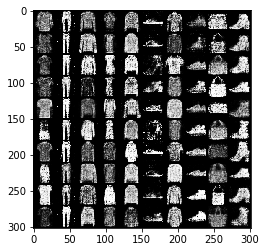

[Epoch 27/100] [Batch 0/600] [D loss: 1.318223] [G loss: 0.747725]
[Epoch 27/100] [Batch 1/600] [D loss: 1.367563] [G loss: 0.723466]
[Epoch 27/100] [Batch 2/600] [D loss: 1.314454] [G loss: 0.745513]
[Epoch 27/100] [Batch 3/600] [D loss: 1.367105] [G loss: 0.767355]
[Epoch 27/100] [Batch 4/600] [D loss: 1.359839] [G loss: 0.736666]
[Epoch 27/100] [Batch 5/600] [D loss: 1.393569] [G loss: 0.773139]
[Epoch 27/100] [Batch 6/600] [D loss: 1.337852] [G loss: 0.761740]
[Epoch 27/100] [Batch 7/600] [D loss: 1.343097] [G loss: 0.725998]
[Epoch 27/100] [Batch 8/600] [D loss: 1.384751] [G loss: 0.762641]
[Epoch 27/100] [Batch 9/600] [D loss: 1.397519] [G loss: 0.757698]
[Epoch 27/100] [Batch 10/600] [D loss: 1.344688] [G loss: 0.752961]
[Epoch 27/100] [Batch 11/600] [D loss: 1.340463] [G loss: 0.724757]
[Epoch 27/100] [Batch 12/600] [D loss: 1.364087] [G loss: 0.732315]
[Epoch 27/100] [Batch 13/600] [D loss: 1.330973] [G loss: 0.701413]
[Epoch 27/100] [Batch 14/600] [D loss: 1.335660] [G loss: 

[Epoch 27/100] [Batch 238/600] [D loss: 1.392635] [G loss: 0.748047]
[Epoch 27/100] [Batch 239/600] [D loss: 1.380148] [G loss: 0.764292]
[Epoch 27/100] [Batch 240/600] [D loss: 1.401864] [G loss: 0.818073]
[Epoch 27/100] [Batch 241/600] [D loss: 1.348269] [G loss: 0.773138]
[Epoch 27/100] [Batch 242/600] [D loss: 1.357495] [G loss: 0.742635]
[Epoch 27/100] [Batch 243/600] [D loss: 1.386646] [G loss: 0.765971]
[Epoch 27/100] [Batch 244/600] [D loss: 1.368599] [G loss: 0.765953]
[Epoch 27/100] [Batch 245/600] [D loss: 1.356283] [G loss: 0.802764]
[Epoch 27/100] [Batch 246/600] [D loss: 1.347076] [G loss: 0.730832]
[Epoch 27/100] [Batch 247/600] [D loss: 1.354365] [G loss: 0.745652]
[Epoch 27/100] [Batch 248/600] [D loss: 1.400896] [G loss: 0.736239]
[Epoch 27/100] [Batch 249/600] [D loss: 1.346741] [G loss: 0.740399]
[Epoch 27/100] [Batch 250/600] [D loss: 1.350030] [G loss: 0.760935]
[Epoch 27/100] [Batch 251/600] [D loss: 1.318213] [G loss: 0.744743]
[Epoch 27/100] [Batch 252/600] [D 

[Epoch 27/100] [Batch 474/600] [D loss: 1.333980] [G loss: 0.769225]
[Epoch 27/100] [Batch 475/600] [D loss: 1.330242] [G loss: 0.758214]
[Epoch 27/100] [Batch 476/600] [D loss: 1.383798] [G loss: 0.774752]
[Epoch 27/100] [Batch 477/600] [D loss: 1.380660] [G loss: 0.773560]
[Epoch 27/100] [Batch 478/600] [D loss: 1.397478] [G loss: 0.768618]
[Epoch 27/100] [Batch 479/600] [D loss: 1.398484] [G loss: 0.747964]
[Epoch 27/100] [Batch 480/600] [D loss: 1.346905] [G loss: 0.748867]
[Epoch 27/100] [Batch 481/600] [D loss: 1.376110] [G loss: 0.768955]
[Epoch 27/100] [Batch 482/600] [D loss: 1.349733] [G loss: 0.754481]
[Epoch 27/100] [Batch 483/600] [D loss: 1.319368] [G loss: 0.753597]
[Epoch 27/100] [Batch 484/600] [D loss: 1.356088] [G loss: 0.764183]
[Epoch 27/100] [Batch 485/600] [D loss: 1.347222] [G loss: 0.791596]
[Epoch 27/100] [Batch 486/600] [D loss: 1.339556] [G loss: 0.787930]
[Epoch 27/100] [Batch 487/600] [D loss: 1.350551] [G loss: 0.819700]
[Epoch 27/100] [Batch 488/600] [D 

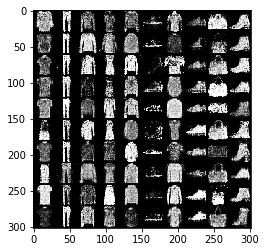

[Epoch 28/100] [Batch 0/600] [D loss: 1.368615] [G loss: 0.729729]
[Epoch 28/100] [Batch 1/600] [D loss: 1.396542] [G loss: 0.751802]
[Epoch 28/100] [Batch 2/600] [D loss: 1.403083] [G loss: 0.754864]
[Epoch 28/100] [Batch 3/600] [D loss: 1.369597] [G loss: 0.741310]
[Epoch 28/100] [Batch 4/600] [D loss: 1.377056] [G loss: 0.727202]
[Epoch 28/100] [Batch 5/600] [D loss: 1.337023] [G loss: 0.703169]
[Epoch 28/100] [Batch 6/600] [D loss: 1.347589] [G loss: 0.735600]
[Epoch 28/100] [Batch 7/600] [D loss: 1.337772] [G loss: 0.750749]
[Epoch 28/100] [Batch 8/600] [D loss: 1.322860] [G loss: 0.748074]
[Epoch 28/100] [Batch 9/600] [D loss: 1.337411] [G loss: 0.749916]
[Epoch 28/100] [Batch 10/600] [D loss: 1.316628] [G loss: 0.739919]
[Epoch 28/100] [Batch 11/600] [D loss: 1.352041] [G loss: 0.725876]
[Epoch 28/100] [Batch 12/600] [D loss: 1.323781] [G loss: 0.739331]
[Epoch 28/100] [Batch 13/600] [D loss: 1.384426] [G loss: 0.768837]
[Epoch 28/100] [Batch 14/600] [D loss: 1.370595] [G loss: 

[Epoch 28/100] [Batch 238/600] [D loss: 1.334944] [G loss: 0.744707]
[Epoch 28/100] [Batch 239/600] [D loss: 1.390477] [G loss: 0.829148]
[Epoch 28/100] [Batch 240/600] [D loss: 1.361406] [G loss: 0.816910]
[Epoch 28/100] [Batch 241/600] [D loss: 1.358048] [G loss: 0.803460]
[Epoch 28/100] [Batch 242/600] [D loss: 1.371985] [G loss: 0.754326]
[Epoch 28/100] [Batch 243/600] [D loss: 1.312946] [G loss: 0.718384]
[Epoch 28/100] [Batch 244/600] [D loss: 1.335406] [G loss: 0.752260]
[Epoch 28/100] [Batch 245/600] [D loss: 1.316152] [G loss: 0.764978]
[Epoch 28/100] [Batch 246/600] [D loss: 1.350266] [G loss: 0.818569]
[Epoch 28/100] [Batch 247/600] [D loss: 1.379994] [G loss: 0.828162]
[Epoch 28/100] [Batch 248/600] [D loss: 1.382340] [G loss: 0.751229]
[Epoch 28/100] [Batch 249/600] [D loss: 1.380927] [G loss: 0.743706]
[Epoch 28/100] [Batch 250/600] [D loss: 1.419598] [G loss: 0.775379]
[Epoch 28/100] [Batch 251/600] [D loss: 1.346309] [G loss: 0.745124]
[Epoch 28/100] [Batch 252/600] [D 

[Epoch 28/100] [Batch 474/600] [D loss: 1.374145] [G loss: 0.729575]
[Epoch 28/100] [Batch 475/600] [D loss: 1.374197] [G loss: 0.745844]
[Epoch 28/100] [Batch 476/600] [D loss: 1.359977] [G loss: 0.734165]
[Epoch 28/100] [Batch 477/600] [D loss: 1.353089] [G loss: 0.720177]
[Epoch 28/100] [Batch 478/600] [D loss: 1.368695] [G loss: 0.747403]
[Epoch 28/100] [Batch 479/600] [D loss: 1.331863] [G loss: 0.744742]
[Epoch 28/100] [Batch 480/600] [D loss: 1.361092] [G loss: 0.776073]
[Epoch 28/100] [Batch 481/600] [D loss: 1.433056] [G loss: 0.824978]
[Epoch 28/100] [Batch 482/600] [D loss: 1.386083] [G loss: 0.778710]
[Epoch 28/100] [Batch 483/600] [D loss: 1.406504] [G loss: 0.799448]
[Epoch 28/100] [Batch 484/600] [D loss: 1.370240] [G loss: 0.747711]
[Epoch 28/100] [Batch 485/600] [D loss: 1.371789] [G loss: 0.719485]
[Epoch 28/100] [Batch 486/600] [D loss: 1.378514] [G loss: 0.754791]
[Epoch 28/100] [Batch 487/600] [D loss: 1.356705] [G loss: 0.733976]
[Epoch 28/100] [Batch 488/600] [D 

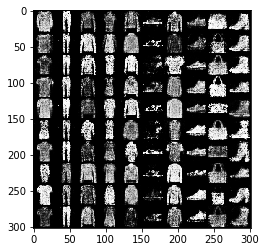

[Epoch 29/100] [Batch 0/600] [D loss: 1.348608] [G loss: 0.830446]
[Epoch 29/100] [Batch 1/600] [D loss: 1.361649] [G loss: 0.826807]
[Epoch 29/100] [Batch 2/600] [D loss: 1.325964] [G loss: 0.800007]
[Epoch 29/100] [Batch 3/600] [D loss: 1.380058] [G loss: 0.729792]
[Epoch 29/100] [Batch 4/600] [D loss: 1.349573] [G loss: 0.737787]
[Epoch 29/100] [Batch 5/600] [D loss: 1.318794] [G loss: 0.791663]
[Epoch 29/100] [Batch 6/600] [D loss: 1.386156] [G loss: 0.820730]
[Epoch 29/100] [Batch 7/600] [D loss: 1.359873] [G loss: 0.763659]
[Epoch 29/100] [Batch 8/600] [D loss: 1.358263] [G loss: 0.751674]
[Epoch 29/100] [Batch 9/600] [D loss: 1.327549] [G loss: 0.689192]
[Epoch 29/100] [Batch 10/600] [D loss: 1.363421] [G loss: 0.794799]
[Epoch 29/100] [Batch 11/600] [D loss: 1.361848] [G loss: 0.770795]
[Epoch 29/100] [Batch 12/600] [D loss: 1.366937] [G loss: 0.749120]
[Epoch 29/100] [Batch 13/600] [D loss: 1.373784] [G loss: 0.825331]
[Epoch 29/100] [Batch 14/600] [D loss: 1.338899] [G loss: 

[Epoch 29/100] [Batch 238/600] [D loss: 1.356942] [G loss: 0.710786]
[Epoch 29/100] [Batch 239/600] [D loss: 1.366912] [G loss: 0.744280]
[Epoch 29/100] [Batch 240/600] [D loss: 1.328686] [G loss: 0.787326]
[Epoch 29/100] [Batch 241/600] [D loss: 1.368359] [G loss: 0.786752]
[Epoch 29/100] [Batch 242/600] [D loss: 1.346670] [G loss: 0.812333]
[Epoch 29/100] [Batch 243/600] [D loss: 1.370909] [G loss: 0.746343]
[Epoch 29/100] [Batch 244/600] [D loss: 1.358717] [G loss: 0.755204]
[Epoch 29/100] [Batch 245/600] [D loss: 1.377421] [G loss: 0.768503]
[Epoch 29/100] [Batch 246/600] [D loss: 1.346984] [G loss: 0.744143]
[Epoch 29/100] [Batch 247/600] [D loss: 1.359694] [G loss: 0.722552]
[Epoch 29/100] [Batch 248/600] [D loss: 1.405719] [G loss: 0.763821]
[Epoch 29/100] [Batch 249/600] [D loss: 1.352745] [G loss: 0.782747]
[Epoch 29/100] [Batch 250/600] [D loss: 1.403329] [G loss: 0.825308]
[Epoch 29/100] [Batch 251/600] [D loss: 1.353337] [G loss: 0.771619]
[Epoch 29/100] [Batch 252/600] [D 

[Epoch 29/100] [Batch 474/600] [D loss: 1.365342] [G loss: 0.775661]
[Epoch 29/100] [Batch 475/600] [D loss: 1.364019] [G loss: 0.783556]
[Epoch 29/100] [Batch 476/600] [D loss: 1.323757] [G loss: 0.789981]
[Epoch 29/100] [Batch 477/600] [D loss: 1.332834] [G loss: 0.747713]
[Epoch 29/100] [Batch 478/600] [D loss: 1.336910] [G loss: 0.733800]
[Epoch 29/100] [Batch 479/600] [D loss: 1.321751] [G loss: 0.740267]
[Epoch 29/100] [Batch 480/600] [D loss: 1.347047] [G loss: 0.779109]
[Epoch 29/100] [Batch 481/600] [D loss: 1.384112] [G loss: 0.812373]
[Epoch 29/100] [Batch 482/600] [D loss: 1.331881] [G loss: 0.762090]
[Epoch 29/100] [Batch 483/600] [D loss: 1.390772] [G loss: 0.709853]
[Epoch 29/100] [Batch 484/600] [D loss: 1.422338] [G loss: 0.746718]
[Epoch 29/100] [Batch 485/600] [D loss: 1.404432] [G loss: 0.769528]
[Epoch 29/100] [Batch 486/600] [D loss: 1.368673] [G loss: 0.747871]
[Epoch 29/100] [Batch 487/600] [D loss: 1.361654] [G loss: 0.731954]
[Epoch 29/100] [Batch 488/600] [D 

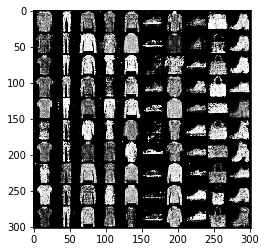

[Epoch 30/100] [Batch 0/600] [D loss: 1.338736] [G loss: 0.723254]
[Epoch 30/100] [Batch 1/600] [D loss: 1.318001] [G loss: 0.732434]
[Epoch 30/100] [Batch 2/600] [D loss: 1.357366] [G loss: 0.755031]
[Epoch 30/100] [Batch 3/600] [D loss: 1.390517] [G loss: 0.769622]
[Epoch 30/100] [Batch 4/600] [D loss: 1.361364] [G loss: 0.775772]
[Epoch 30/100] [Batch 5/600] [D loss: 1.393458] [G loss: 0.786737]
[Epoch 30/100] [Batch 6/600] [D loss: 1.363727] [G loss: 0.764246]
[Epoch 30/100] [Batch 7/600] [D loss: 1.347704] [G loss: 0.737468]
[Epoch 30/100] [Batch 8/600] [D loss: 1.309153] [G loss: 0.707988]
[Epoch 30/100] [Batch 9/600] [D loss: 1.375316] [G loss: 0.692177]
[Epoch 30/100] [Batch 10/600] [D loss: 1.358475] [G loss: 0.739769]
[Epoch 30/100] [Batch 11/600] [D loss: 1.367796] [G loss: 0.815361]
[Epoch 30/100] [Batch 12/600] [D loss: 1.399553] [G loss: 0.808640]
[Epoch 30/100] [Batch 13/600] [D loss: 1.377164] [G loss: 0.792527]
[Epoch 30/100] [Batch 14/600] [D loss: 1.395629] [G loss: 

[Epoch 30/100] [Batch 238/600] [D loss: 1.355038] [G loss: 0.787960]
[Epoch 30/100] [Batch 239/600] [D loss: 1.372469] [G loss: 0.761350]
[Epoch 30/100] [Batch 240/600] [D loss: 1.397923] [G loss: 0.789753]
[Epoch 30/100] [Batch 241/600] [D loss: 1.321790] [G loss: 0.772710]
[Epoch 30/100] [Batch 242/600] [D loss: 1.364832] [G loss: 0.777196]
[Epoch 30/100] [Batch 243/600] [D loss: 1.385601] [G loss: 0.754940]
[Epoch 30/100] [Batch 244/600] [D loss: 1.380320] [G loss: 0.767558]
[Epoch 30/100] [Batch 245/600] [D loss: 1.361026] [G loss: 0.752548]
[Epoch 30/100] [Batch 246/600] [D loss: 1.390476] [G loss: 0.747282]
[Epoch 30/100] [Batch 247/600] [D loss: 1.370924] [G loss: 0.771620]
[Epoch 30/100] [Batch 248/600] [D loss: 1.432718] [G loss: 0.806680]
[Epoch 30/100] [Batch 249/600] [D loss: 1.352554] [G loss: 0.780846]
[Epoch 30/100] [Batch 250/600] [D loss: 1.394117] [G loss: 0.746221]
[Epoch 30/100] [Batch 251/600] [D loss: 1.346836] [G loss: 0.723907]
[Epoch 30/100] [Batch 252/600] [D 

[Epoch 30/100] [Batch 474/600] [D loss: 1.358649] [G loss: 0.737984]
[Epoch 30/100] [Batch 475/600] [D loss: 1.342236] [G loss: 0.745229]
[Epoch 30/100] [Batch 476/600] [D loss: 1.331284] [G loss: 0.723132]
[Epoch 30/100] [Batch 477/600] [D loss: 1.339073] [G loss: 0.737848]
[Epoch 30/100] [Batch 478/600] [D loss: 1.367675] [G loss: 0.843909]
[Epoch 30/100] [Batch 479/600] [D loss: 1.347611] [G loss: 0.815508]
[Epoch 30/100] [Batch 480/600] [D loss: 1.353349] [G loss: 0.756697]
[Epoch 30/100] [Batch 481/600] [D loss: 1.344842] [G loss: 0.711299]
[Epoch 30/100] [Batch 482/600] [D loss: 1.399461] [G loss: 0.715899]
[Epoch 30/100] [Batch 483/600] [D loss: 1.344724] [G loss: 0.719051]
[Epoch 30/100] [Batch 484/600] [D loss: 1.381007] [G loss: 0.743402]
[Epoch 30/100] [Batch 485/600] [D loss: 1.375295] [G loss: 0.768951]
[Epoch 30/100] [Batch 486/600] [D loss: 1.395932] [G loss: 0.780190]
[Epoch 30/100] [Batch 487/600] [D loss: 1.363966] [G loss: 0.782963]
[Epoch 30/100] [Batch 488/600] [D 

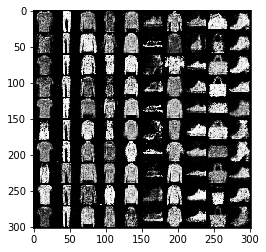

[Epoch 31/100] [Batch 0/600] [D loss: 1.371607] [G loss: 0.747169]
[Epoch 31/100] [Batch 1/600] [D loss: 1.366594] [G loss: 0.727178]
[Epoch 31/100] [Batch 2/600] [D loss: 1.387556] [G loss: 0.752573]
[Epoch 31/100] [Batch 3/600] [D loss: 1.324260] [G loss: 0.744480]
[Epoch 31/100] [Batch 4/600] [D loss: 1.364935] [G loss: 0.752822]
[Epoch 31/100] [Batch 5/600] [D loss: 1.358822] [G loss: 0.755546]
[Epoch 31/100] [Batch 6/600] [D loss: 1.354015] [G loss: 0.738594]
[Epoch 31/100] [Batch 7/600] [D loss: 1.327518] [G loss: 0.694982]
[Epoch 31/100] [Batch 8/600] [D loss: 1.290942] [G loss: 0.695317]
[Epoch 31/100] [Batch 9/600] [D loss: 1.377027] [G loss: 0.724295]
[Epoch 31/100] [Batch 10/600] [D loss: 1.354585] [G loss: 0.765988]
[Epoch 31/100] [Batch 11/600] [D loss: 1.341088] [G loss: 0.787482]
[Epoch 31/100] [Batch 12/600] [D loss: 1.379138] [G loss: 0.788551]
[Epoch 31/100] [Batch 13/600] [D loss: 1.414512] [G loss: 0.809856]
[Epoch 31/100] [Batch 14/600] [D loss: 1.409576] [G loss: 

[Epoch 31/100] [Batch 238/600] [D loss: 1.365436] [G loss: 0.719178]
[Epoch 31/100] [Batch 239/600] [D loss: 1.384377] [G loss: 0.735318]
[Epoch 31/100] [Batch 240/600] [D loss: 1.365457] [G loss: 0.753780]
[Epoch 31/100] [Batch 241/600] [D loss: 1.373152] [G loss: 0.748661]
[Epoch 31/100] [Batch 242/600] [D loss: 1.353494] [G loss: 0.764751]
[Epoch 31/100] [Batch 243/600] [D loss: 1.365747] [G loss: 0.749489]
[Epoch 31/100] [Batch 244/600] [D loss: 1.371177] [G loss: 0.749885]
[Epoch 31/100] [Batch 245/600] [D loss: 1.335663] [G loss: 0.732977]
[Epoch 31/100] [Batch 246/600] [D loss: 1.368581] [G loss: 0.737934]
[Epoch 31/100] [Batch 247/600] [D loss: 1.353438] [G loss: 0.716835]
[Epoch 31/100] [Batch 248/600] [D loss: 1.362227] [G loss: 0.755344]
[Epoch 31/100] [Batch 249/600] [D loss: 1.406147] [G loss: 0.809758]
[Epoch 31/100] [Batch 250/600] [D loss: 1.379007] [G loss: 0.807928]
[Epoch 31/100] [Batch 251/600] [D loss: 1.331810] [G loss: 0.749860]
[Epoch 31/100] [Batch 252/600] [D 

[Epoch 31/100] [Batch 474/600] [D loss: 1.382814] [G loss: 0.721514]
[Epoch 31/100] [Batch 475/600] [D loss: 1.322528] [G loss: 0.757546]
[Epoch 31/100] [Batch 476/600] [D loss: 1.360230] [G loss: 0.763259]
[Epoch 31/100] [Batch 477/600] [D loss: 1.371362] [G loss: 0.774179]
[Epoch 31/100] [Batch 478/600] [D loss: 1.348447] [G loss: 0.771151]
[Epoch 31/100] [Batch 479/600] [D loss: 1.368804] [G loss: 0.756433]
[Epoch 31/100] [Batch 480/600] [D loss: 1.343141] [G loss: 0.691134]
[Epoch 31/100] [Batch 481/600] [D loss: 1.384356] [G loss: 0.716047]
[Epoch 31/100] [Batch 482/600] [D loss: 1.357893] [G loss: 0.701650]
[Epoch 31/100] [Batch 483/600] [D loss: 1.336051] [G loss: 0.695181]
[Epoch 31/100] [Batch 484/600] [D loss: 1.363328] [G loss: 0.720159]
[Epoch 31/100] [Batch 485/600] [D loss: 1.329226] [G loss: 0.779101]
[Epoch 31/100] [Batch 486/600] [D loss: 1.397466] [G loss: 0.819474]
[Epoch 31/100] [Batch 487/600] [D loss: 1.380825] [G loss: 0.764749]
[Epoch 31/100] [Batch 488/600] [D 

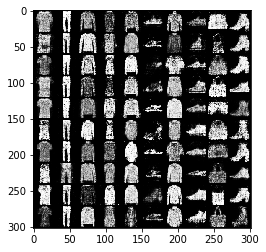

[Epoch 32/100] [Batch 0/600] [D loss: 1.395105] [G loss: 0.761067]
[Epoch 32/100] [Batch 1/600] [D loss: 1.369435] [G loss: 0.788617]
[Epoch 32/100] [Batch 2/600] [D loss: 1.423114] [G loss: 0.786928]
[Epoch 32/100] [Batch 3/600] [D loss: 1.421321] [G loss: 0.785600]
[Epoch 32/100] [Batch 4/600] [D loss: 1.376958] [G loss: 0.755541]
[Epoch 32/100] [Batch 5/600] [D loss: 1.373885] [G loss: 0.709099]
[Epoch 32/100] [Batch 6/600] [D loss: 1.390375] [G loss: 0.729328]
[Epoch 32/100] [Batch 7/600] [D loss: 1.382092] [G loss: 0.725872]
[Epoch 32/100] [Batch 8/600] [D loss: 1.354508] [G loss: 0.693550]
[Epoch 32/100] [Batch 9/600] [D loss: 1.397391] [G loss: 0.712113]
[Epoch 32/100] [Batch 10/600] [D loss: 1.370003] [G loss: 0.739231]
[Epoch 32/100] [Batch 11/600] [D loss: 1.347419] [G loss: 0.715759]
[Epoch 32/100] [Batch 12/600] [D loss: 1.340614] [G loss: 0.712549]
[Epoch 32/100] [Batch 13/600] [D loss: 1.349530] [G loss: 0.685077]
[Epoch 32/100] [Batch 14/600] [D loss: 1.403499] [G loss: 

[Epoch 32/100] [Batch 238/600] [D loss: 1.332463] [G loss: 0.714075]
[Epoch 32/100] [Batch 239/600] [D loss: 1.359258] [G loss: 0.745276]
[Epoch 32/100] [Batch 240/600] [D loss: 1.339463] [G loss: 0.738243]
[Epoch 32/100] [Batch 241/600] [D loss: 1.335187] [G loss: 0.765610]
[Epoch 32/100] [Batch 242/600] [D loss: 1.337671] [G loss: 0.731728]
[Epoch 32/100] [Batch 243/600] [D loss: 1.356722] [G loss: 0.744107]
[Epoch 32/100] [Batch 244/600] [D loss: 1.383787] [G loss: 0.767989]
[Epoch 32/100] [Batch 245/600] [D loss: 1.412853] [G loss: 0.805127]
[Epoch 32/100] [Batch 246/600] [D loss: 1.359556] [G loss: 0.759455]
[Epoch 32/100] [Batch 247/600] [D loss: 1.388864] [G loss: 0.714013]
[Epoch 32/100] [Batch 248/600] [D loss: 1.397429] [G loss: 0.727163]
[Epoch 32/100] [Batch 249/600] [D loss: 1.339693] [G loss: 0.744848]
[Epoch 32/100] [Batch 250/600] [D loss: 1.343043] [G loss: 0.762330]
[Epoch 32/100] [Batch 251/600] [D loss: 1.341553] [G loss: 0.768678]
[Epoch 32/100] [Batch 252/600] [D 

[Epoch 32/100] [Batch 474/600] [D loss: 1.332537] [G loss: 0.747031]
[Epoch 32/100] [Batch 475/600] [D loss: 1.389364] [G loss: 0.748680]
[Epoch 32/100] [Batch 476/600] [D loss: 1.383152] [G loss: 0.739802]
[Epoch 32/100] [Batch 477/600] [D loss: 1.351070] [G loss: 0.754099]
[Epoch 32/100] [Batch 478/600] [D loss: 1.350954] [G loss: 0.753382]
[Epoch 32/100] [Batch 479/600] [D loss: 1.309650] [G loss: 0.726995]
[Epoch 32/100] [Batch 480/600] [D loss: 1.381471] [G loss: 0.738905]
[Epoch 32/100] [Batch 481/600] [D loss: 1.363154] [G loss: 0.719778]
[Epoch 32/100] [Batch 482/600] [D loss: 1.374007] [G loss: 0.752249]
[Epoch 32/100] [Batch 483/600] [D loss: 1.428210] [G loss: 0.787758]
[Epoch 32/100] [Batch 484/600] [D loss: 1.384800] [G loss: 0.770300]
[Epoch 32/100] [Batch 485/600] [D loss: 1.359025] [G loss: 0.775593]
[Epoch 32/100] [Batch 486/600] [D loss: 1.346884] [G loss: 0.724277]
[Epoch 32/100] [Batch 487/600] [D loss: 1.341304] [G loss: 0.721906]
[Epoch 32/100] [Batch 488/600] [D 

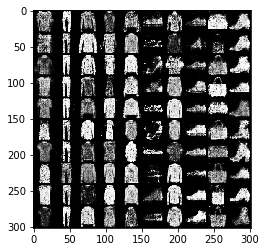

[Epoch 33/100] [Batch 0/600] [D loss: 1.376810] [G loss: 0.785287]
[Epoch 33/100] [Batch 1/600] [D loss: 1.396409] [G loss: 0.740640]
[Epoch 33/100] [Batch 2/600] [D loss: 1.401925] [G loss: 0.712450]
[Epoch 33/100] [Batch 3/600] [D loss: 1.387538] [G loss: 0.784808]
[Epoch 33/100] [Batch 4/600] [D loss: 1.337101] [G loss: 0.767336]
[Epoch 33/100] [Batch 5/600] [D loss: 1.394577] [G loss: 0.804197]
[Epoch 33/100] [Batch 6/600] [D loss: 1.363275] [G loss: 0.766563]
[Epoch 33/100] [Batch 7/600] [D loss: 1.356940] [G loss: 0.785584]
[Epoch 33/100] [Batch 8/600] [D loss: 1.349780] [G loss: 0.739130]
[Epoch 33/100] [Batch 9/600] [D loss: 1.363850] [G loss: 0.744889]
[Epoch 33/100] [Batch 10/600] [D loss: 1.410613] [G loss: 0.721024]
[Epoch 33/100] [Batch 11/600] [D loss: 1.414827] [G loss: 0.797811]
[Epoch 33/100] [Batch 12/600] [D loss: 1.385184] [G loss: 0.754921]
[Epoch 33/100] [Batch 13/600] [D loss: 1.394745] [G loss: 0.807866]
[Epoch 33/100] [Batch 14/600] [D loss: 1.380247] [G loss: 

[Epoch 33/100] [Batch 238/600] [D loss: 1.371064] [G loss: 0.722582]
[Epoch 33/100] [Batch 239/600] [D loss: 1.402907] [G loss: 0.746813]
[Epoch 33/100] [Batch 240/600] [D loss: 1.372270] [G loss: 0.761874]
[Epoch 33/100] [Batch 241/600] [D loss: 1.353617] [G loss: 0.744310]
[Epoch 33/100] [Batch 242/600] [D loss: 1.367294] [G loss: 0.706496]
[Epoch 33/100] [Batch 243/600] [D loss: 1.383819] [G loss: 0.726273]
[Epoch 33/100] [Batch 244/600] [D loss: 1.374224] [G loss: 0.722190]
[Epoch 33/100] [Batch 245/600] [D loss: 1.401863] [G loss: 0.756572]
[Epoch 33/100] [Batch 246/600] [D loss: 1.363446] [G loss: 0.772173]
[Epoch 33/100] [Batch 247/600] [D loss: 1.331607] [G loss: 0.745845]
[Epoch 33/100] [Batch 248/600] [D loss: 1.341958] [G loss: 0.684654]
[Epoch 33/100] [Batch 249/600] [D loss: 1.369572] [G loss: 0.719042]
[Epoch 33/100] [Batch 250/600] [D loss: 1.354208] [G loss: 0.721293]
[Epoch 33/100] [Batch 251/600] [D loss: 1.356158] [G loss: 0.747976]
[Epoch 33/100] [Batch 252/600] [D 

[Epoch 33/100] [Batch 474/600] [D loss: 1.359445] [G loss: 0.756968]
[Epoch 33/100] [Batch 475/600] [D loss: 1.356240] [G loss: 0.743199]
[Epoch 33/100] [Batch 476/600] [D loss: 1.392683] [G loss: 0.753540]
[Epoch 33/100] [Batch 477/600] [D loss: 1.407269] [G loss: 0.767053]
[Epoch 33/100] [Batch 478/600] [D loss: 1.347892] [G loss: 0.775966]
[Epoch 33/100] [Batch 479/600] [D loss: 1.349902] [G loss: 0.762930]
[Epoch 33/100] [Batch 480/600] [D loss: 1.327968] [G loss: 0.765594]
[Epoch 33/100] [Batch 481/600] [D loss: 1.321256] [G loss: 0.770636]
[Epoch 33/100] [Batch 482/600] [D loss: 1.374308] [G loss: 0.740946]
[Epoch 33/100] [Batch 483/600] [D loss: 1.378383] [G loss: 0.760349]
[Epoch 33/100] [Batch 484/600] [D loss: 1.337119] [G loss: 0.722740]
[Epoch 33/100] [Batch 485/600] [D loss: 1.383399] [G loss: 0.740739]
[Epoch 33/100] [Batch 486/600] [D loss: 1.357909] [G loss: 0.713171]
[Epoch 33/100] [Batch 487/600] [D loss: 1.390177] [G loss: 0.746643]
[Epoch 33/100] [Batch 488/600] [D 

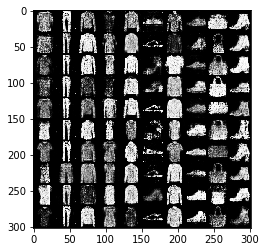

[Epoch 34/100] [Batch 0/600] [D loss: 1.346840] [G loss: 0.761408]
[Epoch 34/100] [Batch 1/600] [D loss: 1.334577] [G loss: 0.756258]
[Epoch 34/100] [Batch 2/600] [D loss: 1.350713] [G loss: 0.746642]
[Epoch 34/100] [Batch 3/600] [D loss: 1.367217] [G loss: 0.753716]
[Epoch 34/100] [Batch 4/600] [D loss: 1.399817] [G loss: 0.772705]
[Epoch 34/100] [Batch 5/600] [D loss: 1.410745] [G loss: 0.808127]
[Epoch 34/100] [Batch 6/600] [D loss: 1.357622] [G loss: 0.784171]
[Epoch 34/100] [Batch 7/600] [D loss: 1.368009] [G loss: 0.744475]
[Epoch 34/100] [Batch 8/600] [D loss: 1.412565] [G loss: 0.766285]
[Epoch 34/100] [Batch 9/600] [D loss: 1.418565] [G loss: 0.785909]
[Epoch 34/100] [Batch 10/600] [D loss: 1.401531] [G loss: 0.786377]
[Epoch 34/100] [Batch 11/600] [D loss: 1.384522] [G loss: 0.727660]
[Epoch 34/100] [Batch 12/600] [D loss: 1.397102] [G loss: 0.734450]
[Epoch 34/100] [Batch 13/600] [D loss: 1.384911] [G loss: 0.777798]
[Epoch 34/100] [Batch 14/600] [D loss: 1.376757] [G loss: 

[Epoch 34/100] [Batch 238/600] [D loss: 1.377185] [G loss: 0.740169]
[Epoch 34/100] [Batch 239/600] [D loss: 1.359540] [G loss: 0.745604]
[Epoch 34/100] [Batch 240/600] [D loss: 1.336872] [G loss: 0.706588]
[Epoch 34/100] [Batch 241/600] [D loss: 1.319439] [G loss: 0.725159]
[Epoch 34/100] [Batch 242/600] [D loss: 1.335464] [G loss: 0.759062]
[Epoch 34/100] [Batch 243/600] [D loss: 1.366349] [G loss: 0.716712]
[Epoch 34/100] [Batch 244/600] [D loss: 1.342083] [G loss: 0.758301]
[Epoch 34/100] [Batch 245/600] [D loss: 1.360871] [G loss: 0.738113]
[Epoch 34/100] [Batch 246/600] [D loss: 1.335896] [G loss: 0.760852]
[Epoch 34/100] [Batch 247/600] [D loss: 1.363208] [G loss: 0.767335]
[Epoch 34/100] [Batch 248/600] [D loss: 1.347073] [G loss: 0.751952]
[Epoch 34/100] [Batch 249/600] [D loss: 1.370908] [G loss: 0.770642]
[Epoch 34/100] [Batch 250/600] [D loss: 1.362993] [G loss: 0.730557]
[Epoch 34/100] [Batch 251/600] [D loss: 1.374032] [G loss: 0.777799]
[Epoch 34/100] [Batch 252/600] [D 

[Epoch 34/100] [Batch 474/600] [D loss: 1.361616] [G loss: 0.753431]
[Epoch 34/100] [Batch 475/600] [D loss: 1.343341] [G loss: 0.700287]
[Epoch 34/100] [Batch 476/600] [D loss: 1.323337] [G loss: 0.711104]
[Epoch 34/100] [Batch 477/600] [D loss: 1.359313] [G loss: 0.733059]
[Epoch 34/100] [Batch 478/600] [D loss: 1.384213] [G loss: 0.704010]
[Epoch 34/100] [Batch 479/600] [D loss: 1.373016] [G loss: 0.741020]
[Epoch 34/100] [Batch 480/600] [D loss: 1.379746] [G loss: 0.725441]
[Epoch 34/100] [Batch 481/600] [D loss: 1.321249] [G loss: 0.779315]
[Epoch 34/100] [Batch 482/600] [D loss: 1.405645] [G loss: 0.806515]
[Epoch 34/100] [Batch 483/600] [D loss: 1.379285] [G loss: 0.789649]
[Epoch 34/100] [Batch 484/600] [D loss: 1.362597] [G loss: 0.740996]
[Epoch 34/100] [Batch 485/600] [D loss: 1.357322] [G loss: 0.729469]
[Epoch 34/100] [Batch 486/600] [D loss: 1.369105] [G loss: 0.726652]
[Epoch 34/100] [Batch 487/600] [D loss: 1.427930] [G loss: 0.711138]
[Epoch 34/100] [Batch 488/600] [D 

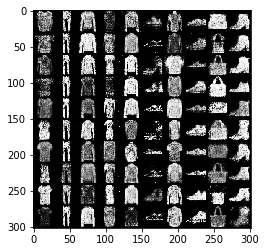

[Epoch 35/100] [Batch 0/600] [D loss: 1.325780] [G loss: 0.733282]
[Epoch 35/100] [Batch 1/600] [D loss: 1.373245] [G loss: 0.759396]
[Epoch 35/100] [Batch 2/600] [D loss: 1.379633] [G loss: 0.746500]
[Epoch 35/100] [Batch 3/600] [D loss: 1.369700] [G loss: 0.736510]
[Epoch 35/100] [Batch 4/600] [D loss: 1.308853] [G loss: 0.726752]
[Epoch 35/100] [Batch 5/600] [D loss: 1.346429] [G loss: 0.735468]
[Epoch 35/100] [Batch 6/600] [D loss: 1.342693] [G loss: 0.704521]
[Epoch 35/100] [Batch 7/600] [D loss: 1.348273] [G loss: 0.732711]
[Epoch 35/100] [Batch 8/600] [D loss: 1.324306] [G loss: 0.721558]
[Epoch 35/100] [Batch 9/600] [D loss: 1.374308] [G loss: 0.772534]
[Epoch 35/100] [Batch 10/600] [D loss: 1.352645] [G loss: 0.819781]
[Epoch 35/100] [Batch 11/600] [D loss: 1.363483] [G loss: 0.832004]
[Epoch 35/100] [Batch 12/600] [D loss: 1.330114] [G loss: 0.742047]
[Epoch 35/100] [Batch 13/600] [D loss: 1.339853] [G loss: 0.693145]
[Epoch 35/100] [Batch 14/600] [D loss: 1.401626] [G loss: 

[Epoch 35/100] [Batch 238/600] [D loss: 1.382162] [G loss: 0.733868]
[Epoch 35/100] [Batch 239/600] [D loss: 1.367607] [G loss: 0.724463]
[Epoch 35/100] [Batch 240/600] [D loss: 1.386434] [G loss: 0.758814]
[Epoch 35/100] [Batch 241/600] [D loss: 1.356899] [G loss: 0.763958]
[Epoch 35/100] [Batch 242/600] [D loss: 1.364300] [G loss: 0.717808]
[Epoch 35/100] [Batch 243/600] [D loss: 1.375236] [G loss: 0.721116]
[Epoch 35/100] [Batch 244/600] [D loss: 1.375812] [G loss: 0.747847]
[Epoch 35/100] [Batch 245/600] [D loss: 1.374251] [G loss: 0.723217]
[Epoch 35/100] [Batch 246/600] [D loss: 1.341704] [G loss: 0.713331]
[Epoch 35/100] [Batch 247/600] [D loss: 1.374319] [G loss: 0.718570]
[Epoch 35/100] [Batch 248/600] [D loss: 1.376767] [G loss: 0.735597]
[Epoch 35/100] [Batch 249/600] [D loss: 1.367662] [G loss: 0.745834]
[Epoch 35/100] [Batch 250/600] [D loss: 1.360787] [G loss: 0.716162]
[Epoch 35/100] [Batch 251/600] [D loss: 1.329754] [G loss: 0.691335]
[Epoch 35/100] [Batch 252/600] [D 

[Epoch 35/100] [Batch 474/600] [D loss: 1.390407] [G loss: 0.774249]
[Epoch 35/100] [Batch 475/600] [D loss: 1.357715] [G loss: 0.753171]
[Epoch 35/100] [Batch 476/600] [D loss: 1.389773] [G loss: 0.793559]
[Epoch 35/100] [Batch 477/600] [D loss: 1.399727] [G loss: 0.777819]
[Epoch 35/100] [Batch 478/600] [D loss: 1.336902] [G loss: 0.760000]
[Epoch 35/100] [Batch 479/600] [D loss: 1.345740] [G loss: 0.741961]
[Epoch 35/100] [Batch 480/600] [D loss: 1.378511] [G loss: 0.721771]
[Epoch 35/100] [Batch 481/600] [D loss: 1.365716] [G loss: 0.742308]
[Epoch 35/100] [Batch 482/600] [D loss: 1.359041] [G loss: 0.709078]
[Epoch 35/100] [Batch 483/600] [D loss: 1.366588] [G loss: 0.700848]
[Epoch 35/100] [Batch 484/600] [D loss: 1.405333] [G loss: 0.709626]
[Epoch 35/100] [Batch 485/600] [D loss: 1.391156] [G loss: 0.728743]
[Epoch 35/100] [Batch 486/600] [D loss: 1.385143] [G loss: 0.738626]
[Epoch 35/100] [Batch 487/600] [D loss: 1.358626] [G loss: 0.743744]
[Epoch 35/100] [Batch 488/600] [D 

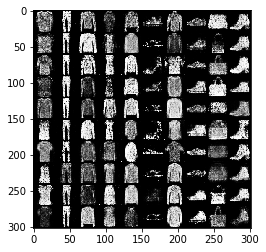

[Epoch 36/100] [Batch 0/600] [D loss: 1.370009] [G loss: 0.749882]
[Epoch 36/100] [Batch 1/600] [D loss: 1.401689] [G loss: 0.791199]
[Epoch 36/100] [Batch 2/600] [D loss: 1.388408] [G loss: 0.770499]
[Epoch 36/100] [Batch 3/600] [D loss: 1.322059] [G loss: 0.738635]
[Epoch 36/100] [Batch 4/600] [D loss: 1.367806] [G loss: 0.742439]
[Epoch 36/100] [Batch 5/600] [D loss: 1.341537] [G loss: 0.770670]
[Epoch 36/100] [Batch 6/600] [D loss: 1.378133] [G loss: 0.759739]
[Epoch 36/100] [Batch 7/600] [D loss: 1.330570] [G loss: 0.718427]
[Epoch 36/100] [Batch 8/600] [D loss: 1.344307] [G loss: 0.696143]
[Epoch 36/100] [Batch 9/600] [D loss: 1.396196] [G loss: 0.703653]
[Epoch 36/100] [Batch 10/600] [D loss: 1.321521] [G loss: 0.689216]
[Epoch 36/100] [Batch 11/600] [D loss: 1.344203] [G loss: 0.682188]
[Epoch 36/100] [Batch 12/600] [D loss: 1.355621] [G loss: 0.731846]
[Epoch 36/100] [Batch 13/600] [D loss: 1.376300] [G loss: 0.725345]
[Epoch 36/100] [Batch 14/600] [D loss: 1.380012] [G loss: 

[Epoch 36/100] [Batch 238/600] [D loss: 1.350100] [G loss: 0.756365]
[Epoch 36/100] [Batch 239/600] [D loss: 1.378625] [G loss: 0.735660]
[Epoch 36/100] [Batch 240/600] [D loss: 1.376448] [G loss: 0.732941]
[Epoch 36/100] [Batch 241/600] [D loss: 1.387803] [G loss: 0.757140]
[Epoch 36/100] [Batch 242/600] [D loss: 1.373106] [G loss: 0.732020]
[Epoch 36/100] [Batch 243/600] [D loss: 1.410217] [G loss: 0.735465]
[Epoch 36/100] [Batch 244/600] [D loss: 1.384496] [G loss: 0.746578]
[Epoch 36/100] [Batch 245/600] [D loss: 1.378435] [G loss: 0.716195]
[Epoch 36/100] [Batch 246/600] [D loss: 1.358751] [G loss: 0.718578]
[Epoch 36/100] [Batch 247/600] [D loss: 1.339706] [G loss: 0.690130]
[Epoch 36/100] [Batch 248/600] [D loss: 1.382640] [G loss: 0.725250]
[Epoch 36/100] [Batch 249/600] [D loss: 1.356119] [G loss: 0.743672]
[Epoch 36/100] [Batch 250/600] [D loss: 1.349136] [G loss: 0.729959]
[Epoch 36/100] [Batch 251/600] [D loss: 1.398698] [G loss: 0.750841]
[Epoch 36/100] [Batch 252/600] [D 

[Epoch 36/100] [Batch 474/600] [D loss: 1.402760] [G loss: 0.761765]
[Epoch 36/100] [Batch 475/600] [D loss: 1.331708] [G loss: 0.760974]
[Epoch 36/100] [Batch 476/600] [D loss: 1.347873] [G loss: 0.736443]
[Epoch 36/100] [Batch 477/600] [D loss: 1.382245] [G loss: 0.757444]
[Epoch 36/100] [Batch 478/600] [D loss: 1.394590] [G loss: 0.794762]
[Epoch 36/100] [Batch 479/600] [D loss: 1.342773] [G loss: 0.781682]
[Epoch 36/100] [Batch 480/600] [D loss: 1.422406] [G loss: 0.775446]
[Epoch 36/100] [Batch 481/600] [D loss: 1.345348] [G loss: 0.741833]
[Epoch 36/100] [Batch 482/600] [D loss: 1.369284] [G loss: 0.741078]
[Epoch 36/100] [Batch 483/600] [D loss: 1.354236] [G loss: 0.747919]
[Epoch 36/100] [Batch 484/600] [D loss: 1.355574] [G loss: 0.763126]
[Epoch 36/100] [Batch 485/600] [D loss: 1.374827] [G loss: 0.791469]
[Epoch 36/100] [Batch 486/600] [D loss: 1.328728] [G loss: 0.739077]
[Epoch 36/100] [Batch 487/600] [D loss: 1.319908] [G loss: 0.705703]
[Epoch 36/100] [Batch 488/600] [D 

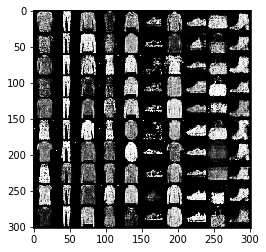

[Epoch 37/100] [Batch 0/600] [D loss: 1.396288] [G loss: 0.734561]
[Epoch 37/100] [Batch 1/600] [D loss: 1.388099] [G loss: 0.748767]
[Epoch 37/100] [Batch 2/600] [D loss: 1.365453] [G loss: 0.733794]
[Epoch 37/100] [Batch 3/600] [D loss: 1.352673] [G loss: 0.723952]
[Epoch 37/100] [Batch 4/600] [D loss: 1.352194] [G loss: 0.729760]
[Epoch 37/100] [Batch 5/600] [D loss: 1.352930] [G loss: 0.690844]
[Epoch 37/100] [Batch 6/600] [D loss: 1.333228] [G loss: 0.732737]
[Epoch 37/100] [Batch 7/600] [D loss: 1.392026] [G loss: 0.741040]
[Epoch 37/100] [Batch 8/600] [D loss: 1.328236] [G loss: 0.724365]
[Epoch 37/100] [Batch 9/600] [D loss: 1.359218] [G loss: 0.717503]
[Epoch 37/100] [Batch 10/600] [D loss: 1.348346] [G loss: 0.749359]
[Epoch 37/100] [Batch 11/600] [D loss: 1.345463] [G loss: 0.759441]
[Epoch 37/100] [Batch 12/600] [D loss: 1.369583] [G loss: 0.750627]
[Epoch 37/100] [Batch 13/600] [D loss: 1.348842] [G loss: 0.757456]
[Epoch 37/100] [Batch 14/600] [D loss: 1.344296] [G loss: 

[Epoch 37/100] [Batch 238/600] [D loss: 1.343755] [G loss: 0.734229]
[Epoch 37/100] [Batch 239/600] [D loss: 1.369293] [G loss: 0.738211]
[Epoch 37/100] [Batch 240/600] [D loss: 1.382332] [G loss: 0.758691]
[Epoch 37/100] [Batch 241/600] [D loss: 1.398902] [G loss: 0.759904]
[Epoch 37/100] [Batch 242/600] [D loss: 1.362801] [G loss: 0.770327]
[Epoch 37/100] [Batch 243/600] [D loss: 1.349146] [G loss: 0.760997]
[Epoch 37/100] [Batch 244/600] [D loss: 1.338317] [G loss: 0.742512]
[Epoch 37/100] [Batch 245/600] [D loss: 1.345372] [G loss: 0.740524]
[Epoch 37/100] [Batch 246/600] [D loss: 1.398487] [G loss: 0.806405]
[Epoch 37/100] [Batch 247/600] [D loss: 1.363160] [G loss: 0.817538]
[Epoch 37/100] [Batch 248/600] [D loss: 1.356278] [G loss: 0.759344]
[Epoch 37/100] [Batch 249/600] [D loss: 1.375924] [G loss: 0.745011]
[Epoch 37/100] [Batch 250/600] [D loss: 1.408062] [G loss: 0.725847]
[Epoch 37/100] [Batch 251/600] [D loss: 1.394804] [G loss: 0.745950]
[Epoch 37/100] [Batch 252/600] [D 

[Epoch 37/100] [Batch 474/600] [D loss: 1.370428] [G loss: 0.765952]
[Epoch 37/100] [Batch 475/600] [D loss: 1.417431] [G loss: 0.768438]
[Epoch 37/100] [Batch 476/600] [D loss: 1.379346] [G loss: 0.765701]
[Epoch 37/100] [Batch 477/600] [D loss: 1.373637] [G loss: 0.749875]
[Epoch 37/100] [Batch 478/600] [D loss: 1.392984] [G loss: 0.727397]
[Epoch 37/100] [Batch 479/600] [D loss: 1.399795] [G loss: 0.732088]
[Epoch 37/100] [Batch 480/600] [D loss: 1.395979] [G loss: 0.698491]
[Epoch 37/100] [Batch 481/600] [D loss: 1.369508] [G loss: 0.716710]
[Epoch 37/100] [Batch 482/600] [D loss: 1.384631] [G loss: 0.717290]
[Epoch 37/100] [Batch 483/600] [D loss: 1.366655] [G loss: 0.721776]
[Epoch 37/100] [Batch 484/600] [D loss: 1.382699] [G loss: 0.719087]
[Epoch 37/100] [Batch 485/600] [D loss: 1.350986] [G loss: 0.722189]
[Epoch 37/100] [Batch 486/600] [D loss: 1.407380] [G loss: 0.740054]
[Epoch 37/100] [Batch 487/600] [D loss: 1.368229] [G loss: 0.730690]
[Epoch 37/100] [Batch 488/600] [D 

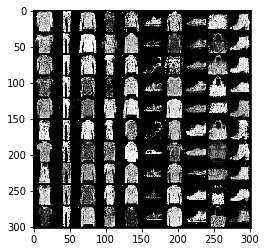

[Epoch 38/100] [Batch 0/600] [D loss: 1.340289] [G loss: 0.769036]
[Epoch 38/100] [Batch 1/600] [D loss: 1.333826] [G loss: 0.696889]
[Epoch 38/100] [Batch 2/600] [D loss: 1.389598] [G loss: 0.717159]
[Epoch 38/100] [Batch 3/600] [D loss: 1.399035] [G loss: 0.781234]
[Epoch 38/100] [Batch 4/600] [D loss: 1.367637] [G loss: 0.776887]
[Epoch 38/100] [Batch 5/600] [D loss: 1.395846] [G loss: 0.778181]
[Epoch 38/100] [Batch 6/600] [D loss: 1.378946] [G loss: 0.759952]
[Epoch 38/100] [Batch 7/600] [D loss: 1.388254] [G loss: 0.730159]
[Epoch 38/100] [Batch 8/600] [D loss: 1.356635] [G loss: 0.752281]
[Epoch 38/100] [Batch 9/600] [D loss: 1.400851] [G loss: 0.781065]
[Epoch 38/100] [Batch 10/600] [D loss: 1.361546] [G loss: 0.722888]
[Epoch 38/100] [Batch 11/600] [D loss: 1.376638] [G loss: 0.759419]
[Epoch 38/100] [Batch 12/600] [D loss: 1.409624] [G loss: 0.770784]
[Epoch 38/100] [Batch 13/600] [D loss: 1.365718] [G loss: 0.731290]
[Epoch 38/100] [Batch 14/600] [D loss: 1.365278] [G loss: 

[Epoch 38/100] [Batch 238/600] [D loss: 1.388987] [G loss: 0.680995]
[Epoch 38/100] [Batch 239/600] [D loss: 1.359076] [G loss: 0.746450]
[Epoch 38/100] [Batch 240/600] [D loss: 1.357637] [G loss: 0.755739]
[Epoch 38/100] [Batch 241/600] [D loss: 1.371866] [G loss: 0.784799]
[Epoch 38/100] [Batch 242/600] [D loss: 1.378169] [G loss: 0.765678]
[Epoch 38/100] [Batch 243/600] [D loss: 1.337973] [G loss: 0.733785]
[Epoch 38/100] [Batch 244/600] [D loss: 1.337190] [G loss: 0.692339]
[Epoch 38/100] [Batch 245/600] [D loss: 1.392342] [G loss: 0.701756]
[Epoch 38/100] [Batch 246/600] [D loss: 1.374029] [G loss: 0.713635]
[Epoch 38/100] [Batch 247/600] [D loss: 1.409310] [G loss: 0.725624]
[Epoch 38/100] [Batch 248/600] [D loss: 1.377627] [G loss: 0.735233]
[Epoch 38/100] [Batch 249/600] [D loss: 1.374341] [G loss: 0.738628]
[Epoch 38/100] [Batch 250/600] [D loss: 1.394872] [G loss: 0.770595]
[Epoch 38/100] [Batch 251/600] [D loss: 1.356354] [G loss: 0.761411]
[Epoch 38/100] [Batch 252/600] [D 

[Epoch 38/100] [Batch 474/600] [D loss: 1.387522] [G loss: 0.729578]
[Epoch 38/100] [Batch 475/600] [D loss: 1.366595] [G loss: 0.750458]
[Epoch 38/100] [Batch 476/600] [D loss: 1.405606] [G loss: 0.771469]
[Epoch 38/100] [Batch 477/600] [D loss: 1.363900] [G loss: 0.740193]
[Epoch 38/100] [Batch 478/600] [D loss: 1.388895] [G loss: 0.752010]
[Epoch 38/100] [Batch 479/600] [D loss: 1.361342] [G loss: 0.730674]
[Epoch 38/100] [Batch 480/600] [D loss: 1.396999] [G loss: 0.749061]
[Epoch 38/100] [Batch 481/600] [D loss: 1.335830] [G loss: 0.753910]
[Epoch 38/100] [Batch 482/600] [D loss: 1.335423] [G loss: 0.733425]
[Epoch 38/100] [Batch 483/600] [D loss: 1.358430] [G loss: 0.734266]
[Epoch 38/100] [Batch 484/600] [D loss: 1.329531] [G loss: 0.731941]
[Epoch 38/100] [Batch 485/600] [D loss: 1.334224] [G loss: 0.737292]
[Epoch 38/100] [Batch 486/600] [D loss: 1.340298] [G loss: 0.754208]
[Epoch 38/100] [Batch 487/600] [D loss: 1.339521] [G loss: 0.755505]
[Epoch 38/100] [Batch 488/600] [D 

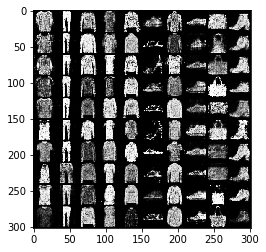

[Epoch 39/100] [Batch 0/600] [D loss: 1.328941] [G loss: 0.751511]
[Epoch 39/100] [Batch 1/600] [D loss: 1.401994] [G loss: 0.733636]
[Epoch 39/100] [Batch 2/600] [D loss: 1.365242] [G loss: 0.718008]
[Epoch 39/100] [Batch 3/600] [D loss: 1.380995] [G loss: 0.740451]
[Epoch 39/100] [Batch 4/600] [D loss: 1.394091] [G loss: 0.749570]
[Epoch 39/100] [Batch 5/600] [D loss: 1.354453] [G loss: 0.744410]
[Epoch 39/100] [Batch 6/600] [D loss: 1.401927] [G loss: 0.774370]
[Epoch 39/100] [Batch 7/600] [D loss: 1.343510] [G loss: 0.772490]
[Epoch 39/100] [Batch 8/600] [D loss: 1.402830] [G loss: 0.789251]
[Epoch 39/100] [Batch 9/600] [D loss: 1.355851] [G loss: 0.758913]
[Epoch 39/100] [Batch 10/600] [D loss: 1.376625] [G loss: 0.721700]
[Epoch 39/100] [Batch 11/600] [D loss: 1.366235] [G loss: 0.711829]
[Epoch 39/100] [Batch 12/600] [D loss: 1.357354] [G loss: 0.680242]
[Epoch 39/100] [Batch 13/600] [D loss: 1.353358] [G loss: 0.728397]
[Epoch 39/100] [Batch 14/600] [D loss: 1.385372] [G loss: 

[Epoch 39/100] [Batch 238/600] [D loss: 1.346328] [G loss: 0.733510]
[Epoch 39/100] [Batch 239/600] [D loss: 1.346827] [G loss: 0.748412]
[Epoch 39/100] [Batch 240/600] [D loss: 1.397637] [G loss: 0.816130]
[Epoch 39/100] [Batch 241/600] [D loss: 1.354935] [G loss: 0.797086]
[Epoch 39/100] [Batch 242/600] [D loss: 1.481317] [G loss: 0.755232]
[Epoch 39/100] [Batch 243/600] [D loss: 1.405529] [G loss: 0.734859]
[Epoch 39/100] [Batch 244/600] [D loss: 1.362777] [G loss: 0.761815]
[Epoch 39/100] [Batch 245/600] [D loss: 1.348389] [G loss: 0.753443]
[Epoch 39/100] [Batch 246/600] [D loss: 1.383141] [G loss: 0.778901]
[Epoch 39/100] [Batch 247/600] [D loss: 1.361478] [G loss: 0.734318]
[Epoch 39/100] [Batch 248/600] [D loss: 1.387009] [G loss: 0.726174]
[Epoch 39/100] [Batch 249/600] [D loss: 1.365204] [G loss: 0.744405]
[Epoch 39/100] [Batch 250/600] [D loss: 1.365636] [G loss: 0.745110]
[Epoch 39/100] [Batch 251/600] [D loss: 1.370151] [G loss: 0.739610]
[Epoch 39/100] [Batch 252/600] [D 

[Epoch 39/100] [Batch 474/600] [D loss: 1.373973] [G loss: 0.745367]
[Epoch 39/100] [Batch 475/600] [D loss: 1.349256] [G loss: 0.736042]
[Epoch 39/100] [Batch 476/600] [D loss: 1.378695] [G loss: 0.752996]
[Epoch 39/100] [Batch 477/600] [D loss: 1.359292] [G loss: 0.751382]
[Epoch 39/100] [Batch 478/600] [D loss: 1.372504] [G loss: 0.738880]
[Epoch 39/100] [Batch 479/600] [D loss: 1.346107] [G loss: 0.750270]
[Epoch 39/100] [Batch 480/600] [D loss: 1.369389] [G loss: 0.760710]
[Epoch 39/100] [Batch 481/600] [D loss: 1.321365] [G loss: 0.725690]
[Epoch 39/100] [Batch 482/600] [D loss: 1.317943] [G loss: 0.700422]
[Epoch 39/100] [Batch 483/600] [D loss: 1.364513] [G loss: 0.780460]
[Epoch 39/100] [Batch 484/600] [D loss: 1.369401] [G loss: 0.806861]
[Epoch 39/100] [Batch 485/600] [D loss: 1.332460] [G loss: 0.811938]
[Epoch 39/100] [Batch 486/600] [D loss: 1.331334] [G loss: 0.749216]
[Epoch 39/100] [Batch 487/600] [D loss: 1.363258] [G loss: 0.744075]
[Epoch 39/100] [Batch 488/600] [D 

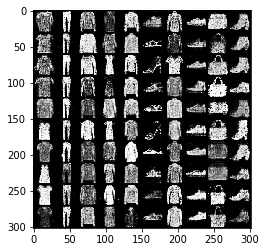

[Epoch 40/100] [Batch 0/600] [D loss: 1.382833] [G loss: 0.706026]
[Epoch 40/100] [Batch 1/600] [D loss: 1.334394] [G loss: 0.740887]
[Epoch 40/100] [Batch 2/600] [D loss: 1.368659] [G loss: 0.716502]
[Epoch 40/100] [Batch 3/600] [D loss: 1.321475] [G loss: 0.722413]
[Epoch 40/100] [Batch 4/600] [D loss: 1.338252] [G loss: 0.714341]
[Epoch 40/100] [Batch 5/600] [D loss: 1.348673] [G loss: 0.728379]
[Epoch 40/100] [Batch 6/600] [D loss: 1.358770] [G loss: 0.740662]
[Epoch 40/100] [Batch 7/600] [D loss: 1.357864] [G loss: 0.734271]
[Epoch 40/100] [Batch 8/600] [D loss: 1.366108] [G loss: 0.769119]
[Epoch 40/100] [Batch 9/600] [D loss: 1.394223] [G loss: 0.791590]
[Epoch 40/100] [Batch 10/600] [D loss: 1.379561] [G loss: 0.791621]
[Epoch 40/100] [Batch 11/600] [D loss: 1.378727] [G loss: 0.755005]
[Epoch 40/100] [Batch 12/600] [D loss: 1.381436] [G loss: 0.761757]
[Epoch 40/100] [Batch 13/600] [D loss: 1.381845] [G loss: 0.754222]
[Epoch 40/100] [Batch 14/600] [D loss: 1.374897] [G loss: 

[Epoch 40/100] [Batch 238/600] [D loss: 1.378956] [G loss: 0.713708]
[Epoch 40/100] [Batch 239/600] [D loss: 1.352371] [G loss: 0.735366]
[Epoch 40/100] [Batch 240/600] [D loss: 1.311164] [G loss: 0.726860]
[Epoch 40/100] [Batch 241/600] [D loss: 1.359685] [G loss: 0.700891]
[Epoch 40/100] [Batch 242/600] [D loss: 1.348166] [G loss: 0.715902]
[Epoch 40/100] [Batch 243/600] [D loss: 1.365714] [G loss: 0.735495]
[Epoch 40/100] [Batch 244/600] [D loss: 1.365889] [G loss: 0.772318]
[Epoch 40/100] [Batch 245/600] [D loss: 1.353865] [G loss: 0.742813]
[Epoch 40/100] [Batch 246/600] [D loss: 1.370541] [G loss: 0.738845]
[Epoch 40/100] [Batch 247/600] [D loss: 1.381207] [G loss: 0.731919]
[Epoch 40/100] [Batch 248/600] [D loss: 1.358803] [G loss: 0.766132]
[Epoch 40/100] [Batch 249/600] [D loss: 1.338067] [G loss: 0.749135]
[Epoch 40/100] [Batch 250/600] [D loss: 1.358923] [G loss: 0.728481]
[Epoch 40/100] [Batch 251/600] [D loss: 1.366595] [G loss: 0.714337]
[Epoch 40/100] [Batch 252/600] [D 

[Epoch 40/100] [Batch 474/600] [D loss: 1.398023] [G loss: 0.774244]
[Epoch 40/100] [Batch 475/600] [D loss: 1.371238] [G loss: 0.727147]
[Epoch 40/100] [Batch 476/600] [D loss: 1.359741] [G loss: 0.711726]
[Epoch 40/100] [Batch 477/600] [D loss: 1.361254] [G loss: 0.715118]
[Epoch 40/100] [Batch 478/600] [D loss: 1.365290] [G loss: 0.715124]
[Epoch 40/100] [Batch 479/600] [D loss: 1.371705] [G loss: 0.721737]
[Epoch 40/100] [Batch 480/600] [D loss: 1.329255] [G loss: 0.763748]
[Epoch 40/100] [Batch 481/600] [D loss: 1.373057] [G loss: 0.742716]
[Epoch 40/100] [Batch 482/600] [D loss: 1.349919] [G loss: 0.764443]
[Epoch 40/100] [Batch 483/600] [D loss: 1.372116] [G loss: 0.717365]
[Epoch 40/100] [Batch 484/600] [D loss: 1.376079] [G loss: 0.685671]
[Epoch 40/100] [Batch 485/600] [D loss: 1.335256] [G loss: 0.704110]
[Epoch 40/100] [Batch 486/600] [D loss: 1.375716] [G loss: 0.727260]
[Epoch 40/100] [Batch 487/600] [D loss: 1.346164] [G loss: 0.717619]
[Epoch 40/100] [Batch 488/600] [D 

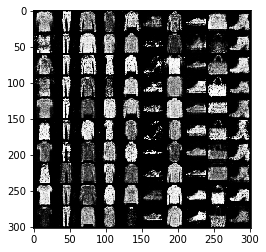

[Epoch 41/100] [Batch 0/600] [D loss: 1.330876] [G loss: 0.683250]
[Epoch 41/100] [Batch 1/600] [D loss: 1.378513] [G loss: 0.820723]
[Epoch 41/100] [Batch 2/600] [D loss: 1.389325] [G loss: 0.786760]
[Epoch 41/100] [Batch 3/600] [D loss: 1.416148] [G loss: 0.793344]
[Epoch 41/100] [Batch 4/600] [D loss: 1.388602] [G loss: 0.758974]
[Epoch 41/100] [Batch 5/600] [D loss: 1.402044] [G loss: 0.762896]
[Epoch 41/100] [Batch 6/600] [D loss: 1.409983] [G loss: 0.741643]
[Epoch 41/100] [Batch 7/600] [D loss: 1.364383] [G loss: 0.759077]
[Epoch 41/100] [Batch 8/600] [D loss: 1.381461] [G loss: 0.758754]
[Epoch 41/100] [Batch 9/600] [D loss: 1.374429] [G loss: 0.752427]
[Epoch 41/100] [Batch 10/600] [D loss: 1.362550] [G loss: 0.690804]
[Epoch 41/100] [Batch 11/600] [D loss: 1.355445] [G loss: 0.720938]
[Epoch 41/100] [Batch 12/600] [D loss: 1.348901] [G loss: 0.720238]
[Epoch 41/100] [Batch 13/600] [D loss: 1.344697] [G loss: 0.728477]
[Epoch 41/100] [Batch 14/600] [D loss: 1.358257] [G loss: 

[Epoch 41/100] [Batch 238/600] [D loss: 1.378386] [G loss: 0.727285]
[Epoch 41/100] [Batch 239/600] [D loss: 1.359348] [G loss: 0.693441]
[Epoch 41/100] [Batch 240/600] [D loss: 1.431077] [G loss: 0.787045]
[Epoch 41/100] [Batch 241/600] [D loss: 1.364943] [G loss: 0.787683]
[Epoch 41/100] [Batch 242/600] [D loss: 1.392967] [G loss: 0.768911]
[Epoch 41/100] [Batch 243/600] [D loss: 1.370274] [G loss: 0.731477]
[Epoch 41/100] [Batch 244/600] [D loss: 1.400062] [G loss: 0.756376]
[Epoch 41/100] [Batch 245/600] [D loss: 1.377114] [G loss: 0.736231]
[Epoch 41/100] [Batch 246/600] [D loss: 1.403971] [G loss: 0.730755]
[Epoch 41/100] [Batch 247/600] [D loss: 1.375486] [G loss: 0.697249]
[Epoch 41/100] [Batch 248/600] [D loss: 1.381917] [G loss: 0.756150]
[Epoch 41/100] [Batch 249/600] [D loss: 1.341161] [G loss: 0.730645]
[Epoch 41/100] [Batch 250/600] [D loss: 1.351914] [G loss: 0.770542]
[Epoch 41/100] [Batch 251/600] [D loss: 1.326747] [G loss: 0.742899]
[Epoch 41/100] [Batch 252/600] [D 

[Epoch 41/100] [Batch 474/600] [D loss: 1.374475] [G loss: 0.749782]
[Epoch 41/100] [Batch 475/600] [D loss: 1.330601] [G loss: 0.730708]
[Epoch 41/100] [Batch 476/600] [D loss: 1.358116] [G loss: 0.734737]
[Epoch 41/100] [Batch 477/600] [D loss: 1.287070] [G loss: 0.725024]
[Epoch 41/100] [Batch 478/600] [D loss: 1.409525] [G loss: 0.753412]
[Epoch 41/100] [Batch 479/600] [D loss: 1.376820] [G loss: 0.787736]
[Epoch 41/100] [Batch 480/600] [D loss: 1.390416] [G loss: 0.792737]
[Epoch 41/100] [Batch 481/600] [D loss: 1.359970] [G loss: 0.736546]
[Epoch 41/100] [Batch 482/600] [D loss: 1.406756] [G loss: 0.763064]
[Epoch 41/100] [Batch 483/600] [D loss: 1.373090] [G loss: 0.757345]
[Epoch 41/100] [Batch 484/600] [D loss: 1.398136] [G loss: 0.811914]
[Epoch 41/100] [Batch 485/600] [D loss: 1.374147] [G loss: 0.776693]
[Epoch 41/100] [Batch 486/600] [D loss: 1.360247] [G loss: 0.737062]
[Epoch 41/100] [Batch 487/600] [D loss: 1.339311] [G loss: 0.703016]
[Epoch 41/100] [Batch 488/600] [D 

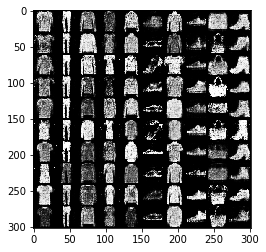

[Epoch 42/100] [Batch 0/600] [D loss: 1.367735] [G loss: 0.748698]
[Epoch 42/100] [Batch 1/600] [D loss: 1.342862] [G loss: 0.745518]
[Epoch 42/100] [Batch 2/600] [D loss: 1.360757] [G loss: 0.740166]
[Epoch 42/100] [Batch 3/600] [D loss: 1.355412] [G loss: 0.746969]
[Epoch 42/100] [Batch 4/600] [D loss: 1.354030] [G loss: 0.733166]
[Epoch 42/100] [Batch 5/600] [D loss: 1.360644] [G loss: 0.694422]
[Epoch 42/100] [Batch 6/600] [D loss: 1.352088] [G loss: 0.733535]
[Epoch 42/100] [Batch 7/600] [D loss: 1.327907] [G loss: 0.706384]
[Epoch 42/100] [Batch 8/600] [D loss: 1.366097] [G loss: 0.734799]
[Epoch 42/100] [Batch 9/600] [D loss: 1.412533] [G loss: 0.742640]
[Epoch 42/100] [Batch 10/600] [D loss: 1.388985] [G loss: 0.765709]
[Epoch 42/100] [Batch 11/600] [D loss: 1.382257] [G loss: 0.746477]
[Epoch 42/100] [Batch 12/600] [D loss: 1.352749] [G loss: 0.742384]
[Epoch 42/100] [Batch 13/600] [D loss: 1.324805] [G loss: 0.732421]
[Epoch 42/100] [Batch 14/600] [D loss: 1.372887] [G loss: 

[Epoch 42/100] [Batch 238/600] [D loss: 1.351533] [G loss: 0.733210]
[Epoch 42/100] [Batch 239/600] [D loss: 1.394261] [G loss: 0.734982]
[Epoch 42/100] [Batch 240/600] [D loss: 1.382815] [G loss: 0.732287]
[Epoch 42/100] [Batch 241/600] [D loss: 1.363846] [G loss: 0.741349]
[Epoch 42/100] [Batch 242/600] [D loss: 1.377675] [G loss: 0.725885]
[Epoch 42/100] [Batch 243/600] [D loss: 1.403715] [G loss: 0.731371]
[Epoch 42/100] [Batch 244/600] [D loss: 1.384088] [G loss: 0.724734]
[Epoch 42/100] [Batch 245/600] [D loss: 1.398706] [G loss: 0.720256]
[Epoch 42/100] [Batch 246/600] [D loss: 1.386973] [G loss: 0.738584]
[Epoch 42/100] [Batch 247/600] [D loss: 1.346794] [G loss: 0.736453]
[Epoch 42/100] [Batch 248/600] [D loss: 1.376576] [G loss: 0.735909]
[Epoch 42/100] [Batch 249/600] [D loss: 1.352379] [G loss: 0.728530]
[Epoch 42/100] [Batch 250/600] [D loss: 1.361890] [G loss: 0.717015]
[Epoch 42/100] [Batch 251/600] [D loss: 1.387527] [G loss: 0.717340]
[Epoch 42/100] [Batch 252/600] [D 

[Epoch 42/100] [Batch 474/600] [D loss: 1.396505] [G loss: 0.766254]
[Epoch 42/100] [Batch 475/600] [D loss: 1.358273] [G loss: 0.735662]
[Epoch 42/100] [Batch 476/600] [D loss: 1.358901] [G loss: 0.751068]
[Epoch 42/100] [Batch 477/600] [D loss: 1.356123] [G loss: 0.727459]
[Epoch 42/100] [Batch 478/600] [D loss: 1.375491] [G loss: 0.705948]
[Epoch 42/100] [Batch 479/600] [D loss: 1.342216] [G loss: 0.701335]
[Epoch 42/100] [Batch 480/600] [D loss: 1.393373] [G loss: 0.682590]
[Epoch 42/100] [Batch 481/600] [D loss: 1.373429] [G loss: 0.776827]
[Epoch 42/100] [Batch 482/600] [D loss: 1.365124] [G loss: 0.729209]
[Epoch 42/100] [Batch 483/600] [D loss: 1.366056] [G loss: 0.711869]
[Epoch 42/100] [Batch 484/600] [D loss: 1.339368] [G loss: 0.666429]
[Epoch 42/100] [Batch 485/600] [D loss: 1.348889] [G loss: 0.724116]
[Epoch 42/100] [Batch 486/600] [D loss: 1.402253] [G loss: 0.762149]
[Epoch 42/100] [Batch 487/600] [D loss: 1.402401] [G loss: 0.794666]
[Epoch 42/100] [Batch 488/600] [D 

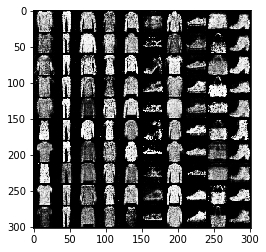

[Epoch 43/100] [Batch 0/600] [D loss: 1.395526] [G loss: 0.716903]
[Epoch 43/100] [Batch 1/600] [D loss: 1.392913] [G loss: 0.738839]
[Epoch 43/100] [Batch 2/600] [D loss: 1.365837] [G loss: 0.717308]
[Epoch 43/100] [Batch 3/600] [D loss: 1.367612] [G loss: 0.734805]
[Epoch 43/100] [Batch 4/600] [D loss: 1.400742] [G loss: 0.746857]
[Epoch 43/100] [Batch 5/600] [D loss: 1.366582] [G loss: 0.733086]
[Epoch 43/100] [Batch 6/600] [D loss: 1.388274] [G loss: 0.715514]
[Epoch 43/100] [Batch 7/600] [D loss: 1.363708] [G loss: 0.711926]
[Epoch 43/100] [Batch 8/600] [D loss: 1.330898] [G loss: 0.713665]
[Epoch 43/100] [Batch 9/600] [D loss: 1.384458] [G loss: 0.719352]
[Epoch 43/100] [Batch 10/600] [D loss: 1.313615] [G loss: 0.735852]
[Epoch 43/100] [Batch 11/600] [D loss: 1.386173] [G loss: 0.751393]
[Epoch 43/100] [Batch 12/600] [D loss: 1.356547] [G loss: 0.753668]
[Epoch 43/100] [Batch 13/600] [D loss: 1.350168] [G loss: 0.722333]
[Epoch 43/100] [Batch 14/600] [D loss: 1.347877] [G loss: 

[Epoch 43/100] [Batch 238/600] [D loss: 1.348112] [G loss: 0.710779]
[Epoch 43/100] [Batch 239/600] [D loss: 1.370227] [G loss: 0.696874]
[Epoch 43/100] [Batch 240/600] [D loss: 1.354861] [G loss: 0.734501]
[Epoch 43/100] [Batch 241/600] [D loss: 1.402306] [G loss: 0.762363]
[Epoch 43/100] [Batch 242/600] [D loss: 1.377246] [G loss: 0.781372]
[Epoch 43/100] [Batch 243/600] [D loss: 1.379955] [G loss: 0.745869]
[Epoch 43/100] [Batch 244/600] [D loss: 1.363189] [G loss: 0.755720]
[Epoch 43/100] [Batch 245/600] [D loss: 1.388652] [G loss: 0.743739]
[Epoch 43/100] [Batch 246/600] [D loss: 1.368720] [G loss: 0.729505]
[Epoch 43/100] [Batch 247/600] [D loss: 1.377017] [G loss: 0.737224]
[Epoch 43/100] [Batch 248/600] [D loss: 1.371585] [G loss: 0.760088]
[Epoch 43/100] [Batch 249/600] [D loss: 1.373890] [G loss: 0.773968]
[Epoch 43/100] [Batch 250/600] [D loss: 1.376666] [G loss: 0.758668]
[Epoch 43/100] [Batch 251/600] [D loss: 1.360901] [G loss: 0.721242]
[Epoch 43/100] [Batch 252/600] [D 

[Epoch 43/100] [Batch 474/600] [D loss: 1.381843] [G loss: 0.747854]
[Epoch 43/100] [Batch 475/600] [D loss: 1.406112] [G loss: 0.745654]
[Epoch 43/100] [Batch 476/600] [D loss: 1.374198] [G loss: 0.748344]
[Epoch 43/100] [Batch 477/600] [D loss: 1.371176] [G loss: 0.719202]
[Epoch 43/100] [Batch 478/600] [D loss: 1.382657] [G loss: 0.726880]
[Epoch 43/100] [Batch 479/600] [D loss: 1.375848] [G loss: 0.733954]
[Epoch 43/100] [Batch 480/600] [D loss: 1.399562] [G loss: 0.743459]
[Epoch 43/100] [Batch 481/600] [D loss: 1.355275] [G loss: 0.742418]
[Epoch 43/100] [Batch 482/600] [D loss: 1.357392] [G loss: 0.729212]
[Epoch 43/100] [Batch 483/600] [D loss: 1.384125] [G loss: 0.719001]
[Epoch 43/100] [Batch 484/600] [D loss: 1.356480] [G loss: 0.722048]
[Epoch 43/100] [Batch 485/600] [D loss: 1.356671] [G loss: 0.705624]
[Epoch 43/100] [Batch 486/600] [D loss: 1.359638] [G loss: 0.714866]
[Epoch 43/100] [Batch 487/600] [D loss: 1.346086] [G loss: 0.735707]
[Epoch 43/100] [Batch 488/600] [D 

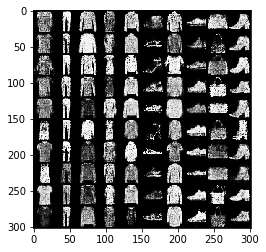

[Epoch 44/100] [Batch 0/600] [D loss: 1.357736] [G loss: 0.702808]
[Epoch 44/100] [Batch 1/600] [D loss: 1.367654] [G loss: 0.657078]
[Epoch 44/100] [Batch 2/600] [D loss: 1.347988] [G loss: 0.692436]
[Epoch 44/100] [Batch 3/600] [D loss: 1.407067] [G loss: 0.746943]
[Epoch 44/100] [Batch 4/600] [D loss: 1.357315] [G loss: 0.763960]
[Epoch 44/100] [Batch 5/600] [D loss: 1.405147] [G loss: 0.785124]
[Epoch 44/100] [Batch 6/600] [D loss: 1.363479] [G loss: 0.753400]
[Epoch 44/100] [Batch 7/600] [D loss: 1.360571] [G loss: 0.718301]
[Epoch 44/100] [Batch 8/600] [D loss: 1.361549] [G loss: 0.681102]
[Epoch 44/100] [Batch 9/600] [D loss: 1.349141] [G loss: 0.700881]
[Epoch 44/100] [Batch 10/600] [D loss: 1.325225] [G loss: 0.685038]
[Epoch 44/100] [Batch 11/600] [D loss: 1.345579] [G loss: 0.699740]
[Epoch 44/100] [Batch 12/600] [D loss: 1.350623] [G loss: 0.713410]
[Epoch 44/100] [Batch 13/600] [D loss: 1.375960] [G loss: 0.762029]
[Epoch 44/100] [Batch 14/600] [D loss: 1.354833] [G loss: 

[Epoch 44/100] [Batch 238/600] [D loss: 1.352053] [G loss: 0.704663]
[Epoch 44/100] [Batch 239/600] [D loss: 1.367316] [G loss: 0.696891]
[Epoch 44/100] [Batch 240/600] [D loss: 1.388721] [G loss: 0.712757]
[Epoch 44/100] [Batch 241/600] [D loss: 1.429327] [G loss: 0.788380]
[Epoch 44/100] [Batch 242/600] [D loss: 1.394204] [G loss: 0.796902]
[Epoch 44/100] [Batch 243/600] [D loss: 1.405252] [G loss: 0.773882]
[Epoch 44/100] [Batch 244/600] [D loss: 1.370897] [G loss: 0.762836]
[Epoch 44/100] [Batch 245/600] [D loss: 1.354244] [G loss: 0.723573]
[Epoch 44/100] [Batch 246/600] [D loss: 1.389551] [G loss: 0.728837]
[Epoch 44/100] [Batch 247/600] [D loss: 1.391783] [G loss: 0.705386]
[Epoch 44/100] [Batch 248/600] [D loss: 1.401143] [G loss: 0.713295]
[Epoch 44/100] [Batch 249/600] [D loss: 1.355058] [G loss: 0.707934]
[Epoch 44/100] [Batch 250/600] [D loss: 1.391449] [G loss: 0.720664]
[Epoch 44/100] [Batch 251/600] [D loss: 1.377575] [G loss: 0.723457]
[Epoch 44/100] [Batch 252/600] [D 

[Epoch 44/100] [Batch 474/600] [D loss: 1.381833] [G loss: 0.723161]
[Epoch 44/100] [Batch 475/600] [D loss: 1.396611] [G loss: 0.734831]
[Epoch 44/100] [Batch 476/600] [D loss: 1.411690] [G loss: 0.753145]
[Epoch 44/100] [Batch 477/600] [D loss: 1.369358] [G loss: 0.767920]
[Epoch 44/100] [Batch 478/600] [D loss: 1.365395] [G loss: 0.732284]
[Epoch 44/100] [Batch 479/600] [D loss: 1.347561] [G loss: 0.730531]
[Epoch 44/100] [Batch 480/600] [D loss: 1.373147] [G loss: 0.746342]
[Epoch 44/100] [Batch 481/600] [D loss: 1.400533] [G loss: 0.784334]
[Epoch 44/100] [Batch 482/600] [D loss: 1.377025] [G loss: 0.776389]
[Epoch 44/100] [Batch 483/600] [D loss: 1.375891] [G loss: 0.773041]
[Epoch 44/100] [Batch 484/600] [D loss: 1.371282] [G loss: 0.757888]
[Epoch 44/100] [Batch 485/600] [D loss: 1.391437] [G loss: 0.746326]
[Epoch 44/100] [Batch 486/600] [D loss: 1.375193] [G loss: 0.747038]
[Epoch 44/100] [Batch 487/600] [D loss: 1.390523] [G loss: 0.751164]
[Epoch 44/100] [Batch 488/600] [D 

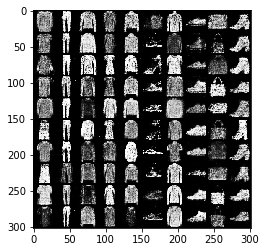

[Epoch 45/100] [Batch 0/600] [D loss: 1.407738] [G loss: 0.744552]
[Epoch 45/100] [Batch 1/600] [D loss: 1.376744] [G loss: 0.731835]
[Epoch 45/100] [Batch 2/600] [D loss: 1.373942] [G loss: 0.757055]
[Epoch 45/100] [Batch 3/600] [D loss: 1.363359] [G loss: 0.784940]
[Epoch 45/100] [Batch 4/600] [D loss: 1.349495] [G loss: 0.731324]
[Epoch 45/100] [Batch 5/600] [D loss: 1.349501] [G loss: 0.695196]
[Epoch 45/100] [Batch 6/600] [D loss: 1.386209] [G loss: 0.727620]
[Epoch 45/100] [Batch 7/600] [D loss: 1.377007] [G loss: 0.733748]
[Epoch 45/100] [Batch 8/600] [D loss: 1.351708] [G loss: 0.760649]
[Epoch 45/100] [Batch 9/600] [D loss: 1.412018] [G loss: 0.746849]
[Epoch 45/100] [Batch 10/600] [D loss: 1.365836] [G loss: 0.760727]
[Epoch 45/100] [Batch 11/600] [D loss: 1.358158] [G loss: 0.762814]
[Epoch 45/100] [Batch 12/600] [D loss: 1.360861] [G loss: 0.754568]
[Epoch 45/100] [Batch 13/600] [D loss: 1.352776] [G loss: 0.726712]
[Epoch 45/100] [Batch 14/600] [D loss: 1.379031] [G loss: 

[Epoch 45/100] [Batch 238/600] [D loss: 1.366121] [G loss: 0.750087]
[Epoch 45/100] [Batch 239/600] [D loss: 1.353677] [G loss: 0.721499]
[Epoch 45/100] [Batch 240/600] [D loss: 1.353319] [G loss: 0.712935]
[Epoch 45/100] [Batch 241/600] [D loss: 1.364911] [G loss: 0.712151]
[Epoch 45/100] [Batch 242/600] [D loss: 1.374835] [G loss: 0.740545]
[Epoch 45/100] [Batch 243/600] [D loss: 1.384676] [G loss: 0.733235]
[Epoch 45/100] [Batch 244/600] [D loss: 1.367841] [G loss: 0.740119]
[Epoch 45/100] [Batch 245/600] [D loss: 1.364467] [G loss: 0.722945]
[Epoch 45/100] [Batch 246/600] [D loss: 1.353527] [G loss: 0.755616]
[Epoch 45/100] [Batch 247/600] [D loss: 1.349799] [G loss: 0.753862]
[Epoch 45/100] [Batch 248/600] [D loss: 1.377080] [G loss: 0.734219]
[Epoch 45/100] [Batch 249/600] [D loss: 1.376174] [G loss: 0.726267]
[Epoch 45/100] [Batch 250/600] [D loss: 1.357608] [G loss: 0.689448]
[Epoch 45/100] [Batch 251/600] [D loss: 1.356701] [G loss: 0.746229]
[Epoch 45/100] [Batch 252/600] [D 

[Epoch 45/100] [Batch 474/600] [D loss: 1.371235] [G loss: 0.750896]
[Epoch 45/100] [Batch 475/600] [D loss: 1.339492] [G loss: 0.708097]
[Epoch 45/100] [Batch 476/600] [D loss: 1.341920] [G loss: 0.681498]
[Epoch 45/100] [Batch 477/600] [D loss: 1.354748] [G loss: 0.757345]
[Epoch 45/100] [Batch 478/600] [D loss: 1.378683] [G loss: 0.755015]
[Epoch 45/100] [Batch 479/600] [D loss: 1.421494] [G loss: 0.802126]
[Epoch 45/100] [Batch 480/600] [D loss: 1.359213] [G loss: 0.795241]
[Epoch 45/100] [Batch 481/600] [D loss: 1.378412] [G loss: 0.752170]
[Epoch 45/100] [Batch 482/600] [D loss: 1.394698] [G loss: 0.736111]
[Epoch 45/100] [Batch 483/600] [D loss: 1.361143] [G loss: 0.725453]
[Epoch 45/100] [Batch 484/600] [D loss: 1.414244] [G loss: 0.747079]
[Epoch 45/100] [Batch 485/600] [D loss: 1.349916] [G loss: 0.761986]
[Epoch 45/100] [Batch 486/600] [D loss: 1.370782] [G loss: 0.752603]
[Epoch 45/100] [Batch 487/600] [D loss: 1.344098] [G loss: 0.714672]
[Epoch 45/100] [Batch 488/600] [D 

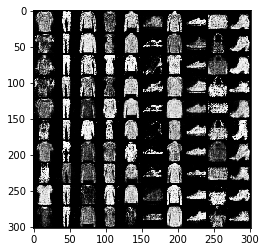

[Epoch 46/100] [Batch 0/600] [D loss: 1.365800] [G loss: 0.756779]
[Epoch 46/100] [Batch 1/600] [D loss: 1.397415] [G loss: 0.738779]
[Epoch 46/100] [Batch 2/600] [D loss: 1.348634] [G loss: 0.752965]
[Epoch 46/100] [Batch 3/600] [D loss: 1.400321] [G loss: 0.726871]
[Epoch 46/100] [Batch 4/600] [D loss: 1.360385] [G loss: 0.732495]
[Epoch 46/100] [Batch 5/600] [D loss: 1.374813] [G loss: 0.749572]
[Epoch 46/100] [Batch 6/600] [D loss: 1.365828] [G loss: 0.756003]
[Epoch 46/100] [Batch 7/600] [D loss: 1.365637] [G loss: 0.748153]
[Epoch 46/100] [Batch 8/600] [D loss: 1.368574] [G loss: 0.715229]
[Epoch 46/100] [Batch 9/600] [D loss: 1.346268] [G loss: 0.717079]
[Epoch 46/100] [Batch 10/600] [D loss: 1.385891] [G loss: 0.733537]
[Epoch 46/100] [Batch 11/600] [D loss: 1.388239] [G loss: 0.751929]
[Epoch 46/100] [Batch 12/600] [D loss: 1.367228] [G loss: 0.754288]
[Epoch 46/100] [Batch 13/600] [D loss: 1.374082] [G loss: 0.754417]
[Epoch 46/100] [Batch 14/600] [D loss: 1.373659] [G loss: 

[Epoch 46/100] [Batch 238/600] [D loss: 1.373556] [G loss: 0.721239]
[Epoch 46/100] [Batch 239/600] [D loss: 1.382829] [G loss: 0.718791]
[Epoch 46/100] [Batch 240/600] [D loss: 1.315694] [G loss: 0.730352]
[Epoch 46/100] [Batch 241/600] [D loss: 1.353505] [G loss: 0.700602]
[Epoch 46/100] [Batch 242/600] [D loss: 1.323463] [G loss: 0.681649]
[Epoch 46/100] [Batch 243/600] [D loss: 1.343312] [G loss: 0.708068]
[Epoch 46/100] [Batch 244/600] [D loss: 1.345401] [G loss: 0.721531]
[Epoch 46/100] [Batch 245/600] [D loss: 1.340555] [G loss: 0.779355]
[Epoch 46/100] [Batch 246/600] [D loss: 1.386074] [G loss: 0.756591]
[Epoch 46/100] [Batch 247/600] [D loss: 1.385304] [G loss: 0.772492]
[Epoch 46/100] [Batch 248/600] [D loss: 1.354840] [G loss: 0.734916]
[Epoch 46/100] [Batch 249/600] [D loss: 1.364748] [G loss: 0.719067]
[Epoch 46/100] [Batch 250/600] [D loss: 1.345847] [G loss: 0.758186]
[Epoch 46/100] [Batch 251/600] [D loss: 1.371370] [G loss: 0.753694]
[Epoch 46/100] [Batch 252/600] [D 

[Epoch 46/100] [Batch 474/600] [D loss: 1.408359] [G loss: 0.735745]
[Epoch 46/100] [Batch 475/600] [D loss: 1.375493] [G loss: 0.731755]
[Epoch 46/100] [Batch 476/600] [D loss: 1.398635] [G loss: 0.708488]
[Epoch 46/100] [Batch 477/600] [D loss: 1.397676] [G loss: 0.695872]
[Epoch 46/100] [Batch 478/600] [D loss: 1.360070] [G loss: 0.700558]
[Epoch 46/100] [Batch 479/600] [D loss: 1.369627] [G loss: 0.739398]
[Epoch 46/100] [Batch 480/600] [D loss: 1.344189] [G loss: 0.729822]
[Epoch 46/100] [Batch 481/600] [D loss: 1.375570] [G loss: 0.716527]
[Epoch 46/100] [Batch 482/600] [D loss: 1.370191] [G loss: 0.735516]
[Epoch 46/100] [Batch 483/600] [D loss: 1.343009] [G loss: 0.716745]
[Epoch 46/100] [Batch 484/600] [D loss: 1.361654] [G loss: 0.720060]
[Epoch 46/100] [Batch 485/600] [D loss: 1.372770] [G loss: 0.746046]
[Epoch 46/100] [Batch 486/600] [D loss: 1.343233] [G loss: 0.691703]
[Epoch 46/100] [Batch 487/600] [D loss: 1.375089] [G loss: 0.710296]
[Epoch 46/100] [Batch 488/600] [D 

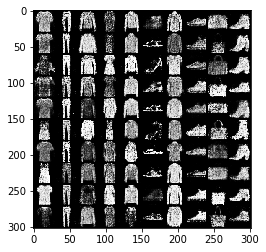

[Epoch 47/100] [Batch 0/600] [D loss: 1.364554] [G loss: 0.697756]
[Epoch 47/100] [Batch 1/600] [D loss: 1.357023] [G loss: 0.696411]
[Epoch 47/100] [Batch 2/600] [D loss: 1.368642] [G loss: 0.717124]
[Epoch 47/100] [Batch 3/600] [D loss: 1.390541] [G loss: 0.737831]
[Epoch 47/100] [Batch 4/600] [D loss: 1.399019] [G loss: 0.780253]
[Epoch 47/100] [Batch 5/600] [D loss: 1.370058] [G loss: 0.756533]
[Epoch 47/100] [Batch 6/600] [D loss: 1.365055] [G loss: 0.714806]
[Epoch 47/100] [Batch 7/600] [D loss: 1.382219] [G loss: 0.732114]
[Epoch 47/100] [Batch 8/600] [D loss: 1.402403] [G loss: 0.700835]
[Epoch 47/100] [Batch 9/600] [D loss: 1.385559] [G loss: 0.709533]
[Epoch 47/100] [Batch 10/600] [D loss: 1.391795] [G loss: 0.735537]
[Epoch 47/100] [Batch 11/600] [D loss: 1.384046] [G loss: 0.759118]
[Epoch 47/100] [Batch 12/600] [D loss: 1.403801] [G loss: 0.752202]
[Epoch 47/100] [Batch 13/600] [D loss: 1.385343] [G loss: 0.757188]
[Epoch 47/100] [Batch 14/600] [D loss: 1.406494] [G loss: 

[Epoch 47/100] [Batch 238/600] [D loss: 1.360987] [G loss: 0.723961]
[Epoch 47/100] [Batch 239/600] [D loss: 1.376325] [G loss: 0.729719]
[Epoch 47/100] [Batch 240/600] [D loss: 1.356622] [G loss: 0.786913]
[Epoch 47/100] [Batch 241/600] [D loss: 1.403905] [G loss: 0.792675]
[Epoch 47/100] [Batch 242/600] [D loss: 1.393635] [G loss: 0.792754]
[Epoch 47/100] [Batch 243/600] [D loss: 1.375281] [G loss: 0.776704]
[Epoch 47/100] [Batch 244/600] [D loss: 1.378461] [G loss: 0.769895]
[Epoch 47/100] [Batch 245/600] [D loss: 1.355034] [G loss: 0.728694]
[Epoch 47/100] [Batch 246/600] [D loss: 1.343379] [G loss: 0.741044]
[Epoch 47/100] [Batch 247/600] [D loss: 1.347527] [G loss: 0.730880]
[Epoch 47/100] [Batch 248/600] [D loss: 1.344475] [G loss: 0.734951]
[Epoch 47/100] [Batch 249/600] [D loss: 1.364561] [G loss: 0.729447]
[Epoch 47/100] [Batch 250/600] [D loss: 1.357332] [G loss: 0.688797]
[Epoch 47/100] [Batch 251/600] [D loss: 1.330151] [G loss: 0.725797]
[Epoch 47/100] [Batch 252/600] [D 

[Epoch 47/100] [Batch 474/600] [D loss: 1.392135] [G loss: 0.735365]
[Epoch 47/100] [Batch 475/600] [D loss: 1.373002] [G loss: 0.738582]
[Epoch 47/100] [Batch 476/600] [D loss: 1.365760] [G loss: 0.733244]
[Epoch 47/100] [Batch 477/600] [D loss: 1.360421] [G loss: 0.733890]
[Epoch 47/100] [Batch 478/600] [D loss: 1.363212] [G loss: 0.709364]
[Epoch 47/100] [Batch 479/600] [D loss: 1.358991] [G loss: 0.693158]
[Epoch 47/100] [Batch 480/600] [D loss: 1.376839] [G loss: 0.687343]
[Epoch 47/100] [Batch 481/600] [D loss: 1.368763] [G loss: 0.695546]
[Epoch 47/100] [Batch 482/600] [D loss: 1.364075] [G loss: 0.704074]
[Epoch 47/100] [Batch 483/600] [D loss: 1.377950] [G loss: 0.692057]
[Epoch 47/100] [Batch 484/600] [D loss: 1.360366] [G loss: 0.718853]
[Epoch 47/100] [Batch 485/600] [D loss: 1.360922] [G loss: 0.730267]
[Epoch 47/100] [Batch 486/600] [D loss: 1.351390] [G loss: 0.743905]
[Epoch 47/100] [Batch 487/600] [D loss: 1.378718] [G loss: 0.735926]
[Epoch 47/100] [Batch 488/600] [D 

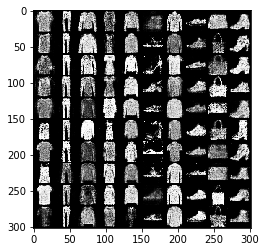

[Epoch 48/100] [Batch 0/600] [D loss: 1.394134] [G loss: 0.751288]
[Epoch 48/100] [Batch 1/600] [D loss: 1.384316] [G loss: 0.735772]
[Epoch 48/100] [Batch 2/600] [D loss: 1.349142] [G loss: 0.729882]
[Epoch 48/100] [Batch 3/600] [D loss: 1.347726] [G loss: 0.715630]
[Epoch 48/100] [Batch 4/600] [D loss: 1.385176] [G loss: 0.733061]
[Epoch 48/100] [Batch 5/600] [D loss: 1.395193] [G loss: 0.753883]
[Epoch 48/100] [Batch 6/600] [D loss: 1.349527] [G loss: 0.759993]
[Epoch 48/100] [Batch 7/600] [D loss: 1.376824] [G loss: 0.725250]
[Epoch 48/100] [Batch 8/600] [D loss: 1.349839] [G loss: 0.751900]
[Epoch 48/100] [Batch 9/600] [D loss: 1.374449] [G loss: 0.744298]
[Epoch 48/100] [Batch 10/600] [D loss: 1.369156] [G loss: 0.750592]
[Epoch 48/100] [Batch 11/600] [D loss: 1.395005] [G loss: 0.753789]
[Epoch 48/100] [Batch 12/600] [D loss: 1.355653] [G loss: 0.762857]
[Epoch 48/100] [Batch 13/600] [D loss: 1.372961] [G loss: 0.774174]
[Epoch 48/100] [Batch 14/600] [D loss: 1.354516] [G loss: 

[Epoch 48/100] [Batch 238/600] [D loss: 1.398028] [G loss: 0.765872]
[Epoch 48/100] [Batch 239/600] [D loss: 1.370713] [G loss: 0.727070]
[Epoch 48/100] [Batch 240/600] [D loss: 1.380979] [G loss: 0.712821]
[Epoch 48/100] [Batch 241/600] [D loss: 1.369837] [G loss: 0.719904]
[Epoch 48/100] [Batch 242/600] [D loss: 1.398508] [G loss: 0.703189]
[Epoch 48/100] [Batch 243/600] [D loss: 1.378733] [G loss: 0.714283]
[Epoch 48/100] [Batch 244/600] [D loss: 1.353209] [G loss: 0.729715]
[Epoch 48/100] [Batch 245/600] [D loss: 1.331457] [G loss: 0.706882]
[Epoch 48/100] [Batch 246/600] [D loss: 1.353713] [G loss: 0.735063]
[Epoch 48/100] [Batch 247/600] [D loss: 1.349410] [G loss: 0.723296]
[Epoch 48/100] [Batch 248/600] [D loss: 1.388548] [G loss: 0.732661]
[Epoch 48/100] [Batch 249/600] [D loss: 1.375599] [G loss: 0.735315]
[Epoch 48/100] [Batch 250/600] [D loss: 1.372550] [G loss: 0.732176]
[Epoch 48/100] [Batch 251/600] [D loss: 1.354457] [G loss: 0.725430]
[Epoch 48/100] [Batch 252/600] [D 

[Epoch 48/100] [Batch 474/600] [D loss: 1.378419] [G loss: 0.747263]
[Epoch 48/100] [Batch 475/600] [D loss: 1.395476] [G loss: 0.723425]
[Epoch 48/100] [Batch 476/600] [D loss: 1.387545] [G loss: 0.749361]
[Epoch 48/100] [Batch 477/600] [D loss: 1.375063] [G loss: 0.733347]
[Epoch 48/100] [Batch 478/600] [D loss: 1.380343] [G loss: 0.735698]
[Epoch 48/100] [Batch 479/600] [D loss: 1.369889] [G loss: 0.727959]
[Epoch 48/100] [Batch 480/600] [D loss: 1.343779] [G loss: 0.716770]
[Epoch 48/100] [Batch 481/600] [D loss: 1.345920] [G loss: 0.730158]
[Epoch 48/100] [Batch 482/600] [D loss: 1.352512] [G loss: 0.739118]
[Epoch 48/100] [Batch 483/600] [D loss: 1.370177] [G loss: 0.768627]
[Epoch 48/100] [Batch 484/600] [D loss: 1.390427] [G loss: 0.730870]
[Epoch 48/100] [Batch 485/600] [D loss: 1.352506] [G loss: 0.743409]
[Epoch 48/100] [Batch 486/600] [D loss: 1.356943] [G loss: 0.724743]
[Epoch 48/100] [Batch 487/600] [D loss: 1.372568] [G loss: 0.721268]
[Epoch 48/100] [Batch 488/600] [D 

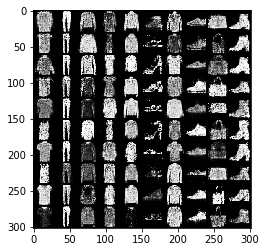

[Epoch 49/100] [Batch 0/600] [D loss: 1.358862] [G loss: 0.750256]
[Epoch 49/100] [Batch 1/600] [D loss: 1.390653] [G loss: 0.746479]
[Epoch 49/100] [Batch 2/600] [D loss: 1.362105] [G loss: 0.721784]
[Epoch 49/100] [Batch 3/600] [D loss: 1.356393] [G loss: 0.722289]
[Epoch 49/100] [Batch 4/600] [D loss: 1.375523] [G loss: 0.732328]
[Epoch 49/100] [Batch 5/600] [D loss: 1.371008] [G loss: 0.754563]
[Epoch 49/100] [Batch 6/600] [D loss: 1.390108] [G loss: 0.718814]
[Epoch 49/100] [Batch 7/600] [D loss: 1.359995] [G loss: 0.751162]
[Epoch 49/100] [Batch 8/600] [D loss: 1.335277] [G loss: 0.726695]
[Epoch 49/100] [Batch 9/600] [D loss: 1.352514] [G loss: 0.725111]
[Epoch 49/100] [Batch 10/600] [D loss: 1.375987] [G loss: 0.708127]
[Epoch 49/100] [Batch 11/600] [D loss: 1.397589] [G loss: 0.723491]
[Epoch 49/100] [Batch 12/600] [D loss: 1.330390] [G loss: 0.739047]
[Epoch 49/100] [Batch 13/600] [D loss: 1.377701] [G loss: 0.717666]
[Epoch 49/100] [Batch 14/600] [D loss: 1.371152] [G loss: 

[Epoch 49/100] [Batch 238/600] [D loss: 1.374171] [G loss: 0.718686]
[Epoch 49/100] [Batch 239/600] [D loss: 1.408709] [G loss: 0.742887]
[Epoch 49/100] [Batch 240/600] [D loss: 1.374801] [G loss: 0.777721]
[Epoch 49/100] [Batch 241/600] [D loss: 1.390532] [G loss: 0.778264]
[Epoch 49/100] [Batch 242/600] [D loss: 1.353438] [G loss: 0.755538]
[Epoch 49/100] [Batch 243/600] [D loss: 1.393381] [G loss: 0.799968]
[Epoch 49/100] [Batch 244/600] [D loss: 1.391207] [G loss: 0.761246]
[Epoch 49/100] [Batch 245/600] [D loss: 1.380430] [G loss: 0.768256]
[Epoch 49/100] [Batch 246/600] [D loss: 1.381975] [G loss: 0.757023]
[Epoch 49/100] [Batch 247/600] [D loss: 1.353360] [G loss: 0.713512]
[Epoch 49/100] [Batch 248/600] [D loss: 1.323264] [G loss: 0.712338]
[Epoch 49/100] [Batch 249/600] [D loss: 1.359485] [G loss: 0.724730]
[Epoch 49/100] [Batch 250/600] [D loss: 1.369532] [G loss: 0.785199]
[Epoch 49/100] [Batch 251/600] [D loss: 1.367607] [G loss: 0.793385]
[Epoch 49/100] [Batch 252/600] [D 

[Epoch 49/100] [Batch 474/600] [D loss: 1.379311] [G loss: 0.769168]
[Epoch 49/100] [Batch 475/600] [D loss: 1.361346] [G loss: 0.770134]
[Epoch 49/100] [Batch 476/600] [D loss: 1.373070] [G loss: 0.746698]
[Epoch 49/100] [Batch 477/600] [D loss: 1.369815] [G loss: 0.739871]
[Epoch 49/100] [Batch 478/600] [D loss: 1.353064] [G loss: 0.784772]
[Epoch 49/100] [Batch 479/600] [D loss: 1.375270] [G loss: 0.750919]
[Epoch 49/100] [Batch 480/600] [D loss: 1.346253] [G loss: 0.723851]
[Epoch 49/100] [Batch 481/600] [D loss: 1.356859] [G loss: 0.736893]
[Epoch 49/100] [Batch 482/600] [D loss: 1.426471] [G loss: 0.744908]
[Epoch 49/100] [Batch 483/600] [D loss: 1.347432] [G loss: 0.753794]
[Epoch 49/100] [Batch 484/600] [D loss: 1.372125] [G loss: 0.748075]
[Epoch 49/100] [Batch 485/600] [D loss: 1.379914] [G loss: 0.739069]
[Epoch 49/100] [Batch 486/600] [D loss: 1.373085] [G loss: 0.745847]
[Epoch 49/100] [Batch 487/600] [D loss: 1.356489] [G loss: 0.763338]
[Epoch 49/100] [Batch 488/600] [D 

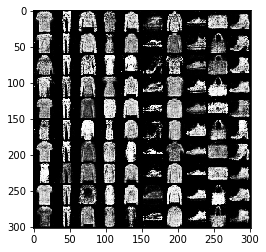

[Epoch 50/100] [Batch 0/600] [D loss: 1.360137] [G loss: 0.727319]
[Epoch 50/100] [Batch 1/600] [D loss: 1.327722] [G loss: 0.735515]
[Epoch 50/100] [Batch 2/600] [D loss: 1.355777] [G loss: 0.742122]
[Epoch 50/100] [Batch 3/600] [D loss: 1.374404] [G loss: 0.752015]
[Epoch 50/100] [Batch 4/600] [D loss: 1.351404] [G loss: 0.796795]
[Epoch 50/100] [Batch 5/600] [D loss: 1.350614] [G loss: 0.747707]
[Epoch 50/100] [Batch 6/600] [D loss: 1.392870] [G loss: 0.728805]
[Epoch 50/100] [Batch 7/600] [D loss: 1.370160] [G loss: 0.747456]
[Epoch 50/100] [Batch 8/600] [D loss: 1.366735] [G loss: 0.750323]
[Epoch 50/100] [Batch 9/600] [D loss: 1.384494] [G loss: 0.786303]
[Epoch 50/100] [Batch 10/600] [D loss: 1.382710] [G loss: 0.774242]
[Epoch 50/100] [Batch 11/600] [D loss: 1.398492] [G loss: 0.770506]
[Epoch 50/100] [Batch 12/600] [D loss: 1.387444] [G loss: 0.750634]
[Epoch 50/100] [Batch 13/600] [D loss: 1.393911] [G loss: 0.753222]
[Epoch 50/100] [Batch 14/600] [D loss: 1.375113] [G loss: 

[Epoch 50/100] [Batch 238/600] [D loss: 1.378246] [G loss: 0.743141]
[Epoch 50/100] [Batch 239/600] [D loss: 1.351704] [G loss: 0.741394]
[Epoch 50/100] [Batch 240/600] [D loss: 1.341130] [G loss: 0.673000]
[Epoch 50/100] [Batch 241/600] [D loss: 1.375559] [G loss: 0.762039]
[Epoch 50/100] [Batch 242/600] [D loss: 1.354270] [G loss: 0.749530]
[Epoch 50/100] [Batch 243/600] [D loss: 1.348928] [G loss: 0.714198]
[Epoch 50/100] [Batch 244/600] [D loss: 1.341365] [G loss: 0.706462]
[Epoch 50/100] [Batch 245/600] [D loss: 1.322658] [G loss: 0.741990]
[Epoch 50/100] [Batch 246/600] [D loss: 1.372669] [G loss: 0.787540]
[Epoch 50/100] [Batch 247/600] [D loss: 1.380053] [G loss: 0.750662]
[Epoch 50/100] [Batch 248/600] [D loss: 1.366692] [G loss: 0.757844]
[Epoch 50/100] [Batch 249/600] [D loss: 1.375951] [G loss: 0.739848]
[Epoch 50/100] [Batch 250/600] [D loss: 1.346231] [G loss: 0.732357]
[Epoch 50/100] [Batch 251/600] [D loss: 1.345485] [G loss: 0.753776]
[Epoch 50/100] [Batch 252/600] [D 

[Epoch 50/100] [Batch 474/600] [D loss: 1.374276] [G loss: 0.751395]
[Epoch 50/100] [Batch 475/600] [D loss: 1.358360] [G loss: 0.752335]
[Epoch 50/100] [Batch 476/600] [D loss: 1.355865] [G loss: 0.726675]
[Epoch 50/100] [Batch 477/600] [D loss: 1.378104] [G loss: 0.755862]
[Epoch 50/100] [Batch 478/600] [D loss: 1.397826] [G loss: 0.765192]
[Epoch 50/100] [Batch 479/600] [D loss: 1.371431] [G loss: 0.771741]
[Epoch 50/100] [Batch 480/600] [D loss: 1.353407] [G loss: 0.730538]
[Epoch 50/100] [Batch 481/600] [D loss: 1.350796] [G loss: 0.731201]
[Epoch 50/100] [Batch 482/600] [D loss: 1.351574] [G loss: 0.710536]
[Epoch 50/100] [Batch 483/600] [D loss: 1.348031] [G loss: 0.666744]
[Epoch 50/100] [Batch 484/600] [D loss: 1.330688] [G loss: 0.708686]
[Epoch 50/100] [Batch 485/600] [D loss: 1.343009] [G loss: 0.725552]
[Epoch 50/100] [Batch 486/600] [D loss: 1.335753] [G loss: 0.754306]
[Epoch 50/100] [Batch 487/600] [D loss: 1.373546] [G loss: 0.777474]
[Epoch 50/100] [Batch 488/600] [D 

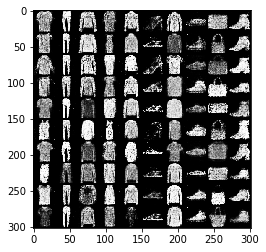

[Epoch 51/100] [Batch 0/600] [D loss: 1.344474] [G loss: 0.745117]
[Epoch 51/100] [Batch 1/600] [D loss: 1.385413] [G loss: 0.741950]
[Epoch 51/100] [Batch 2/600] [D loss: 1.379885] [G loss: 0.746558]
[Epoch 51/100] [Batch 3/600] [D loss: 1.356743] [G loss: 0.748746]
[Epoch 51/100] [Batch 4/600] [D loss: 1.382705] [G loss: 0.739368]
[Epoch 51/100] [Batch 5/600] [D loss: 1.402178] [G loss: 0.739701]
[Epoch 51/100] [Batch 6/600] [D loss: 1.346210] [G loss: 0.720337]
[Epoch 51/100] [Batch 7/600] [D loss: 1.368248] [G loss: 0.701227]
[Epoch 51/100] [Batch 8/600] [D loss: 1.364007] [G loss: 0.717994]
[Epoch 51/100] [Batch 9/600] [D loss: 1.396508] [G loss: 0.701236]
[Epoch 51/100] [Batch 10/600] [D loss: 1.366677] [G loss: 0.724918]
[Epoch 51/100] [Batch 11/600] [D loss: 1.395844] [G loss: 0.707927]
[Epoch 51/100] [Batch 12/600] [D loss: 1.383718] [G loss: 0.720023]
[Epoch 51/100] [Batch 13/600] [D loss: 1.374221] [G loss: 0.718318]
[Epoch 51/100] [Batch 14/600] [D loss: 1.390507] [G loss: 

[Epoch 51/100] [Batch 238/600] [D loss: 1.367321] [G loss: 0.749568]
[Epoch 51/100] [Batch 239/600] [D loss: 1.383446] [G loss: 0.750310]
[Epoch 51/100] [Batch 240/600] [D loss: 1.371887] [G loss: 0.739985]
[Epoch 51/100] [Batch 241/600] [D loss: 1.372203] [G loss: 0.729990]
[Epoch 51/100] [Batch 242/600] [D loss: 1.351233] [G loss: 0.694476]
[Epoch 51/100] [Batch 243/600] [D loss: 1.371340] [G loss: 0.691507]
[Epoch 51/100] [Batch 244/600] [D loss: 1.418693] [G loss: 0.729313]
[Epoch 51/100] [Batch 245/600] [D loss: 1.369901] [G loss: 0.741130]
[Epoch 51/100] [Batch 246/600] [D loss: 1.358798] [G loss: 0.740095]
[Epoch 51/100] [Batch 247/600] [D loss: 1.390655] [G loss: 0.743378]
[Epoch 51/100] [Batch 248/600] [D loss: 1.373149] [G loss: 0.752885]
[Epoch 51/100] [Batch 249/600] [D loss: 1.380247] [G loss: 0.717831]
[Epoch 51/100] [Batch 250/600] [D loss: 1.363719] [G loss: 0.727418]
[Epoch 51/100] [Batch 251/600] [D loss: 1.357878] [G loss: 0.727063]
[Epoch 51/100] [Batch 252/600] [D 

[Epoch 51/100] [Batch 474/600] [D loss: 1.353051] [G loss: 0.694476]
[Epoch 51/100] [Batch 475/600] [D loss: 1.391185] [G loss: 0.708783]
[Epoch 51/100] [Batch 476/600] [D loss: 1.387673] [G loss: 0.724209]
[Epoch 51/100] [Batch 477/600] [D loss: 1.358669] [G loss: 0.718263]
[Epoch 51/100] [Batch 478/600] [D loss: 1.362388] [G loss: 0.682234]
[Epoch 51/100] [Batch 479/600] [D loss: 1.394346] [G loss: 0.753189]
[Epoch 51/100] [Batch 480/600] [D loss: 1.360784] [G loss: 0.751035]
[Epoch 51/100] [Batch 481/600] [D loss: 1.367623] [G loss: 0.734134]
[Epoch 51/100] [Batch 482/600] [D loss: 1.354305] [G loss: 0.741994]
[Epoch 51/100] [Batch 483/600] [D loss: 1.380723] [G loss: 0.726794]
[Epoch 51/100] [Batch 484/600] [D loss: 1.371660] [G loss: 0.737039]
[Epoch 51/100] [Batch 485/600] [D loss: 1.350236] [G loss: 0.733811]
[Epoch 51/100] [Batch 486/600] [D loss: 1.333211] [G loss: 0.690045]
[Epoch 51/100] [Batch 487/600] [D loss: 1.357057] [G loss: 0.733880]
[Epoch 51/100] [Batch 488/600] [D 

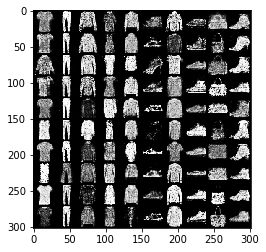

[Epoch 52/100] [Batch 0/600] [D loss: 1.381662] [G loss: 0.758923]
[Epoch 52/100] [Batch 1/600] [D loss: 1.357607] [G loss: 0.713584]
[Epoch 52/100] [Batch 2/600] [D loss: 1.382881] [G loss: 0.732703]
[Epoch 52/100] [Batch 3/600] [D loss: 1.340687] [G loss: 0.717606]
[Epoch 52/100] [Batch 4/600] [D loss: 1.351357] [G loss: 0.755957]
[Epoch 52/100] [Batch 5/600] [D loss: 1.385537] [G loss: 0.793940]
[Epoch 52/100] [Batch 6/600] [D loss: 1.376775] [G loss: 0.759420]
[Epoch 52/100] [Batch 7/600] [D loss: 1.336446] [G loss: 0.737757]
[Epoch 52/100] [Batch 8/600] [D loss: 1.351902] [G loss: 0.741126]
[Epoch 52/100] [Batch 9/600] [D loss: 1.392283] [G loss: 0.723604]
[Epoch 52/100] [Batch 10/600] [D loss: 1.363722] [G loss: 0.741243]
[Epoch 52/100] [Batch 11/600] [D loss: 1.368673] [G loss: 0.710954]
[Epoch 52/100] [Batch 12/600] [D loss: 1.424723] [G loss: 0.743406]
[Epoch 52/100] [Batch 13/600] [D loss: 1.385801] [G loss: 0.717997]
[Epoch 52/100] [Batch 14/600] [D loss: 1.418959] [G loss: 

[Epoch 52/100] [Batch 238/600] [D loss: 1.408677] [G loss: 0.752267]
[Epoch 52/100] [Batch 239/600] [D loss: 1.382905] [G loss: 0.742255]
[Epoch 52/100] [Batch 240/600] [D loss: 1.404945] [G loss: 0.734372]
[Epoch 52/100] [Batch 241/600] [D loss: 1.375327] [G loss: 0.729455]
[Epoch 52/100] [Batch 242/600] [D loss: 1.341962] [G loss: 0.710635]
[Epoch 52/100] [Batch 243/600] [D loss: 1.382884] [G loss: 0.694977]
[Epoch 52/100] [Batch 244/600] [D loss: 1.415772] [G loss: 0.733510]
[Epoch 52/100] [Batch 245/600] [D loss: 1.362404] [G loss: 0.727406]
[Epoch 52/100] [Batch 246/600] [D loss: 1.368656] [G loss: 0.693286]
[Epoch 52/100] [Batch 247/600] [D loss: 1.370619] [G loss: 0.693286]
[Epoch 52/100] [Batch 248/600] [D loss: 1.368847] [G loss: 0.690022]
[Epoch 52/100] [Batch 249/600] [D loss: 1.368751] [G loss: 0.709799]
[Epoch 52/100] [Batch 250/600] [D loss: 1.347435] [G loss: 0.714736]
[Epoch 52/100] [Batch 251/600] [D loss: 1.382702] [G loss: 0.739259]
[Epoch 52/100] [Batch 252/600] [D 

[Epoch 52/100] [Batch 474/600] [D loss: 1.385923] [G loss: 0.776792]
[Epoch 52/100] [Batch 475/600] [D loss: 1.382506] [G loss: 0.753526]
[Epoch 52/100] [Batch 476/600] [D loss: 1.367327] [G loss: 0.752147]
[Epoch 52/100] [Batch 477/600] [D loss: 1.383692] [G loss: 0.751574]
[Epoch 52/100] [Batch 478/600] [D loss: 1.373433] [G loss: 0.735397]
[Epoch 52/100] [Batch 479/600] [D loss: 1.386089] [G loss: 0.731573]
[Epoch 52/100] [Batch 480/600] [D loss: 1.363287] [G loss: 0.745800]
[Epoch 52/100] [Batch 481/600] [D loss: 1.366028] [G loss: 0.742928]
[Epoch 52/100] [Batch 482/600] [D loss: 1.393905] [G loss: 0.740540]
[Epoch 52/100] [Batch 483/600] [D loss: 1.393778] [G loss: 0.745624]
[Epoch 52/100] [Batch 484/600] [D loss: 1.349210] [G loss: 0.728874]
[Epoch 52/100] [Batch 485/600] [D loss: 1.374143] [G loss: 0.719835]
[Epoch 52/100] [Batch 486/600] [D loss: 1.365602] [G loss: 0.713849]
[Epoch 52/100] [Batch 487/600] [D loss: 1.383244] [G loss: 0.722468]
[Epoch 52/100] [Batch 488/600] [D 

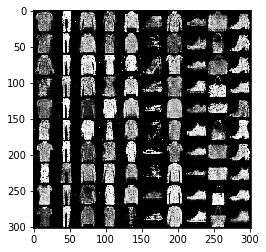

[Epoch 53/100] [Batch 0/600] [D loss: 1.369712] [G loss: 0.704624]
[Epoch 53/100] [Batch 1/600] [D loss: 1.372529] [G loss: 0.712638]
[Epoch 53/100] [Batch 2/600] [D loss: 1.384703] [G loss: 0.714403]
[Epoch 53/100] [Batch 3/600] [D loss: 1.382306] [G loss: 0.713341]
[Epoch 53/100] [Batch 4/600] [D loss: 1.379063] [G loss: 0.703204]
[Epoch 53/100] [Batch 5/600] [D loss: 1.366089] [G loss: 0.702745]
[Epoch 53/100] [Batch 6/600] [D loss: 1.370706] [G loss: 0.727976]
[Epoch 53/100] [Batch 7/600] [D loss: 1.350180] [G loss: 0.689073]
[Epoch 53/100] [Batch 8/600] [D loss: 1.360696] [G loss: 0.723253]
[Epoch 53/100] [Batch 9/600] [D loss: 1.388534] [G loss: 0.742204]
[Epoch 53/100] [Batch 10/600] [D loss: 1.373619] [G loss: 0.737097]
[Epoch 53/100] [Batch 11/600] [D loss: 1.393553] [G loss: 0.734413]
[Epoch 53/100] [Batch 12/600] [D loss: 1.351454] [G loss: 0.734451]
[Epoch 53/100] [Batch 13/600] [D loss: 1.360867] [G loss: 0.701693]
[Epoch 53/100] [Batch 14/600] [D loss: 1.339604] [G loss: 

[Epoch 53/100] [Batch 238/600] [D loss: 1.367228] [G loss: 0.733275]
[Epoch 53/100] [Batch 239/600] [D loss: 1.356778] [G loss: 0.701155]
[Epoch 53/100] [Batch 240/600] [D loss: 1.393445] [G loss: 0.724857]
[Epoch 53/100] [Batch 241/600] [D loss: 1.346574] [G loss: 0.719066]
[Epoch 53/100] [Batch 242/600] [D loss: 1.386681] [G loss: 0.756274]
[Epoch 53/100] [Batch 243/600] [D loss: 1.379877] [G loss: 0.747409]
[Epoch 53/100] [Batch 244/600] [D loss: 1.341104] [G loss: 0.728001]
[Epoch 53/100] [Batch 245/600] [D loss: 1.366649] [G loss: 0.735318]
[Epoch 53/100] [Batch 246/600] [D loss: 1.381311] [G loss: 0.742891]
[Epoch 53/100] [Batch 247/600] [D loss: 1.316318] [G loss: 0.711987]
[Epoch 53/100] [Batch 248/600] [D loss: 1.359802] [G loss: 0.683146]
[Epoch 53/100] [Batch 249/600] [D loss: 1.402214] [G loss: 0.728056]
[Epoch 53/100] [Batch 250/600] [D loss: 1.343945] [G loss: 0.745181]
[Epoch 53/100] [Batch 251/600] [D loss: 1.399735] [G loss: 0.753805]
[Epoch 53/100] [Batch 252/600] [D 

[Epoch 53/100] [Batch 474/600] [D loss: 1.374168] [G loss: 0.738569]
[Epoch 53/100] [Batch 475/600] [D loss: 1.356692] [G loss: 0.742833]
[Epoch 53/100] [Batch 476/600] [D loss: 1.362176] [G loss: 0.770210]
[Epoch 53/100] [Batch 477/600] [D loss: 1.354353] [G loss: 0.749503]
[Epoch 53/100] [Batch 478/600] [D loss: 1.366283] [G loss: 0.749938]
[Epoch 53/100] [Batch 479/600] [D loss: 1.386885] [G loss: 0.743380]
[Epoch 53/100] [Batch 480/600] [D loss: 1.367448] [G loss: 0.720031]
[Epoch 53/100] [Batch 481/600] [D loss: 1.347816] [G loss: 0.750272]
[Epoch 53/100] [Batch 482/600] [D loss: 1.363434] [G loss: 0.695014]
[Epoch 53/100] [Batch 483/600] [D loss: 1.354145] [G loss: 0.690735]
[Epoch 53/100] [Batch 484/600] [D loss: 1.373160] [G loss: 0.716450]
[Epoch 53/100] [Batch 485/600] [D loss: 1.375274] [G loss: 0.735658]
[Epoch 53/100] [Batch 486/600] [D loss: 1.366738] [G loss: 0.753293]
[Epoch 53/100] [Batch 487/600] [D loss: 1.393050] [G loss: 0.776769]
[Epoch 53/100] [Batch 488/600] [D 

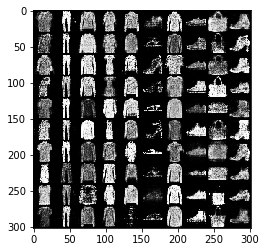

[Epoch 54/100] [Batch 0/600] [D loss: 1.380771] [G loss: 0.711422]
[Epoch 54/100] [Batch 1/600] [D loss: 1.381997] [G loss: 0.715488]
[Epoch 54/100] [Batch 2/600] [D loss: 1.354115] [G loss: 0.723477]
[Epoch 54/100] [Batch 3/600] [D loss: 1.405730] [G loss: 0.718363]
[Epoch 54/100] [Batch 4/600] [D loss: 1.353835] [G loss: 0.711207]
[Epoch 54/100] [Batch 5/600] [D loss: 1.379520] [G loss: 0.727558]
[Epoch 54/100] [Batch 6/600] [D loss: 1.387992] [G loss: 0.741717]
[Epoch 54/100] [Batch 7/600] [D loss: 1.374559] [G loss: 0.734268]
[Epoch 54/100] [Batch 8/600] [D loss: 1.366667] [G loss: 0.705391]
[Epoch 54/100] [Batch 9/600] [D loss: 1.378138] [G loss: 0.724542]
[Epoch 54/100] [Batch 10/600] [D loss: 1.377519] [G loss: 0.735101]
[Epoch 54/100] [Batch 11/600] [D loss: 1.362339] [G loss: 0.729532]
[Epoch 54/100] [Batch 12/600] [D loss: 1.365668] [G loss: 0.717840]
[Epoch 54/100] [Batch 13/600] [D loss: 1.372757] [G loss: 0.735920]
[Epoch 54/100] [Batch 14/600] [D loss: 1.360566] [G loss: 

[Epoch 54/100] [Batch 238/600] [D loss: 1.351293] [G loss: 0.754130]
[Epoch 54/100] [Batch 239/600] [D loss: 1.370274] [G loss: 0.770936]
[Epoch 54/100] [Batch 240/600] [D loss: 1.337673] [G loss: 0.753088]
[Epoch 54/100] [Batch 241/600] [D loss: 1.347192] [G loss: 0.699309]
[Epoch 54/100] [Batch 242/600] [D loss: 1.395398] [G loss: 0.714690]
[Epoch 54/100] [Batch 243/600] [D loss: 1.382176] [G loss: 0.748296]
[Epoch 54/100] [Batch 244/600] [D loss: 1.379674] [G loss: 0.739035]
[Epoch 54/100] [Batch 245/600] [D loss: 1.355014] [G loss: 0.732609]
[Epoch 54/100] [Batch 246/600] [D loss: 1.389120] [G loss: 0.735799]
[Epoch 54/100] [Batch 247/600] [D loss: 1.373913] [G loss: 0.715160]
[Epoch 54/100] [Batch 248/600] [D loss: 1.374560] [G loss: 0.692087]
[Epoch 54/100] [Batch 249/600] [D loss: 1.371875] [G loss: 0.729900]
[Epoch 54/100] [Batch 250/600] [D loss: 1.400371] [G loss: 0.732024]
[Epoch 54/100] [Batch 251/600] [D loss: 1.390753] [G loss: 0.748983]
[Epoch 54/100] [Batch 252/600] [D 

[Epoch 54/100] [Batch 474/600] [D loss: 1.402350] [G loss: 0.703201]
[Epoch 54/100] [Batch 475/600] [D loss: 1.375016] [G loss: 0.704686]
[Epoch 54/100] [Batch 476/600] [D loss: 1.427566] [G loss: 0.718362]
[Epoch 54/100] [Batch 477/600] [D loss: 1.409582] [G loss: 0.746426]
[Epoch 54/100] [Batch 478/600] [D loss: 1.398007] [G loss: 0.742252]
[Epoch 54/100] [Batch 479/600] [D loss: 1.384435] [G loss: 0.714528]
[Epoch 54/100] [Batch 480/600] [D loss: 1.382784] [G loss: 0.694739]
[Epoch 54/100] [Batch 481/600] [D loss: 1.366066] [G loss: 0.701800]
[Epoch 54/100] [Batch 482/600] [D loss: 1.388492] [G loss: 0.700372]
[Epoch 54/100] [Batch 483/600] [D loss: 1.359271] [G loss: 0.719185]
[Epoch 54/100] [Batch 484/600] [D loss: 1.376307] [G loss: 0.709278]
[Epoch 54/100] [Batch 485/600] [D loss: 1.378751] [G loss: 0.736029]
[Epoch 54/100] [Batch 486/600] [D loss: 1.368767] [G loss: 0.760634]
[Epoch 54/100] [Batch 487/600] [D loss: 1.361585] [G loss: 0.736425]
[Epoch 54/100] [Batch 488/600] [D 

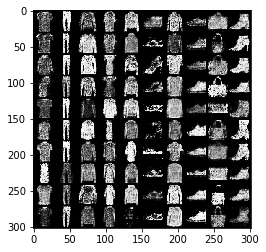

[Epoch 55/100] [Batch 0/600] [D loss: 1.394193] [G loss: 0.734403]
[Epoch 55/100] [Batch 1/600] [D loss: 1.365416] [G loss: 0.745009]
[Epoch 55/100] [Batch 2/600] [D loss: 1.339666] [G loss: 0.739413]
[Epoch 55/100] [Batch 3/600] [D loss: 1.383241] [G loss: 0.702606]
[Epoch 55/100] [Batch 4/600] [D loss: 1.341363] [G loss: 0.712591]
[Epoch 55/100] [Batch 5/600] [D loss: 1.386040] [G loss: 0.715711]
[Epoch 55/100] [Batch 6/600] [D loss: 1.422500] [G loss: 0.743935]
[Epoch 55/100] [Batch 7/600] [D loss: 1.404341] [G loss: 0.726413]
[Epoch 55/100] [Batch 8/600] [D loss: 1.357264] [G loss: 0.713460]
[Epoch 55/100] [Batch 9/600] [D loss: 1.384268] [G loss: 0.679725]
[Epoch 55/100] [Batch 10/600] [D loss: 1.387676] [G loss: 0.721660]
[Epoch 55/100] [Batch 11/600] [D loss: 1.358495] [G loss: 0.704318]
[Epoch 55/100] [Batch 12/600] [D loss: 1.348583] [G loss: 0.669802]
[Epoch 55/100] [Batch 13/600] [D loss: 1.330719] [G loss: 0.694246]
[Epoch 55/100] [Batch 14/600] [D loss: 1.363279] [G loss: 

[Epoch 55/100] [Batch 238/600] [D loss: 1.383802] [G loss: 0.725241]
[Epoch 55/100] [Batch 239/600] [D loss: 1.363142] [G loss: 0.741679]
[Epoch 55/100] [Batch 240/600] [D loss: 1.385910] [G loss: 0.741708]
[Epoch 55/100] [Batch 241/600] [D loss: 1.361520] [G loss: 0.723468]
[Epoch 55/100] [Batch 242/600] [D loss: 1.376362] [G loss: 0.713857]
[Epoch 55/100] [Batch 243/600] [D loss: 1.319396] [G loss: 0.699233]
[Epoch 55/100] [Batch 244/600] [D loss: 1.357671] [G loss: 0.733769]
[Epoch 55/100] [Batch 245/600] [D loss: 1.351438] [G loss: 0.682244]
[Epoch 55/100] [Batch 246/600] [D loss: 1.349628] [G loss: 0.701652]
[Epoch 55/100] [Batch 247/600] [D loss: 1.415817] [G loss: 0.744117]
[Epoch 55/100] [Batch 248/600] [D loss: 1.401401] [G loss: 0.754552]
[Epoch 55/100] [Batch 249/600] [D loss: 1.337370] [G loss: 0.727910]
[Epoch 55/100] [Batch 250/600] [D loss: 1.352456] [G loss: 0.753468]
[Epoch 55/100] [Batch 251/600] [D loss: 1.382517] [G loss: 0.728372]
[Epoch 55/100] [Batch 252/600] [D 

[Epoch 55/100] [Batch 474/600] [D loss: 1.392643] [G loss: 0.749472]
[Epoch 55/100] [Batch 475/600] [D loss: 1.397205] [G loss: 0.741351]
[Epoch 55/100] [Batch 476/600] [D loss: 1.395066] [G loss: 0.711454]
[Epoch 55/100] [Batch 477/600] [D loss: 1.351570] [G loss: 0.701489]
[Epoch 55/100] [Batch 478/600] [D loss: 1.355030] [G loss: 0.716383]
[Epoch 55/100] [Batch 479/600] [D loss: 1.383361] [G loss: 0.749921]
[Epoch 55/100] [Batch 480/600] [D loss: 1.394303] [G loss: 0.744137]
[Epoch 55/100] [Batch 481/600] [D loss: 1.401838] [G loss: 0.734372]
[Epoch 55/100] [Batch 482/600] [D loss: 1.404821] [G loss: 0.709560]
[Epoch 55/100] [Batch 483/600] [D loss: 1.398173] [G loss: 0.731009]
[Epoch 55/100] [Batch 484/600] [D loss: 1.359826] [G loss: 0.718017]
[Epoch 55/100] [Batch 485/600] [D loss: 1.406825] [G loss: 0.710880]
[Epoch 55/100] [Batch 486/600] [D loss: 1.384175] [G loss: 0.694232]
[Epoch 55/100] [Batch 487/600] [D loss: 1.364622] [G loss: 0.692025]
[Epoch 55/100] [Batch 488/600] [D 

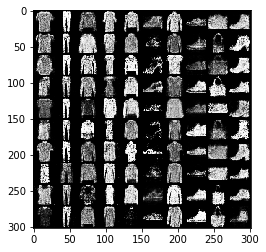

[Epoch 56/100] [Batch 0/600] [D loss: 1.350912] [G loss: 0.743495]
[Epoch 56/100] [Batch 1/600] [D loss: 1.362177] [G loss: 0.748179]
[Epoch 56/100] [Batch 2/600] [D loss: 1.343990] [G loss: 0.718978]
[Epoch 56/100] [Batch 3/600] [D loss: 1.384157] [G loss: 0.766967]
[Epoch 56/100] [Batch 4/600] [D loss: 1.365035] [G loss: 0.757918]
[Epoch 56/100] [Batch 5/600] [D loss: 1.389195] [G loss: 0.748157]
[Epoch 56/100] [Batch 6/600] [D loss: 1.391070] [G loss: 0.771073]
[Epoch 56/100] [Batch 7/600] [D loss: 1.368383] [G loss: 0.756705]
[Epoch 56/100] [Batch 8/600] [D loss: 1.343826] [G loss: 0.711527]
[Epoch 56/100] [Batch 9/600] [D loss: 1.356219] [G loss: 0.700655]
[Epoch 56/100] [Batch 10/600] [D loss: 1.399304] [G loss: 0.733971]
[Epoch 56/100] [Batch 11/600] [D loss: 1.361422] [G loss: 0.736859]
[Epoch 56/100] [Batch 12/600] [D loss: 1.369486] [G loss: 0.740201]
[Epoch 56/100] [Batch 13/600] [D loss: 1.350958] [G loss: 0.715524]
[Epoch 56/100] [Batch 14/600] [D loss: 1.375802] [G loss: 

[Epoch 56/100] [Batch 238/600] [D loss: 1.370081] [G loss: 0.727131]
[Epoch 56/100] [Batch 239/600] [D loss: 1.377613] [G loss: 0.740150]
[Epoch 56/100] [Batch 240/600] [D loss: 1.344883] [G loss: 0.743476]
[Epoch 56/100] [Batch 241/600] [D loss: 1.353060] [G loss: 0.719067]
[Epoch 56/100] [Batch 242/600] [D loss: 1.403230] [G loss: 0.728805]
[Epoch 56/100] [Batch 243/600] [D loss: 1.385707] [G loss: 0.759520]
[Epoch 56/100] [Batch 244/600] [D loss: 1.367185] [G loss: 0.751586]
[Epoch 56/100] [Batch 245/600] [D loss: 1.399572] [G loss: 0.744951]
[Epoch 56/100] [Batch 246/600] [D loss: 1.361257] [G loss: 0.743476]
[Epoch 56/100] [Batch 247/600] [D loss: 1.388374] [G loss: 0.741813]
[Epoch 56/100] [Batch 248/600] [D loss: 1.386156] [G loss: 0.734002]
[Epoch 56/100] [Batch 249/600] [D loss: 1.395347] [G loss: 0.740114]
[Epoch 56/100] [Batch 250/600] [D loss: 1.374360] [G loss: 0.742158]
[Epoch 56/100] [Batch 251/600] [D loss: 1.363261] [G loss: 0.725381]
[Epoch 56/100] [Batch 252/600] [D 

[Epoch 56/100] [Batch 474/600] [D loss: 1.368588] [G loss: 0.754028]
[Epoch 56/100] [Batch 475/600] [D loss: 1.391783] [G loss: 0.761833]
[Epoch 56/100] [Batch 476/600] [D loss: 1.341061] [G loss: 0.729977]
[Epoch 56/100] [Batch 477/600] [D loss: 1.364705] [G loss: 0.717019]
[Epoch 56/100] [Batch 478/600] [D loss: 1.399709] [G loss: 0.720510]
[Epoch 56/100] [Batch 479/600] [D loss: 1.346679] [G loss: 0.739150]
[Epoch 56/100] [Batch 480/600] [D loss: 1.371556] [G loss: 0.726965]
[Epoch 56/100] [Batch 481/600] [D loss: 1.344426] [G loss: 0.739854]
[Epoch 56/100] [Batch 482/600] [D loss: 1.358539] [G loss: 0.731831]
[Epoch 56/100] [Batch 483/600] [D loss: 1.390089] [G loss: 0.746276]
[Epoch 56/100] [Batch 484/600] [D loss: 1.369765] [G loss: 0.754023]
[Epoch 56/100] [Batch 485/600] [D loss: 1.382640] [G loss: 0.717585]
[Epoch 56/100] [Batch 486/600] [D loss: 1.400587] [G loss: 0.694070]
[Epoch 56/100] [Batch 487/600] [D loss: 1.432061] [G loss: 0.727164]
[Epoch 56/100] [Batch 488/600] [D 

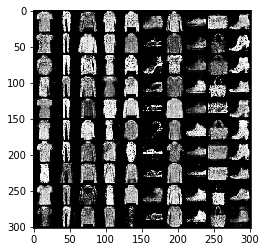

[Epoch 57/100] [Batch 0/600] [D loss: 1.385791] [G loss: 0.738577]
[Epoch 57/100] [Batch 1/600] [D loss: 1.386529] [G loss: 0.717381]
[Epoch 57/100] [Batch 2/600] [D loss: 1.391351] [G loss: 0.724747]
[Epoch 57/100] [Batch 3/600] [D loss: 1.386811] [G loss: 0.717584]
[Epoch 57/100] [Batch 4/600] [D loss: 1.377157] [G loss: 0.697927]
[Epoch 57/100] [Batch 5/600] [D loss: 1.367401] [G loss: 0.709103]
[Epoch 57/100] [Batch 6/600] [D loss: 1.365259] [G loss: 0.738192]
[Epoch 57/100] [Batch 7/600] [D loss: 1.369366] [G loss: 0.706900]
[Epoch 57/100] [Batch 8/600] [D loss: 1.347844] [G loss: 0.739885]
[Epoch 57/100] [Batch 9/600] [D loss: 1.383311] [G loss: 0.701570]
[Epoch 57/100] [Batch 10/600] [D loss: 1.376261] [G loss: 0.732573]
[Epoch 57/100] [Batch 11/600] [D loss: 1.414005] [G loss: 0.750970]
[Epoch 57/100] [Batch 12/600] [D loss: 1.346474] [G loss: 0.742722]
[Epoch 57/100] [Batch 13/600] [D loss: 1.329842] [G loss: 0.697773]
[Epoch 57/100] [Batch 14/600] [D loss: 1.384040] [G loss: 

[Epoch 57/100] [Batch 238/600] [D loss: 1.352280] [G loss: 0.738167]
[Epoch 57/100] [Batch 239/600] [D loss: 1.362136] [G loss: 0.737987]
[Epoch 57/100] [Batch 240/600] [D loss: 1.372603] [G loss: 0.697874]
[Epoch 57/100] [Batch 241/600] [D loss: 1.442199] [G loss: 0.799656]
[Epoch 57/100] [Batch 242/600] [D loss: 1.404824] [G loss: 0.770176]
[Epoch 57/100] [Batch 243/600] [D loss: 1.368982] [G loss: 0.755958]
[Epoch 57/100] [Batch 244/600] [D loss: 1.370589] [G loss: 0.758333]
[Epoch 57/100] [Batch 245/600] [D loss: 1.408358] [G loss: 0.759427]
[Epoch 57/100] [Batch 246/600] [D loss: 1.409486] [G loss: 0.751343]
[Epoch 57/100] [Batch 247/600] [D loss: 1.312989] [G loss: 0.743736]
[Epoch 57/100] [Batch 248/600] [D loss: 1.341136] [G loss: 0.690307]
[Epoch 57/100] [Batch 249/600] [D loss: 1.385756] [G loss: 0.719472]
[Epoch 57/100] [Batch 250/600] [D loss: 1.377101] [G loss: 0.796936]
[Epoch 57/100] [Batch 251/600] [D loss: 1.369348] [G loss: 0.756836]
[Epoch 57/100] [Batch 252/600] [D 

[Epoch 57/100] [Batch 474/600] [D loss: 1.350702] [G loss: 0.703397]
[Epoch 57/100] [Batch 475/600] [D loss: 1.392783] [G loss: 0.694836]
[Epoch 57/100] [Batch 476/600] [D loss: 1.376946] [G loss: 0.730657]
[Epoch 57/100] [Batch 477/600] [D loss: 1.384679] [G loss: 0.714609]
[Epoch 57/100] [Batch 478/600] [D loss: 1.368948] [G loss: 0.727816]
[Epoch 57/100] [Batch 479/600] [D loss: 1.390660] [G loss: 0.710891]
[Epoch 57/100] [Batch 480/600] [D loss: 1.402721] [G loss: 0.714358]
[Epoch 57/100] [Batch 481/600] [D loss: 1.407058] [G loss: 0.714733]
[Epoch 57/100] [Batch 482/600] [D loss: 1.387058] [G loss: 0.723970]
[Epoch 57/100] [Batch 483/600] [D loss: 1.350880] [G loss: 0.740664]
[Epoch 57/100] [Batch 484/600] [D loss: 1.348917] [G loss: 0.709255]
[Epoch 57/100] [Batch 485/600] [D loss: 1.363631] [G loss: 0.714533]
[Epoch 57/100] [Batch 486/600] [D loss: 1.386439] [G loss: 0.719515]
[Epoch 57/100] [Batch 487/600] [D loss: 1.389019] [G loss: 0.720037]
[Epoch 57/100] [Batch 488/600] [D 

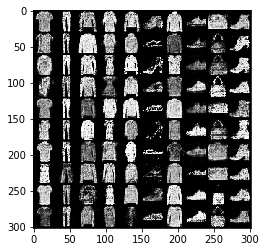

[Epoch 58/100] [Batch 0/600] [D loss: 1.353341] [G loss: 0.670189]
[Epoch 58/100] [Batch 1/600] [D loss: 1.373554] [G loss: 0.700461]
[Epoch 58/100] [Batch 2/600] [D loss: 1.355555] [G loss: 0.751489]
[Epoch 58/100] [Batch 3/600] [D loss: 1.331700] [G loss: 0.727314]
[Epoch 58/100] [Batch 4/600] [D loss: 1.363939] [G loss: 0.715741]
[Epoch 58/100] [Batch 5/600] [D loss: 1.357823] [G loss: 0.738012]
[Epoch 58/100] [Batch 6/600] [D loss: 1.361941] [G loss: 0.781009]
[Epoch 58/100] [Batch 7/600] [D loss: 1.382716] [G loss: 0.776657]
[Epoch 58/100] [Batch 8/600] [D loss: 1.398547] [G loss: 0.740876]
[Epoch 58/100] [Batch 9/600] [D loss: 1.363428] [G loss: 0.731727]
[Epoch 58/100] [Batch 10/600] [D loss: 1.373589] [G loss: 0.724230]
[Epoch 58/100] [Batch 11/600] [D loss: 1.337563] [G loss: 0.754743]
[Epoch 58/100] [Batch 12/600] [D loss: 1.384225] [G loss: 0.728090]
[Epoch 58/100] [Batch 13/600] [D loss: 1.381681] [G loss: 0.739351]
[Epoch 58/100] [Batch 14/600] [D loss: 1.368913] [G loss: 

[Epoch 58/100] [Batch 238/600] [D loss: 1.377406] [G loss: 0.727448]
[Epoch 58/100] [Batch 239/600] [D loss: 1.391148] [G loss: 0.728375]
[Epoch 58/100] [Batch 240/600] [D loss: 1.374486] [G loss: 0.739950]
[Epoch 58/100] [Batch 241/600] [D loss: 1.362500] [G loss: 0.736307]
[Epoch 58/100] [Batch 242/600] [D loss: 1.367443] [G loss: 0.725900]
[Epoch 58/100] [Batch 243/600] [D loss: 1.386785] [G loss: 0.710845]
[Epoch 58/100] [Batch 244/600] [D loss: 1.366672] [G loss: 0.702325]
[Epoch 58/100] [Batch 245/600] [D loss: 1.379467] [G loss: 0.729440]
[Epoch 58/100] [Batch 246/600] [D loss: 1.379806] [G loss: 0.750098]
[Epoch 58/100] [Batch 247/600] [D loss: 1.374279] [G loss: 0.738348]
[Epoch 58/100] [Batch 248/600] [D loss: 1.364385] [G loss: 0.745649]
[Epoch 58/100] [Batch 249/600] [D loss: 1.400242] [G loss: 0.731195]
[Epoch 58/100] [Batch 250/600] [D loss: 1.379370] [G loss: 0.734075]
[Epoch 58/100] [Batch 251/600] [D loss: 1.390184] [G loss: 0.725557]
[Epoch 58/100] [Batch 252/600] [D 

[Epoch 58/100] [Batch 474/600] [D loss: 1.355402] [G loss: 0.730665]
[Epoch 58/100] [Batch 475/600] [D loss: 1.352561] [G loss: 0.684713]
[Epoch 58/100] [Batch 476/600] [D loss: 1.428689] [G loss: 0.726034]
[Epoch 58/100] [Batch 477/600] [D loss: 1.401638] [G loss: 0.754518]
[Epoch 58/100] [Batch 478/600] [D loss: 1.367290] [G loss: 0.758111]
[Epoch 58/100] [Batch 479/600] [D loss: 1.396039] [G loss: 0.757273]
[Epoch 58/100] [Batch 480/600] [D loss: 1.387459] [G loss: 0.773593]
[Epoch 58/100] [Batch 481/600] [D loss: 1.385345] [G loss: 0.746879]
[Epoch 58/100] [Batch 482/600] [D loss: 1.391862] [G loss: 0.739179]
[Epoch 58/100] [Batch 483/600] [D loss: 1.400504] [G loss: 0.721175]
[Epoch 58/100] [Batch 484/600] [D loss: 1.377900] [G loss: 0.727985]
[Epoch 58/100] [Batch 485/600] [D loss: 1.366967] [G loss: 0.729278]
[Epoch 58/100] [Batch 486/600] [D loss: 1.346547] [G loss: 0.732499]
[Epoch 58/100] [Batch 487/600] [D loss: 1.359128] [G loss: 0.734197]
[Epoch 58/100] [Batch 488/600] [D 

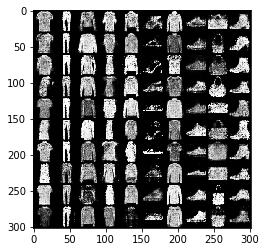

[Epoch 59/100] [Batch 0/600] [D loss: 1.391061] [G loss: 0.733867]
[Epoch 59/100] [Batch 1/600] [D loss: 1.414592] [G loss: 0.780551]
[Epoch 59/100] [Batch 2/600] [D loss: 1.401630] [G loss: 0.752443]
[Epoch 59/100] [Batch 3/600] [D loss: 1.388694] [G loss: 0.746981]
[Epoch 59/100] [Batch 4/600] [D loss: 1.371247] [G loss: 0.720810]
[Epoch 59/100] [Batch 5/600] [D loss: 1.385453] [G loss: 0.724943]
[Epoch 59/100] [Batch 6/600] [D loss: 1.370860] [G loss: 0.726484]
[Epoch 59/100] [Batch 7/600] [D loss: 1.367861] [G loss: 0.721903]
[Epoch 59/100] [Batch 8/600] [D loss: 1.381313] [G loss: 0.725742]
[Epoch 59/100] [Batch 9/600] [D loss: 1.372015] [G loss: 0.706266]
[Epoch 59/100] [Batch 10/600] [D loss: 1.356348] [G loss: 0.704123]
[Epoch 59/100] [Batch 11/600] [D loss: 1.393071] [G loss: 0.706588]
[Epoch 59/100] [Batch 12/600] [D loss: 1.398690] [G loss: 0.738859]
[Epoch 59/100] [Batch 13/600] [D loss: 1.365159] [G loss: 0.711344]
[Epoch 59/100] [Batch 14/600] [D loss: 1.387882] [G loss: 

[Epoch 59/100] [Batch 238/600] [D loss: 1.362057] [G loss: 0.697769]
[Epoch 59/100] [Batch 239/600] [D loss: 1.346674] [G loss: 0.728923]
[Epoch 59/100] [Batch 240/600] [D loss: 1.350066] [G loss: 0.705787]
[Epoch 59/100] [Batch 241/600] [D loss: 1.359719] [G loss: 0.703788]
[Epoch 59/100] [Batch 242/600] [D loss: 1.367428] [G loss: 0.728869]
[Epoch 59/100] [Batch 243/600] [D loss: 1.334980] [G loss: 0.710454]
[Epoch 59/100] [Batch 244/600] [D loss: 1.362298] [G loss: 0.724147]
[Epoch 59/100] [Batch 245/600] [D loss: 1.358326] [G loss: 0.715230]
[Epoch 59/100] [Batch 246/600] [D loss: 1.358645] [G loss: 0.719265]
[Epoch 59/100] [Batch 247/600] [D loss: 1.338413] [G loss: 0.735439]
[Epoch 59/100] [Batch 248/600] [D loss: 1.351609] [G loss: 0.729079]
[Epoch 59/100] [Batch 249/600] [D loss: 1.347883] [G loss: 0.730981]
[Epoch 59/100] [Batch 250/600] [D loss: 1.336594] [G loss: 0.759453]
[Epoch 59/100] [Batch 251/600] [D loss: 1.366083] [G loss: 0.704292]
[Epoch 59/100] [Batch 252/600] [D 

[Epoch 59/100] [Batch 474/600] [D loss: 1.413200] [G loss: 0.770804]
[Epoch 59/100] [Batch 475/600] [D loss: 1.372016] [G loss: 0.753752]
[Epoch 59/100] [Batch 476/600] [D loss: 1.387074] [G loss: 0.733418]
[Epoch 59/100] [Batch 477/600] [D loss: 1.372628] [G loss: 0.753457]
[Epoch 59/100] [Batch 478/600] [D loss: 1.373472] [G loss: 0.734160]
[Epoch 59/100] [Batch 479/600] [D loss: 1.369195] [G loss: 0.727559]
[Epoch 59/100] [Batch 480/600] [D loss: 1.425988] [G loss: 0.746327]
[Epoch 59/100] [Batch 481/600] [D loss: 1.380555] [G loss: 0.765475]
[Epoch 59/100] [Batch 482/600] [D loss: 1.371416] [G loss: 0.714197]
[Epoch 59/100] [Batch 483/600] [D loss: 1.360453] [G loss: 0.690944]
[Epoch 59/100] [Batch 484/600] [D loss: 1.390701] [G loss: 0.748790]
[Epoch 59/100] [Batch 485/600] [D loss: 1.398085] [G loss: 0.778681]
[Epoch 59/100] [Batch 486/600] [D loss: 1.363075] [G loss: 0.763447]
[Epoch 59/100] [Batch 487/600] [D loss: 1.372497] [G loss: 0.751003]
[Epoch 59/100] [Batch 488/600] [D 

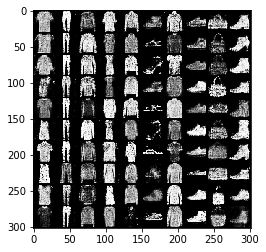

[Epoch 60/100] [Batch 0/600] [D loss: 1.361323] [G loss: 0.742349]
[Epoch 60/100] [Batch 1/600] [D loss: 1.380760] [G loss: 0.739382]
[Epoch 60/100] [Batch 2/600] [D loss: 1.345179] [G loss: 0.732499]
[Epoch 60/100] [Batch 3/600] [D loss: 1.397668] [G loss: 0.732361]
[Epoch 60/100] [Batch 4/600] [D loss: 1.371149] [G loss: 0.730216]
[Epoch 60/100] [Batch 5/600] [D loss: 1.372733] [G loss: 0.754038]
[Epoch 60/100] [Batch 6/600] [D loss: 1.385036] [G loss: 0.747106]
[Epoch 60/100] [Batch 7/600] [D loss: 1.377988] [G loss: 0.727014]
[Epoch 60/100] [Batch 8/600] [D loss: 1.396732] [G loss: 0.751545]
[Epoch 60/100] [Batch 9/600] [D loss: 1.338464] [G loss: 0.721640]
[Epoch 60/100] [Batch 10/600] [D loss: 1.390063] [G loss: 0.735059]
[Epoch 60/100] [Batch 11/600] [D loss: 1.345328] [G loss: 0.732271]
[Epoch 60/100] [Batch 12/600] [D loss: 1.353815] [G loss: 0.725596]
[Epoch 60/100] [Batch 13/600] [D loss: 1.361028] [G loss: 0.722315]
[Epoch 60/100] [Batch 14/600] [D loss: 1.365396] [G loss: 

[Epoch 60/100] [Batch 238/600] [D loss: 1.382173] [G loss: 0.760945]
[Epoch 60/100] [Batch 239/600] [D loss: 1.374891] [G loss: 0.717549]
[Epoch 60/100] [Batch 240/600] [D loss: 1.387328] [G loss: 0.714712]
[Epoch 60/100] [Batch 241/600] [D loss: 1.383292] [G loss: 0.712584]
[Epoch 60/100] [Batch 242/600] [D loss: 1.357259] [G loss: 0.706086]
[Epoch 60/100] [Batch 243/600] [D loss: 1.384215] [G loss: 0.709957]
[Epoch 60/100] [Batch 244/600] [D loss: 1.383852] [G loss: 0.743125]
[Epoch 60/100] [Batch 245/600] [D loss: 1.372520] [G loss: 0.743474]
[Epoch 60/100] [Batch 246/600] [D loss: 1.355169] [G loss: 0.728059]
[Epoch 60/100] [Batch 247/600] [D loss: 1.340021] [G loss: 0.697052]
[Epoch 60/100] [Batch 248/600] [D loss: 1.369157] [G loss: 0.718358]
[Epoch 60/100] [Batch 249/600] [D loss: 1.390026] [G loss: 0.724236]
[Epoch 60/100] [Batch 250/600] [D loss: 1.360340] [G loss: 0.711838]
[Epoch 60/100] [Batch 251/600] [D loss: 1.371565] [G loss: 0.724773]
[Epoch 60/100] [Batch 252/600] [D 

[Epoch 60/100] [Batch 474/600] [D loss: 1.368129] [G loss: 0.732757]
[Epoch 60/100] [Batch 475/600] [D loss: 1.362044] [G loss: 0.729462]
[Epoch 60/100] [Batch 476/600] [D loss: 1.359340] [G loss: 0.727459]
[Epoch 60/100] [Batch 477/600] [D loss: 1.332853] [G loss: 0.733528]
[Epoch 60/100] [Batch 478/600] [D loss: 1.351603] [G loss: 0.731462]
[Epoch 60/100] [Batch 479/600] [D loss: 1.370430] [G loss: 0.738436]
[Epoch 60/100] [Batch 480/600] [D loss: 1.391758] [G loss: 0.758516]
[Epoch 60/100] [Batch 481/600] [D loss: 1.382717] [G loss: 0.733419]
[Epoch 60/100] [Batch 482/600] [D loss: 1.391818] [G loss: 0.704983]
[Epoch 60/100] [Batch 483/600] [D loss: 1.380341] [G loss: 0.736763]
[Epoch 60/100] [Batch 484/600] [D loss: 1.361449] [G loss: 0.699613]
[Epoch 60/100] [Batch 485/600] [D loss: 1.428070] [G loss: 0.757571]
[Epoch 60/100] [Batch 486/600] [D loss: 1.374189] [G loss: 0.766080]
[Epoch 60/100] [Batch 487/600] [D loss: 1.373751] [G loss: 0.749423]
[Epoch 60/100] [Batch 488/600] [D 

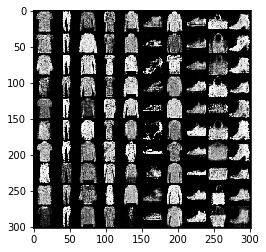

[Epoch 61/100] [Batch 0/600] [D loss: 1.389061] [G loss: 0.737135]
[Epoch 61/100] [Batch 1/600] [D loss: 1.365176] [G loss: 0.727613]
[Epoch 61/100] [Batch 2/600] [D loss: 1.369320] [G loss: 0.697195]
[Epoch 61/100] [Batch 3/600] [D loss: 1.367993] [G loss: 0.731091]
[Epoch 61/100] [Batch 4/600] [D loss: 1.375984] [G loss: 0.744734]
[Epoch 61/100] [Batch 5/600] [D loss: 1.404077] [G loss: 0.759000]
[Epoch 61/100] [Batch 6/600] [D loss: 1.402216] [G loss: 0.722372]
[Epoch 61/100] [Batch 7/600] [D loss: 1.386901] [G loss: 0.700258]
[Epoch 61/100] [Batch 8/600] [D loss: 1.368486] [G loss: 0.728470]
[Epoch 61/100] [Batch 9/600] [D loss: 1.341977] [G loss: 0.713051]
[Epoch 61/100] [Batch 10/600] [D loss: 1.364057] [G loss: 0.723129]
[Epoch 61/100] [Batch 11/600] [D loss: 1.364646] [G loss: 0.757732]
[Epoch 61/100] [Batch 12/600] [D loss: 1.370061] [G loss: 0.734711]
[Epoch 61/100] [Batch 13/600] [D loss: 1.346124] [G loss: 0.769820]
[Epoch 61/100] [Batch 14/600] [D loss: 1.382872] [G loss: 

[Epoch 61/100] [Batch 238/600] [D loss: 1.343163] [G loss: 0.704930]
[Epoch 61/100] [Batch 239/600] [D loss: 1.348893] [G loss: 0.691217]
[Epoch 61/100] [Batch 240/600] [D loss: 1.345175] [G loss: 0.673456]
[Epoch 61/100] [Batch 241/600] [D loss: 1.380202] [G loss: 0.734160]
[Epoch 61/100] [Batch 242/600] [D loss: 1.353957] [G loss: 0.702593]
[Epoch 61/100] [Batch 243/600] [D loss: 1.354605] [G loss: 0.722394]
[Epoch 61/100] [Batch 244/600] [D loss: 1.343503] [G loss: 0.711525]
[Epoch 61/100] [Batch 245/600] [D loss: 1.389469] [G loss: 0.717543]
[Epoch 61/100] [Batch 246/600] [D loss: 1.375950] [G loss: 0.739187]
[Epoch 61/100] [Batch 247/600] [D loss: 1.371372] [G loss: 0.769994]
[Epoch 61/100] [Batch 248/600] [D loss: 1.375744] [G loss: 0.740168]
[Epoch 61/100] [Batch 249/600] [D loss: 1.379940] [G loss: 0.732278]
[Epoch 61/100] [Batch 250/600] [D loss: 1.393950] [G loss: 0.726765]
[Epoch 61/100] [Batch 251/600] [D loss: 1.412118] [G loss: 0.743036]
[Epoch 61/100] [Batch 252/600] [D 

[Epoch 61/100] [Batch 474/600] [D loss: 1.366516] [G loss: 0.763119]
[Epoch 61/100] [Batch 475/600] [D loss: 1.385355] [G loss: 0.717179]
[Epoch 61/100] [Batch 476/600] [D loss: 1.377173] [G loss: 0.739714]
[Epoch 61/100] [Batch 477/600] [D loss: 1.383787] [G loss: 0.753980]
[Epoch 61/100] [Batch 478/600] [D loss: 1.391011] [G loss: 0.759032]
[Epoch 61/100] [Batch 479/600] [D loss: 1.380903] [G loss: 0.732920]
[Epoch 61/100] [Batch 480/600] [D loss: 1.388838] [G loss: 0.738559]
[Epoch 61/100] [Batch 481/600] [D loss: 1.381737] [G loss: 0.713678]
[Epoch 61/100] [Batch 482/600] [D loss: 1.383641] [G loss: 0.704363]
[Epoch 61/100] [Batch 483/600] [D loss: 1.371778] [G loss: 0.708364]
[Epoch 61/100] [Batch 484/600] [D loss: 1.358032] [G loss: 0.711600]
[Epoch 61/100] [Batch 485/600] [D loss: 1.362893] [G loss: 0.692503]
[Epoch 61/100] [Batch 486/600] [D loss: 1.373491] [G loss: 0.700042]
[Epoch 61/100] [Batch 487/600] [D loss: 1.398442] [G loss: 0.713771]
[Epoch 61/100] [Batch 488/600] [D 

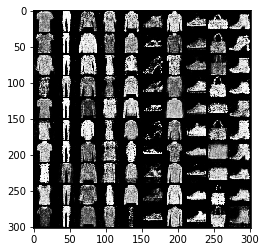

[Epoch 62/100] [Batch 0/600] [D loss: 1.360938] [G loss: 0.706260]
[Epoch 62/100] [Batch 1/600] [D loss: 1.387507] [G loss: 0.712339]
[Epoch 62/100] [Batch 2/600] [D loss: 1.403311] [G loss: 0.734831]
[Epoch 62/100] [Batch 3/600] [D loss: 1.370260] [G loss: 0.720887]
[Epoch 62/100] [Batch 4/600] [D loss: 1.382658] [G loss: 0.762436]
[Epoch 62/100] [Batch 5/600] [D loss: 1.366821] [G loss: 0.753393]
[Epoch 62/100] [Batch 6/600] [D loss: 1.391573] [G loss: 0.752176]
[Epoch 62/100] [Batch 7/600] [D loss: 1.408263] [G loss: 0.751732]
[Epoch 62/100] [Batch 8/600] [D loss: 1.380564] [G loss: 0.745552]
[Epoch 62/100] [Batch 9/600] [D loss: 1.374359] [G loss: 0.745650]
[Epoch 62/100] [Batch 10/600] [D loss: 1.359414] [G loss: 0.737475]
[Epoch 62/100] [Batch 11/600] [D loss: 1.378658] [G loss: 0.708511]
[Epoch 62/100] [Batch 12/600] [D loss: 1.360849] [G loss: 0.710902]
[Epoch 62/100] [Batch 13/600] [D loss: 1.375093] [G loss: 0.697730]
[Epoch 62/100] [Batch 14/600] [D loss: 1.375738] [G loss: 

[Epoch 62/100] [Batch 238/600] [D loss: 1.355353] [G loss: 0.713543]
[Epoch 62/100] [Batch 239/600] [D loss: 1.373916] [G loss: 0.764876]
[Epoch 62/100] [Batch 240/600] [D loss: 1.379677] [G loss: 0.729455]
[Epoch 62/100] [Batch 241/600] [D loss: 1.348079] [G loss: 0.742864]
[Epoch 62/100] [Batch 242/600] [D loss: 1.384754] [G loss: 0.714845]
[Epoch 62/100] [Batch 243/600] [D loss: 1.342351] [G loss: 0.715604]
[Epoch 62/100] [Batch 244/600] [D loss: 1.398927] [G loss: 0.738683]
[Epoch 62/100] [Batch 245/600] [D loss: 1.370005] [G loss: 0.763661]
[Epoch 62/100] [Batch 246/600] [D loss: 1.380248] [G loss: 0.760708]
[Epoch 62/100] [Batch 247/600] [D loss: 1.406268] [G loss: 0.731790]
[Epoch 62/100] [Batch 248/600] [D loss: 1.404340] [G loss: 0.745449]
[Epoch 62/100] [Batch 249/600] [D loss: 1.366902] [G loss: 0.719542]
[Epoch 62/100] [Batch 250/600] [D loss: 1.352828] [G loss: 0.719814]
[Epoch 62/100] [Batch 251/600] [D loss: 1.355624] [G loss: 0.740743]
[Epoch 62/100] [Batch 252/600] [D 

[Epoch 62/100] [Batch 474/600] [D loss: 1.387550] [G loss: 0.739438]
[Epoch 62/100] [Batch 475/600] [D loss: 1.360330] [G loss: 0.724037]
[Epoch 62/100] [Batch 476/600] [D loss: 1.376785] [G loss: 0.726573]
[Epoch 62/100] [Batch 477/600] [D loss: 1.354589] [G loss: 0.748385]
[Epoch 62/100] [Batch 478/600] [D loss: 1.377037] [G loss: 0.750208]
[Epoch 62/100] [Batch 479/600] [D loss: 1.361688] [G loss: 0.715913]
[Epoch 62/100] [Batch 480/600] [D loss: 1.375199] [G loss: 0.716840]
[Epoch 62/100] [Batch 481/600] [D loss: 1.358415] [G loss: 0.717844]
[Epoch 62/100] [Batch 482/600] [D loss: 1.347068] [G loss: 0.721166]
[Epoch 62/100] [Batch 483/600] [D loss: 1.311957] [G loss: 0.713813]
[Epoch 62/100] [Batch 484/600] [D loss: 1.377674] [G loss: 0.735746]
[Epoch 62/100] [Batch 485/600] [D loss: 1.412125] [G loss: 0.737965]
[Epoch 62/100] [Batch 486/600] [D loss: 1.366404] [G loss: 0.742284]
[Epoch 62/100] [Batch 487/600] [D loss: 1.375287] [G loss: 0.758558]
[Epoch 62/100] [Batch 488/600] [D 

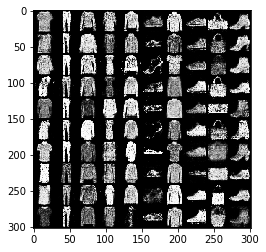

[Epoch 63/100] [Batch 0/600] [D loss: 1.403394] [G loss: 0.761312]
[Epoch 63/100] [Batch 1/600] [D loss: 1.398007] [G loss: 0.770266]
[Epoch 63/100] [Batch 2/600] [D loss: 1.405961] [G loss: 0.743037]
[Epoch 63/100] [Batch 3/600] [D loss: 1.389611] [G loss: 0.723580]
[Epoch 63/100] [Batch 4/600] [D loss: 1.383352] [G loss: 0.693038]
[Epoch 63/100] [Batch 5/600] [D loss: 1.378979] [G loss: 0.688805]
[Epoch 63/100] [Batch 6/600] [D loss: 1.385655] [G loss: 0.709879]
[Epoch 63/100] [Batch 7/600] [D loss: 1.386242] [G loss: 0.732996]
[Epoch 63/100] [Batch 8/600] [D loss: 1.369953] [G loss: 0.731649]
[Epoch 63/100] [Batch 9/600] [D loss: 1.362186] [G loss: 0.709084]
[Epoch 63/100] [Batch 10/600] [D loss: 1.369756] [G loss: 0.722359]
[Epoch 63/100] [Batch 11/600] [D loss: 1.386808] [G loss: 0.713086]
[Epoch 63/100] [Batch 12/600] [D loss: 1.349591] [G loss: 0.717895]
[Epoch 63/100] [Batch 13/600] [D loss: 1.383078] [G loss: 0.713647]
[Epoch 63/100] [Batch 14/600] [D loss: 1.358190] [G loss: 

[Epoch 63/100] [Batch 238/600] [D loss: 1.381725] [G loss: 0.777849]
[Epoch 63/100] [Batch 239/600] [D loss: 1.403581] [G loss: 0.728338]
[Epoch 63/100] [Batch 240/600] [D loss: 1.406992] [G loss: 0.718311]
[Epoch 63/100] [Batch 241/600] [D loss: 1.432090] [G loss: 0.765838]
[Epoch 63/100] [Batch 242/600] [D loss: 1.368110] [G loss: 0.738042]
[Epoch 63/100] [Batch 243/600] [D loss: 1.385332] [G loss: 0.756816]
[Epoch 63/100] [Batch 244/600] [D loss: 1.391562] [G loss: 0.748108]
[Epoch 63/100] [Batch 245/600] [D loss: 1.387431] [G loss: 0.755381]
[Epoch 63/100] [Batch 246/600] [D loss: 1.368622] [G loss: 0.732621]
[Epoch 63/100] [Batch 247/600] [D loss: 1.360232] [G loss: 0.729139]
[Epoch 63/100] [Batch 248/600] [D loss: 1.379486] [G loss: 0.739810]
[Epoch 63/100] [Batch 249/600] [D loss: 1.380908] [G loss: 0.744843]
[Epoch 63/100] [Batch 250/600] [D loss: 1.408369] [G loss: 0.715978]
[Epoch 63/100] [Batch 251/600] [D loss: 1.381742] [G loss: 0.729142]
[Epoch 63/100] [Batch 252/600] [D 

[Epoch 63/100] [Batch 474/600] [D loss: 1.342303] [G loss: 0.707902]
[Epoch 63/100] [Batch 475/600] [D loss: 1.377997] [G loss: 0.714755]
[Epoch 63/100] [Batch 476/600] [D loss: 1.348726] [G loss: 0.718009]
[Epoch 63/100] [Batch 477/600] [D loss: 1.328955] [G loss: 0.712965]
[Epoch 63/100] [Batch 478/600] [D loss: 1.351520] [G loss: 0.724654]
[Epoch 63/100] [Batch 479/600] [D loss: 1.365878] [G loss: 0.723641]
[Epoch 63/100] [Batch 480/600] [D loss: 1.332426] [G loss: 0.743666]
[Epoch 63/100] [Batch 481/600] [D loss: 1.369714] [G loss: 0.736317]
[Epoch 63/100] [Batch 482/600] [D loss: 1.352516] [G loss: 0.770145]
[Epoch 63/100] [Batch 483/600] [D loss: 1.379272] [G loss: 0.750953]
[Epoch 63/100] [Batch 484/600] [D loss: 1.332409] [G loss: 0.703347]
[Epoch 63/100] [Batch 485/600] [D loss: 1.377330] [G loss: 0.715658]
[Epoch 63/100] [Batch 486/600] [D loss: 1.358105] [G loss: 0.722260]
[Epoch 63/100] [Batch 487/600] [D loss: 1.379701] [G loss: 0.757713]
[Epoch 63/100] [Batch 488/600] [D 

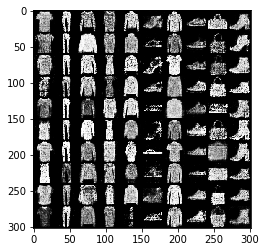

[Epoch 64/100] [Batch 0/600] [D loss: 1.376344] [G loss: 0.695364]
[Epoch 64/100] [Batch 1/600] [D loss: 1.381756] [G loss: 0.729228]
[Epoch 64/100] [Batch 2/600] [D loss: 1.341351] [G loss: 0.714101]
[Epoch 64/100] [Batch 3/600] [D loss: 1.356480] [G loss: 0.760345]
[Epoch 64/100] [Batch 4/600] [D loss: 1.383158] [G loss: 0.766604]
[Epoch 64/100] [Batch 5/600] [D loss: 1.348706] [G loss: 0.730755]
[Epoch 64/100] [Batch 6/600] [D loss: 1.381195] [G loss: 0.748203]
[Epoch 64/100] [Batch 7/600] [D loss: 1.375141] [G loss: 0.723979]
[Epoch 64/100] [Batch 8/600] [D loss: 1.347281] [G loss: 0.749417]
[Epoch 64/100] [Batch 9/600] [D loss: 1.382865] [G loss: 0.763200]
[Epoch 64/100] [Batch 10/600] [D loss: 1.395889] [G loss: 0.769390]
[Epoch 64/100] [Batch 11/600] [D loss: 1.381509] [G loss: 0.755792]
[Epoch 64/100] [Batch 12/600] [D loss: 1.389791] [G loss: 0.769444]
[Epoch 64/100] [Batch 13/600] [D loss: 1.361226] [G loss: 0.730398]
[Epoch 64/100] [Batch 14/600] [D loss: 1.349918] [G loss: 

[Epoch 64/100] [Batch 238/600] [D loss: 1.376906] [G loss: 0.709263]
[Epoch 64/100] [Batch 239/600] [D loss: 1.418256] [G loss: 0.761357]
[Epoch 64/100] [Batch 240/600] [D loss: 1.406107] [G loss: 0.764323]
[Epoch 64/100] [Batch 241/600] [D loss: 1.395938] [G loss: 0.771473]
[Epoch 64/100] [Batch 242/600] [D loss: 1.357136] [G loss: 0.753384]
[Epoch 64/100] [Batch 243/600] [D loss: 1.373315] [G loss: 0.734622]
[Epoch 64/100] [Batch 244/600] [D loss: 1.364033] [G loss: 0.735669]
[Epoch 64/100] [Batch 245/600] [D loss: 1.364978] [G loss: 0.751648]
[Epoch 64/100] [Batch 246/600] [D loss: 1.346336] [G loss: 0.730932]
[Epoch 64/100] [Batch 247/600] [D loss: 1.364945] [G loss: 0.716908]
[Epoch 64/100] [Batch 248/600] [D loss: 1.371805] [G loss: 0.725975]
[Epoch 64/100] [Batch 249/600] [D loss: 1.355565] [G loss: 0.727358]
[Epoch 64/100] [Batch 250/600] [D loss: 1.385939] [G loss: 0.728262]
[Epoch 64/100] [Batch 251/600] [D loss: 1.355858] [G loss: 0.718311]
[Epoch 64/100] [Batch 252/600] [D 

[Epoch 64/100] [Batch 474/600] [D loss: 1.381517] [G loss: 0.709938]
[Epoch 64/100] [Batch 475/600] [D loss: 1.343533] [G loss: 0.705754]
[Epoch 64/100] [Batch 476/600] [D loss: 1.383587] [G loss: 0.721565]
[Epoch 64/100] [Batch 477/600] [D loss: 1.349105] [G loss: 0.708449]
[Epoch 64/100] [Batch 478/600] [D loss: 1.378254] [G loss: 0.730861]
[Epoch 64/100] [Batch 479/600] [D loss: 1.410316] [G loss: 0.755944]
[Epoch 64/100] [Batch 480/600] [D loss: 1.351068] [G loss: 0.731050]
[Epoch 64/100] [Batch 481/600] [D loss: 1.349905] [G loss: 0.722950]
[Epoch 64/100] [Batch 482/600] [D loss: 1.394766] [G loss: 0.725325]
[Epoch 64/100] [Batch 483/600] [D loss: 1.361894] [G loss: 0.719529]
[Epoch 64/100] [Batch 484/600] [D loss: 1.378682] [G loss: 0.714187]
[Epoch 64/100] [Batch 485/600] [D loss: 1.394057] [G loss: 0.733097]
[Epoch 64/100] [Batch 486/600] [D loss: 1.356152] [G loss: 0.704016]
[Epoch 64/100] [Batch 487/600] [D loss: 1.368982] [G loss: 0.697078]
[Epoch 64/100] [Batch 488/600] [D 

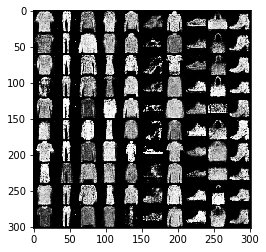

[Epoch 65/100] [Batch 0/600] [D loss: 1.409356] [G loss: 0.730081]
[Epoch 65/100] [Batch 1/600] [D loss: 1.394083] [G loss: 0.746400]
[Epoch 65/100] [Batch 2/600] [D loss: 1.396157] [G loss: 0.737960]
[Epoch 65/100] [Batch 3/600] [D loss: 1.374849] [G loss: 0.726322]
[Epoch 65/100] [Batch 4/600] [D loss: 1.364737] [G loss: 0.710980]
[Epoch 65/100] [Batch 5/600] [D loss: 1.358131] [G loss: 0.695959]
[Epoch 65/100] [Batch 6/600] [D loss: 1.394504] [G loss: 0.729981]
[Epoch 65/100] [Batch 7/600] [D loss: 1.396430] [G loss: 0.744697]
[Epoch 65/100] [Batch 8/600] [D loss: 1.342572] [G loss: 0.739450]
[Epoch 65/100] [Batch 9/600] [D loss: 1.355129] [G loss: 0.725417]
[Epoch 65/100] [Batch 10/600] [D loss: 1.364669] [G loss: 0.750848]
[Epoch 65/100] [Batch 11/600] [D loss: 1.350282] [G loss: 0.727892]
[Epoch 65/100] [Batch 12/600] [D loss: 1.360575] [G loss: 0.726732]
[Epoch 65/100] [Batch 13/600] [D loss: 1.362931] [G loss: 0.709028]
[Epoch 65/100] [Batch 14/600] [D loss: 1.391757] [G loss: 

[Epoch 65/100] [Batch 238/600] [D loss: 1.387089] [G loss: 0.734082]
[Epoch 65/100] [Batch 239/600] [D loss: 1.386049] [G loss: 0.727931]
[Epoch 65/100] [Batch 240/600] [D loss: 1.376809] [G loss: 0.695592]
[Epoch 65/100] [Batch 241/600] [D loss: 1.354190] [G loss: 0.690515]
[Epoch 65/100] [Batch 242/600] [D loss: 1.393206] [G loss: 0.700840]
[Epoch 65/100] [Batch 243/600] [D loss: 1.403211] [G loss: 0.716411]
[Epoch 65/100] [Batch 244/600] [D loss: 1.382406] [G loss: 0.737191]
[Epoch 65/100] [Batch 245/600] [D loss: 1.393996] [G loss: 0.723892]
[Epoch 65/100] [Batch 246/600] [D loss: 1.359684] [G loss: 0.703334]
[Epoch 65/100] [Batch 247/600] [D loss: 1.353026] [G loss: 0.698560]
[Epoch 65/100] [Batch 248/600] [D loss: 1.371955] [G loss: 0.694451]
[Epoch 65/100] [Batch 249/600] [D loss: 1.378321] [G loss: 0.744684]
[Epoch 65/100] [Batch 250/600] [D loss: 1.369098] [G loss: 0.722359]
[Epoch 65/100] [Batch 251/600] [D loss: 1.390216] [G loss: 0.745515]
[Epoch 65/100] [Batch 252/600] [D 

[Epoch 65/100] [Batch 474/600] [D loss: 1.372521] [G loss: 0.719974]
[Epoch 65/100] [Batch 475/600] [D loss: 1.402953] [G loss: 0.722190]
[Epoch 65/100] [Batch 476/600] [D loss: 1.381335] [G loss: 0.717074]
[Epoch 65/100] [Batch 477/600] [D loss: 1.353618] [G loss: 0.719048]
[Epoch 65/100] [Batch 478/600] [D loss: 1.374576] [G loss: 0.719631]
[Epoch 65/100] [Batch 479/600] [D loss: 1.366017] [G loss: 0.706204]
[Epoch 65/100] [Batch 480/600] [D loss: 1.358808] [G loss: 0.698808]
[Epoch 65/100] [Batch 481/600] [D loss: 1.361599] [G loss: 0.725547]
[Epoch 65/100] [Batch 482/600] [D loss: 1.365141] [G loss: 0.721990]
[Epoch 65/100] [Batch 483/600] [D loss: 1.380941] [G loss: 0.715072]
[Epoch 65/100] [Batch 484/600] [D loss: 1.375255] [G loss: 0.723197]
[Epoch 65/100] [Batch 485/600] [D loss: 1.358285] [G loss: 0.708823]
[Epoch 65/100] [Batch 486/600] [D loss: 1.369659] [G loss: 0.732570]
[Epoch 65/100] [Batch 487/600] [D loss: 1.364307] [G loss: 0.721375]
[Epoch 65/100] [Batch 488/600] [D 

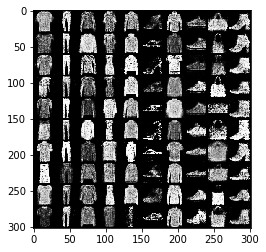

[Epoch 66/100] [Batch 0/600] [D loss: 1.328688] [G loss: 0.733897]
[Epoch 66/100] [Batch 1/600] [D loss: 1.406326] [G loss: 0.705464]
[Epoch 66/100] [Batch 2/600] [D loss: 1.364623] [G loss: 0.704980]
[Epoch 66/100] [Batch 3/600] [D loss: 1.364909] [G loss: 0.719481]
[Epoch 66/100] [Batch 4/600] [D loss: 1.389048] [G loss: 0.721450]
[Epoch 66/100] [Batch 5/600] [D loss: 1.375741] [G loss: 0.734658]
[Epoch 66/100] [Batch 6/600] [D loss: 1.350971] [G loss: 0.728252]
[Epoch 66/100] [Batch 7/600] [D loss: 1.388720] [G loss: 0.732579]
[Epoch 66/100] [Batch 8/600] [D loss: 1.358047] [G loss: 0.737095]
[Epoch 66/100] [Batch 9/600] [D loss: 1.328139] [G loss: 0.705573]
[Epoch 66/100] [Batch 10/600] [D loss: 1.383220] [G loss: 0.718872]
[Epoch 66/100] [Batch 11/600] [D loss: 1.382706] [G loss: 0.735950]
[Epoch 66/100] [Batch 12/600] [D loss: 1.372461] [G loss: 0.735797]
[Epoch 66/100] [Batch 13/600] [D loss: 1.360153] [G loss: 0.751028]
[Epoch 66/100] [Batch 14/600] [D loss: 1.401245] [G loss: 

[Epoch 66/100] [Batch 238/600] [D loss: 1.369026] [G loss: 0.691852]
[Epoch 66/100] [Batch 239/600] [D loss: 1.374292] [G loss: 0.684136]
[Epoch 66/100] [Batch 240/600] [D loss: 1.364768] [G loss: 0.718440]
[Epoch 66/100] [Batch 241/600] [D loss: 1.359486] [G loss: 0.709026]
[Epoch 66/100] [Batch 242/600] [D loss: 1.360651] [G loss: 0.699057]
[Epoch 66/100] [Batch 243/600] [D loss: 1.381414] [G loss: 0.693521]
[Epoch 66/100] [Batch 244/600] [D loss: 1.357852] [G loss: 0.698497]
[Epoch 66/100] [Batch 245/600] [D loss: 1.341647] [G loss: 0.714899]
[Epoch 66/100] [Batch 246/600] [D loss: 1.368571] [G loss: 0.733997]
[Epoch 66/100] [Batch 247/600] [D loss: 1.352206] [G loss: 0.739731]
[Epoch 66/100] [Batch 248/600] [D loss: 1.379029] [G loss: 0.730001]
[Epoch 66/100] [Batch 249/600] [D loss: 1.393369] [G loss: 0.733806]
[Epoch 66/100] [Batch 250/600] [D loss: 1.358572] [G loss: 0.702632]
[Epoch 66/100] [Batch 251/600] [D loss: 1.391061] [G loss: 0.736969]
[Epoch 66/100] [Batch 252/600] [D 

[Epoch 66/100] [Batch 474/600] [D loss: 1.349739] [G loss: 0.721162]
[Epoch 66/100] [Batch 475/600] [D loss: 1.390497] [G loss: 0.728922]
[Epoch 66/100] [Batch 476/600] [D loss: 1.377500] [G loss: 0.774142]
[Epoch 66/100] [Batch 477/600] [D loss: 1.368604] [G loss: 0.760043]
[Epoch 66/100] [Batch 478/600] [D loss: 1.373783] [G loss: 0.734157]
[Epoch 66/100] [Batch 479/600] [D loss: 1.341793] [G loss: 0.733699]
[Epoch 66/100] [Batch 480/600] [D loss: 1.416183] [G loss: 0.713909]
[Epoch 66/100] [Batch 481/600] [D loss: 1.389804] [G loss: 0.738532]
[Epoch 66/100] [Batch 482/600] [D loss: 1.377899] [G loss: 0.769597]
[Epoch 66/100] [Batch 483/600] [D loss: 1.382789] [G loss: 0.749431]
[Epoch 66/100] [Batch 484/600] [D loss: 1.360610] [G loss: 0.738537]
[Epoch 66/100] [Batch 485/600] [D loss: 1.343173] [G loss: 0.713879]
[Epoch 66/100] [Batch 486/600] [D loss: 1.401419] [G loss: 0.730688]
[Epoch 66/100] [Batch 487/600] [D loss: 1.362468] [G loss: 0.739144]
[Epoch 66/100] [Batch 488/600] [D 

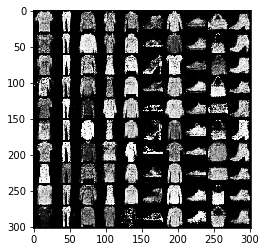

[Epoch 67/100] [Batch 0/600] [D loss: 1.328304] [G loss: 0.747824]
[Epoch 67/100] [Batch 1/600] [D loss: 1.350278] [G loss: 0.767824]
[Epoch 67/100] [Batch 2/600] [D loss: 1.368166] [G loss: 0.751679]
[Epoch 67/100] [Batch 3/600] [D loss: 1.335506] [G loss: 0.799087]
[Epoch 67/100] [Batch 4/600] [D loss: 1.345870] [G loss: 0.794423]
[Epoch 67/100] [Batch 5/600] [D loss: 1.356994] [G loss: 0.745713]
[Epoch 67/100] [Batch 6/600] [D loss: 1.371000] [G loss: 0.733413]
[Epoch 67/100] [Batch 7/600] [D loss: 1.356955] [G loss: 0.751615]
[Epoch 67/100] [Batch 8/600] [D loss: 1.386812] [G loss: 0.765606]
[Epoch 67/100] [Batch 9/600] [D loss: 1.403545] [G loss: 0.779990]
[Epoch 67/100] [Batch 10/600] [D loss: 1.371775] [G loss: 0.794655]
[Epoch 67/100] [Batch 11/600] [D loss: 1.398339] [G loss: 0.768977]
[Epoch 67/100] [Batch 12/600] [D loss: 1.387130] [G loss: 0.715569]
[Epoch 67/100] [Batch 13/600] [D loss: 1.329498] [G loss: 0.743057]
[Epoch 67/100] [Batch 14/600] [D loss: 1.342429] [G loss: 

[Epoch 67/100] [Batch 238/600] [D loss: 1.368520] [G loss: 0.733956]
[Epoch 67/100] [Batch 239/600] [D loss: 1.338541] [G loss: 0.713021]
[Epoch 67/100] [Batch 240/600] [D loss: 1.387294] [G loss: 0.718327]
[Epoch 67/100] [Batch 241/600] [D loss: 1.357878] [G loss: 0.732708]
[Epoch 67/100] [Batch 242/600] [D loss: 1.371283] [G loss: 0.770112]
[Epoch 67/100] [Batch 243/600] [D loss: 1.361248] [G loss: 0.775738]
[Epoch 67/100] [Batch 244/600] [D loss: 1.404529] [G loss: 0.742087]
[Epoch 67/100] [Batch 245/600] [D loss: 1.385777] [G loss: 0.729135]
[Epoch 67/100] [Batch 246/600] [D loss: 1.395416] [G loss: 0.719534]
[Epoch 67/100] [Batch 247/600] [D loss: 1.373780] [G loss: 0.722025]
[Epoch 67/100] [Batch 248/600] [D loss: 1.412606] [G loss: 0.692535]
[Epoch 67/100] [Batch 249/600] [D loss: 1.367262] [G loss: 0.729368]
[Epoch 67/100] [Batch 250/600] [D loss: 1.403472] [G loss: 0.736035]
[Epoch 67/100] [Batch 251/600] [D loss: 1.362452] [G loss: 0.718154]
[Epoch 67/100] [Batch 252/600] [D 

[Epoch 67/100] [Batch 474/600] [D loss: 1.368824] [G loss: 0.698460]
[Epoch 67/100] [Batch 475/600] [D loss: 1.379554] [G loss: 0.713435]
[Epoch 67/100] [Batch 476/600] [D loss: 1.357996] [G loss: 0.733117]
[Epoch 67/100] [Batch 477/600] [D loss: 1.353093] [G loss: 0.687249]
[Epoch 67/100] [Batch 478/600] [D loss: 1.355860] [G loss: 0.673844]
[Epoch 67/100] [Batch 479/600] [D loss: 1.327654] [G loss: 0.664196]
[Epoch 67/100] [Batch 480/600] [D loss: 1.367914] [G loss: 0.694975]
[Epoch 67/100] [Batch 481/600] [D loss: 1.369475] [G loss: 0.766089]
[Epoch 67/100] [Batch 482/600] [D loss: 1.364730] [G loss: 0.776372]
[Epoch 67/100] [Batch 483/600] [D loss: 1.367383] [G loss: 0.737897]
[Epoch 67/100] [Batch 484/600] [D loss: 1.395582] [G loss: 0.723014]
[Epoch 67/100] [Batch 485/600] [D loss: 1.372484] [G loss: 0.739348]
[Epoch 67/100] [Batch 486/600] [D loss: 1.404184] [G loss: 0.763372]
[Epoch 67/100] [Batch 487/600] [D loss: 1.391749] [G loss: 0.761163]
[Epoch 67/100] [Batch 488/600] [D 

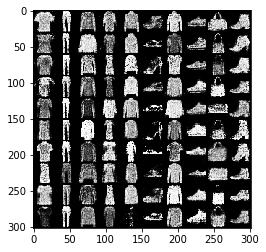

[Epoch 68/100] [Batch 0/600] [D loss: 1.381533] [G loss: 0.743203]
[Epoch 68/100] [Batch 1/600] [D loss: 1.359660] [G loss: 0.743926]
[Epoch 68/100] [Batch 2/600] [D loss: 1.370902] [G loss: 0.713779]
[Epoch 68/100] [Batch 3/600] [D loss: 1.384200] [G loss: 0.715146]
[Epoch 68/100] [Batch 4/600] [D loss: 1.403534] [G loss: 0.722822]
[Epoch 68/100] [Batch 5/600] [D loss: 1.364212] [G loss: 0.717277]
[Epoch 68/100] [Batch 6/600] [D loss: 1.387801] [G loss: 0.713855]
[Epoch 68/100] [Batch 7/600] [D loss: 1.352501] [G loss: 0.698691]
[Epoch 68/100] [Batch 8/600] [D loss: 1.333593] [G loss: 0.689227]
[Epoch 68/100] [Batch 9/600] [D loss: 1.358115] [G loss: 0.707794]
[Epoch 68/100] [Batch 10/600] [D loss: 1.369414] [G loss: 0.736969]
[Epoch 68/100] [Batch 11/600] [D loss: 1.399483] [G loss: 0.747218]
[Epoch 68/100] [Batch 12/600] [D loss: 1.333789] [G loss: 0.715515]
[Epoch 68/100] [Batch 13/600] [D loss: 1.385534] [G loss: 0.749480]
[Epoch 68/100] [Batch 14/600] [D loss: 1.369355] [G loss: 

[Epoch 68/100] [Batch 238/600] [D loss: 1.360467] [G loss: 0.739720]
[Epoch 68/100] [Batch 239/600] [D loss: 1.364978] [G loss: 0.726005]
[Epoch 68/100] [Batch 240/600] [D loss: 1.370778] [G loss: 0.716353]
[Epoch 68/100] [Batch 241/600] [D loss: 1.396129] [G loss: 0.707573]
[Epoch 68/100] [Batch 242/600] [D loss: 1.353245] [G loss: 0.722577]
[Epoch 68/100] [Batch 243/600] [D loss: 1.359226] [G loss: 0.727356]
[Epoch 68/100] [Batch 244/600] [D loss: 1.387982] [G loss: 0.723749]
[Epoch 68/100] [Batch 245/600] [D loss: 1.356086] [G loss: 0.741535]
[Epoch 68/100] [Batch 246/600] [D loss: 1.372786] [G loss: 0.744798]
[Epoch 68/100] [Batch 247/600] [D loss: 1.380962] [G loss: 0.737339]
[Epoch 68/100] [Batch 248/600] [D loss: 1.380150] [G loss: 0.712453]
[Epoch 68/100] [Batch 249/600] [D loss: 1.387644] [G loss: 0.712890]
[Epoch 68/100] [Batch 250/600] [D loss: 1.401262] [G loss: 0.727258]
[Epoch 68/100] [Batch 251/600] [D loss: 1.370464] [G loss: 0.709963]
[Epoch 68/100] [Batch 252/600] [D 

[Epoch 68/100] [Batch 474/600] [D loss: 1.360872] [G loss: 0.719834]
[Epoch 68/100] [Batch 475/600] [D loss: 1.368500] [G loss: 0.730370]
[Epoch 68/100] [Batch 476/600] [D loss: 1.400660] [G loss: 0.758528]
[Epoch 68/100] [Batch 477/600] [D loss: 1.369904] [G loss: 0.791884]
[Epoch 68/100] [Batch 478/600] [D loss: 1.362997] [G loss: 0.768063]
[Epoch 68/100] [Batch 479/600] [D loss: 1.374200] [G loss: 0.763248]
[Epoch 68/100] [Batch 480/600] [D loss: 1.400743] [G loss: 0.712039]
[Epoch 68/100] [Batch 481/600] [D loss: 1.356819] [G loss: 0.706414]
[Epoch 68/100] [Batch 482/600] [D loss: 1.398612] [G loss: 0.703141]
[Epoch 68/100] [Batch 483/600] [D loss: 1.402475] [G loss: 0.706240]
[Epoch 68/100] [Batch 484/600] [D loss: 1.370589] [G loss: 0.725489]
[Epoch 68/100] [Batch 485/600] [D loss: 1.348785] [G loss: 0.697989]
[Epoch 68/100] [Batch 486/600] [D loss: 1.375663] [G loss: 0.704181]
[Epoch 68/100] [Batch 487/600] [D loss: 1.360770] [G loss: 0.743529]
[Epoch 68/100] [Batch 488/600] [D 

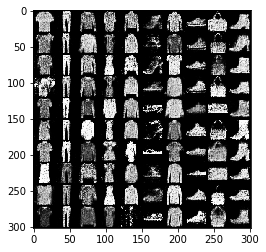

[Epoch 69/100] [Batch 0/600] [D loss: 1.377443] [G loss: 0.727474]
[Epoch 69/100] [Batch 1/600] [D loss: 1.411092] [G loss: 0.742736]
[Epoch 69/100] [Batch 2/600] [D loss: 1.357141] [G loss: 0.718318]
[Epoch 69/100] [Batch 3/600] [D loss: 1.360999] [G loss: 0.734119]
[Epoch 69/100] [Batch 4/600] [D loss: 1.365479] [G loss: 0.733491]
[Epoch 69/100] [Batch 5/600] [D loss: 1.374500] [G loss: 0.716189]
[Epoch 69/100] [Batch 6/600] [D loss: 1.382196] [G loss: 0.722269]
[Epoch 69/100] [Batch 7/600] [D loss: 1.391058] [G loss: 0.740924]
[Epoch 69/100] [Batch 8/600] [D loss: 1.356058] [G loss: 0.734411]
[Epoch 69/100] [Batch 9/600] [D loss: 1.435617] [G loss: 0.734595]
[Epoch 69/100] [Batch 10/600] [D loss: 1.391778] [G loss: 0.748435]
[Epoch 69/100] [Batch 11/600] [D loss: 1.413097] [G loss: 0.750455]
[Epoch 69/100] [Batch 12/600] [D loss: 1.401485] [G loss: 0.729273]
[Epoch 69/100] [Batch 13/600] [D loss: 1.375899] [G loss: 0.729289]
[Epoch 69/100] [Batch 14/600] [D loss: 1.371963] [G loss: 

[Epoch 69/100] [Batch 238/600] [D loss: 1.341197] [G loss: 0.705068]
[Epoch 69/100] [Batch 239/600] [D loss: 1.365148] [G loss: 0.688016]
[Epoch 69/100] [Batch 240/600] [D loss: 1.373524] [G loss: 0.708885]
[Epoch 69/100] [Batch 241/600] [D loss: 1.386718] [G loss: 0.735989]
[Epoch 69/100] [Batch 242/600] [D loss: 1.409338] [G loss: 0.712486]
[Epoch 69/100] [Batch 243/600] [D loss: 1.416386] [G loss: 0.769998]
[Epoch 69/100] [Batch 244/600] [D loss: 1.385422] [G loss: 0.769055]
[Epoch 69/100] [Batch 245/600] [D loss: 1.348193] [G loss: 0.748374]
[Epoch 69/100] [Batch 246/600] [D loss: 1.361750] [G loss: 0.711709]
[Epoch 69/100] [Batch 247/600] [D loss: 1.364810] [G loss: 0.717057]
[Epoch 69/100] [Batch 248/600] [D loss: 1.351836] [G loss: 0.706516]
[Epoch 69/100] [Batch 249/600] [D loss: 1.363682] [G loss: 0.715688]
[Epoch 69/100] [Batch 250/600] [D loss: 1.384055] [G loss: 0.716772]
[Epoch 69/100] [Batch 251/600] [D loss: 1.351866] [G loss: 0.704245]
[Epoch 69/100] [Batch 252/600] [D 

[Epoch 69/100] [Batch 474/600] [D loss: 1.388711] [G loss: 0.720004]
[Epoch 69/100] [Batch 475/600] [D loss: 1.383838] [G loss: 0.716362]
[Epoch 69/100] [Batch 476/600] [D loss: 1.349438] [G loss: 0.756773]
[Epoch 69/100] [Batch 477/600] [D loss: 1.350708] [G loss: 0.730089]
[Epoch 69/100] [Batch 478/600] [D loss: 1.354523] [G loss: 0.722207]
[Epoch 69/100] [Batch 479/600] [D loss: 1.358095] [G loss: 0.708461]
[Epoch 69/100] [Batch 480/600] [D loss: 1.399008] [G loss: 0.751088]
[Epoch 69/100] [Batch 481/600] [D loss: 1.356839] [G loss: 0.758182]
[Epoch 69/100] [Batch 482/600] [D loss: 1.337134] [G loss: 0.741428]
[Epoch 69/100] [Batch 483/600] [D loss: 1.376954] [G loss: 0.725709]
[Epoch 69/100] [Batch 484/600] [D loss: 1.377033] [G loss: 0.729114]
[Epoch 69/100] [Batch 485/600] [D loss: 1.343754] [G loss: 0.717322]
[Epoch 69/100] [Batch 486/600] [D loss: 1.375282] [G loss: 0.753279]
[Epoch 69/100] [Batch 487/600] [D loss: 1.392458] [G loss: 0.800598]
[Epoch 69/100] [Batch 488/600] [D 

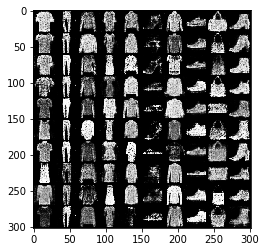

[Epoch 70/100] [Batch 0/600] [D loss: 1.357162] [G loss: 0.807763]
[Epoch 70/100] [Batch 1/600] [D loss: 1.404845] [G loss: 0.746477]
[Epoch 70/100] [Batch 2/600] [D loss: 1.382428] [G loss: 0.742750]
[Epoch 70/100] [Batch 3/600] [D loss: 1.350767] [G loss: 0.732062]
[Epoch 70/100] [Batch 4/600] [D loss: 1.398821] [G loss: 0.763001]
[Epoch 70/100] [Batch 5/600] [D loss: 1.316441] [G loss: 0.705146]
[Epoch 70/100] [Batch 6/600] [D loss: 1.358699] [G loss: 0.648121]
[Epoch 70/100] [Batch 7/600] [D loss: 1.357319] [G loss: 0.677950]
[Epoch 70/100] [Batch 8/600] [D loss: 1.406976] [G loss: 0.667281]
[Epoch 70/100] [Batch 9/600] [D loss: 1.390953] [G loss: 0.678834]
[Epoch 70/100] [Batch 10/600] [D loss: 1.390767] [G loss: 0.749602]
[Epoch 70/100] [Batch 11/600] [D loss: 1.373820] [G loss: 0.745861]
[Epoch 70/100] [Batch 12/600] [D loss: 1.384370] [G loss: 0.749665]
[Epoch 70/100] [Batch 13/600] [D loss: 1.394479] [G loss: 0.757055]
[Epoch 70/100] [Batch 14/600] [D loss: 1.365973] [G loss: 

[Epoch 70/100] [Batch 238/600] [D loss: 1.405372] [G loss: 0.774333]
[Epoch 70/100] [Batch 239/600] [D loss: 1.373449] [G loss: 0.760070]
[Epoch 70/100] [Batch 240/600] [D loss: 1.367053] [G loss: 0.734080]
[Epoch 70/100] [Batch 241/600] [D loss: 1.379182] [G loss: 0.696964]
[Epoch 70/100] [Batch 242/600] [D loss: 1.330624] [G loss: 0.709909]
[Epoch 70/100] [Batch 243/600] [D loss: 1.359866] [G loss: 0.756547]
[Epoch 70/100] [Batch 244/600] [D loss: 1.340316] [G loss: 0.750896]
[Epoch 70/100] [Batch 245/600] [D loss: 1.364011] [G loss: 0.746016]
[Epoch 70/100] [Batch 246/600] [D loss: 1.348160] [G loss: 0.752897]
[Epoch 70/100] [Batch 247/600] [D loss: 1.416718] [G loss: 0.757101]
[Epoch 70/100] [Batch 248/600] [D loss: 1.391299] [G loss: 0.725441]
[Epoch 70/100] [Batch 249/600] [D loss: 1.369451] [G loss: 0.735965]
[Epoch 70/100] [Batch 250/600] [D loss: 1.346298] [G loss: 0.723744]
[Epoch 70/100] [Batch 251/600] [D loss: 1.378121] [G loss: 0.735177]
[Epoch 70/100] [Batch 252/600] [D 

[Epoch 70/100] [Batch 474/600] [D loss: 1.379198] [G loss: 0.719742]
[Epoch 70/100] [Batch 475/600] [D loss: 1.381126] [G loss: 0.739248]
[Epoch 70/100] [Batch 476/600] [D loss: 1.346094] [G loss: 0.700967]
[Epoch 70/100] [Batch 477/600] [D loss: 1.373803] [G loss: 0.745275]
[Epoch 70/100] [Batch 478/600] [D loss: 1.368272] [G loss: 0.749830]
[Epoch 70/100] [Batch 479/600] [D loss: 1.379826] [G loss: 0.766191]
[Epoch 70/100] [Batch 480/600] [D loss: 1.357404] [G loss: 0.741158]
[Epoch 70/100] [Batch 481/600] [D loss: 1.358244] [G loss: 0.702292]
[Epoch 70/100] [Batch 482/600] [D loss: 1.394610] [G loss: 0.711808]
[Epoch 70/100] [Batch 483/600] [D loss: 1.363786] [G loss: 0.718911]
[Epoch 70/100] [Batch 484/600] [D loss: 1.375343] [G loss: 0.740403]
[Epoch 70/100] [Batch 485/600] [D loss: 1.425255] [G loss: 0.771111]
[Epoch 70/100] [Batch 486/600] [D loss: 1.392181] [G loss: 0.767531]
[Epoch 70/100] [Batch 487/600] [D loss: 1.381994] [G loss: 0.729593]
[Epoch 70/100] [Batch 488/600] [D 

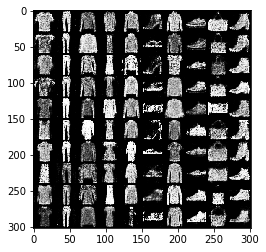

[Epoch 71/100] [Batch 0/600] [D loss: 1.353734] [G loss: 0.745991]
[Epoch 71/100] [Batch 1/600] [D loss: 1.390442] [G loss: 0.766361]
[Epoch 71/100] [Batch 2/600] [D loss: 1.361612] [G loss: 0.731515]
[Epoch 71/100] [Batch 3/600] [D loss: 1.395971] [G loss: 0.713949]
[Epoch 71/100] [Batch 4/600] [D loss: 1.377465] [G loss: 0.731310]
[Epoch 71/100] [Batch 5/600] [D loss: 1.389828] [G loss: 0.725350]
[Epoch 71/100] [Batch 6/600] [D loss: 1.398902] [G loss: 0.718149]
[Epoch 71/100] [Batch 7/600] [D loss: 1.372929] [G loss: 0.721531]
[Epoch 71/100] [Batch 8/600] [D loss: 1.361880] [G loss: 0.733279]
[Epoch 71/100] [Batch 9/600] [D loss: 1.380129] [G loss: 0.704964]
[Epoch 71/100] [Batch 10/600] [D loss: 1.411629] [G loss: 0.696540]
[Epoch 71/100] [Batch 11/600] [D loss: 1.371048] [G loss: 0.715006]
[Epoch 71/100] [Batch 12/600] [D loss: 1.369620] [G loss: 0.708087]
[Epoch 71/100] [Batch 13/600] [D loss: 1.401623] [G loss: 0.697655]
[Epoch 71/100] [Batch 14/600] [D loss: 1.361120] [G loss: 

[Epoch 71/100] [Batch 238/600] [D loss: 1.358752] [G loss: 0.712289]
[Epoch 71/100] [Batch 239/600] [D loss: 1.366411] [G loss: 0.746788]
[Epoch 71/100] [Batch 240/600] [D loss: 1.325284] [G loss: 0.748683]
[Epoch 71/100] [Batch 241/600] [D loss: 1.375543] [G loss: 0.724422]
[Epoch 71/100] [Batch 242/600] [D loss: 1.410162] [G loss: 0.719336]
[Epoch 71/100] [Batch 243/600] [D loss: 1.400649] [G loss: 0.744910]
[Epoch 71/100] [Batch 244/600] [D loss: 1.382174] [G loss: 0.721627]
[Epoch 71/100] [Batch 245/600] [D loss: 1.397616] [G loss: 0.719534]
[Epoch 71/100] [Batch 246/600] [D loss: 1.361049] [G loss: 0.724456]
[Epoch 71/100] [Batch 247/600] [D loss: 1.354871] [G loss: 0.734588]
[Epoch 71/100] [Batch 248/600] [D loss: 1.377896] [G loss: 0.718352]
[Epoch 71/100] [Batch 249/600] [D loss: 1.374886] [G loss: 0.726152]
[Epoch 71/100] [Batch 250/600] [D loss: 1.348130] [G loss: 0.720278]
[Epoch 71/100] [Batch 251/600] [D loss: 1.365962] [G loss: 0.746737]
[Epoch 71/100] [Batch 252/600] [D 

[Epoch 71/100] [Batch 474/600] [D loss: 1.381505] [G loss: 0.748806]
[Epoch 71/100] [Batch 475/600] [D loss: 1.405442] [G loss: 0.748756]
[Epoch 71/100] [Batch 476/600] [D loss: 1.336330] [G loss: 0.702104]
[Epoch 71/100] [Batch 477/600] [D loss: 1.372702] [G loss: 0.685690]
[Epoch 71/100] [Batch 478/600] [D loss: 1.395324] [G loss: 0.736800]
[Epoch 71/100] [Batch 479/600] [D loss: 1.414480] [G loss: 0.770797]
[Epoch 71/100] [Batch 480/600] [D loss: 1.358430] [G loss: 0.766463]
[Epoch 71/100] [Batch 481/600] [D loss: 1.345622] [G loss: 0.734017]
[Epoch 71/100] [Batch 482/600] [D loss: 1.355687] [G loss: 0.699438]
[Epoch 71/100] [Batch 483/600] [D loss: 1.383436] [G loss: 0.746714]
[Epoch 71/100] [Batch 484/600] [D loss: 1.347192] [G loss: 0.736717]
[Epoch 71/100] [Batch 485/600] [D loss: 1.372831] [G loss: 0.728321]
[Epoch 71/100] [Batch 486/600] [D loss: 1.374232] [G loss: 0.723440]
[Epoch 71/100] [Batch 487/600] [D loss: 1.391998] [G loss: 0.710275]
[Epoch 71/100] [Batch 488/600] [D 

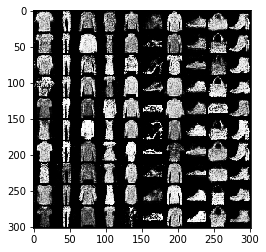

[Epoch 72/100] [Batch 0/600] [D loss: 1.326793] [G loss: 0.703682]
[Epoch 72/100] [Batch 1/600] [D loss: 1.403583] [G loss: 0.713736]
[Epoch 72/100] [Batch 2/600] [D loss: 1.407299] [G loss: 0.759534]
[Epoch 72/100] [Batch 3/600] [D loss: 1.371955] [G loss: 0.724470]
[Epoch 72/100] [Batch 4/600] [D loss: 1.414611] [G loss: 0.752365]
[Epoch 72/100] [Batch 5/600] [D loss: 1.375527] [G loss: 0.722768]
[Epoch 72/100] [Batch 6/600] [D loss: 1.387488] [G loss: 0.727630]
[Epoch 72/100] [Batch 7/600] [D loss: 1.364349] [G loss: 0.692479]
[Epoch 72/100] [Batch 8/600] [D loss: 1.408115] [G loss: 0.686621]
[Epoch 72/100] [Batch 9/600] [D loss: 1.394325] [G loss: 0.685894]
[Epoch 72/100] [Batch 10/600] [D loss: 1.381713] [G loss: 0.731100]
[Epoch 72/100] [Batch 11/600] [D loss: 1.381326] [G loss: 0.753029]
[Epoch 72/100] [Batch 12/600] [D loss: 1.369123] [G loss: 0.715516]
[Epoch 72/100] [Batch 13/600] [D loss: 1.354467] [G loss: 0.698457]
[Epoch 72/100] [Batch 14/600] [D loss: 1.393440] [G loss: 

[Epoch 72/100] [Batch 238/600] [D loss: 1.391994] [G loss: 0.755963]
[Epoch 72/100] [Batch 239/600] [D loss: 1.397163] [G loss: 0.718815]
[Epoch 72/100] [Batch 240/600] [D loss: 1.359287] [G loss: 0.716434]
[Epoch 72/100] [Batch 241/600] [D loss: 1.381833] [G loss: 0.703237]
[Epoch 72/100] [Batch 242/600] [D loss: 1.380044] [G loss: 0.734091]
[Epoch 72/100] [Batch 243/600] [D loss: 1.359615] [G loss: 0.728417]
[Epoch 72/100] [Batch 244/600] [D loss: 1.337422] [G loss: 0.710258]
[Epoch 72/100] [Batch 245/600] [D loss: 1.377792] [G loss: 0.710038]
[Epoch 72/100] [Batch 246/600] [D loss: 1.387536] [G loss: 0.705020]
[Epoch 72/100] [Batch 247/600] [D loss: 1.367666] [G loss: 0.735455]
[Epoch 72/100] [Batch 248/600] [D loss: 1.398242] [G loss: 0.736252]
[Epoch 72/100] [Batch 249/600] [D loss: 1.342241] [G loss: 0.721022]
[Epoch 72/100] [Batch 250/600] [D loss: 1.367753] [G loss: 0.728196]
[Epoch 72/100] [Batch 251/600] [D loss: 1.368930] [G loss: 0.698554]
[Epoch 72/100] [Batch 252/600] [D 

[Epoch 72/100] [Batch 474/600] [D loss: 1.371929] [G loss: 0.764241]
[Epoch 72/100] [Batch 475/600] [D loss: 1.359648] [G loss: 0.780627]
[Epoch 72/100] [Batch 476/600] [D loss: 1.391712] [G loss: 0.761251]
[Epoch 72/100] [Batch 477/600] [D loss: 1.408793] [G loss: 0.753299]
[Epoch 72/100] [Batch 478/600] [D loss: 1.352079] [G loss: 0.712083]
[Epoch 72/100] [Batch 479/600] [D loss: 1.394633] [G loss: 0.696917]
[Epoch 72/100] [Batch 480/600] [D loss: 1.338417] [G loss: 0.691996]
[Epoch 72/100] [Batch 481/600] [D loss: 1.365505] [G loss: 0.709763]
[Epoch 72/100] [Batch 482/600] [D loss: 1.368104] [G loss: 0.715801]
[Epoch 72/100] [Batch 483/600] [D loss: 1.376335] [G loss: 0.751172]
[Epoch 72/100] [Batch 484/600] [D loss: 1.349684] [G loss: 0.739064]
[Epoch 72/100] [Batch 485/600] [D loss: 1.358974] [G loss: 0.714342]
[Epoch 72/100] [Batch 486/600] [D loss: 1.361386] [G loss: 0.720085]
[Epoch 72/100] [Batch 487/600] [D loss: 1.414507] [G loss: 0.740739]
[Epoch 72/100] [Batch 488/600] [D 

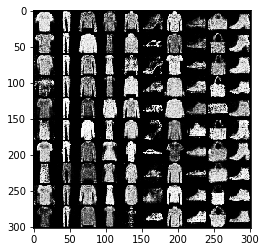

[Epoch 73/100] [Batch 0/600] [D loss: 1.394588] [G loss: 0.753020]
[Epoch 73/100] [Batch 1/600] [D loss: 1.387597] [G loss: 0.755552]
[Epoch 73/100] [Batch 2/600] [D loss: 1.370600] [G loss: 0.726902]
[Epoch 73/100] [Batch 3/600] [D loss: 1.383644] [G loss: 0.690379]
[Epoch 73/100] [Batch 4/600] [D loss: 1.367277] [G loss: 0.713354]
[Epoch 73/100] [Batch 5/600] [D loss: 1.367884] [G loss: 0.728648]
[Epoch 73/100] [Batch 6/600] [D loss: 1.379893] [G loss: 0.726179]
[Epoch 73/100] [Batch 7/600] [D loss: 1.393900] [G loss: 0.731151]
[Epoch 73/100] [Batch 8/600] [D loss: 1.371401] [G loss: 0.750454]
[Epoch 73/100] [Batch 9/600] [D loss: 1.361241] [G loss: 0.731375]
[Epoch 73/100] [Batch 10/600] [D loss: 1.362169] [G loss: 0.712092]
[Epoch 73/100] [Batch 11/600] [D loss: 1.336498] [G loss: 0.718936]
[Epoch 73/100] [Batch 12/600] [D loss: 1.396308] [G loss: 0.753902]
[Epoch 73/100] [Batch 13/600] [D loss: 1.398581] [G loss: 0.775927]
[Epoch 73/100] [Batch 14/600] [D loss: 1.378078] [G loss: 

[Epoch 73/100] [Batch 238/600] [D loss: 1.382347] [G loss: 0.739183]
[Epoch 73/100] [Batch 239/600] [D loss: 1.379906] [G loss: 0.734360]
[Epoch 73/100] [Batch 240/600] [D loss: 1.381736] [G loss: 0.745461]
[Epoch 73/100] [Batch 241/600] [D loss: 1.388164] [G loss: 0.741128]
[Epoch 73/100] [Batch 242/600] [D loss: 1.387388] [G loss: 0.741958]
[Epoch 73/100] [Batch 243/600] [D loss: 1.407279] [G loss: 0.734562]
[Epoch 73/100] [Batch 244/600] [D loss: 1.370638] [G loss: 0.720102]
[Epoch 73/100] [Batch 245/600] [D loss: 1.371535] [G loss: 0.705197]
[Epoch 73/100] [Batch 246/600] [D loss: 1.353101] [G loss: 0.676722]
[Epoch 73/100] [Batch 247/600] [D loss: 1.392366] [G loss: 0.696263]
[Epoch 73/100] [Batch 248/600] [D loss: 1.362081] [G loss: 0.700497]
[Epoch 73/100] [Batch 249/600] [D loss: 1.379696] [G loss: 0.732627]
[Epoch 73/100] [Batch 250/600] [D loss: 1.399564] [G loss: 0.752048]
[Epoch 73/100] [Batch 251/600] [D loss: 1.379495] [G loss: 0.719556]
[Epoch 73/100] [Batch 252/600] [D 

[Epoch 73/100] [Batch 474/600] [D loss: 1.378126] [G loss: 0.712563]
[Epoch 73/100] [Batch 475/600] [D loss: 1.392648] [G loss: 0.740875]
[Epoch 73/100] [Batch 476/600] [D loss: 1.399139] [G loss: 0.754773]
[Epoch 73/100] [Batch 477/600] [D loss: 1.376162] [G loss: 0.747491]
[Epoch 73/100] [Batch 478/600] [D loss: 1.359013] [G loss: 0.717593]
[Epoch 73/100] [Batch 479/600] [D loss: 1.335042] [G loss: 0.704817]
[Epoch 73/100] [Batch 480/600] [D loss: 1.370154] [G loss: 0.664280]
[Epoch 73/100] [Batch 481/600] [D loss: 1.355157] [G loss: 0.704315]
[Epoch 73/100] [Batch 482/600] [D loss: 1.372930] [G loss: 0.717373]
[Epoch 73/100] [Batch 483/600] [D loss: 1.363844] [G loss: 0.752222]
[Epoch 73/100] [Batch 484/600] [D loss: 1.379897] [G loss: 0.762485]
[Epoch 73/100] [Batch 485/600] [D loss: 1.360820] [G loss: 0.745406]
[Epoch 73/100] [Batch 486/600] [D loss: 1.349817] [G loss: 0.745904]
[Epoch 73/100] [Batch 487/600] [D loss: 1.324448] [G loss: 0.756765]
[Epoch 73/100] [Batch 488/600] [D 

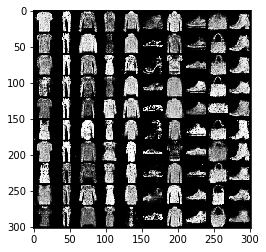

[Epoch 74/100] [Batch 0/600] [D loss: 1.334575] [G loss: 0.703635]
[Epoch 74/100] [Batch 1/600] [D loss: 1.363022] [G loss: 0.716888]
[Epoch 74/100] [Batch 2/600] [D loss: 1.404581] [G loss: 0.744468]
[Epoch 74/100] [Batch 3/600] [D loss: 1.388559] [G loss: 0.761299]
[Epoch 74/100] [Batch 4/600] [D loss: 1.395543] [G loss: 0.727674]
[Epoch 74/100] [Batch 5/600] [D loss: 1.383526] [G loss: 0.704314]
[Epoch 74/100] [Batch 6/600] [D loss: 1.351318] [G loss: 0.694079]
[Epoch 74/100] [Batch 7/600] [D loss: 1.351218] [G loss: 0.663121]
[Epoch 74/100] [Batch 8/600] [D loss: 1.363224] [G loss: 0.681530]
[Epoch 74/100] [Batch 9/600] [D loss: 1.396238] [G loss: 0.725983]
[Epoch 74/100] [Batch 10/600] [D loss: 1.389290] [G loss: 0.749739]
[Epoch 74/100] [Batch 11/600] [D loss: 1.376211] [G loss: 0.742165]
[Epoch 74/100] [Batch 12/600] [D loss: 1.345223] [G loss: 0.742208]
[Epoch 74/100] [Batch 13/600] [D loss: 1.371298] [G loss: 0.713714]
[Epoch 74/100] [Batch 14/600] [D loss: 1.382933] [G loss: 

[Epoch 74/100] [Batch 238/600] [D loss: 1.366807] [G loss: 0.724757]
[Epoch 74/100] [Batch 239/600] [D loss: 1.346400] [G loss: 0.728778]
[Epoch 74/100] [Batch 240/600] [D loss: 1.359145] [G loss: 0.699889]
[Epoch 74/100] [Batch 241/600] [D loss: 1.360056] [G loss: 0.735588]
[Epoch 74/100] [Batch 242/600] [D loss: 1.348618] [G loss: 0.720410]
[Epoch 74/100] [Batch 243/600] [D loss: 1.415199] [G loss: 0.731289]
[Epoch 74/100] [Batch 244/600] [D loss: 1.393106] [G loss: 0.786440]
[Epoch 74/100] [Batch 245/600] [D loss: 1.370508] [G loss: 0.768468]
[Epoch 74/100] [Batch 246/600] [D loss: 1.386907] [G loss: 0.764264]
[Epoch 74/100] [Batch 247/600] [D loss: 1.384840] [G loss: 0.745215]
[Epoch 74/100] [Batch 248/600] [D loss: 1.375331] [G loss: 0.758242]
[Epoch 74/100] [Batch 249/600] [D loss: 1.368920] [G loss: 0.717876]
[Epoch 74/100] [Batch 250/600] [D loss: 1.364327] [G loss: 0.705190]
[Epoch 74/100] [Batch 251/600] [D loss: 1.392679] [G loss: 0.727703]
[Epoch 74/100] [Batch 252/600] [D 

[Epoch 74/100] [Batch 474/600] [D loss: 1.352580] [G loss: 0.713838]
[Epoch 74/100] [Batch 475/600] [D loss: 1.355417] [G loss: 0.721280]
[Epoch 74/100] [Batch 476/600] [D loss: 1.362893] [G loss: 0.716143]
[Epoch 74/100] [Batch 477/600] [D loss: 1.362072] [G loss: 0.735805]
[Epoch 74/100] [Batch 478/600] [D loss: 1.361774] [G loss: 0.746510]
[Epoch 74/100] [Batch 479/600] [D loss: 1.358214] [G loss: 0.725031]
[Epoch 74/100] [Batch 480/600] [D loss: 1.377706] [G loss: 0.734508]
[Epoch 74/100] [Batch 481/600] [D loss: 1.376344] [G loss: 0.732735]
[Epoch 74/100] [Batch 482/600] [D loss: 1.400777] [G loss: 0.743398]
[Epoch 74/100] [Batch 483/600] [D loss: 1.359254] [G loss: 0.757053]
[Epoch 74/100] [Batch 484/600] [D loss: 1.401127] [G loss: 0.760660]
[Epoch 74/100] [Batch 485/600] [D loss: 1.382606] [G loss: 0.773578]
[Epoch 74/100] [Batch 486/600] [D loss: 1.386193] [G loss: 0.752758]
[Epoch 74/100] [Batch 487/600] [D loss: 1.397091] [G loss: 0.737585]
[Epoch 74/100] [Batch 488/600] [D 

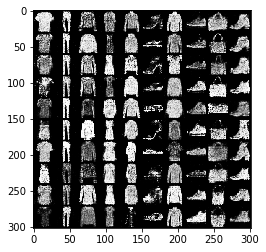

[Epoch 75/100] [Batch 0/600] [D loss: 1.360138] [G loss: 0.720817]
[Epoch 75/100] [Batch 1/600] [D loss: 1.352278] [G loss: 0.715855]
[Epoch 75/100] [Batch 2/600] [D loss: 1.392890] [G loss: 0.735984]
[Epoch 75/100] [Batch 3/600] [D loss: 1.346999] [G loss: 0.729270]
[Epoch 75/100] [Batch 4/600] [D loss: 1.381680] [G loss: 0.721100]
[Epoch 75/100] [Batch 5/600] [D loss: 1.345426] [G loss: 0.744581]
[Epoch 75/100] [Batch 6/600] [D loss: 1.368870] [G loss: 0.735126]
[Epoch 75/100] [Batch 7/600] [D loss: 1.342332] [G loss: 0.707048]
[Epoch 75/100] [Batch 8/600] [D loss: 1.378765] [G loss: 0.709955]
[Epoch 75/100] [Batch 9/600] [D loss: 1.380512] [G loss: 0.708795]
[Epoch 75/100] [Batch 10/600] [D loss: 1.402161] [G loss: 0.722349]
[Epoch 75/100] [Batch 11/600] [D loss: 1.384844] [G loss: 0.715680]
[Epoch 75/100] [Batch 12/600] [D loss: 1.382402] [G loss: 0.733616]
[Epoch 75/100] [Batch 13/600] [D loss: 1.374445] [G loss: 0.717654]
[Epoch 75/100] [Batch 14/600] [D loss: 1.345524] [G loss: 

[Epoch 75/100] [Batch 238/600] [D loss: 1.374466] [G loss: 0.731077]
[Epoch 75/100] [Batch 239/600] [D loss: 1.390228] [G loss: 0.741089]
[Epoch 75/100] [Batch 240/600] [D loss: 1.401532] [G loss: 0.749989]
[Epoch 75/100] [Batch 241/600] [D loss: 1.363645] [G loss: 0.734748]
[Epoch 75/100] [Batch 242/600] [D loss: 1.384700] [G loss: 0.714159]
[Epoch 75/100] [Batch 243/600] [D loss: 1.327287] [G loss: 0.746545]
[Epoch 75/100] [Batch 244/600] [D loss: 1.395100] [G loss: 0.685221]
[Epoch 75/100] [Batch 245/600] [D loss: 1.403702] [G loss: 0.725378]
[Epoch 75/100] [Batch 246/600] [D loss: 1.358204] [G loss: 0.734943]
[Epoch 75/100] [Batch 247/600] [D loss: 1.376102] [G loss: 0.733534]
[Epoch 75/100] [Batch 248/600] [D loss: 1.416249] [G loss: 0.734635]
[Epoch 75/100] [Batch 249/600] [D loss: 1.388706] [G loss: 0.727918]
[Epoch 75/100] [Batch 250/600] [D loss: 1.386816] [G loss: 0.716372]
[Epoch 75/100] [Batch 251/600] [D loss: 1.371163] [G loss: 0.717336]
[Epoch 75/100] [Batch 252/600] [D 

[Epoch 75/100] [Batch 474/600] [D loss: 1.394944] [G loss: 0.687765]
[Epoch 75/100] [Batch 475/600] [D loss: 1.395216] [G loss: 0.745471]
[Epoch 75/100] [Batch 476/600] [D loss: 1.364981] [G loss: 0.723572]
[Epoch 75/100] [Batch 477/600] [D loss: 1.376557] [G loss: 0.703367]
[Epoch 75/100] [Batch 478/600] [D loss: 1.369051] [G loss: 0.724725]
[Epoch 75/100] [Batch 479/600] [D loss: 1.338166] [G loss: 0.694647]
[Epoch 75/100] [Batch 480/600] [D loss: 1.419135] [G loss: 0.729849]
[Epoch 75/100] [Batch 481/600] [D loss: 1.362311] [G loss: 0.755093]
[Epoch 75/100] [Batch 482/600] [D loss: 1.382439] [G loss: 0.741902]
[Epoch 75/100] [Batch 483/600] [D loss: 1.361892] [G loss: 0.728656]
[Epoch 75/100] [Batch 484/600] [D loss: 1.367204] [G loss: 0.728425]
[Epoch 75/100] [Batch 485/600] [D loss: 1.379743] [G loss: 0.729141]
[Epoch 75/100] [Batch 486/600] [D loss: 1.375064] [G loss: 0.714584]
[Epoch 75/100] [Batch 487/600] [D loss: 1.378192] [G loss: 0.718555]
[Epoch 75/100] [Batch 488/600] [D 

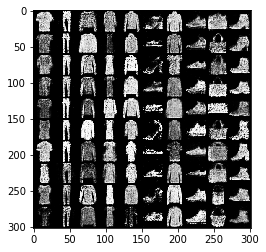

[Epoch 76/100] [Batch 0/600] [D loss: 1.377731] [G loss: 0.728080]
[Epoch 76/100] [Batch 1/600] [D loss: 1.382030] [G loss: 0.738953]
[Epoch 76/100] [Batch 2/600] [D loss: 1.372574] [G loss: 0.737177]
[Epoch 76/100] [Batch 3/600] [D loss: 1.372592] [G loss: 0.708465]
[Epoch 76/100] [Batch 4/600] [D loss: 1.379137] [G loss: 0.709415]
[Epoch 76/100] [Batch 5/600] [D loss: 1.386879] [G loss: 0.707642]
[Epoch 76/100] [Batch 6/600] [D loss: 1.389253] [G loss: 0.711809]
[Epoch 76/100] [Batch 7/600] [D loss: 1.403911] [G loss: 0.710471]
[Epoch 76/100] [Batch 8/600] [D loss: 1.378386] [G loss: 0.732219]
[Epoch 76/100] [Batch 9/600] [D loss: 1.347709] [G loss: 0.703636]
[Epoch 76/100] [Batch 10/600] [D loss: 1.378332] [G loss: 0.731793]
[Epoch 76/100] [Batch 11/600] [D loss: 1.384440] [G loss: 0.736457]
[Epoch 76/100] [Batch 12/600] [D loss: 1.376677] [G loss: 0.716181]
[Epoch 76/100] [Batch 13/600] [D loss: 1.339136] [G loss: 0.712032]
[Epoch 76/100] [Batch 14/600] [D loss: 1.382044] [G loss: 

[Epoch 76/100] [Batch 238/600] [D loss: 1.390650] [G loss: 0.757443]
[Epoch 76/100] [Batch 239/600] [D loss: 1.397496] [G loss: 0.747176]
[Epoch 76/100] [Batch 240/600] [D loss: 1.365193] [G loss: 0.737943]
[Epoch 76/100] [Batch 241/600] [D loss: 1.378828] [G loss: 0.729663]
[Epoch 76/100] [Batch 242/600] [D loss: 1.378054] [G loss: 0.705929]
[Epoch 76/100] [Batch 243/600] [D loss: 1.376418] [G loss: 0.705490]
[Epoch 76/100] [Batch 244/600] [D loss: 1.350160] [G loss: 0.716767]
[Epoch 76/100] [Batch 245/600] [D loss: 1.354121] [G loss: 0.721292]
[Epoch 76/100] [Batch 246/600] [D loss: 1.380343] [G loss: 0.723924]
[Epoch 76/100] [Batch 247/600] [D loss: 1.379248] [G loss: 0.741093]
[Epoch 76/100] [Batch 248/600] [D loss: 1.353924] [G loss: 0.717972]
[Epoch 76/100] [Batch 249/600] [D loss: 1.342884] [G loss: 0.712051]
[Epoch 76/100] [Batch 250/600] [D loss: 1.357264] [G loss: 0.713389]
[Epoch 76/100] [Batch 251/600] [D loss: 1.355940] [G loss: 0.715389]
[Epoch 76/100] [Batch 252/600] [D 

[Epoch 76/100] [Batch 474/600] [D loss: 1.378345] [G loss: 0.716387]
[Epoch 76/100] [Batch 475/600] [D loss: 1.386470] [G loss: 0.729159]
[Epoch 76/100] [Batch 476/600] [D loss: 1.343331] [G loss: 0.748749]
[Epoch 76/100] [Batch 477/600] [D loss: 1.390664] [G loss: 0.731541]
[Epoch 76/100] [Batch 478/600] [D loss: 1.381978] [G loss: 0.751219]
[Epoch 76/100] [Batch 479/600] [D loss: 1.356468] [G loss: 0.730600]
[Epoch 76/100] [Batch 480/600] [D loss: 1.368791] [G loss: 0.714076]
[Epoch 76/100] [Batch 481/600] [D loss: 1.368140] [G loss: 0.730356]
[Epoch 76/100] [Batch 482/600] [D loss: 1.367115] [G loss: 0.740930]
[Epoch 76/100] [Batch 483/600] [D loss: 1.382990] [G loss: 0.789033]
[Epoch 76/100] [Batch 484/600] [D loss: 1.377571] [G loss: 0.772263]
[Epoch 76/100] [Batch 485/600] [D loss: 1.380066] [G loss: 0.745473]
[Epoch 76/100] [Batch 486/600] [D loss: 1.380985] [G loss: 0.731331]
[Epoch 76/100] [Batch 487/600] [D loss: 1.362014] [G loss: 0.737303]
[Epoch 76/100] [Batch 488/600] [D 

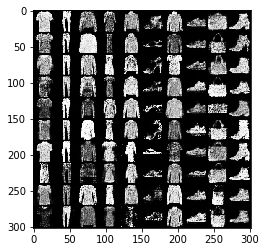

[Epoch 77/100] [Batch 0/600] [D loss: 1.395532] [G loss: 0.726160]
[Epoch 77/100] [Batch 1/600] [D loss: 1.343515] [G loss: 0.704407]
[Epoch 77/100] [Batch 2/600] [D loss: 1.365644] [G loss: 0.715843]
[Epoch 77/100] [Batch 3/600] [D loss: 1.382337] [G loss: 0.725880]
[Epoch 77/100] [Batch 4/600] [D loss: 1.407600] [G loss: 0.743757]
[Epoch 77/100] [Batch 5/600] [D loss: 1.354839] [G loss: 0.739378]
[Epoch 77/100] [Batch 6/600] [D loss: 1.372790] [G loss: 0.727500]
[Epoch 77/100] [Batch 7/600] [D loss: 1.360130] [G loss: 0.709420]
[Epoch 77/100] [Batch 8/600] [D loss: 1.336560] [G loss: 0.700716]
[Epoch 77/100] [Batch 9/600] [D loss: 1.381392] [G loss: 0.714548]
[Epoch 77/100] [Batch 10/600] [D loss: 1.378337] [G loss: 0.695348]
[Epoch 77/100] [Batch 11/600] [D loss: 1.371209] [G loss: 0.715153]
[Epoch 77/100] [Batch 12/600] [D loss: 1.382952] [G loss: 0.718916]
[Epoch 77/100] [Batch 13/600] [D loss: 1.357883] [G loss: 0.721554]
[Epoch 77/100] [Batch 14/600] [D loss: 1.380856] [G loss: 

[Epoch 77/100] [Batch 238/600] [D loss: 1.365509] [G loss: 0.720941]
[Epoch 77/100] [Batch 239/600] [D loss: 1.375542] [G loss: 0.742453]
[Epoch 77/100] [Batch 240/600] [D loss: 1.383119] [G loss: 0.743823]
[Epoch 77/100] [Batch 241/600] [D loss: 1.361098] [G loss: 0.750882]
[Epoch 77/100] [Batch 242/600] [D loss: 1.377792] [G loss: 0.764994]
[Epoch 77/100] [Batch 243/600] [D loss: 1.411941] [G loss: 0.770882]
[Epoch 77/100] [Batch 244/600] [D loss: 1.381113] [G loss: 0.757076]
[Epoch 77/100] [Batch 245/600] [D loss: 1.334184] [G loss: 0.733571]
[Epoch 77/100] [Batch 246/600] [D loss: 1.367926] [G loss: 0.718085]
[Epoch 77/100] [Batch 247/600] [D loss: 1.377970] [G loss: 0.718237]
[Epoch 77/100] [Batch 248/600] [D loss: 1.380870] [G loss: 0.743544]
[Epoch 77/100] [Batch 249/600] [D loss: 1.402697] [G loss: 0.728063]
[Epoch 77/100] [Batch 250/600] [D loss: 1.381706] [G loss: 0.725221]
[Epoch 77/100] [Batch 251/600] [D loss: 1.362022] [G loss: 0.705794]
[Epoch 77/100] [Batch 252/600] [D 

[Epoch 77/100] [Batch 474/600] [D loss: 1.373676] [G loss: 0.715126]
[Epoch 77/100] [Batch 475/600] [D loss: 1.382101] [G loss: 0.711301]
[Epoch 77/100] [Batch 476/600] [D loss: 1.341201] [G loss: 0.702342]
[Epoch 77/100] [Batch 477/600] [D loss: 1.370811] [G loss: 0.697884]
[Epoch 77/100] [Batch 478/600] [D loss: 1.352693] [G loss: 0.714298]
[Epoch 77/100] [Batch 479/600] [D loss: 1.346931] [G loss: 0.721360]
[Epoch 77/100] [Batch 480/600] [D loss: 1.386813] [G loss: 0.726285]
[Epoch 77/100] [Batch 481/600] [D loss: 1.364626] [G loss: 0.718863]
[Epoch 77/100] [Batch 482/600] [D loss: 1.364097] [G loss: 0.767495]
[Epoch 77/100] [Batch 483/600] [D loss: 1.365326] [G loss: 0.718010]
[Epoch 77/100] [Batch 484/600] [D loss: 1.405515] [G loss: 0.725657]
[Epoch 77/100] [Batch 485/600] [D loss: 1.367989] [G loss: 0.747815]
[Epoch 77/100] [Batch 486/600] [D loss: 1.376624] [G loss: 0.760102]
[Epoch 77/100] [Batch 487/600] [D loss: 1.377441] [G loss: 0.701544]
[Epoch 77/100] [Batch 488/600] [D 

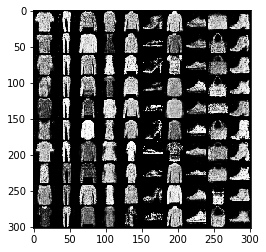

[Epoch 78/100] [Batch 0/600] [D loss: 1.365613] [G loss: 0.712274]
[Epoch 78/100] [Batch 1/600] [D loss: 1.390973] [G loss: 0.732632]
[Epoch 78/100] [Batch 2/600] [D loss: 1.357590] [G loss: 0.727573]
[Epoch 78/100] [Batch 3/600] [D loss: 1.384102] [G loss: 0.717258]
[Epoch 78/100] [Batch 4/600] [D loss: 1.384689] [G loss: 0.719612]
[Epoch 78/100] [Batch 5/600] [D loss: 1.367603] [G loss: 0.732973]
[Epoch 78/100] [Batch 6/600] [D loss: 1.398000] [G loss: 0.710689]
[Epoch 78/100] [Batch 7/600] [D loss: 1.382492] [G loss: 0.711718]
[Epoch 78/100] [Batch 8/600] [D loss: 1.381056] [G loss: 0.687804]
[Epoch 78/100] [Batch 9/600] [D loss: 1.370614] [G loss: 0.677662]
[Epoch 78/100] [Batch 10/600] [D loss: 1.375009] [G loss: 0.728115]
[Epoch 78/100] [Batch 11/600] [D loss: 1.362927] [G loss: 0.711960]
[Epoch 78/100] [Batch 12/600] [D loss: 1.388974] [G loss: 0.740518]
[Epoch 78/100] [Batch 13/600] [D loss: 1.392999] [G loss: 0.751730]
[Epoch 78/100] [Batch 14/600] [D loss: 1.378316] [G loss: 

[Epoch 78/100] [Batch 238/600] [D loss: 1.361568] [G loss: 0.747117]
[Epoch 78/100] [Batch 239/600] [D loss: 1.377734] [G loss: 0.729573]
[Epoch 78/100] [Batch 240/600] [D loss: 1.366489] [G loss: 0.745190]
[Epoch 78/100] [Batch 241/600] [D loss: 1.364526] [G loss: 0.726746]
[Epoch 78/100] [Batch 242/600] [D loss: 1.383039] [G loss: 0.730713]
[Epoch 78/100] [Batch 243/600] [D loss: 1.326233] [G loss: 0.735373]
[Epoch 78/100] [Batch 244/600] [D loss: 1.350738] [G loss: 0.698604]
[Epoch 78/100] [Batch 245/600] [D loss: 1.390590] [G loss: 0.727799]
[Epoch 78/100] [Batch 246/600] [D loss: 1.395299] [G loss: 0.721534]
[Epoch 78/100] [Batch 247/600] [D loss: 1.345133] [G loss: 0.705274]
[Epoch 78/100] [Batch 248/600] [D loss: 1.354043] [G loss: 0.719615]
[Epoch 78/100] [Batch 249/600] [D loss: 1.377764] [G loss: 0.701523]
[Epoch 78/100] [Batch 250/600] [D loss: 1.399710] [G loss: 0.671600]
[Epoch 78/100] [Batch 251/600] [D loss: 1.374005] [G loss: 0.715017]
[Epoch 78/100] [Batch 252/600] [D 

[Epoch 78/100] [Batch 474/600] [D loss: 1.346357] [G loss: 0.669506]
[Epoch 78/100] [Batch 475/600] [D loss: 1.349895] [G loss: 0.705897]
[Epoch 78/100] [Batch 476/600] [D loss: 1.382762] [G loss: 0.739654]
[Epoch 78/100] [Batch 477/600] [D loss: 1.414334] [G loss: 0.776475]
[Epoch 78/100] [Batch 478/600] [D loss: 1.336086] [G loss: 0.758987]
[Epoch 78/100] [Batch 479/600] [D loss: 1.367666] [G loss: 0.723094]
[Epoch 78/100] [Batch 480/600] [D loss: 1.365349] [G loss: 0.711665]
[Epoch 78/100] [Batch 481/600] [D loss: 1.397993] [G loss: 0.765024]
[Epoch 78/100] [Batch 482/600] [D loss: 1.377591] [G loss: 0.762581]
[Epoch 78/100] [Batch 483/600] [D loss: 1.354467] [G loss: 0.768335]
[Epoch 78/100] [Batch 484/600] [D loss: 1.377905] [G loss: 0.789034]
[Epoch 78/100] [Batch 485/600] [D loss: 1.386755] [G loss: 0.755945]
[Epoch 78/100] [Batch 486/600] [D loss: 1.398290] [G loss: 0.763945]
[Epoch 78/100] [Batch 487/600] [D loss: 1.354596] [G loss: 0.731442]
[Epoch 78/100] [Batch 488/600] [D 

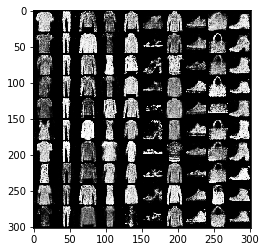

[Epoch 79/100] [Batch 0/600] [D loss: 1.374548] [G loss: 0.745294]
[Epoch 79/100] [Batch 1/600] [D loss: 1.370736] [G loss: 0.757786]
[Epoch 79/100] [Batch 2/600] [D loss: 1.377055] [G loss: 0.764554]
[Epoch 79/100] [Batch 3/600] [D loss: 1.377124] [G loss: 0.739137]
[Epoch 79/100] [Batch 4/600] [D loss: 1.390326] [G loss: 0.715627]
[Epoch 79/100] [Batch 5/600] [D loss: 1.329133] [G loss: 0.710361]
[Epoch 79/100] [Batch 6/600] [D loss: 1.409877] [G loss: 0.730368]
[Epoch 79/100] [Batch 7/600] [D loss: 1.345925] [G loss: 0.715059]
[Epoch 79/100] [Batch 8/600] [D loss: 1.383736] [G loss: 0.726099]
[Epoch 79/100] [Batch 9/600] [D loss: 1.413803] [G loss: 0.736883]
[Epoch 79/100] [Batch 10/600] [D loss: 1.399770] [G loss: 0.735133]
[Epoch 79/100] [Batch 11/600] [D loss: 1.365292] [G loss: 0.716577]
[Epoch 79/100] [Batch 12/600] [D loss: 1.359813] [G loss: 0.692754]
[Epoch 79/100] [Batch 13/600] [D loss: 1.361697] [G loss: 0.704318]
[Epoch 79/100] [Batch 14/600] [D loss: 1.396079] [G loss: 

[Epoch 79/100] [Batch 238/600] [D loss: 1.380556] [G loss: 0.754780]
[Epoch 79/100] [Batch 239/600] [D loss: 1.345154] [G loss: 0.732460]
[Epoch 79/100] [Batch 240/600] [D loss: 1.386496] [G loss: 0.743128]
[Epoch 79/100] [Batch 241/600] [D loss: 1.363322] [G loss: 0.723714]
[Epoch 79/100] [Batch 242/600] [D loss: 1.363164] [G loss: 0.741607]
[Epoch 79/100] [Batch 243/600] [D loss: 1.348445] [G loss: 0.750012]
[Epoch 79/100] [Batch 244/600] [D loss: 1.377978] [G loss: 0.766007]
[Epoch 79/100] [Batch 245/600] [D loss: 1.333106] [G loss: 0.744549]
[Epoch 79/100] [Batch 246/600] [D loss: 1.366122] [G loss: 0.736292]
[Epoch 79/100] [Batch 247/600] [D loss: 1.377150] [G loss: 0.739391]
[Epoch 79/100] [Batch 248/600] [D loss: 1.357012] [G loss: 0.721097]
[Epoch 79/100] [Batch 249/600] [D loss: 1.381315] [G loss: 0.723100]
[Epoch 79/100] [Batch 250/600] [D loss: 1.401597] [G loss: 0.706683]
[Epoch 79/100] [Batch 251/600] [D loss: 1.372094] [G loss: 0.683027]
[Epoch 79/100] [Batch 252/600] [D 

[Epoch 79/100] [Batch 474/600] [D loss: 1.387567] [G loss: 0.712960]
[Epoch 79/100] [Batch 475/600] [D loss: 1.355416] [G loss: 0.743085]
[Epoch 79/100] [Batch 476/600] [D loss: 1.347789] [G loss: 0.756698]
[Epoch 79/100] [Batch 477/600] [D loss: 1.383196] [G loss: 0.759023]
[Epoch 79/100] [Batch 478/600] [D loss: 1.349732] [G loss: 0.709551]
[Epoch 79/100] [Batch 479/600] [D loss: 1.376605] [G loss: 0.694641]
[Epoch 79/100] [Batch 480/600] [D loss: 1.334357] [G loss: 0.715868]
[Epoch 79/100] [Batch 481/600] [D loss: 1.376066] [G loss: 0.723440]
[Epoch 79/100] [Batch 482/600] [D loss: 1.394658] [G loss: 0.713098]
[Epoch 79/100] [Batch 483/600] [D loss: 1.359461] [G loss: 0.722228]
[Epoch 79/100] [Batch 484/600] [D loss: 1.383670] [G loss: 0.724947]
[Epoch 79/100] [Batch 485/600] [D loss: 1.384526] [G loss: 0.731119]
[Epoch 79/100] [Batch 486/600] [D loss: 1.375168] [G loss: 0.740277]
[Epoch 79/100] [Batch 487/600] [D loss: 1.349152] [G loss: 0.740673]
[Epoch 79/100] [Batch 488/600] [D 

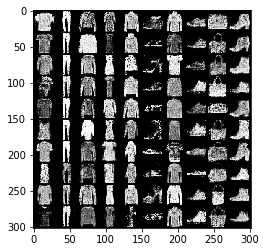

[Epoch 80/100] [Batch 0/600] [D loss: 1.366463] [G loss: 0.727339]
[Epoch 80/100] [Batch 1/600] [D loss: 1.349566] [G loss: 0.708417]
[Epoch 80/100] [Batch 2/600] [D loss: 1.382443] [G loss: 0.722677]
[Epoch 80/100] [Batch 3/600] [D loss: 1.386815] [G loss: 0.723580]
[Epoch 80/100] [Batch 4/600] [D loss: 1.351508] [G loss: 0.733417]
[Epoch 80/100] [Batch 5/600] [D loss: 1.348645] [G loss: 0.719847]
[Epoch 80/100] [Batch 6/600] [D loss: 1.374583] [G loss: 0.713066]
[Epoch 80/100] [Batch 7/600] [D loss: 1.343224] [G loss: 0.697858]
[Epoch 80/100] [Batch 8/600] [D loss: 1.352309] [G loss: 0.721941]
[Epoch 80/100] [Batch 9/600] [D loss: 1.385521] [G loss: 0.749642]
[Epoch 80/100] [Batch 10/600] [D loss: 1.408663] [G loss: 0.756277]
[Epoch 80/100] [Batch 11/600] [D loss: 1.358841] [G loss: 0.754894]
[Epoch 80/100] [Batch 12/600] [D loss: 1.390615] [G loss: 0.751565]
[Epoch 80/100] [Batch 13/600] [D loss: 1.380356] [G loss: 0.704918]
[Epoch 80/100] [Batch 14/600] [D loss: 1.371137] [G loss: 

[Epoch 80/100] [Batch 238/600] [D loss: 1.366536] [G loss: 0.731481]
[Epoch 80/100] [Batch 239/600] [D loss: 1.364727] [G loss: 0.715594]
[Epoch 80/100] [Batch 240/600] [D loss: 1.352677] [G loss: 0.710939]
[Epoch 80/100] [Batch 241/600] [D loss: 1.390900] [G loss: 0.720669]
[Epoch 80/100] [Batch 242/600] [D loss: 1.378955] [G loss: 0.693869]
[Epoch 80/100] [Batch 243/600] [D loss: 1.351750] [G loss: 0.677741]
[Epoch 80/100] [Batch 244/600] [D loss: 1.346156] [G loss: 0.681985]
[Epoch 80/100] [Batch 245/600] [D loss: 1.378909] [G loss: 0.723845]
[Epoch 80/100] [Batch 246/600] [D loss: 1.355639] [G loss: 0.735892]
[Epoch 80/100] [Batch 247/600] [D loss: 1.358212] [G loss: 0.770216]
[Epoch 80/100] [Batch 248/600] [D loss: 1.354864] [G loss: 0.738693]
[Epoch 80/100] [Batch 249/600] [D loss: 1.385341] [G loss: 0.744591]
[Epoch 80/100] [Batch 250/600] [D loss: 1.375435] [G loss: 0.743462]
[Epoch 80/100] [Batch 251/600] [D loss: 1.350060] [G loss: 0.741968]
[Epoch 80/100] [Batch 252/600] [D 

[Epoch 80/100] [Batch 474/600] [D loss: 1.383613] [G loss: 0.711665]
[Epoch 80/100] [Batch 475/600] [D loss: 1.416957] [G loss: 0.723640]
[Epoch 80/100] [Batch 476/600] [D loss: 1.371074] [G loss: 0.691280]
[Epoch 80/100] [Batch 477/600] [D loss: 1.374667] [G loss: 0.724080]
[Epoch 80/100] [Batch 478/600] [D loss: 1.360595] [G loss: 0.698815]
[Epoch 80/100] [Batch 479/600] [D loss: 1.389663] [G loss: 0.714729]
[Epoch 80/100] [Batch 480/600] [D loss: 1.371244] [G loss: 0.737060]
[Epoch 80/100] [Batch 481/600] [D loss: 1.352157] [G loss: 0.726781]
[Epoch 80/100] [Batch 482/600] [D loss: 1.360148] [G loss: 0.701335]
[Epoch 80/100] [Batch 483/600] [D loss: 1.355747] [G loss: 0.723687]
[Epoch 80/100] [Batch 484/600] [D loss: 1.351532] [G loss: 0.723492]
[Epoch 80/100] [Batch 485/600] [D loss: 1.366831] [G loss: 0.745858]
[Epoch 80/100] [Batch 486/600] [D loss: 1.321912] [G loss: 0.758003]
[Epoch 80/100] [Batch 487/600] [D loss: 1.366904] [G loss: 0.739608]
[Epoch 80/100] [Batch 488/600] [D 

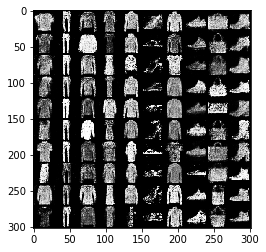

[Epoch 81/100] [Batch 0/600] [D loss: 1.402494] [G loss: 0.737426]
[Epoch 81/100] [Batch 1/600] [D loss: 1.361807] [G loss: 0.744052]
[Epoch 81/100] [Batch 2/600] [D loss: 1.362731] [G loss: 0.714974]
[Epoch 81/100] [Batch 3/600] [D loss: 1.392088] [G loss: 0.716519]
[Epoch 81/100] [Batch 4/600] [D loss: 1.394669] [G loss: 0.748959]
[Epoch 81/100] [Batch 5/600] [D loss: 1.368507] [G loss: 0.741376]
[Epoch 81/100] [Batch 6/600] [D loss: 1.409199] [G loss: 0.762503]
[Epoch 81/100] [Batch 7/600] [D loss: 1.350051] [G loss: 0.702258]
[Epoch 81/100] [Batch 8/600] [D loss: 1.352121] [G loss: 0.712943]
[Epoch 81/100] [Batch 9/600] [D loss: 1.362184] [G loss: 0.730783]
[Epoch 81/100] [Batch 10/600] [D loss: 1.338579] [G loss: 0.710811]
[Epoch 81/100] [Batch 11/600] [D loss: 1.364481] [G loss: 0.728584]
[Epoch 81/100] [Batch 12/600] [D loss: 1.375047] [G loss: 0.787045]
[Epoch 81/100] [Batch 13/600] [D loss: 1.371637] [G loss: 0.768487]
[Epoch 81/100] [Batch 14/600] [D loss: 1.361336] [G loss: 

[Epoch 81/100] [Batch 238/600] [D loss: 1.333449] [G loss: 0.673441]
[Epoch 81/100] [Batch 239/600] [D loss: 1.360770] [G loss: 0.731162]
[Epoch 81/100] [Batch 240/600] [D loss: 1.400720] [G loss: 0.742911]
[Epoch 81/100] [Batch 241/600] [D loss: 1.382551] [G loss: 0.754508]
[Epoch 81/100] [Batch 242/600] [D loss: 1.415818] [G loss: 0.732241]
[Epoch 81/100] [Batch 243/600] [D loss: 1.395219] [G loss: 0.723675]
[Epoch 81/100] [Batch 244/600] [D loss: 1.385176] [G loss: 0.710456]
[Epoch 81/100] [Batch 245/600] [D loss: 1.381794] [G loss: 0.705370]
[Epoch 81/100] [Batch 246/600] [D loss: 1.397680] [G loss: 0.719570]
[Epoch 81/100] [Batch 247/600] [D loss: 1.381932] [G loss: 0.730337]
[Epoch 81/100] [Batch 248/600] [D loss: 1.368877] [G loss: 0.753136]
[Epoch 81/100] [Batch 249/600] [D loss: 1.378898] [G loss: 0.732239]
[Epoch 81/100] [Batch 250/600] [D loss: 1.393728] [G loss: 0.717111]
[Epoch 81/100] [Batch 251/600] [D loss: 1.364441] [G loss: 0.684484]
[Epoch 81/100] [Batch 252/600] [D 

[Epoch 81/100] [Batch 474/600] [D loss: 1.362983] [G loss: 0.704257]
[Epoch 81/100] [Batch 475/600] [D loss: 1.382061] [G loss: 0.696200]
[Epoch 81/100] [Batch 476/600] [D loss: 1.371745] [G loss: 0.683781]
[Epoch 81/100] [Batch 477/600] [D loss: 1.353252] [G loss: 0.710053]
[Epoch 81/100] [Batch 478/600] [D loss: 1.353525] [G loss: 0.705652]
[Epoch 81/100] [Batch 479/600] [D loss: 1.369519] [G loss: 0.740369]
[Epoch 81/100] [Batch 480/600] [D loss: 1.355196] [G loss: 0.739046]
[Epoch 81/100] [Batch 481/600] [D loss: 1.367829] [G loss: 0.747058]
[Epoch 81/100] [Batch 482/600] [D loss: 1.368740] [G loss: 0.734668]
[Epoch 81/100] [Batch 483/600] [D loss: 1.348830] [G loss: 0.726031]
[Epoch 81/100] [Batch 484/600] [D loss: 1.350531] [G loss: 0.731566]
[Epoch 81/100] [Batch 485/600] [D loss: 1.339753] [G loss: 0.728925]
[Epoch 81/100] [Batch 486/600] [D loss: 1.361537] [G loss: 0.747804]
[Epoch 81/100] [Batch 487/600] [D loss: 1.385437] [G loss: 0.767446]
[Epoch 81/100] [Batch 488/600] [D 

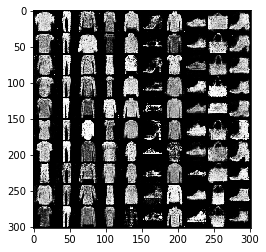

[Epoch 82/100] [Batch 0/600] [D loss: 1.340468] [G loss: 0.748199]
[Epoch 82/100] [Batch 1/600] [D loss: 1.383180] [G loss: 0.714958]
[Epoch 82/100] [Batch 2/600] [D loss: 1.406161] [G loss: 0.722461]
[Epoch 82/100] [Batch 3/600] [D loss: 1.366586] [G loss: 0.725450]
[Epoch 82/100] [Batch 4/600] [D loss: 1.360538] [G loss: 0.714627]
[Epoch 82/100] [Batch 5/600] [D loss: 1.381296] [G loss: 0.703553]
[Epoch 82/100] [Batch 6/600] [D loss: 1.342325] [G loss: 0.713797]
[Epoch 82/100] [Batch 7/600] [D loss: 1.384239] [G loss: 0.724833]
[Epoch 82/100] [Batch 8/600] [D loss: 1.388721] [G loss: 0.735178]
[Epoch 82/100] [Batch 9/600] [D loss: 1.374386] [G loss: 0.760995]
[Epoch 82/100] [Batch 10/600] [D loss: 1.386115] [G loss: 0.764803]
[Epoch 82/100] [Batch 11/600] [D loss: 1.344449] [G loss: 0.744723]
[Epoch 82/100] [Batch 12/600] [D loss: 1.352391] [G loss: 0.697471]
[Epoch 82/100] [Batch 13/600] [D loss: 1.365070] [G loss: 0.749478]
[Epoch 82/100] [Batch 14/600] [D loss: 1.361112] [G loss: 

[Epoch 82/100] [Batch 238/600] [D loss: 1.419102] [G loss: 0.711097]
[Epoch 82/100] [Batch 239/600] [D loss: 1.403967] [G loss: 0.714263]
[Epoch 82/100] [Batch 240/600] [D loss: 1.373168] [G loss: 0.752235]
[Epoch 82/100] [Batch 241/600] [D loss: 1.339666] [G loss: 0.733680]
[Epoch 82/100] [Batch 242/600] [D loss: 1.371478] [G loss: 0.722513]
[Epoch 82/100] [Batch 243/600] [D loss: 1.387239] [G loss: 0.706837]
[Epoch 82/100] [Batch 244/600] [D loss: 1.361842] [G loss: 0.717203]
[Epoch 82/100] [Batch 245/600] [D loss: 1.415130] [G loss: 0.732959]
[Epoch 82/100] [Batch 246/600] [D loss: 1.360315] [G loss: 0.760779]
[Epoch 82/100] [Batch 247/600] [D loss: 1.375756] [G loss: 0.708988]
[Epoch 82/100] [Batch 248/600] [D loss: 1.360944] [G loss: 0.727073]
[Epoch 82/100] [Batch 249/600] [D loss: 1.392503] [G loss: 0.717895]
[Epoch 82/100] [Batch 250/600] [D loss: 1.394738] [G loss: 0.741709]
[Epoch 82/100] [Batch 251/600] [D loss: 1.372165] [G loss: 0.723050]
[Epoch 82/100] [Batch 252/600] [D 

[Epoch 82/100] [Batch 474/600] [D loss: 1.374957] [G loss: 0.716654]
[Epoch 82/100] [Batch 475/600] [D loss: 1.386193] [G loss: 0.711999]
[Epoch 82/100] [Batch 476/600] [D loss: 1.361943] [G loss: 0.724382]
[Epoch 82/100] [Batch 477/600] [D loss: 1.387010] [G loss: 0.756415]
[Epoch 82/100] [Batch 478/600] [D loss: 1.376201] [G loss: 0.745857]
[Epoch 82/100] [Batch 479/600] [D loss: 1.377893] [G loss: 0.747832]
[Epoch 82/100] [Batch 480/600] [D loss: 1.366982] [G loss: 0.726692]
[Epoch 82/100] [Batch 481/600] [D loss: 1.369641] [G loss: 0.733807]
[Epoch 82/100] [Batch 482/600] [D loss: 1.383943] [G loss: 0.705789]
[Epoch 82/100] [Batch 483/600] [D loss: 1.356888] [G loss: 0.737039]
[Epoch 82/100] [Batch 484/600] [D loss: 1.384082] [G loss: 0.715659]
[Epoch 82/100] [Batch 485/600] [D loss: 1.347891] [G loss: 0.716439]
[Epoch 82/100] [Batch 486/600] [D loss: 1.373096] [G loss: 0.713629]
[Epoch 82/100] [Batch 487/600] [D loss: 1.355647] [G loss: 0.708459]
[Epoch 82/100] [Batch 488/600] [D 

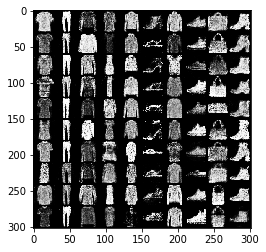

[Epoch 83/100] [Batch 0/600] [D loss: 1.377640] [G loss: 0.732778]
[Epoch 83/100] [Batch 1/600] [D loss: 1.366186] [G loss: 0.728114]
[Epoch 83/100] [Batch 2/600] [D loss: 1.362587] [G loss: 0.712461]
[Epoch 83/100] [Batch 3/600] [D loss: 1.362785] [G loss: 0.687911]
[Epoch 83/100] [Batch 4/600] [D loss: 1.368932] [G loss: 0.689381]
[Epoch 83/100] [Batch 5/600] [D loss: 1.363648] [G loss: 0.698884]
[Epoch 83/100] [Batch 6/600] [D loss: 1.367910] [G loss: 0.705970]
[Epoch 83/100] [Batch 7/600] [D loss: 1.376892] [G loss: 0.736760]
[Epoch 83/100] [Batch 8/600] [D loss: 1.333029] [G loss: 0.724828]
[Epoch 83/100] [Batch 9/600] [D loss: 1.374319] [G loss: 0.722584]
[Epoch 83/100] [Batch 10/600] [D loss: 1.367070] [G loss: 0.682195]
[Epoch 83/100] [Batch 11/600] [D loss: 1.361599] [G loss: 0.706313]
[Epoch 83/100] [Batch 12/600] [D loss: 1.350085] [G loss: 0.771556]
[Epoch 83/100] [Batch 13/600] [D loss: 1.376052] [G loss: 0.755697]
[Epoch 83/100] [Batch 14/600] [D loss: 1.346644] [G loss: 

[Epoch 83/100] [Batch 238/600] [D loss: 1.387557] [G loss: 0.765954]
[Epoch 83/100] [Batch 239/600] [D loss: 1.361668] [G loss: 0.751583]
[Epoch 83/100] [Batch 240/600] [D loss: 1.406052] [G loss: 0.730179]
[Epoch 83/100] [Batch 241/600] [D loss: 1.405721] [G loss: 0.729076]
[Epoch 83/100] [Batch 242/600] [D loss: 1.342000] [G loss: 0.733356]
[Epoch 83/100] [Batch 243/600] [D loss: 1.382148] [G loss: 0.736077]
[Epoch 83/100] [Batch 244/600] [D loss: 1.371222] [G loss: 0.722700]
[Epoch 83/100] [Batch 245/600] [D loss: 1.350828] [G loss: 0.693304]
[Epoch 83/100] [Batch 246/600] [D loss: 1.375697] [G loss: 0.684286]
[Epoch 83/100] [Batch 247/600] [D loss: 1.357042] [G loss: 0.665360]
[Epoch 83/100] [Batch 248/600] [D loss: 1.347117] [G loss: 0.707855]
[Epoch 83/100] [Batch 249/600] [D loss: 1.378134] [G loss: 0.684687]
[Epoch 83/100] [Batch 250/600] [D loss: 1.371425] [G loss: 0.731280]
[Epoch 83/100] [Batch 251/600] [D loss: 1.372496] [G loss: 0.726647]
[Epoch 83/100] [Batch 252/600] [D 

[Epoch 83/100] [Batch 474/600] [D loss: 1.373258] [G loss: 0.701626]
[Epoch 83/100] [Batch 475/600] [D loss: 1.393249] [G loss: 0.719962]
[Epoch 83/100] [Batch 476/600] [D loss: 1.369857] [G loss: 0.690433]
[Epoch 83/100] [Batch 477/600] [D loss: 1.385635] [G loss: 0.728425]
[Epoch 83/100] [Batch 478/600] [D loss: 1.390694] [G loss: 0.729791]
[Epoch 83/100] [Batch 479/600] [D loss: 1.402421] [G loss: 0.718488]
[Epoch 83/100] [Batch 480/600] [D loss: 1.364723] [G loss: 0.743015]
[Epoch 83/100] [Batch 481/600] [D loss: 1.376024] [G loss: 0.727916]
[Epoch 83/100] [Batch 482/600] [D loss: 1.396832] [G loss: 0.758099]
[Epoch 83/100] [Batch 483/600] [D loss: 1.385240] [G loss: 0.741992]
[Epoch 83/100] [Batch 484/600] [D loss: 1.388186] [G loss: 0.708201]
[Epoch 83/100] [Batch 485/600] [D loss: 1.384365] [G loss: 0.704601]
[Epoch 83/100] [Batch 486/600] [D loss: 1.375532] [G loss: 0.706554]
[Epoch 83/100] [Batch 487/600] [D loss: 1.400991] [G loss: 0.709633]
[Epoch 83/100] [Batch 488/600] [D 

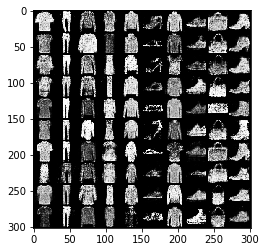

[Epoch 84/100] [Batch 0/600] [D loss: 1.369568] [G loss: 0.738928]
[Epoch 84/100] [Batch 1/600] [D loss: 1.364152] [G loss: 0.709096]
[Epoch 84/100] [Batch 2/600] [D loss: 1.411903] [G loss: 0.706416]
[Epoch 84/100] [Batch 3/600] [D loss: 1.282235] [G loss: 0.670466]
[Epoch 84/100] [Batch 4/600] [D loss: 1.365472] [G loss: 0.715761]
[Epoch 84/100] [Batch 5/600] [D loss: 1.360111] [G loss: 0.748217]
[Epoch 84/100] [Batch 6/600] [D loss: 1.375009] [G loss: 0.730510]
[Epoch 84/100] [Batch 7/600] [D loss: 1.382822] [G loss: 0.710010]
[Epoch 84/100] [Batch 8/600] [D loss: 1.386391] [G loss: 0.730197]
[Epoch 84/100] [Batch 9/600] [D loss: 1.339172] [G loss: 0.724059]
[Epoch 84/100] [Batch 10/600] [D loss: 1.403699] [G loss: 0.725942]
[Epoch 84/100] [Batch 11/600] [D loss: 1.403130] [G loss: 0.745484]
[Epoch 84/100] [Batch 12/600] [D loss: 1.365169] [G loss: 0.750548]
[Epoch 84/100] [Batch 13/600] [D loss: 1.413064] [G loss: 0.757244]
[Epoch 84/100] [Batch 14/600] [D loss: 1.411157] [G loss: 

[Epoch 84/100] [Batch 238/600] [D loss: 1.387097] [G loss: 0.778307]
[Epoch 84/100] [Batch 239/600] [D loss: 1.377618] [G loss: 0.763274]
[Epoch 84/100] [Batch 240/600] [D loss: 1.365603] [G loss: 0.765001]
[Epoch 84/100] [Batch 241/600] [D loss: 1.380094] [G loss: 0.741824]
[Epoch 84/100] [Batch 242/600] [D loss: 1.361097] [G loss: 0.764070]
[Epoch 84/100] [Batch 243/600] [D loss: 1.376879] [G loss: 0.714832]
[Epoch 84/100] [Batch 244/600] [D loss: 1.392369] [G loss: 0.747174]
[Epoch 84/100] [Batch 245/600] [D loss: 1.363734] [G loss: 0.737126]
[Epoch 84/100] [Batch 246/600] [D loss: 1.344809] [G loss: 0.753067]
[Epoch 84/100] [Batch 247/600] [D loss: 1.356113] [G loss: 0.704959]
[Epoch 84/100] [Batch 248/600] [D loss: 1.388609] [G loss: 0.746450]
[Epoch 84/100] [Batch 249/600] [D loss: 1.387607] [G loss: 0.754579]
[Epoch 84/100] [Batch 250/600] [D loss: 1.398253] [G loss: 0.732237]
[Epoch 84/100] [Batch 251/600] [D loss: 1.381037] [G loss: 0.738019]
[Epoch 84/100] [Batch 252/600] [D 

[Epoch 84/100] [Batch 474/600] [D loss: 1.378934] [G loss: 0.692047]
[Epoch 84/100] [Batch 475/600] [D loss: 1.381953] [G loss: 0.745892]
[Epoch 84/100] [Batch 476/600] [D loss: 1.387635] [G loss: 0.723035]
[Epoch 84/100] [Batch 477/600] [D loss: 1.378656] [G loss: 0.718463]
[Epoch 84/100] [Batch 478/600] [D loss: 1.397709] [G loss: 0.721025]
[Epoch 84/100] [Batch 479/600] [D loss: 1.351555] [G loss: 0.704845]
[Epoch 84/100] [Batch 480/600] [D loss: 1.368503] [G loss: 0.700169]
[Epoch 84/100] [Batch 481/600] [D loss: 1.363155] [G loss: 0.709188]
[Epoch 84/100] [Batch 482/600] [D loss: 1.353349] [G loss: 0.714745]
[Epoch 84/100] [Batch 483/600] [D loss: 1.338498] [G loss: 0.726569]
[Epoch 84/100] [Batch 484/600] [D loss: 1.366939] [G loss: 0.704229]
[Epoch 84/100] [Batch 485/600] [D loss: 1.359523] [G loss: 0.709307]
[Epoch 84/100] [Batch 486/600] [D loss: 1.352904] [G loss: 0.719614]
[Epoch 84/100] [Batch 487/600] [D loss: 1.369936] [G loss: 0.738310]
[Epoch 84/100] [Batch 488/600] [D 

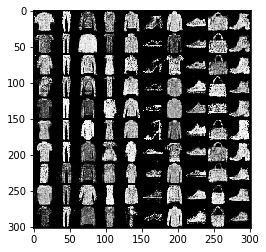

[Epoch 85/100] [Batch 0/600] [D loss: 1.369530] [G loss: 0.719680]
[Epoch 85/100] [Batch 1/600] [D loss: 1.352595] [G loss: 0.699847]
[Epoch 85/100] [Batch 2/600] [D loss: 1.383435] [G loss: 0.697496]
[Epoch 85/100] [Batch 3/600] [D loss: 1.371498] [G loss: 0.721054]
[Epoch 85/100] [Batch 4/600] [D loss: 1.344620] [G loss: 0.721518]
[Epoch 85/100] [Batch 5/600] [D loss: 1.360663] [G loss: 0.709889]
[Epoch 85/100] [Batch 6/600] [D loss: 1.376241] [G loss: 0.718238]
[Epoch 85/100] [Batch 7/600] [D loss: 1.396461] [G loss: 0.745046]
[Epoch 85/100] [Batch 8/600] [D loss: 1.365931] [G loss: 0.773614]
[Epoch 85/100] [Batch 9/600] [D loss: 1.355201] [G loss: 0.742228]
[Epoch 85/100] [Batch 10/600] [D loss: 1.366626] [G loss: 0.717402]
[Epoch 85/100] [Batch 11/600] [D loss: 1.356491] [G loss: 0.694787]
[Epoch 85/100] [Batch 12/600] [D loss: 1.354054] [G loss: 0.709540]
[Epoch 85/100] [Batch 13/600] [D loss: 1.354421] [G loss: 0.723617]
[Epoch 85/100] [Batch 14/600] [D loss: 1.373589] [G loss: 

[Epoch 85/100] [Batch 238/600] [D loss: 1.368939] [G loss: 0.740531]
[Epoch 85/100] [Batch 239/600] [D loss: 1.385118] [G loss: 0.715815]
[Epoch 85/100] [Batch 240/600] [D loss: 1.365880] [G loss: 0.714466]
[Epoch 85/100] [Batch 241/600] [D loss: 1.346342] [G loss: 0.707784]
[Epoch 85/100] [Batch 242/600] [D loss: 1.364792] [G loss: 0.719994]
[Epoch 85/100] [Batch 243/600] [D loss: 1.363409] [G loss: 0.713428]
[Epoch 85/100] [Batch 244/600] [D loss: 1.360873] [G loss: 0.720016]
[Epoch 85/100] [Batch 245/600] [D loss: 1.388840] [G loss: 0.703512]
[Epoch 85/100] [Batch 246/600] [D loss: 1.400275] [G loss: 0.749541]
[Epoch 85/100] [Batch 247/600] [D loss: 1.362949] [G loss: 0.770379]
[Epoch 85/100] [Batch 248/600] [D loss: 1.424648] [G loss: 0.724648]
[Epoch 85/100] [Batch 249/600] [D loss: 1.394149] [G loss: 0.742881]
[Epoch 85/100] [Batch 250/600] [D loss: 1.356539] [G loss: 0.697896]
[Epoch 85/100] [Batch 251/600] [D loss: 1.397126] [G loss: 0.720840]
[Epoch 85/100] [Batch 252/600] [D 

[Epoch 85/100] [Batch 474/600] [D loss: 1.369979] [G loss: 0.725251]
[Epoch 85/100] [Batch 475/600] [D loss: 1.391653] [G loss: 0.734787]
[Epoch 85/100] [Batch 476/600] [D loss: 1.343180] [G loss: 0.734800]
[Epoch 85/100] [Batch 477/600] [D loss: 1.389827] [G loss: 0.686159]
[Epoch 85/100] [Batch 478/600] [D loss: 1.403288] [G loss: 0.734312]
[Epoch 85/100] [Batch 479/600] [D loss: 1.359899] [G loss: 0.716384]
[Epoch 85/100] [Batch 480/600] [D loss: 1.383159] [G loss: 0.726920]
[Epoch 85/100] [Batch 481/600] [D loss: 1.365832] [G loss: 0.722908]
[Epoch 85/100] [Batch 482/600] [D loss: 1.396369] [G loss: 0.705442]
[Epoch 85/100] [Batch 483/600] [D loss: 1.406565] [G loss: 0.735281]
[Epoch 85/100] [Batch 484/600] [D loss: 1.369435] [G loss: 0.724124]
[Epoch 85/100] [Batch 485/600] [D loss: 1.361832] [G loss: 0.735764]
[Epoch 85/100] [Batch 486/600] [D loss: 1.362540] [G loss: 0.726574]
[Epoch 85/100] [Batch 487/600] [D loss: 1.366206] [G loss: 0.725799]
[Epoch 85/100] [Batch 488/600] [D 

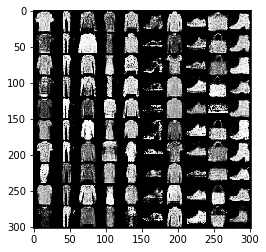

[Epoch 86/100] [Batch 0/600] [D loss: 1.378177] [G loss: 0.737081]
[Epoch 86/100] [Batch 1/600] [D loss: 1.383067] [G loss: 0.723397]
[Epoch 86/100] [Batch 2/600] [D loss: 1.393356] [G loss: 0.712898]
[Epoch 86/100] [Batch 3/600] [D loss: 1.407003] [G loss: 0.721424]
[Epoch 86/100] [Batch 4/600] [D loss: 1.385520] [G loss: 0.723691]
[Epoch 86/100] [Batch 5/600] [D loss: 1.367622] [G loss: 0.720729]
[Epoch 86/100] [Batch 6/600] [D loss: 1.383351] [G loss: 0.707082]
[Epoch 86/100] [Batch 7/600] [D loss: 1.367326] [G loss: 0.706275]
[Epoch 86/100] [Batch 8/600] [D loss: 1.375469] [G loss: 0.704972]
[Epoch 86/100] [Batch 9/600] [D loss: 1.369227] [G loss: 0.710954]
[Epoch 86/100] [Batch 10/600] [D loss: 1.362087] [G loss: 0.714677]
[Epoch 86/100] [Batch 11/600] [D loss: 1.374431] [G loss: 0.724718]
[Epoch 86/100] [Batch 12/600] [D loss: 1.349166] [G loss: 0.702792]
[Epoch 86/100] [Batch 13/600] [D loss: 1.380421] [G loss: 0.715778]
[Epoch 86/100] [Batch 14/600] [D loss: 1.363332] [G loss: 

[Epoch 86/100] [Batch 238/600] [D loss: 1.365281] [G loss: 0.743451]
[Epoch 86/100] [Batch 239/600] [D loss: 1.350068] [G loss: 0.734331]
[Epoch 86/100] [Batch 240/600] [D loss: 1.333760] [G loss: 0.711125]
[Epoch 86/100] [Batch 241/600] [D loss: 1.345544] [G loss: 0.694973]
[Epoch 86/100] [Batch 242/600] [D loss: 1.372685] [G loss: 0.710223]
[Epoch 86/100] [Batch 243/600] [D loss: 1.376930] [G loss: 0.720664]
[Epoch 86/100] [Batch 244/600] [D loss: 1.364022] [G loss: 0.741557]
[Epoch 86/100] [Batch 245/600] [D loss: 1.353935] [G loss: 0.712822]
[Epoch 86/100] [Batch 246/600] [D loss: 1.348302] [G loss: 0.749950]
[Epoch 86/100] [Batch 247/600] [D loss: 1.381753] [G loss: 0.750063]
[Epoch 86/100] [Batch 248/600] [D loss: 1.375810] [G loss: 0.716229]
[Epoch 86/100] [Batch 249/600] [D loss: 1.347529] [G loss: 0.725221]
[Epoch 86/100] [Batch 250/600] [D loss: 1.363812] [G loss: 0.706811]
[Epoch 86/100] [Batch 251/600] [D loss: 1.394727] [G loss: 0.702892]
[Epoch 86/100] [Batch 252/600] [D 

[Epoch 86/100] [Batch 474/600] [D loss: 1.365002] [G loss: 0.706955]
[Epoch 86/100] [Batch 475/600] [D loss: 1.377188] [G loss: 0.713657]
[Epoch 86/100] [Batch 476/600] [D loss: 1.399134] [G loss: 0.724058]
[Epoch 86/100] [Batch 477/600] [D loss: 1.358744] [G loss: 0.735176]
[Epoch 86/100] [Batch 478/600] [D loss: 1.351923] [G loss: 0.722625]
[Epoch 86/100] [Batch 479/600] [D loss: 1.348087] [G loss: 0.702350]
[Epoch 86/100] [Batch 480/600] [D loss: 1.346064] [G loss: 0.705108]
[Epoch 86/100] [Batch 481/600] [D loss: 1.361320] [G loss: 0.707667]
[Epoch 86/100] [Batch 482/600] [D loss: 1.397697] [G loss: 0.690668]
[Epoch 86/100] [Batch 483/600] [D loss: 1.359989] [G loss: 0.762008]
[Epoch 86/100] [Batch 484/600] [D loss: 1.343019] [G loss: 0.737038]
[Epoch 86/100] [Batch 485/600] [D loss: 1.368104] [G loss: 0.771398]
[Epoch 86/100] [Batch 486/600] [D loss: 1.382938] [G loss: 0.742600]
[Epoch 86/100] [Batch 487/600] [D loss: 1.354117] [G loss: 0.781494]
[Epoch 86/100] [Batch 488/600] [D 

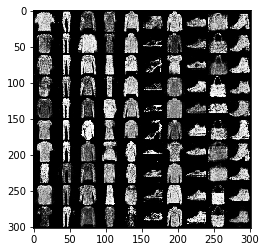

[Epoch 87/100] [Batch 0/600] [D loss: 1.345612] [G loss: 0.721690]
[Epoch 87/100] [Batch 1/600] [D loss: 1.366394] [G loss: 0.719794]
[Epoch 87/100] [Batch 2/600] [D loss: 1.361680] [G loss: 0.704315]
[Epoch 87/100] [Batch 3/600] [D loss: 1.375812] [G loss: 0.698324]
[Epoch 87/100] [Batch 4/600] [D loss: 1.359873] [G loss: 0.700679]
[Epoch 87/100] [Batch 5/600] [D loss: 1.351604] [G loss: 0.727231]
[Epoch 87/100] [Batch 6/600] [D loss: 1.370175] [G loss: 0.755354]
[Epoch 87/100] [Batch 7/600] [D loss: 1.375082] [G loss: 0.738689]
[Epoch 87/100] [Batch 8/600] [D loss: 1.365864] [G loss: 0.748918]
[Epoch 87/100] [Batch 9/600] [D loss: 1.344248] [G loss: 0.753086]
[Epoch 87/100] [Batch 10/600] [D loss: 1.371091] [G loss: 0.760001]
[Epoch 87/100] [Batch 11/600] [D loss: 1.367539] [G loss: 0.771928]
[Epoch 87/100] [Batch 12/600] [D loss: 1.393605] [G loss: 0.767406]
[Epoch 87/100] [Batch 13/600] [D loss: 1.365352] [G loss: 0.765262]
[Epoch 87/100] [Batch 14/600] [D loss: 1.374717] [G loss: 

[Epoch 87/100] [Batch 238/600] [D loss: 1.396625] [G loss: 0.756961]
[Epoch 87/100] [Batch 239/600] [D loss: 1.380069] [G loss: 0.750881]
[Epoch 87/100] [Batch 240/600] [D loss: 1.379073] [G loss: 0.735452]
[Epoch 87/100] [Batch 241/600] [D loss: 1.411091] [G loss: 0.745683]
[Epoch 87/100] [Batch 242/600] [D loss: 1.374008] [G loss: 0.717460]
[Epoch 87/100] [Batch 243/600] [D loss: 1.369917] [G loss: 0.711534]
[Epoch 87/100] [Batch 244/600] [D loss: 1.395647] [G loss: 0.729977]
[Epoch 87/100] [Batch 245/600] [D loss: 1.371746] [G loss: 0.726039]
[Epoch 87/100] [Batch 246/600] [D loss: 1.348807] [G loss: 0.709238]
[Epoch 87/100] [Batch 247/600] [D loss: 1.372350] [G loss: 0.749920]
[Epoch 87/100] [Batch 248/600] [D loss: 1.371906] [G loss: 0.737693]
[Epoch 87/100] [Batch 249/600] [D loss: 1.374141] [G loss: 0.720912]
[Epoch 87/100] [Batch 250/600] [D loss: 1.356457] [G loss: 0.720434]
[Epoch 87/100] [Batch 251/600] [D loss: 1.368398] [G loss: 0.689485]
[Epoch 87/100] [Batch 252/600] [D 

[Epoch 87/100] [Batch 474/600] [D loss: 1.359754] [G loss: 0.736632]
[Epoch 87/100] [Batch 475/600] [D loss: 1.368932] [G loss: 0.723862]
[Epoch 87/100] [Batch 476/600] [D loss: 1.386460] [G loss: 0.728190]
[Epoch 87/100] [Batch 477/600] [D loss: 1.406340] [G loss: 0.753832]
[Epoch 87/100] [Batch 478/600] [D loss: 1.369750] [G loss: 0.757476]
[Epoch 87/100] [Batch 479/600] [D loss: 1.373654] [G loss: 0.726976]
[Epoch 87/100] [Batch 480/600] [D loss: 1.358565] [G loss: 0.735059]
[Epoch 87/100] [Batch 481/600] [D loss: 1.345280] [G loss: 0.719184]
[Epoch 87/100] [Batch 482/600] [D loss: 1.351441] [G loss: 0.716552]
[Epoch 87/100] [Batch 483/600] [D loss: 1.367995] [G loss: 0.735028]
[Epoch 87/100] [Batch 484/600] [D loss: 1.355594] [G loss: 0.746054]
[Epoch 87/100] [Batch 485/600] [D loss: 1.353195] [G loss: 0.726578]
[Epoch 87/100] [Batch 486/600] [D loss: 1.390600] [G loss: 0.732461]
[Epoch 87/100] [Batch 487/600] [D loss: 1.368729] [G loss: 0.719927]
[Epoch 87/100] [Batch 488/600] [D 

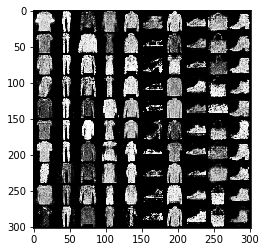

[Epoch 88/100] [Batch 0/600] [D loss: 1.384549] [G loss: 0.708132]
[Epoch 88/100] [Batch 1/600] [D loss: 1.360202] [G loss: 0.708631]
[Epoch 88/100] [Batch 2/600] [D loss: 1.357121] [G loss: 0.730120]
[Epoch 88/100] [Batch 3/600] [D loss: 1.365414] [G loss: 0.726867]
[Epoch 88/100] [Batch 4/600] [D loss: 1.338473] [G loss: 0.720442]
[Epoch 88/100] [Batch 5/600] [D loss: 1.381061] [G loss: 0.732351]
[Epoch 88/100] [Batch 6/600] [D loss: 1.350898] [G loss: 0.739612]
[Epoch 88/100] [Batch 7/600] [D loss: 1.391534] [G loss: 0.723065]
[Epoch 88/100] [Batch 8/600] [D loss: 1.346012] [G loss: 0.738874]
[Epoch 88/100] [Batch 9/600] [D loss: 1.399787] [G loss: 0.712205]
[Epoch 88/100] [Batch 10/600] [D loss: 1.389356] [G loss: 0.765365]
[Epoch 88/100] [Batch 11/600] [D loss: 1.404877] [G loss: 0.752881]
[Epoch 88/100] [Batch 12/600] [D loss: 1.413423] [G loss: 0.744157]
[Epoch 88/100] [Batch 13/600] [D loss: 1.383401] [G loss: 0.764621]
[Epoch 88/100] [Batch 14/600] [D loss: 1.372897] [G loss: 

[Epoch 88/100] [Batch 238/600] [D loss: 1.400687] [G loss: 0.688167]
[Epoch 88/100] [Batch 239/600] [D loss: 1.362566] [G loss: 0.694513]
[Epoch 88/100] [Batch 240/600] [D loss: 1.374253] [G loss: 0.732712]
[Epoch 88/100] [Batch 241/600] [D loss: 1.361653] [G loss: 0.707356]
[Epoch 88/100] [Batch 242/600] [D loss: 1.333043] [G loss: 0.717822]
[Epoch 88/100] [Batch 243/600] [D loss: 1.372571] [G loss: 0.738231]
[Epoch 88/100] [Batch 244/600] [D loss: 1.402312] [G loss: 0.756372]
[Epoch 88/100] [Batch 245/600] [D loss: 1.381107] [G loss: 0.743858]
[Epoch 88/100] [Batch 246/600] [D loss: 1.358193] [G loss: 0.725394]
[Epoch 88/100] [Batch 247/600] [D loss: 1.382102] [G loss: 0.724410]
[Epoch 88/100] [Batch 248/600] [D loss: 1.357219] [G loss: 0.705128]
[Epoch 88/100] [Batch 249/600] [D loss: 1.373922] [G loss: 0.696783]
[Epoch 88/100] [Batch 250/600] [D loss: 1.359779] [G loss: 0.701967]
[Epoch 88/100] [Batch 251/600] [D loss: 1.389258] [G loss: 0.704168]
[Epoch 88/100] [Batch 252/600] [D 

[Epoch 88/100] [Batch 474/600] [D loss: 1.376755] [G loss: 0.753275]
[Epoch 88/100] [Batch 475/600] [D loss: 1.362788] [G loss: 0.715494]
[Epoch 88/100] [Batch 476/600] [D loss: 1.391037] [G loss: 0.715645]
[Epoch 88/100] [Batch 477/600] [D loss: 1.383865] [G loss: 0.705400]
[Epoch 88/100] [Batch 478/600] [D loss: 1.371246] [G loss: 0.724812]
[Epoch 88/100] [Batch 479/600] [D loss: 1.370330] [G loss: 0.701717]
[Epoch 88/100] [Batch 480/600] [D loss: 1.398377] [G loss: 0.727364]
[Epoch 88/100] [Batch 481/600] [D loss: 1.360996] [G loss: 0.735894]
[Epoch 88/100] [Batch 482/600] [D loss: 1.361585] [G loss: 0.734531]
[Epoch 88/100] [Batch 483/600] [D loss: 1.350028] [G loss: 0.742392]
[Epoch 88/100] [Batch 484/600] [D loss: 1.349638] [G loss: 0.700418]
[Epoch 88/100] [Batch 485/600] [D loss: 1.380961] [G loss: 0.711668]
[Epoch 88/100] [Batch 486/600] [D loss: 1.388431] [G loss: 0.710913]
[Epoch 88/100] [Batch 487/600] [D loss: 1.409149] [G loss: 0.736683]
[Epoch 88/100] [Batch 488/600] [D 

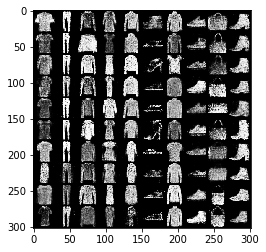

[Epoch 89/100] [Batch 0/600] [D loss: 1.356873] [G loss: 0.740957]
[Epoch 89/100] [Batch 1/600] [D loss: 1.351007] [G loss: 0.744326]
[Epoch 89/100] [Batch 2/600] [D loss: 1.360982] [G loss: 0.741763]
[Epoch 89/100] [Batch 3/600] [D loss: 1.358695] [G loss: 0.721736]
[Epoch 89/100] [Batch 4/600] [D loss: 1.382379] [G loss: 0.704247]
[Epoch 89/100] [Batch 5/600] [D loss: 1.389855] [G loss: 0.728870]
[Epoch 89/100] [Batch 6/600] [D loss: 1.379021] [G loss: 0.735688]
[Epoch 89/100] [Batch 7/600] [D loss: 1.345432] [G loss: 0.749346]
[Epoch 89/100] [Batch 8/600] [D loss: 1.374615] [G loss: 0.724484]
[Epoch 89/100] [Batch 9/600] [D loss: 1.387769] [G loss: 0.720857]
[Epoch 89/100] [Batch 10/600] [D loss: 1.382475] [G loss: 0.696205]
[Epoch 89/100] [Batch 11/600] [D loss: 1.358824] [G loss: 0.700950]
[Epoch 89/100] [Batch 12/600] [D loss: 1.373803] [G loss: 0.733538]
[Epoch 89/100] [Batch 13/600] [D loss: 1.351248] [G loss: 0.735131]
[Epoch 89/100] [Batch 14/600] [D loss: 1.335917] [G loss: 

[Epoch 89/100] [Batch 238/600] [D loss: 1.398471] [G loss: 0.737827]
[Epoch 89/100] [Batch 239/600] [D loss: 1.330713] [G loss: 0.723336]
[Epoch 89/100] [Batch 240/600] [D loss: 1.327509] [G loss: 0.730255]
[Epoch 89/100] [Batch 241/600] [D loss: 1.368011] [G loss: 0.738200]
[Epoch 89/100] [Batch 242/600] [D loss: 1.369100] [G loss: 0.751849]
[Epoch 89/100] [Batch 243/600] [D loss: 1.332270] [G loss: 0.750881]
[Epoch 89/100] [Batch 244/600] [D loss: 1.375693] [G loss: 0.746764]
[Epoch 89/100] [Batch 245/600] [D loss: 1.378953] [G loss: 0.762202]
[Epoch 89/100] [Batch 246/600] [D loss: 1.377692] [G loss: 0.776028]
[Epoch 89/100] [Batch 247/600] [D loss: 1.362628] [G loss: 0.770880]
[Epoch 89/100] [Batch 248/600] [D loss: 1.347938] [G loss: 0.741683]
[Epoch 89/100] [Batch 249/600] [D loss: 1.342793] [G loss: 0.709435]
[Epoch 89/100] [Batch 250/600] [D loss: 1.377792] [G loss: 0.745704]
[Epoch 89/100] [Batch 251/600] [D loss: 1.390100] [G loss: 0.832352]
[Epoch 89/100] [Batch 252/600] [D 

[Epoch 89/100] [Batch 474/600] [D loss: 1.369591] [G loss: 0.717960]
[Epoch 89/100] [Batch 475/600] [D loss: 1.362782] [G loss: 0.726741]
[Epoch 89/100] [Batch 476/600] [D loss: 1.369592] [G loss: 0.727507]
[Epoch 89/100] [Batch 477/600] [D loss: 1.380410] [G loss: 0.710377]
[Epoch 89/100] [Batch 478/600] [D loss: 1.358195] [G loss: 0.722145]
[Epoch 89/100] [Batch 479/600] [D loss: 1.392480] [G loss: 0.740401]
[Epoch 89/100] [Batch 480/600] [D loss: 1.388988] [G loss: 0.751896]
[Epoch 89/100] [Batch 481/600] [D loss: 1.376444] [G loss: 0.748131]
[Epoch 89/100] [Batch 482/600] [D loss: 1.343061] [G loss: 0.728013]
[Epoch 89/100] [Batch 483/600] [D loss: 1.371695] [G loss: 0.739590]
[Epoch 89/100] [Batch 484/600] [D loss: 1.406688] [G loss: 0.720358]
[Epoch 89/100] [Batch 485/600] [D loss: 1.390562] [G loss: 0.720641]
[Epoch 89/100] [Batch 486/600] [D loss: 1.366436] [G loss: 0.740301]
[Epoch 89/100] [Batch 487/600] [D loss: 1.403700] [G loss: 0.691279]
[Epoch 89/100] [Batch 488/600] [D 

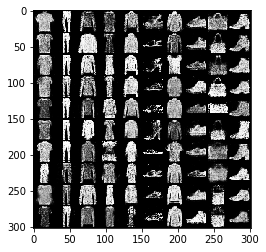

[Epoch 90/100] [Batch 0/600] [D loss: 1.372555] [G loss: 0.726438]
[Epoch 90/100] [Batch 1/600] [D loss: 1.390572] [G loss: 0.768476]
[Epoch 90/100] [Batch 2/600] [D loss: 1.368683] [G loss: 0.747552]
[Epoch 90/100] [Batch 3/600] [D loss: 1.331614] [G loss: 0.735425]
[Epoch 90/100] [Batch 4/600] [D loss: 1.352553] [G loss: 0.712497]
[Epoch 90/100] [Batch 5/600] [D loss: 1.357974] [G loss: 0.757125]
[Epoch 90/100] [Batch 6/600] [D loss: 1.377645] [G loss: 0.763089]
[Epoch 90/100] [Batch 7/600] [D loss: 1.355695] [G loss: 0.713905]
[Epoch 90/100] [Batch 8/600] [D loss: 1.359288] [G loss: 0.729510]
[Epoch 90/100] [Batch 9/600] [D loss: 1.354218] [G loss: 0.711636]
[Epoch 90/100] [Batch 10/600] [D loss: 1.331589] [G loss: 0.736278]
[Epoch 90/100] [Batch 11/600] [D loss: 1.382803] [G loss: 0.704284]
[Epoch 90/100] [Batch 12/600] [D loss: 1.362060] [G loss: 0.713614]
[Epoch 90/100] [Batch 13/600] [D loss: 1.338802] [G loss: 0.697756]
[Epoch 90/100] [Batch 14/600] [D loss: 1.359704] [G loss: 

[Epoch 90/100] [Batch 238/600] [D loss: 1.374696] [G loss: 0.698934]
[Epoch 90/100] [Batch 239/600] [D loss: 1.394095] [G loss: 0.728351]
[Epoch 90/100] [Batch 240/600] [D loss: 1.391173] [G loss: 0.737385]
[Epoch 90/100] [Batch 241/600] [D loss: 1.383888] [G loss: 0.741301]
[Epoch 90/100] [Batch 242/600] [D loss: 1.363825] [G loss: 0.732537]
[Epoch 90/100] [Batch 243/600] [D loss: 1.359327] [G loss: 0.719411]
[Epoch 90/100] [Batch 244/600] [D loss: 1.360087] [G loss: 0.728072]
[Epoch 90/100] [Batch 245/600] [D loss: 1.377650] [G loss: 0.730811]
[Epoch 90/100] [Batch 246/600] [D loss: 1.349138] [G loss: 0.702764]
[Epoch 90/100] [Batch 247/600] [D loss: 1.336063] [G loss: 0.718720]
[Epoch 90/100] [Batch 248/600] [D loss: 1.379907] [G loss: 0.712869]
[Epoch 90/100] [Batch 249/600] [D loss: 1.362141] [G loss: 0.701089]
[Epoch 90/100] [Batch 250/600] [D loss: 1.373711] [G loss: 0.711798]
[Epoch 90/100] [Batch 251/600] [D loss: 1.369969] [G loss: 0.736780]
[Epoch 90/100] [Batch 252/600] [D 

[Epoch 90/100] [Batch 474/600] [D loss: 1.373230] [G loss: 0.754505]
[Epoch 90/100] [Batch 475/600] [D loss: 1.358867] [G loss: 0.742560]
[Epoch 90/100] [Batch 476/600] [D loss: 1.363832] [G loss: 0.717203]
[Epoch 90/100] [Batch 477/600] [D loss: 1.367468] [G loss: 0.720772]
[Epoch 90/100] [Batch 478/600] [D loss: 1.399404] [G loss: 0.706489]
[Epoch 90/100] [Batch 479/600] [D loss: 1.354464] [G loss: 0.707723]
[Epoch 90/100] [Batch 480/600] [D loss: 1.387745] [G loss: 0.689074]
[Epoch 90/100] [Batch 481/600] [D loss: 1.396811] [G loss: 0.723785]
[Epoch 90/100] [Batch 482/600] [D loss: 1.364060] [G loss: 0.747380]
[Epoch 90/100] [Batch 483/600] [D loss: 1.360421] [G loss: 0.707557]
[Epoch 90/100] [Batch 484/600] [D loss: 1.375630] [G loss: 0.724784]
[Epoch 90/100] [Batch 485/600] [D loss: 1.367752] [G loss: 0.744895]
[Epoch 90/100] [Batch 486/600] [D loss: 1.364547] [G loss: 0.753779]
[Epoch 90/100] [Batch 487/600] [D loss: 1.356042] [G loss: 0.711713]
[Epoch 90/100] [Batch 488/600] [D 

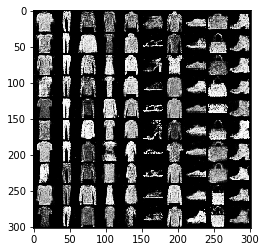

[Epoch 91/100] [Batch 0/600] [D loss: 1.393177] [G loss: 0.734606]
[Epoch 91/100] [Batch 1/600] [D loss: 1.347765] [G loss: 0.721351]
[Epoch 91/100] [Batch 2/600] [D loss: 1.363105] [G loss: 0.712331]
[Epoch 91/100] [Batch 3/600] [D loss: 1.370653] [G loss: 0.731874]
[Epoch 91/100] [Batch 4/600] [D loss: 1.372025] [G loss: 0.716759]
[Epoch 91/100] [Batch 5/600] [D loss: 1.341146] [G loss: 0.737752]
[Epoch 91/100] [Batch 6/600] [D loss: 1.338173] [G loss: 0.724825]
[Epoch 91/100] [Batch 7/600] [D loss: 1.358261] [G loss: 0.743380]
[Epoch 91/100] [Batch 8/600] [D loss: 1.363719] [G loss: 0.749918]
[Epoch 91/100] [Batch 9/600] [D loss: 1.359111] [G loss: 0.745554]
[Epoch 91/100] [Batch 10/600] [D loss: 1.353048] [G loss: 0.695909]
[Epoch 91/100] [Batch 11/600] [D loss: 1.384657] [G loss: 0.719322]
[Epoch 91/100] [Batch 12/600] [D loss: 1.383796] [G loss: 0.755151]
[Epoch 91/100] [Batch 13/600] [D loss: 1.325460] [G loss: 0.740957]
[Epoch 91/100] [Batch 14/600] [D loss: 1.363126] [G loss: 

[Epoch 91/100] [Batch 238/600] [D loss: 1.328548] [G loss: 0.716762]
[Epoch 91/100] [Batch 239/600] [D loss: 1.365444] [G loss: 0.714103]
[Epoch 91/100] [Batch 240/600] [D loss: 1.308788] [G loss: 0.766208]
[Epoch 91/100] [Batch 241/600] [D loss: 1.367035] [G loss: 0.776568]
[Epoch 91/100] [Batch 242/600] [D loss: 1.363205] [G loss: 0.744084]
[Epoch 91/100] [Batch 243/600] [D loss: 1.392489] [G loss: 0.773746]
[Epoch 91/100] [Batch 244/600] [D loss: 1.385188] [G loss: 0.743832]
[Epoch 91/100] [Batch 245/600] [D loss: 1.382361] [G loss: 0.731803]
[Epoch 91/100] [Batch 246/600] [D loss: 1.382665] [G loss: 0.713722]
[Epoch 91/100] [Batch 247/600] [D loss: 1.391335] [G loss: 0.729856]
[Epoch 91/100] [Batch 248/600] [D loss: 1.348808] [G loss: 0.723224]
[Epoch 91/100] [Batch 249/600] [D loss: 1.374200] [G loss: 0.690144]
[Epoch 91/100] [Batch 250/600] [D loss: 1.355184] [G loss: 0.711285]
[Epoch 91/100] [Batch 251/600] [D loss: 1.386551] [G loss: 0.734856]
[Epoch 91/100] [Batch 252/600] [D 

[Epoch 91/100] [Batch 474/600] [D loss: 1.338899] [G loss: 0.709275]
[Epoch 91/100] [Batch 475/600] [D loss: 1.348949] [G loss: 0.731414]
[Epoch 91/100] [Batch 476/600] [D loss: 1.356478] [G loss: 0.730872]
[Epoch 91/100] [Batch 477/600] [D loss: 1.364681] [G loss: 0.733208]
[Epoch 91/100] [Batch 478/600] [D loss: 1.374146] [G loss: 0.721566]
[Epoch 91/100] [Batch 479/600] [D loss: 1.368870] [G loss: 0.722050]
[Epoch 91/100] [Batch 480/600] [D loss: 1.359517] [G loss: 0.732166]
[Epoch 91/100] [Batch 481/600] [D loss: 1.355966] [G loss: 0.704042]
[Epoch 91/100] [Batch 482/600] [D loss: 1.365475] [G loss: 0.738097]
[Epoch 91/100] [Batch 483/600] [D loss: 1.374899] [G loss: 0.726978]
[Epoch 91/100] [Batch 484/600] [D loss: 1.375445] [G loss: 0.718414]
[Epoch 91/100] [Batch 485/600] [D loss: 1.369651] [G loss: 0.726503]
[Epoch 91/100] [Batch 486/600] [D loss: 1.369168] [G loss: 0.749953]
[Epoch 91/100] [Batch 487/600] [D loss: 1.369264] [G loss: 0.731264]
[Epoch 91/100] [Batch 488/600] [D 

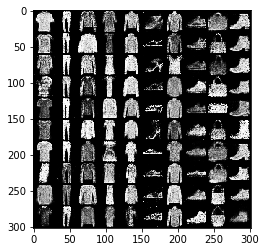

[Epoch 92/100] [Batch 0/600] [D loss: 1.386110] [G loss: 0.735660]
[Epoch 92/100] [Batch 1/600] [D loss: 1.348065] [G loss: 0.733178]
[Epoch 92/100] [Batch 2/600] [D loss: 1.388055] [G loss: 0.733796]
[Epoch 92/100] [Batch 3/600] [D loss: 1.375592] [G loss: 0.760218]
[Epoch 92/100] [Batch 4/600] [D loss: 1.387962] [G loss: 0.744617]
[Epoch 92/100] [Batch 5/600] [D loss: 1.383831] [G loss: 0.732036]
[Epoch 92/100] [Batch 6/600] [D loss: 1.353637] [G loss: 0.703626]
[Epoch 92/100] [Batch 7/600] [D loss: 1.373631] [G loss: 0.678342]
[Epoch 92/100] [Batch 8/600] [D loss: 1.401204] [G loss: 0.658912]
[Epoch 92/100] [Batch 9/600] [D loss: 1.376024] [G loss: 0.710401]
[Epoch 92/100] [Batch 10/600] [D loss: 1.354779] [G loss: 0.752254]
[Epoch 92/100] [Batch 11/600] [D loss: 1.380489] [G loss: 0.722561]
[Epoch 92/100] [Batch 12/600] [D loss: 1.370910] [G loss: 0.745019]
[Epoch 92/100] [Batch 13/600] [D loss: 1.382639] [G loss: 0.719044]
[Epoch 92/100] [Batch 14/600] [D loss: 1.390976] [G loss: 

[Epoch 92/100] [Batch 238/600] [D loss: 1.380053] [G loss: 0.751438]
[Epoch 92/100] [Batch 239/600] [D loss: 1.357338] [G loss: 0.733709]
[Epoch 92/100] [Batch 240/600] [D loss: 1.335101] [G loss: 0.702407]
[Epoch 92/100] [Batch 241/600] [D loss: 1.359082] [G loss: 0.700562]
[Epoch 92/100] [Batch 242/600] [D loss: 1.347712] [G loss: 0.699440]
[Epoch 92/100] [Batch 243/600] [D loss: 1.394717] [G loss: 0.723096]
[Epoch 92/100] [Batch 244/600] [D loss: 1.394349] [G loss: 0.764245]
[Epoch 92/100] [Batch 245/600] [D loss: 1.384587] [G loss: 0.765787]
[Epoch 92/100] [Batch 246/600] [D loss: 1.398081] [G loss: 0.756430]
[Epoch 92/100] [Batch 247/600] [D loss: 1.405864] [G loss: 0.764641]
[Epoch 92/100] [Batch 248/600] [D loss: 1.390774] [G loss: 0.759372]
[Epoch 92/100] [Batch 249/600] [D loss: 1.375786] [G loss: 0.735202]
[Epoch 92/100] [Batch 250/600] [D loss: 1.359789] [G loss: 0.715703]
[Epoch 92/100] [Batch 251/600] [D loss: 1.340220] [G loss: 0.715873]
[Epoch 92/100] [Batch 252/600] [D 

[Epoch 92/100] [Batch 474/600] [D loss: 1.389870] [G loss: 0.734271]
[Epoch 92/100] [Batch 475/600] [D loss: 1.353625] [G loss: 0.737211]
[Epoch 92/100] [Batch 476/600] [D loss: 1.352665] [G loss: 0.699107]
[Epoch 92/100] [Batch 477/600] [D loss: 1.387499] [G loss: 0.704409]
[Epoch 92/100] [Batch 478/600] [D loss: 1.349219] [G loss: 0.708460]
[Epoch 92/100] [Batch 479/600] [D loss: 1.379943] [G loss: 0.733103]
[Epoch 92/100] [Batch 480/600] [D loss: 1.328080] [G loss: 0.726437]
[Epoch 92/100] [Batch 481/600] [D loss: 1.319579] [G loss: 0.698235]
[Epoch 92/100] [Batch 482/600] [D loss: 1.382382] [G loss: 0.723800]
[Epoch 92/100] [Batch 483/600] [D loss: 1.394625] [G loss: 0.688386]
[Epoch 92/100] [Batch 484/600] [D loss: 1.352328] [G loss: 0.731984]
[Epoch 92/100] [Batch 485/600] [D loss: 1.380249] [G loss: 0.738041]
[Epoch 92/100] [Batch 486/600] [D loss: 1.377342] [G loss: 0.712784]
[Epoch 92/100] [Batch 487/600] [D loss: 1.384255] [G loss: 0.718985]
[Epoch 92/100] [Batch 488/600] [D 

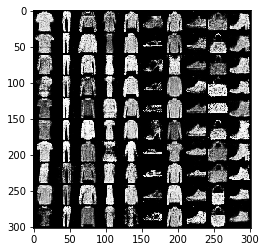

[Epoch 93/100] [Batch 0/600] [D loss: 1.371225] [G loss: 0.736853]
[Epoch 93/100] [Batch 1/600] [D loss: 1.384004] [G loss: 0.770358]
[Epoch 93/100] [Batch 2/600] [D loss: 1.367650] [G loss: 0.764552]
[Epoch 93/100] [Batch 3/600] [D loss: 1.371715] [G loss: 0.742650]
[Epoch 93/100] [Batch 4/600] [D loss: 1.355971] [G loss: 0.740966]
[Epoch 93/100] [Batch 5/600] [D loss: 1.362194] [G loss: 0.732157]
[Epoch 93/100] [Batch 6/600] [D loss: 1.331924] [G loss: 0.759153]
[Epoch 93/100] [Batch 7/600] [D loss: 1.374023] [G loss: 0.741791]
[Epoch 93/100] [Batch 8/600] [D loss: 1.342286] [G loss: 0.731499]
[Epoch 93/100] [Batch 9/600] [D loss: 1.375620] [G loss: 0.752638]
[Epoch 93/100] [Batch 10/600] [D loss: 1.375481] [G loss: 0.779140]
[Epoch 93/100] [Batch 11/600] [D loss: 1.378036] [G loss: 0.758868]
[Epoch 93/100] [Batch 12/600] [D loss: 1.326889] [G loss: 0.670070]
[Epoch 93/100] [Batch 13/600] [D loss: 1.397233] [G loss: 0.734237]
[Epoch 93/100] [Batch 14/600] [D loss: 1.369151] [G loss: 

[Epoch 93/100] [Batch 238/600] [D loss: 1.379291] [G loss: 0.733250]
[Epoch 93/100] [Batch 239/600] [D loss: 1.348492] [G loss: 0.709904]
[Epoch 93/100] [Batch 240/600] [D loss: 1.340477] [G loss: 0.705234]
[Epoch 93/100] [Batch 241/600] [D loss: 1.352188] [G loss: 0.714960]
[Epoch 93/100] [Batch 242/600] [D loss: 1.355509] [G loss: 0.742695]
[Epoch 93/100] [Batch 243/600] [D loss: 1.378987] [G loss: 0.759758]
[Epoch 93/100] [Batch 244/600] [D loss: 1.364778] [G loss: 0.743569]
[Epoch 93/100] [Batch 245/600] [D loss: 1.388684] [G loss: 0.756267]
[Epoch 93/100] [Batch 246/600] [D loss: 1.420563] [G loss: 0.752041]
[Epoch 93/100] [Batch 247/600] [D loss: 1.391342] [G loss: 0.743794]
[Epoch 93/100] [Batch 248/600] [D loss: 1.343159] [G loss: 0.760646]
[Epoch 93/100] [Batch 249/600] [D loss: 1.349421] [G loss: 0.716806]
[Epoch 93/100] [Batch 250/600] [D loss: 1.359242] [G loss: 0.714159]
[Epoch 93/100] [Batch 251/600] [D loss: 1.371587] [G loss: 0.699793]
[Epoch 93/100] [Batch 252/600] [D 

[Epoch 93/100] [Batch 474/600] [D loss: 1.385263] [G loss: 0.718280]
[Epoch 93/100] [Batch 475/600] [D loss: 1.367777] [G loss: 0.743898]
[Epoch 93/100] [Batch 476/600] [D loss: 1.400206] [G loss: 0.796312]
[Epoch 93/100] [Batch 477/600] [D loss: 1.374778] [G loss: 0.746832]
[Epoch 93/100] [Batch 478/600] [D loss: 1.393123] [G loss: 0.738181]
[Epoch 93/100] [Batch 479/600] [D loss: 1.378549] [G loss: 0.756489]
[Epoch 93/100] [Batch 480/600] [D loss: 1.401963] [G loss: 0.765106]
[Epoch 93/100] [Batch 481/600] [D loss: 1.363226] [G loss: 0.763085]
[Epoch 93/100] [Batch 482/600] [D loss: 1.360894] [G loss: 0.722306]
[Epoch 93/100] [Batch 483/600] [D loss: 1.336936] [G loss: 0.725886]
[Epoch 93/100] [Batch 484/600] [D loss: 1.367735] [G loss: 0.714452]
[Epoch 93/100] [Batch 485/600] [D loss: 1.385301] [G loss: 0.730711]
[Epoch 93/100] [Batch 486/600] [D loss: 1.400467] [G loss: 0.744209]
[Epoch 93/100] [Batch 487/600] [D loss: 1.354613] [G loss: 0.735904]
[Epoch 93/100] [Batch 488/600] [D 

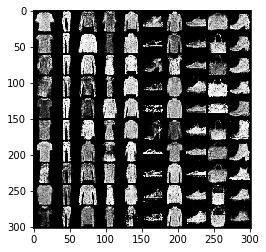

[Epoch 94/100] [Batch 0/600] [D loss: 1.394030] [G loss: 0.753325]
[Epoch 94/100] [Batch 1/600] [D loss: 1.388937] [G loss: 0.754504]
[Epoch 94/100] [Batch 2/600] [D loss: 1.378822] [G loss: 0.761694]
[Epoch 94/100] [Batch 3/600] [D loss: 1.363726] [G loss: 0.720718]
[Epoch 94/100] [Batch 4/600] [D loss: 1.351041] [G loss: 0.730787]
[Epoch 94/100] [Batch 5/600] [D loss: 1.325822] [G loss: 0.721629]
[Epoch 94/100] [Batch 6/600] [D loss: 1.372149] [G loss: 0.657805]
[Epoch 94/100] [Batch 7/600] [D loss: 1.362230] [G loss: 0.718194]
[Epoch 94/100] [Batch 8/600] [D loss: 1.344678] [G loss: 0.740661]
[Epoch 94/100] [Batch 9/600] [D loss: 1.337173] [G loss: 0.706820]
[Epoch 94/100] [Batch 10/600] [D loss: 1.379043] [G loss: 0.737684]
[Epoch 94/100] [Batch 11/600] [D loss: 1.330081] [G loss: 0.781035]
[Epoch 94/100] [Batch 12/600] [D loss: 1.300006] [G loss: 0.753180]
[Epoch 94/100] [Batch 13/600] [D loss: 1.384240] [G loss: 0.719953]
[Epoch 94/100] [Batch 14/600] [D loss: 1.392948] [G loss: 

[Epoch 94/100] [Batch 238/600] [D loss: 1.388408] [G loss: 0.734691]
[Epoch 94/100] [Batch 239/600] [D loss: 1.408476] [G loss: 0.726575]
[Epoch 94/100] [Batch 240/600] [D loss: 1.363405] [G loss: 0.712770]
[Epoch 94/100] [Batch 241/600] [D loss: 1.359235] [G loss: 0.705938]
[Epoch 94/100] [Batch 242/600] [D loss: 1.371340] [G loss: 0.722605]
[Epoch 94/100] [Batch 243/600] [D loss: 1.351427] [G loss: 0.698088]
[Epoch 94/100] [Batch 244/600] [D loss: 1.349560] [G loss: 0.688215]
[Epoch 94/100] [Batch 245/600] [D loss: 1.384625] [G loss: 0.695826]
[Epoch 94/100] [Batch 246/600] [D loss: 1.366137] [G loss: 0.676369]
[Epoch 94/100] [Batch 247/600] [D loss: 1.372117] [G loss: 0.688579]
[Epoch 94/100] [Batch 248/600] [D loss: 1.390296] [G loss: 0.705334]
[Epoch 94/100] [Batch 249/600] [D loss: 1.400210] [G loss: 0.710144]
[Epoch 94/100] [Batch 250/600] [D loss: 1.366920] [G loss: 0.695213]
[Epoch 94/100] [Batch 251/600] [D loss: 1.370323] [G loss: 0.699325]
[Epoch 94/100] [Batch 252/600] [D 

[Epoch 94/100] [Batch 474/600] [D loss: 1.387806] [G loss: 0.723651]
[Epoch 94/100] [Batch 475/600] [D loss: 1.379583] [G loss: 0.733114]
[Epoch 94/100] [Batch 476/600] [D loss: 1.348969] [G loss: 0.726560]
[Epoch 94/100] [Batch 477/600] [D loss: 1.371979] [G loss: 0.732911]
[Epoch 94/100] [Batch 478/600] [D loss: 1.392611] [G loss: 0.729237]
[Epoch 94/100] [Batch 479/600] [D loss: 1.335390] [G loss: 0.755977]
[Epoch 94/100] [Batch 480/600] [D loss: 1.367094] [G loss: 0.756601]
[Epoch 94/100] [Batch 481/600] [D loss: 1.379250] [G loss: 0.740601]
[Epoch 94/100] [Batch 482/600] [D loss: 1.363644] [G loss: 0.725234]
[Epoch 94/100] [Batch 483/600] [D loss: 1.362434] [G loss: 0.722289]
[Epoch 94/100] [Batch 484/600] [D loss: 1.383592] [G loss: 0.732128]
[Epoch 94/100] [Batch 485/600] [D loss: 1.332441] [G loss: 0.747135]
[Epoch 94/100] [Batch 486/600] [D loss: 1.372856] [G loss: 0.728411]
[Epoch 94/100] [Batch 487/600] [D loss: 1.361412] [G loss: 0.735541]
[Epoch 94/100] [Batch 488/600] [D 

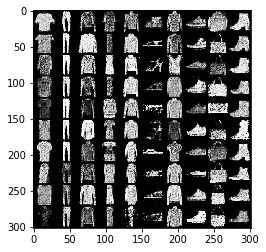

[Epoch 95/100] [Batch 0/600] [D loss: 1.422041] [G loss: 0.736622]
[Epoch 95/100] [Batch 1/600] [D loss: 1.369030] [G loss: 0.747566]
[Epoch 95/100] [Batch 2/600] [D loss: 1.342025] [G loss: 0.742118]
[Epoch 95/100] [Batch 3/600] [D loss: 1.372220] [G loss: 0.726368]
[Epoch 95/100] [Batch 4/600] [D loss: 1.370448] [G loss: 0.699684]
[Epoch 95/100] [Batch 5/600] [D loss: 1.395594] [G loss: 0.735170]
[Epoch 95/100] [Batch 6/600] [D loss: 1.383800] [G loss: 0.763117]
[Epoch 95/100] [Batch 7/600] [D loss: 1.353855] [G loss: 0.733955]
[Epoch 95/100] [Batch 8/600] [D loss: 1.381224] [G loss: 0.736608]
[Epoch 95/100] [Batch 9/600] [D loss: 1.379953] [G loss: 0.722382]
[Epoch 95/100] [Batch 10/600] [D loss: 1.350922] [G loss: 0.721114]
[Epoch 95/100] [Batch 11/600] [D loss: 1.334896] [G loss: 0.747455]
[Epoch 95/100] [Batch 12/600] [D loss: 1.335353] [G loss: 0.706496]
[Epoch 95/100] [Batch 13/600] [D loss: 1.337844] [G loss: 0.716760]
[Epoch 95/100] [Batch 14/600] [D loss: 1.355418] [G loss: 

[Epoch 95/100] [Batch 238/600] [D loss: 1.325407] [G loss: 0.723755]
[Epoch 95/100] [Batch 239/600] [D loss: 1.359161] [G loss: 0.719070]
[Epoch 95/100] [Batch 240/600] [D loss: 1.354173] [G loss: 0.747325]
[Epoch 95/100] [Batch 241/600] [D loss: 1.363624] [G loss: 0.770393]
[Epoch 95/100] [Batch 242/600] [D loss: 1.402804] [G loss: 0.761254]
[Epoch 95/100] [Batch 243/600] [D loss: 1.384030] [G loss: 0.738946]
[Epoch 95/100] [Batch 244/600] [D loss: 1.355336] [G loss: 0.718938]
[Epoch 95/100] [Batch 245/600] [D loss: 1.438723] [G loss: 0.719793]
[Epoch 95/100] [Batch 246/600] [D loss: 1.367498] [G loss: 0.737257]
[Epoch 95/100] [Batch 247/600] [D loss: 1.351842] [G loss: 0.765220]
[Epoch 95/100] [Batch 248/600] [D loss: 1.378933] [G loss: 0.713238]
[Epoch 95/100] [Batch 249/600] [D loss: 1.367847] [G loss: 0.700328]
[Epoch 95/100] [Batch 250/600] [D loss: 1.409057] [G loss: 0.687541]
[Epoch 95/100] [Batch 251/600] [D loss: 1.353132] [G loss: 0.703462]
[Epoch 95/100] [Batch 252/600] [D 

[Epoch 95/100] [Batch 474/600] [D loss: 1.374745] [G loss: 0.716992]
[Epoch 95/100] [Batch 475/600] [D loss: 1.381765] [G loss: 0.734334]
[Epoch 95/100] [Batch 476/600] [D loss: 1.387559] [G loss: 0.754277]
[Epoch 95/100] [Batch 477/600] [D loss: 1.365582] [G loss: 0.730773]
[Epoch 95/100] [Batch 478/600] [D loss: 1.370109] [G loss: 0.734609]
[Epoch 95/100] [Batch 479/600] [D loss: 1.383636] [G loss: 0.748750]
[Epoch 95/100] [Batch 480/600] [D loss: 1.373423] [G loss: 0.758633]
[Epoch 95/100] [Batch 481/600] [D loss: 1.377388] [G loss: 0.756841]
[Epoch 95/100] [Batch 482/600] [D loss: 1.352044] [G loss: 0.737054]
[Epoch 95/100] [Batch 483/600] [D loss: 1.355876] [G loss: 0.711342]
[Epoch 95/100] [Batch 484/600] [D loss: 1.404392] [G loss: 0.706240]
[Epoch 95/100] [Batch 485/600] [D loss: 1.364540] [G loss: 0.712540]
[Epoch 95/100] [Batch 486/600] [D loss: 1.364612] [G loss: 0.731006]
[Epoch 95/100] [Batch 487/600] [D loss: 1.367400] [G loss: 0.702667]
[Epoch 95/100] [Batch 488/600] [D 

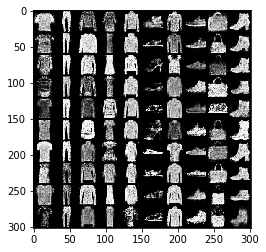

[Epoch 96/100] [Batch 0/600] [D loss: 1.415437] [G loss: 0.744913]
[Epoch 96/100] [Batch 1/600] [D loss: 1.376455] [G loss: 0.719599]
[Epoch 96/100] [Batch 2/600] [D loss: 1.381169] [G loss: 0.740569]
[Epoch 96/100] [Batch 3/600] [D loss: 1.365334] [G loss: 0.733792]
[Epoch 96/100] [Batch 4/600] [D loss: 1.378980] [G loss: 0.722809]
[Epoch 96/100] [Batch 5/600] [D loss: 1.358696] [G loss: 0.715136]
[Epoch 96/100] [Batch 6/600] [D loss: 1.354596] [G loss: 0.710572]
[Epoch 96/100] [Batch 7/600] [D loss: 1.357899] [G loss: 0.742923]
[Epoch 96/100] [Batch 8/600] [D loss: 1.385164] [G loss: 0.751235]
[Epoch 96/100] [Batch 9/600] [D loss: 1.390055] [G loss: 0.757478]
[Epoch 96/100] [Batch 10/600] [D loss: 1.353704] [G loss: 0.739513]
[Epoch 96/100] [Batch 11/600] [D loss: 1.364154] [G loss: 0.732680]
[Epoch 96/100] [Batch 12/600] [D loss: 1.386644] [G loss: 0.702064]
[Epoch 96/100] [Batch 13/600] [D loss: 1.392198] [G loss: 0.713655]
[Epoch 96/100] [Batch 14/600] [D loss: 1.339077] [G loss: 

[Epoch 96/100] [Batch 238/600] [D loss: 1.380416] [G loss: 0.765182]
[Epoch 96/100] [Batch 239/600] [D loss: 1.357244] [G loss: 0.751445]
[Epoch 96/100] [Batch 240/600] [D loss: 1.347141] [G loss: 0.771463]
[Epoch 96/100] [Batch 241/600] [D loss: 1.358254] [G loss: 0.728323]
[Epoch 96/100] [Batch 242/600] [D loss: 1.334579] [G loss: 0.698452]
[Epoch 96/100] [Batch 243/600] [D loss: 1.336569] [G loss: 0.690014]
[Epoch 96/100] [Batch 244/600] [D loss: 1.366157] [G loss: 0.699115]
[Epoch 96/100] [Batch 245/600] [D loss: 1.393769] [G loss: 0.751798]
[Epoch 96/100] [Batch 246/600] [D loss: 1.394416] [G loss: 0.789725]
[Epoch 96/100] [Batch 247/600] [D loss: 1.396553] [G loss: 0.759127]
[Epoch 96/100] [Batch 248/600] [D loss: 1.384829] [G loss: 0.731869]
[Epoch 96/100] [Batch 249/600] [D loss: 1.380475] [G loss: 0.741746]
[Epoch 96/100] [Batch 250/600] [D loss: 1.409870] [G loss: 0.739584]
[Epoch 96/100] [Batch 251/600] [D loss: 1.381159] [G loss: 0.751547]
[Epoch 96/100] [Batch 252/600] [D 

[Epoch 96/100] [Batch 474/600] [D loss: 1.380882] [G loss: 0.718993]
[Epoch 96/100] [Batch 475/600] [D loss: 1.392259] [G loss: 0.705875]
[Epoch 96/100] [Batch 476/600] [D loss: 1.393408] [G loss: 0.761875]
[Epoch 96/100] [Batch 477/600] [D loss: 1.391513] [G loss: 0.756356]
[Epoch 96/100] [Batch 478/600] [D loss: 1.363074] [G loss: 0.741683]
[Epoch 96/100] [Batch 479/600] [D loss: 1.363643] [G loss: 0.719160]
[Epoch 96/100] [Batch 480/600] [D loss: 1.384292] [G loss: 0.712826]
[Epoch 96/100] [Batch 481/600] [D loss: 1.342870] [G loss: 0.723213]
[Epoch 96/100] [Batch 482/600] [D loss: 1.377668] [G loss: 0.748761]
[Epoch 96/100] [Batch 483/600] [D loss: 1.350097] [G loss: 0.713170]
[Epoch 96/100] [Batch 484/600] [D loss: 1.375933] [G loss: 0.752211]
[Epoch 96/100] [Batch 485/600] [D loss: 1.344432] [G loss: 0.773358]
[Epoch 96/100] [Batch 486/600] [D loss: 1.329259] [G loss: 0.742016]
[Epoch 96/100] [Batch 487/600] [D loss: 1.382259] [G loss: 0.771140]
[Epoch 96/100] [Batch 488/600] [D 

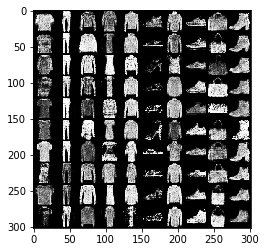

[Epoch 97/100] [Batch 0/600] [D loss: 1.390823] [G loss: 0.715186]
[Epoch 97/100] [Batch 1/600] [D loss: 1.384463] [G loss: 0.700666]
[Epoch 97/100] [Batch 2/600] [D loss: 1.360222] [G loss: 0.702606]
[Epoch 97/100] [Batch 3/600] [D loss: 1.369002] [G loss: 0.738994]
[Epoch 97/100] [Batch 4/600] [D loss: 1.368233] [G loss: 0.744251]
[Epoch 97/100] [Batch 5/600] [D loss: 1.394984] [G loss: 0.705686]
[Epoch 97/100] [Batch 6/600] [D loss: 1.378530] [G loss: 0.705389]
[Epoch 97/100] [Batch 7/600] [D loss: 1.374301] [G loss: 0.711989]
[Epoch 97/100] [Batch 8/600] [D loss: 1.416080] [G loss: 0.722496]
[Epoch 97/100] [Batch 9/600] [D loss: 1.383538] [G loss: 0.717738]
[Epoch 97/100] [Batch 10/600] [D loss: 1.375023] [G loss: 0.705372]
[Epoch 97/100] [Batch 11/600] [D loss: 1.384371] [G loss: 0.700893]
[Epoch 97/100] [Batch 12/600] [D loss: 1.335136] [G loss: 0.716426]
[Epoch 97/100] [Batch 13/600] [D loss: 1.366071] [G loss: 0.716280]
[Epoch 97/100] [Batch 14/600] [D loss: 1.343283] [G loss: 

[Epoch 97/100] [Batch 238/600] [D loss: 1.356756] [G loss: 0.725268]
[Epoch 97/100] [Batch 239/600] [D loss: 1.367714] [G loss: 0.735085]
[Epoch 97/100] [Batch 240/600] [D loss: 1.329452] [G loss: 0.749369]
[Epoch 97/100] [Batch 241/600] [D loss: 1.364831] [G loss: 0.752653]
[Epoch 97/100] [Batch 242/600] [D loss: 1.349945] [G loss: 0.708738]
[Epoch 97/100] [Batch 243/600] [D loss: 1.392364] [G loss: 0.743853]
[Epoch 97/100] [Batch 244/600] [D loss: 1.360491] [G loss: 0.745677]
[Epoch 97/100] [Batch 245/600] [D loss: 1.327602] [G loss: 0.724884]
[Epoch 97/100] [Batch 246/600] [D loss: 1.341696] [G loss: 0.714055]
[Epoch 97/100] [Batch 247/600] [D loss: 1.356424] [G loss: 0.751819]
[Epoch 97/100] [Batch 248/600] [D loss: 1.381050] [G loss: 0.731563]
[Epoch 97/100] [Batch 249/600] [D loss: 1.362276] [G loss: 0.730927]
[Epoch 97/100] [Batch 250/600] [D loss: 1.319395] [G loss: 0.737697]
[Epoch 97/100] [Batch 251/600] [D loss: 1.354060] [G loss: 0.700263]
[Epoch 97/100] [Batch 252/600] [D 

[Epoch 97/100] [Batch 474/600] [D loss: 1.336562] [G loss: 0.709438]
[Epoch 97/100] [Batch 475/600] [D loss: 1.391397] [G loss: 0.736936]
[Epoch 97/100] [Batch 476/600] [D loss: 1.349324] [G loss: 0.725182]
[Epoch 97/100] [Batch 477/600] [D loss: 1.366028] [G loss: 0.771287]
[Epoch 97/100] [Batch 478/600] [D loss: 1.344045] [G loss: 0.757041]
[Epoch 97/100] [Batch 479/600] [D loss: 1.372342] [G loss: 0.758107]
[Epoch 97/100] [Batch 480/600] [D loss: 1.362663] [G loss: 0.735872]
[Epoch 97/100] [Batch 481/600] [D loss: 1.325234] [G loss: 0.725796]
[Epoch 97/100] [Batch 482/600] [D loss: 1.370601] [G loss: 0.704039]
[Epoch 97/100] [Batch 483/600] [D loss: 1.393670] [G loss: 0.749221]
[Epoch 97/100] [Batch 484/600] [D loss: 1.381479] [G loss: 0.744345]
[Epoch 97/100] [Batch 485/600] [D loss: 1.358802] [G loss: 0.752375]
[Epoch 97/100] [Batch 486/600] [D loss: 1.387623] [G loss: 0.708679]
[Epoch 97/100] [Batch 487/600] [D loss: 1.370738] [G loss: 0.712543]
[Epoch 97/100] [Batch 488/600] [D 

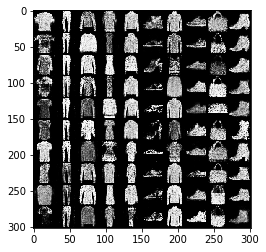

[Epoch 98/100] [Batch 0/600] [D loss: 1.340213] [G loss: 0.705399]
[Epoch 98/100] [Batch 1/600] [D loss: 1.368419] [G loss: 0.743121]
[Epoch 98/100] [Batch 2/600] [D loss: 1.359855] [G loss: 0.715910]
[Epoch 98/100] [Batch 3/600] [D loss: 1.353133] [G loss: 0.753679]
[Epoch 98/100] [Batch 4/600] [D loss: 1.347475] [G loss: 0.725304]
[Epoch 98/100] [Batch 5/600] [D loss: 1.375925] [G loss: 0.739117]
[Epoch 98/100] [Batch 6/600] [D loss: 1.366343] [G loss: 0.754335]
[Epoch 98/100] [Batch 7/600] [D loss: 1.381989] [G loss: 0.710557]
[Epoch 98/100] [Batch 8/600] [D loss: 1.386237] [G loss: 0.720784]
[Epoch 98/100] [Batch 9/600] [D loss: 1.403578] [G loss: 0.724736]
[Epoch 98/100] [Batch 10/600] [D loss: 1.389882] [G loss: 0.741491]
[Epoch 98/100] [Batch 11/600] [D loss: 1.368027] [G loss: 0.742866]
[Epoch 98/100] [Batch 12/600] [D loss: 1.374374] [G loss: 0.748962]
[Epoch 98/100] [Batch 13/600] [D loss: 1.406484] [G loss: 0.703809]
[Epoch 98/100] [Batch 14/600] [D loss: 1.369591] [G loss: 

[Epoch 98/100] [Batch 238/600] [D loss: 1.385435] [G loss: 0.728579]
[Epoch 98/100] [Batch 239/600] [D loss: 1.357836] [G loss: 0.744395]
[Epoch 98/100] [Batch 240/600] [D loss: 1.344212] [G loss: 0.700330]
[Epoch 98/100] [Batch 241/600] [D loss: 1.342679] [G loss: 0.676519]
[Epoch 98/100] [Batch 242/600] [D loss: 1.376854] [G loss: 0.713812]
[Epoch 98/100] [Batch 243/600] [D loss: 1.396950] [G loss: 0.694505]
[Epoch 98/100] [Batch 244/600] [D loss: 1.382696] [G loss: 0.714535]
[Epoch 98/100] [Batch 245/600] [D loss: 1.411469] [G loss: 0.752879]
[Epoch 98/100] [Batch 246/600] [D loss: 1.380214] [G loss: 0.748101]
[Epoch 98/100] [Batch 247/600] [D loss: 1.402596] [G loss: 0.774610]
[Epoch 98/100] [Batch 248/600] [D loss: 1.384948] [G loss: 0.756138]
[Epoch 98/100] [Batch 249/600] [D loss: 1.376954] [G loss: 0.761679]
[Epoch 98/100] [Batch 250/600] [D loss: 1.372046] [G loss: 0.697959]
[Epoch 98/100] [Batch 251/600] [D loss: 1.373945] [G loss: 0.712170]
[Epoch 98/100] [Batch 252/600] [D 

[Epoch 98/100] [Batch 474/600] [D loss: 1.367212] [G loss: 0.783341]
[Epoch 98/100] [Batch 475/600] [D loss: 1.351752] [G loss: 0.749211]
[Epoch 98/100] [Batch 476/600] [D loss: 1.333360] [G loss: 0.716047]
[Epoch 98/100] [Batch 477/600] [D loss: 1.363119] [G loss: 0.697350]
[Epoch 98/100] [Batch 478/600] [D loss: 1.371119] [G loss: 0.729145]
[Epoch 98/100] [Batch 479/600] [D loss: 1.368748] [G loss: 0.723203]
[Epoch 98/100] [Batch 480/600] [D loss: 1.382342] [G loss: 0.697365]
[Epoch 98/100] [Batch 481/600] [D loss: 1.391093] [G loss: 0.742026]
[Epoch 98/100] [Batch 482/600] [D loss: 1.361180] [G loss: 0.748660]
[Epoch 98/100] [Batch 483/600] [D loss: 1.378393] [G loss: 0.786059]
[Epoch 98/100] [Batch 484/600] [D loss: 1.361257] [G loss: 0.740156]
[Epoch 98/100] [Batch 485/600] [D loss: 1.397406] [G loss: 0.718527]
[Epoch 98/100] [Batch 486/600] [D loss: 1.370545] [G loss: 0.727906]
[Epoch 98/100] [Batch 487/600] [D loss: 1.397210] [G loss: 0.747011]
[Epoch 98/100] [Batch 488/600] [D 

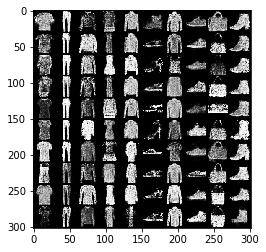

[Epoch 99/100] [Batch 0/600] [D loss: 1.390434] [G loss: 0.706653]
[Epoch 99/100] [Batch 1/600] [D loss: 1.391611] [G loss: 0.708734]
[Epoch 99/100] [Batch 2/600] [D loss: 1.377700] [G loss: 0.728490]
[Epoch 99/100] [Batch 3/600] [D loss: 1.405403] [G loss: 0.699095]
[Epoch 99/100] [Batch 4/600] [D loss: 1.404452] [G loss: 0.734851]
[Epoch 99/100] [Batch 5/600] [D loss: 1.373216] [G loss: 0.726917]
[Epoch 99/100] [Batch 6/600] [D loss: 1.390926] [G loss: 0.736792]
[Epoch 99/100] [Batch 7/600] [D loss: 1.389979] [G loss: 0.734862]
[Epoch 99/100] [Batch 8/600] [D loss: 1.346991] [G loss: 0.729250]
[Epoch 99/100] [Batch 9/600] [D loss: 1.373922] [G loss: 0.725953]
[Epoch 99/100] [Batch 10/600] [D loss: 1.348888] [G loss: 0.725709]
[Epoch 99/100] [Batch 11/600] [D loss: 1.375875] [G loss: 0.741155]
[Epoch 99/100] [Batch 12/600] [D loss: 1.334708] [G loss: 0.719207]
[Epoch 99/100] [Batch 13/600] [D loss: 1.349513] [G loss: 0.723282]
[Epoch 99/100] [Batch 14/600] [D loss: 1.377086] [G loss: 

[Epoch 99/100] [Batch 238/600] [D loss: 1.355953] [G loss: 0.714631]
[Epoch 99/100] [Batch 239/600] [D loss: 1.348719] [G loss: 0.746908]
[Epoch 99/100] [Batch 240/600] [D loss: 1.361474] [G loss: 0.744737]
[Epoch 99/100] [Batch 241/600] [D loss: 1.368293] [G loss: 0.714655]
[Epoch 99/100] [Batch 242/600] [D loss: 1.353448] [G loss: 0.722408]
[Epoch 99/100] [Batch 243/600] [D loss: 1.366922] [G loss: 0.716733]
[Epoch 99/100] [Batch 244/600] [D loss: 1.390898] [G loss: 0.710821]
[Epoch 99/100] [Batch 245/600] [D loss: 1.379115] [G loss: 0.767338]
[Epoch 99/100] [Batch 246/600] [D loss: 1.351233] [G loss: 0.763242]
[Epoch 99/100] [Batch 247/600] [D loss: 1.369507] [G loss: 0.745465]
[Epoch 99/100] [Batch 248/600] [D loss: 1.395563] [G loss: 0.743742]
[Epoch 99/100] [Batch 249/600] [D loss: 1.376147] [G loss: 0.749399]
[Epoch 99/100] [Batch 250/600] [D loss: 1.393446] [G loss: 0.729699]
[Epoch 99/100] [Batch 251/600] [D loss: 1.395001] [G loss: 0.743916]
[Epoch 99/100] [Batch 252/600] [D 

[Epoch 99/100] [Batch 474/600] [D loss: 1.407032] [G loss: 0.791816]
[Epoch 99/100] [Batch 475/600] [D loss: 1.360322] [G loss: 0.718815]
[Epoch 99/100] [Batch 476/600] [D loss: 1.371355] [G loss: 0.719490]
[Epoch 99/100] [Batch 477/600] [D loss: 1.372430] [G loss: 0.730717]
[Epoch 99/100] [Batch 478/600] [D loss: 1.367033] [G loss: 0.712139]
[Epoch 99/100] [Batch 479/600] [D loss: 1.355116] [G loss: 0.731343]
[Epoch 99/100] [Batch 480/600] [D loss: 1.382045] [G loss: 0.736636]
[Epoch 99/100] [Batch 481/600] [D loss: 1.378841] [G loss: 0.752391]
[Epoch 99/100] [Batch 482/600] [D loss: 1.388180] [G loss: 0.739511]
[Epoch 99/100] [Batch 483/600] [D loss: 1.348112] [G loss: 0.754665]
[Epoch 99/100] [Batch 484/600] [D loss: 1.384514] [G loss: 0.720920]
[Epoch 99/100] [Batch 485/600] [D loss: 1.393049] [G loss: 0.703720]
[Epoch 99/100] [Batch 486/600] [D loss: 1.370893] [G loss: 0.751515]
[Epoch 99/100] [Batch 487/600] [D loss: 1.348155] [G loss: 0.744189]
[Epoch 99/100] [Batch 488/600] [D 

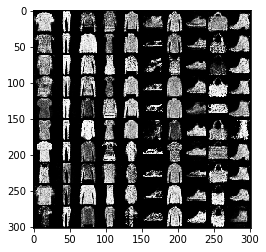

In [10]:
#用于生成效果图
# 生成100个one_hot向量，每类10个
fixed_c = torch.FloatTensor(100, 10).zero_()
fixed_c = fixed_c.scatter_(dim=1, index=torch.LongTensor(np.array(np.arange(0, 10).tolist()*10).reshape([100, 1])), value=1)
fixed_c = fixed_c.to(device)
# 生成100个随机噪声向量
fixed_z = torch.randn([100, z_dim]).to(device)

# 开始训练，一共训练total_epochs
for epoch in range(total_epochs):

    # 在训练阶段，把生成器设置为训练模式；对应于后面的，在测试阶段，把生成器设置为测试模式
    generator = generator.train()

    # 训练一个epoch
    for i, data in enumerate(dataloader):

        # 加载真实数据
        img, label = data

        # 把对应的标签转化成 one-hot 类型
        label = one_hot(label, 10)

        # 生成数据
        # 用正态分布中采样batch_size个随机噪声
        z = torch.randn([batch_size, z_dim]).to(device)
        # 生成 batch_size 个 one-hot 标签
        c = torch.FloatTensor(batch_size, 10).zero_()
        c = c.scatter_(dim=1, index=torch.LongTensor(np.array(np.arange(0, 10).tolist() * 10).reshape([batch_size, 1])), value=1)
        c = c.to(device)
        # 生成数据

        #your code
        fake_img = generator(z, c)

        # 计算判别器损失，并优化判别器
        real_prob = discriminator(img, label)
        real_loss = bce(real_prob, ones)

        fake_prob = discriminator(fake_img, c)
        fake_loss = bce(fake_prob, zeros)

        d_optimizer.zero_grad()
        d_loss = real_loss + fake_loss
        d_loss.backward()
        d_optimizer.step()

        # 计算生成器损失，并优化生成器
        g_optimizer.zero_grad()
        z = torch.randn(batch_size, z_dim)
        c = torch.LongTensor(np.random.randint(0, 10, batch_size))
        c = one_hot(c, 10)
        fake_img = generator(z, c)
        prob = discriminator(fake_img, c)
        g_loss = bce(prob, torch.ones(batch_size))
        g_loss.backward()
        g_optimizer.step()

        # 输出损失
        print("[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]" % (epoch, total_epochs, i, len(dataloader), d_loss.item(), g_loss.item()))

    # 把生成器设置为测试模型，生成效果图并保存
    generator = generator.eval()
    fixed_fake_images = generator(fixed_z, fixed_c)
    grid = make_grid(fixed_fake_images.unsqueeze(1).data, nrow=10, normalize=True).permute(1, 2, 0).numpy()
    plt.imshow(grid)
    plt.show()
    save_image(fixed_fake_images, 'cgan_images/{}.png'.format(epoch), nrow=10, normalize=True)
